# Importing

In [2]:
import librosa as lb
import scipy.io.wavfile
import numpy as np
from numpy import newaxis
import os
from pathlib import Path
import pandas as pd
import csv
import matplotlib.pyplot as plt
from scipy.fftpack import dct
import librosa as lb
import IPython.display as ipd
import librosa.display
import math
import glob 

# Def functions

In [3]:
def zcr(x, fs, window_duration, move_duration):
    
    # window duration : int(20 * fs /1000) # 20ms
    # number of sample in window : fs * window duration
    fl = int(window_duration * fs / 1000)
    hl = int(move_duration * fs / 1000)
    return lb.feature.zero_crossing_rate(x, frame_length = fl, hop_length = hl)
def stpe(x, fs, window_duration, move_duration):
    
    # window duration : int(20 * fs /1000) # 20ms
    # number of sample in window : fs * window duration
    fl = int(window_duration * fs / 1000)
    hl = int(move_duration * fs / 1000)
        
    return librosa.feature.rmse(x, frame_length=fl, hop_length=hl)

def getboundaries(frame_idxs):
    start_idxs = [frame_idxs[0]]
    end_idxs = []

    shapeofidxs = np.shape(frame_idxs)
    for i in range(shapeofidxs[0]-1):
        if (frame_idxs[i + 1] - frame_idxs[i]) != 1:
            end_idxs.append(frame_idxs[i])
            start_idxs.append(frame_idxs[i+1])

    end_idxs.append(frame_idxs[-1])
    # del the last boundaries if it is both start point and end point.
    if end_idxs[-1] == start_idxs[-1]:
        end_idxs.pop()
        start_idxs.pop()
    assert len(start_idxs) == len(end_idxs), 'Error! Num of start_idxs doesnt match Num of end_idxs.'
    start_idxs = np.array(start_idxs)
    end_idxs = np.array(end_idxs)
    start_t = start_idxs * int(16*sr/1000) / sr
    end_t = end_idxs * int(16*sr/1000) / sr
    return start_t, end_t


# File path 

In [4]:
#path_dir = '//166.104.82.105/db_과학수사/12_2차년도_raw_불량'
#path_dir='//166.104.82.105/db_과학수사/11_2차년도_raw'
path_dir='//166.104.82.105/db_과학수사'

#path_dir='C:/Users/yeongmyeong/Desktop/스팀'
file_path=[]
wav_path=[]

for dirName, subdirList, fileList in os.walk(path_dir):
    rootpath = os.path.join(os.path.abspath(path_dir), dirName)
    #print(rootpath)
    
    for file in fileList:  
        if file == '_labels.csv':
            #file_path.append(rootpath)
            a = os.path.join(rootpath,'*.wav')
            for filename in glob.glob(a):
                if filename[-15:] == 'DAY2_audio1.wav':
                    file_path.append(rootpath)
                    wav_path.append(filename)
                    print(filename)

//166.104.82.105/db_과학수사\11_2차년도_raw\20180607_LGY\180612_LGY_DAY2\2018-06-12 오후 2-26-32_180612_LGY_DAY2_audio1.wav
//166.104.82.105/db_과학수사\11_2차년도_raw\20180612_JYK\180614_JYK_DAY2\2018-06-14 오후 2-06-20_180614_JYK_DAY2_audio1.wav
//166.104.82.105/db_과학수사\11_2차년도_raw\20180615_KMR\180618_KMR_DAY2\2018-06-18 오전 10-17-46_180618_KMR_DAY2_audio1.wav
//166.104.82.105/db_과학수사\11_2차년도_raw\20180619_CHI\180620_CHI_DAY2\2018-06-20 오후 4-34-08_180620_CHI_DAY2_audio1.wav
//166.104.82.105/db_과학수사\11_2차년도_raw\20180619_MGE\180620_MGE_DAY2\2018-06-20 오전 10-33-23_180620_MGE_DAY2_audio1.wav
//166.104.82.105/db_과학수사\11_2차년도_raw\20180620_KKA\180625_KKA_DAY2\2018-06-25 오전 9-32-53_180625_KKA_DAY2_audio1.wav
//166.104.82.105/db_과학수사\11_2차년도_raw\20180625_SSS\180627_SSS_DAY2\2018-06-27 오후 3-43-31_180627_SSS_DAY2_audio1.wav
//166.104.82.105/db_과학수사\11_2차년도_raw\20180626_LNY\180627_LNY_DAY2\2018-06-27 오후 2-01-55_180627_LNY_DAY2_audio1.wav
//166.104.82.105/db_과학수사\11_2차년도_raw\20180628_SYW\180629_SYW_DAY2\2018-06-29 오

//166.104.82.105/db_과학수사\12_2차년도_raw_불량\20180824_KMK\180903_KMK_DAY2\2018-09-03 오전 9-50-28_180903_KMK_DAY2_audio1.wav
//166.104.82.105/db_과학수사\12_2차년도_raw_불량\20180827_KMJ\180903_KMJ_DAY2\2018-09-03 오후 4-05-20_180903_KMJ_DAY2_audio1.wav
//166.104.82.105/db_과학수사\12_2차년도_raw_불량\20180831_BJH\180907_BJH_DAY2\2018-09-07 오후 4-00-21_180907_BJH_DAY2_audio1.wav
//166.104.82.105/db_과학수사\12_2차년도_raw_불량\20180907_KBJ\180914_KBJ_DAY2\2018-09-14 오전 9-36-44_180914_KBJ_DAY2_audio1.wav
//166.104.82.105/db_과학수사\12_2차년도_raw_불량\20180910_MHS\180917_MHS_DAY2\2018-09-17 오후 3-52-23_180917_MHS_DAY2_audio1.wav
//166.104.82.105/db_과학수사\12_2차년도_raw_불량\20180912_SKH\180919_SKH_DAY2\2018-09-19 오전 10-30-44_180919_SKH_DAY2_audio1.wav
//166.104.82.105/db_과학수사\12_2차년도_raw_불량\20180716_BIH\180718_BIH_DAY2\2018-07-18 오전 10-02-39_180718_BIH_DAY2_audio1.wav
//166.104.82.105/db_과학수사\12_2차년도_raw_불량\20180801_SYH\180802_SYH_DAY2\2018-08-02 오후 2-05-59_180802_SYH_DAY2_audio1.wav
//166.104.82.105/db_과학수사\12_2차년도_raw_불량\20180711_KJE\1

In [5]:
sub_names=[]
for i in range(len(file_path)):
    sub_name = file_path[i]
    #print(sub_name)
    sub_name_1= sub_name[-15:-5]
    if sub_name_1[0] == 1:
        sub_name = sub_name[-17:-7]
        print(sub_name)
    else:
        sub_name=sub_name[-15:-5]
        print(sub_name)
    sub_names.append(sub_name)

180612_LGY
180614_JYK
180618_KMR
180620_CHI
180620_MGE
180625_KKA
180627_SSS
180627_LNY
180629_SYW
180629_PHJ
180918_PMJ
181120_JYE
181121_KDD
181121_HHJ
181127_WJM
180712_KSH
180712_KKA
181109_KSY
181109_SYE
181129_KHS
181022_KHS
181204_SSJ
180719_LMW
181123_SJY
181204_JYY
181024_SHS
181114_KSY
181123_LYI
181206_KHJ
180921_LSK
181031_LEH
181108_KYR
181113_HSH
180813_LYH
180810_LHS
180810_EMJ
181119_SHJ
180816_YIO
180817_LNS
181121_LYH
180823_YES
180903_LBS
180823_KSM
181115_JSJ
180927_SJY
181026_SYL
\181031_LH
\181126_CS
180906_JAR
180921_KYN
180831_LYJ
180914_KYH
180912_SMY
180919_IAR
180919_LEH
181016_KTK
180912_KYR
181116_KJS
181018_LJH
181102_KJC
181105_KSH
181113_HEJ
181129_YJS
181026_JMA
181022_SSH
181025_YMN
181030_SCE
181107_KSH
181115_JYJ
181127_CHS
181015_LJM
180605_CJO
180817_PJH
0618_BKJ_D
180820_LGH
181002_JHG
180821_JYS
180822_JHC
180903_KMK
180903_KMJ
180907_BJH
180914_KBJ
180917_MHS
180919_SKH
180718_BIH
180802_SYH
180713_KJE
180710_KYS
180717_KES
180717_OCW
180717_BJS

In [6]:
len(file_path)

124

# Data_split

In [17]:
for i in range(len(file_path)):
    timelog_path = os.path.join(file_path[i],'_labels.csv')
    timelog = pd.read_csv(timelog_path, engine='python')
    
    test_type = timelog[" Stim/Main"]
    answer_type = timelog[" C/O "]
    answer = timelog[" T/F"]
    
    start_time = timelog[" Q_end/A_start"]
    end_time = timelog[" A_end"]
    
    save_path_audio = os.path.join("F:/",sub_names[i],"Raw_cropped")
    try:
        if not(os.path.isdir(save_path_audio)):
            os.makedirs(save_path_audio)    

    except OSError as e:
        #if e.errno != errno.EEXIST:
        print("Failed to create directory!!!!!")
        raise   
    
    wavfile_path = os.path.join(file_path[i], wav_path[i])
    
    name_tmp = file_path[i]
    name = name_tmp[-15:-5]
    
    #print(wavfile_path)
    [sr, y] = scipy.io.wavfile.read(wavfile_path)
        
    for j in range(len(answer)):
        
        a=start_time[j]
        s_hours = int(a[1:3]) 
        s_minutes = int(a[4:6])
        s_seconds = float(a[7:12])
        start_seconds = int(s_hours * 3600 + s_minutes *60 +s_seconds)
        #print(start_seconds)
        
        b=end_time[j]
        e_hours = int(b[1:3]) 
        e_minutes = int(b[4:6])
        e_seconds = float(b[7:12])
        end_seconds = int(e_hours * 3600 + e_minutes *60 +e_seconds)
        #print(end_seconds)
        
        start_samples = start_seconds*44100+22050
        end_samples = end_seconds*44100
        
        split_data = y[start_samples:end_samples]
        
        a_t = answer_type[j]
        A = answer[j]
        
        #print('split : ',j)
        if test_type[j] == " T":
            #print('T : ', j)
            save_path_Stim = os.path.join("F:/main_test",sub_names[i],"Raw_cropped","Close-ended")
            try:
                if not(os.path.isdir(save_path_Stim)):
                    os.makedirs(save_path_Stim)
            except OSError as e:
            #    if e.errno != errno.EEXIST:
                print("Failed to create directory!!!!!")
                raise
                
            #scipy.io.wavfile.write('{}/{}_{}_{}_{}.wav'.format(save_path_Stim,name,a_t[1:2],j+1,A[1:2]),sr, split_data)
            scipy.io.wavfile.write("F:/main_total/{}_{}_{}_{}.wav".format(name,a_t[1:2],j+1,A[1:2]),sr, split_data)
            
        if test_type[j] == " M":
            save_path_Main = os.path.join("F:/main_test",sub_names[i],"Raw_cropped","Main")
            try:
                if not(os.path.isdir(save_path_Main)):
                    os.makedirs(save_path_Main)
            except OSError as e:
                #if e.errno != errno.EEXIST:
                print("Failed to create directory!!!!!")
                raise
            
            if a_t[1:2] == "C":
                save_path_C = os.path.join("F:/main_test",sub_names[i],"Raw_cropped","Main","Close-ended")
                try:
                    if not(os.path.isdir(save_path_C)):
                        os.makedirs(save_path_C)
                except OSError as e:
                #    if e.errno != errno.EEXIST:
                    print("Failed to create directory!!!!!")
                    raise
                #scipy.io.wavfile.write('{}/{}_{}_{}.wav'.format(save_path_C,sub_names[i],j+1,A[1:2]), sr, split_data)                
                scipy.io.wavfile.write("F:/main_total/{}_{}_{}_{}.wav".format(name,a_t[1:2],j+1,A[1:2]),sr, split_data)

            
            if a_t[1:2] == "O":
                save_path_O = os.path.join("F:/main_test",sub_names[i],"Raw_cropped","Main","Open-ended")
                try:
                    if not(os.path.isdir(save_path_O)):
                        os.makedirs(save_path_O)
                except OSError as e:
                #    if e.errno != errno.EEXIST:
                    print("Failed to create directory!!!!!")
                    raise
        
                scipy.io.wavfile.write('{}/{}_{}_{}_{}.wav'.format(save_path_O,name,a_t[1:2],j+1,A[1:2]), sr, split_data)
        #scipy.io.wavfile.write('wav_voiced_{}'.format(file), rate=sr, data=y[start_sample:end_sample])
        
        ###librosa.output.write_wav('C:/Users/yeongmyeong/Desktop/vad_data/{}/wav_voiced_{}'.format(file[13:16],file), y, sr, norm=False)
        
        #librosa.output.write_wav('//166.104.82.105/db_과학수사/11_2차년도_raw/audio_cropped/close_ended/wav_voiced/wav_voiced_{}'.format(file[:],file), y, sr, norm=False)    


# VAD

In [8]:
len(sub_names)
sub_names

['180612_LGY',
 '180614_JYK',
 '180618_KMR',
 '180620_CHI',
 '180620_MGE',
 '180625_KKA',
 '180627_SSS',
 '180627_LNY',
 '180629_SYW',
 '180629_PHJ',
 '180918_PMJ',
 '181120_JYE',
 '181121_KDD',
 '181121_HHJ',
 '181127_WJM',
 '180712_KSH',
 '180712_KKA',
 '181109_KSY',
 '181109_SYE',
 '181129_KHS',
 '181022_KHS',
 '181204_SSJ',
 '180719_LMW',
 '181123_SJY',
 '181204_JYY',
 '181024_SHS',
 '181114_KSY',
 '181123_LYI',
 '181206_KHJ',
 '180921_LSK',
 '181031_LEH',
 '181108_KYR',
 '181113_HSH',
 '180813_LYH',
 '180810_LHS',
 '180810_EMJ',
 '181119_SHJ',
 '180816_YIO',
 '180817_LNS',
 '181121_LYH',
 '180823_YES',
 '180903_LBS',
 '180823_KSM',
 '181115_JSJ',
 '180927_SJY',
 '181026_SYL',
 '\\181031_LH',
 '\\181126_CS',
 '180906_JAR',
 '180921_KYN',
 '180831_LYJ',
 '180914_KYH',
 '180912_SMY',
 '180919_IAR',
 '180919_LEH',
 '181016_KTK',
 '180912_KYR',
 '181116_KJS',
 '181018_LJH',
 '181102_KJC',
 '181105_KSH',
 '181113_HEJ',
 '181129_YJS',
 '181026_JMA',
 '181022_SSH',
 '181025_YMN',
 '181030

offset_time=[]
onset_time=[]
start_sample_appended=[]
w=[]
for q in range(len(sub_names)):
    
    c_path = os.path.join("F:/main_test",str(sub_names[q]),"Raw_cropped","Main","Close-ended")

    for dirName, subirList, fileList in os.walk(c_path):
        rootpath = os.path.join(os.path.abspath(c_path), dirName)
        
        for file in fileList:
            
            filepath = os.path.join(rootpath, file)
            print(filepath)
            y,sr = lb.load(filepath)
        
        
            _zcr = zcr(y, sr, 32, 16)
            _stpe = stpe(y, sr, 32, 16)
        
            frame_idxs = np.where( (_stpe > 0.01) | (_zcr > 0.2) )[1]
        
            start_t, end_t = getboundaries(frame_idxs)        
            
            #print(start_t)
            #print(end_t)
            
            
            length_tmp=[]
            length=[]
            
            for k in range(0,len(start_t)):
                
                length_tmp = end_t[k]-start_t[k]
                length.append(length_tmp)
            i=length.index(max(length))
            start_t = start_t[i]
            end_t = end_t[i]
            
            # plot
            plt.figure(figsize=(12, 4))
            t = np.linspace(0, len(y)/sr, len(y))
            plt.plot(t, y, label='Waveform')
            plt.axvline(x=start_t, color='#d62728') # red vertical line
            plt.axvline(x=end_t, color='#2ca02c') # green vertical line
            plt.legend(loc='best')
            plt.show()
        
        
        
            start_sample = start_t*22050-2205
            end_sample = end_t*22050+4410
            start_sample = math.floor(start_sample)
            end_sample = math.ceil(end_sample)
        
            y = y[start_sample:end_sample]
            #scipy.io.wavfile.write('wav_voiced_{}'.format(file), rate=sr, data=y[start_sample:end_sample])
            
            #save_path_Close = os.path.join("F:/",str(sub_names[q]),"wav_voiced","Close_ended")
            save_path_Close = 'F:/pilot_vad_main/{}'.format(file[:-9])
                                           

                
            scipy.io.wavfile.write('{}/{}'.format(save_path_Close,file),sr, y)
            w.append(file)        

F:/main_total\180620_MGE_C_19_T.wav


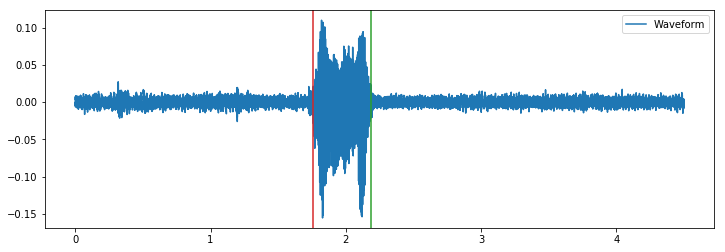

F:/main_total\180620_MGE_C_20_T.wav


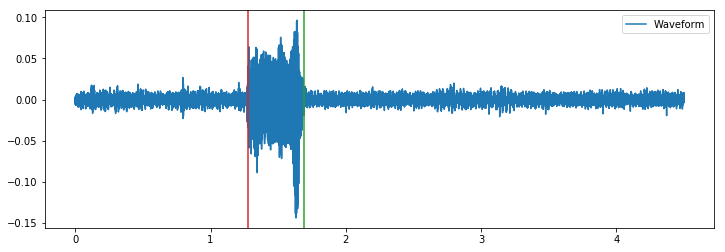

F:/main_total\180620_MGE_C_21_T.wav


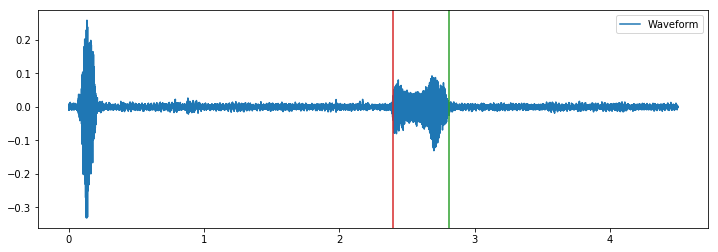

F:/main_total\180620_MGE_C_22_T.wav


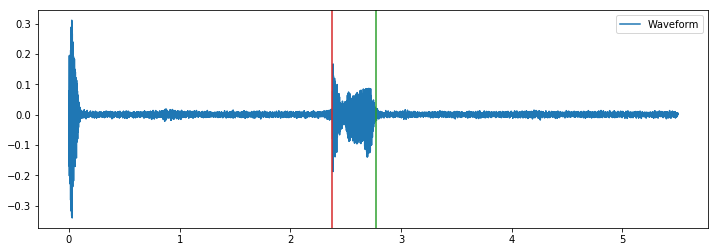

F:/main_total\180620_MGE_C_28_T.wav


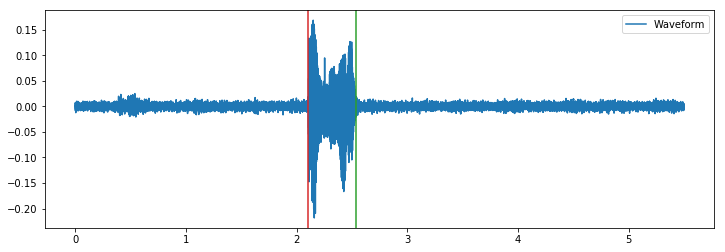

F:/main_total\180620_MGE_C_29_T.wav


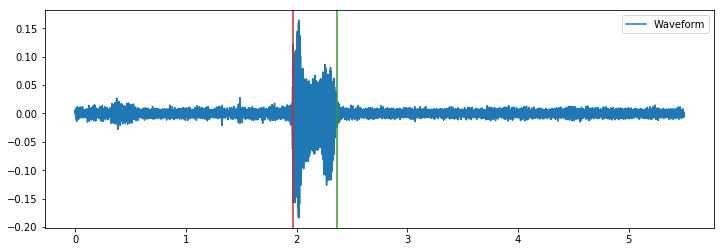

F:/main_total\180620_MGE_C_30_T.wav


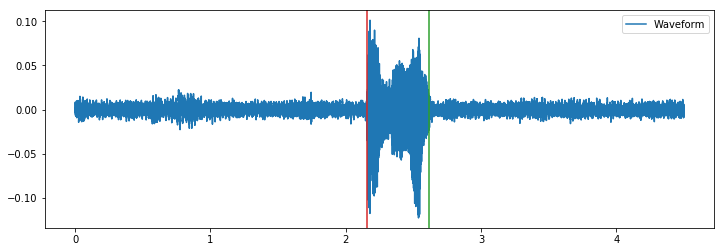

F:/main_total\180620_MGE_C_31_T.wav


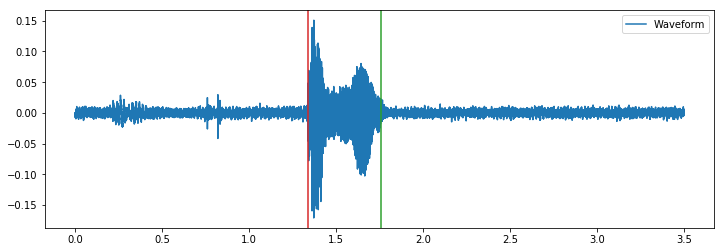

F:/main_total\180620_MGE_C_32_T.wav


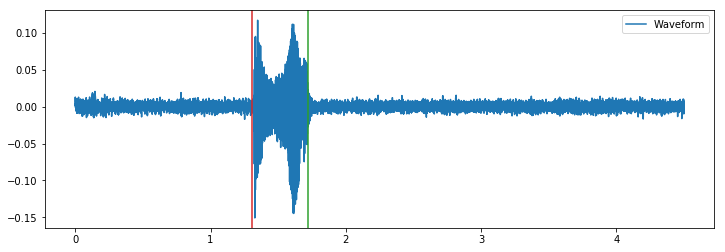

F:/main_total\180620_MGE_C_33_T.wav


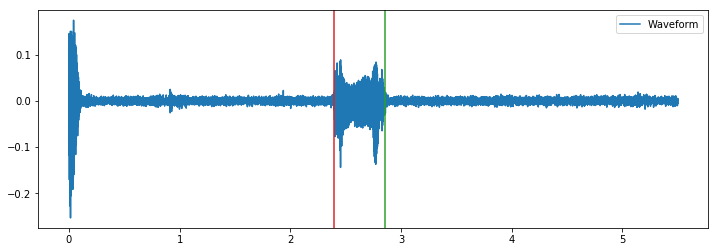

F:/main_total\180620_MGE_C_34_T.wav


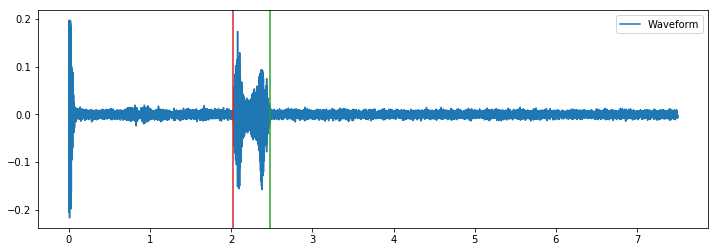

F:/main_total\180620_MGE_C_35_T.wav


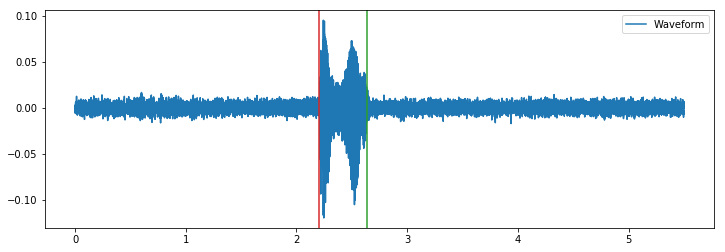

F:/main_total\180620_MGE_C_36_T.wav


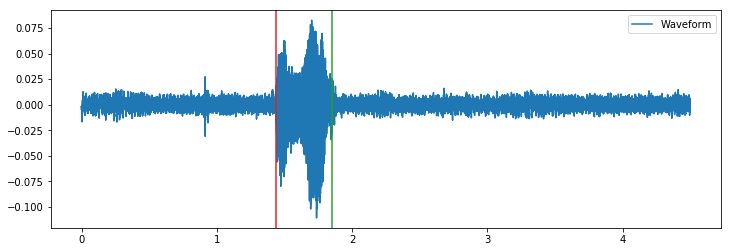

F:/main_total\180620_MGE_C_37_T.wav


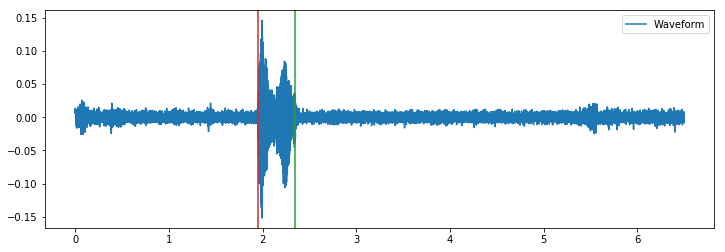

F:/main_total\180620_MGE_C_43_F.wav


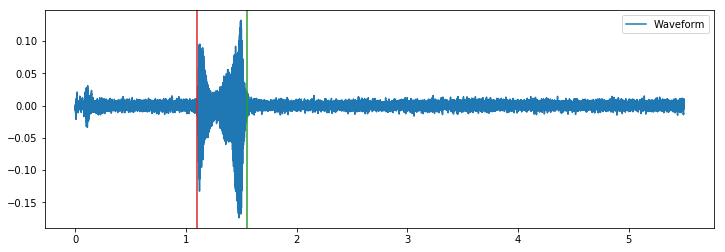

F:/main_total\180620_MGE_C_44_F.wav


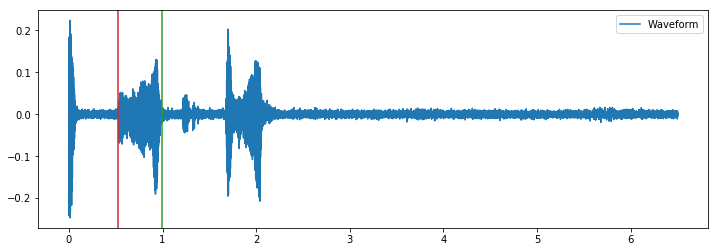

F:/main_total\180620_MGE_C_45_F.wav


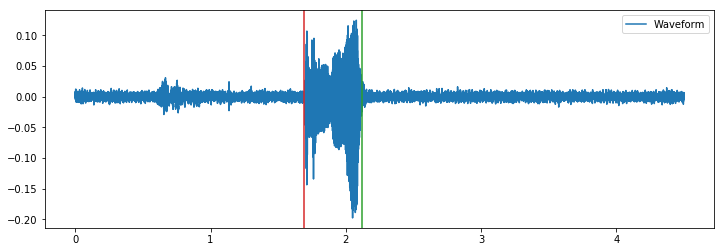

F:/main_total\180620_MGE_C_46_F.wav


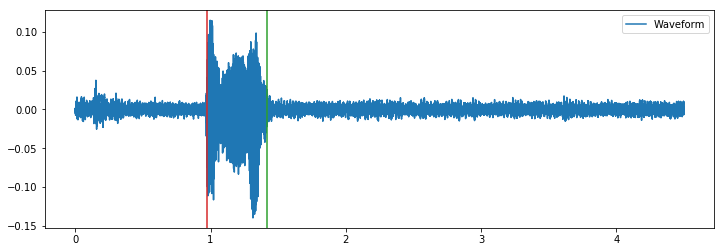

F:/main_total\180620_MGE_C_47_F.wav


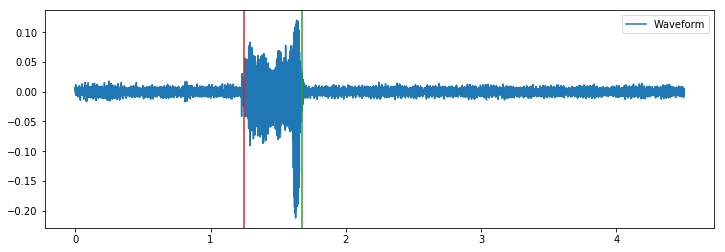

F:/main_total\180620_MGE_C_48_F.wav


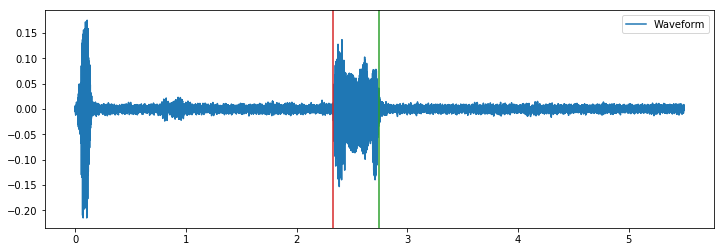

F:/main_total\180620_MGE_C_49_F.wav


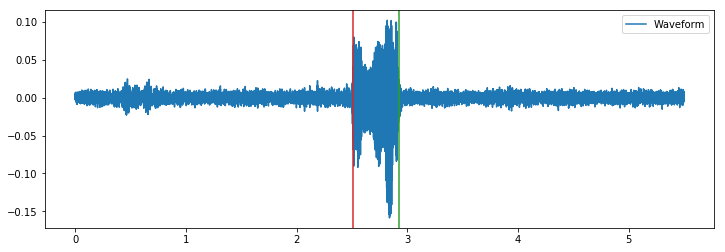

F:/main_total\180620_MGE_C_50_F.wav


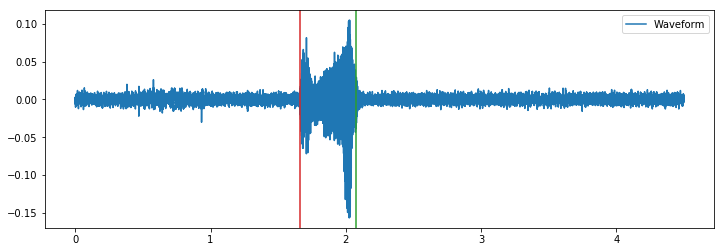

F:/main_total\180620_MGE_C_51_F.wav


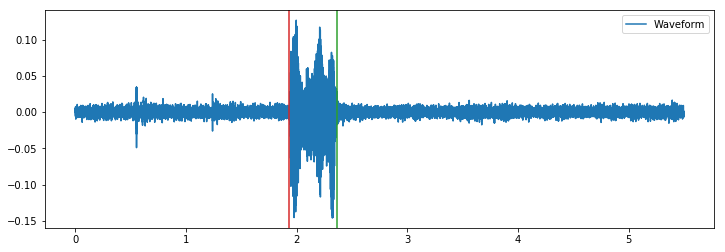

F:/main_total\180620_MGE_C_52_F.wav


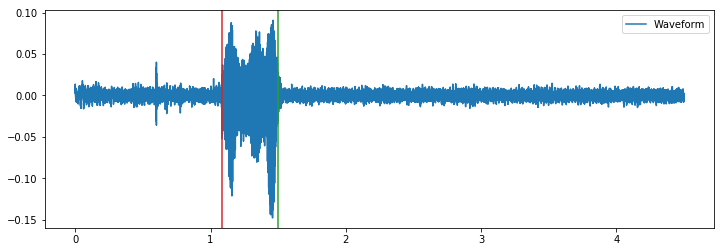

F:/main_total\180620_MGE_C_53_F.wav


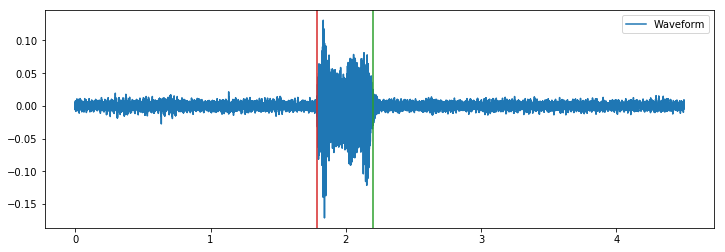

F:/main_total\180620_MGE_C_54_F.wav


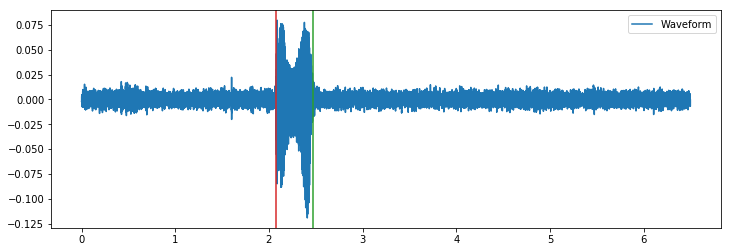

F:/main_total\180620_MGE_C_60_F.wav


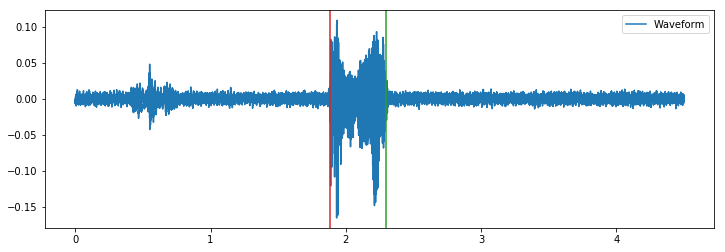

F:/main_total\180620_MGE_C_61_F.wav


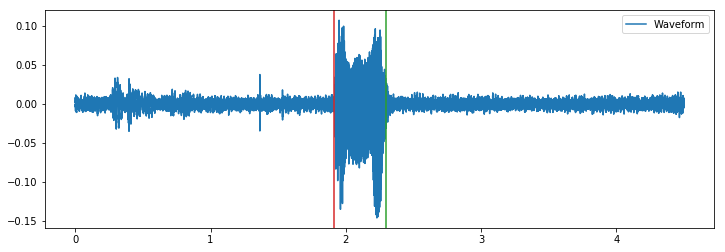

F:/main_total\180620_MGE_C_62_F.wav


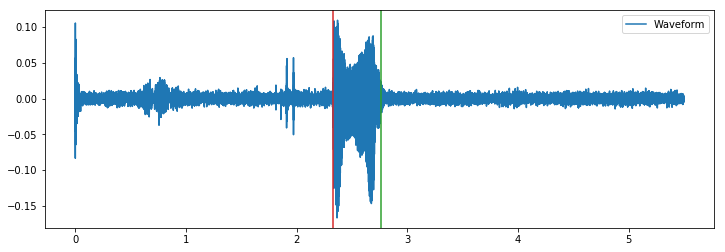

F:/main_total\180620_MGE_C_63_F.wav


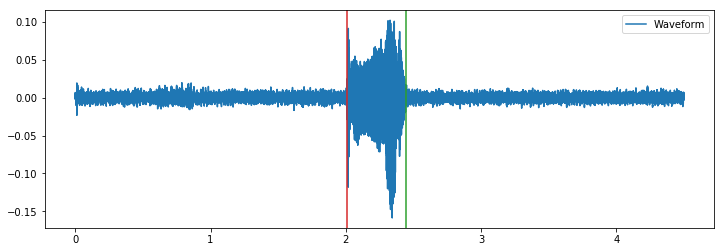

F:/main_total\180620_MGE_C_64_F.wav


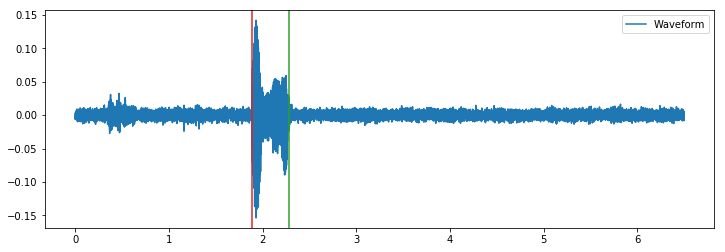

F:/main_total\180620_MGE_C_65_F.wav


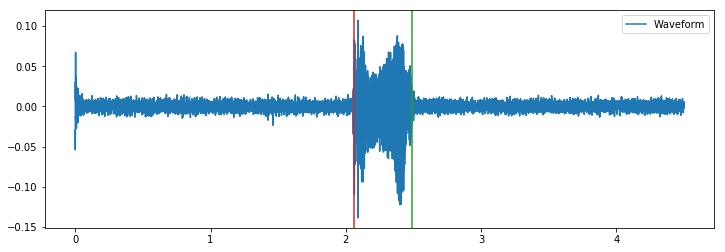

F:/main_total\180620_MGE_C_66_F.wav


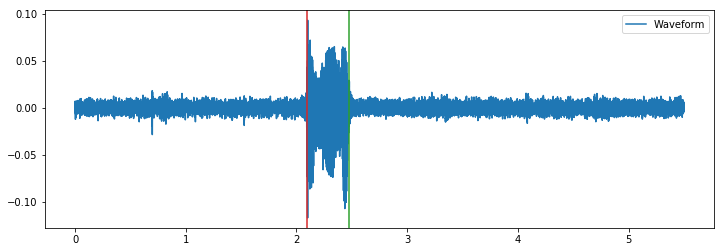

F:/main_total\180620_MGE_C_67_F.wav


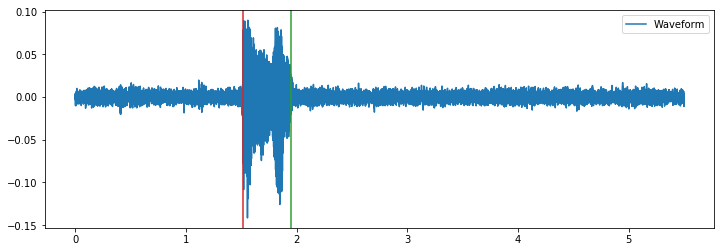

F:/main_total\180620_MGE_C_68_F.wav


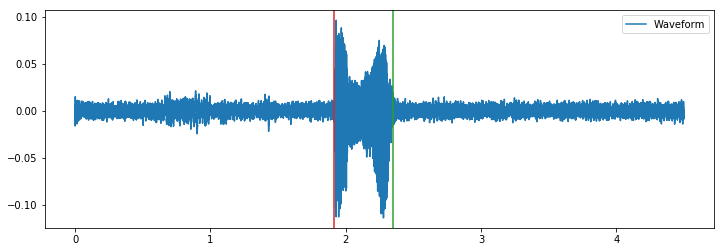

F:/main_total\180620_MGE_C_69_F.wav


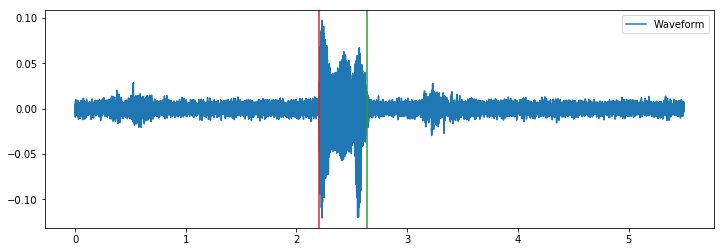

F:/main_total\180625_KKA_C_1_T.wav


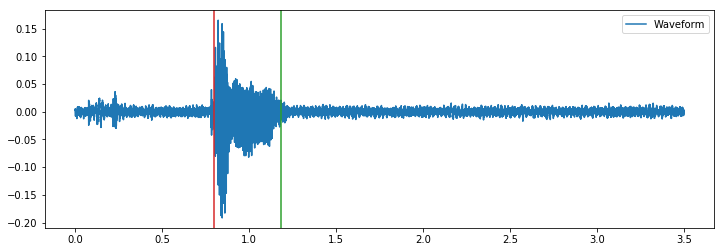

F:/main_total\180625_KKA_C_2_T.wav


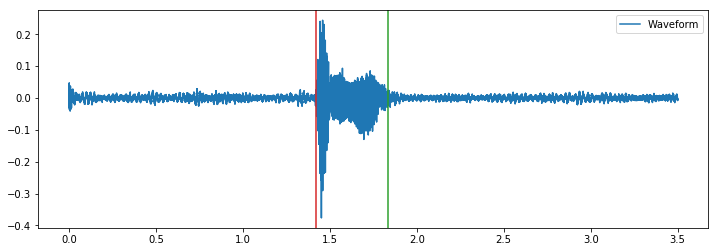

F:/main_total\180625_KKA_C_3_T.wav


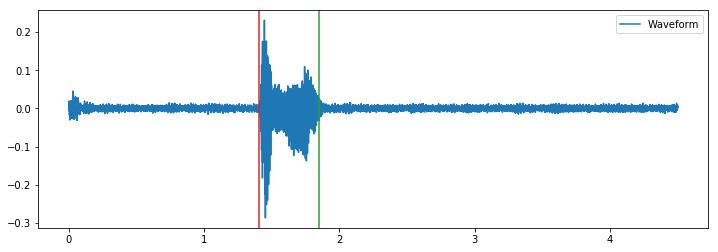

F:/main_total\180625_KKA_C_4_T.wav


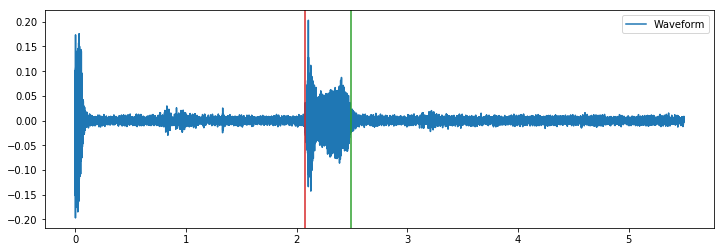

F:/main_total\180625_KKA_C_5_T.wav


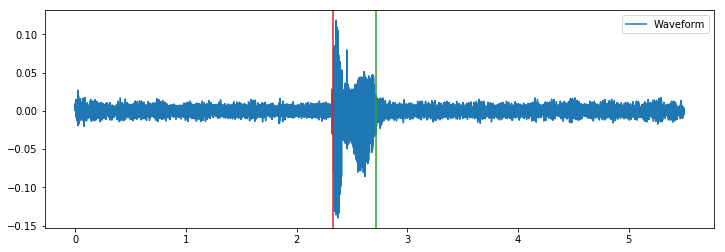

F:/main_total\180625_KKA_C_6_T.wav


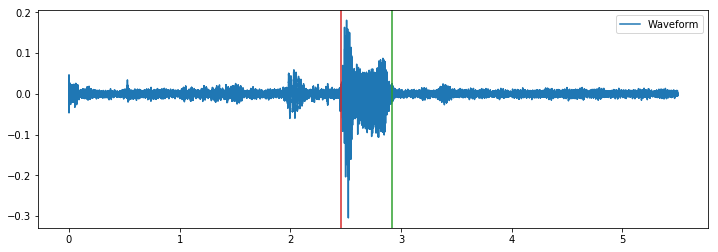

F:/main_total\180625_KKA_C_7_T.wav


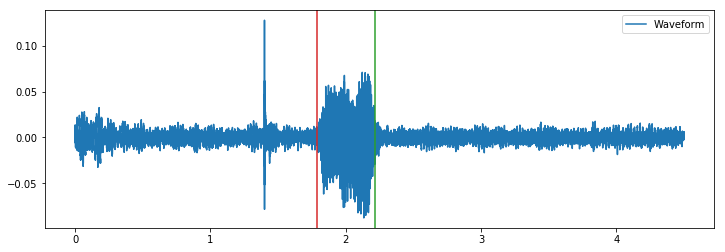

F:/main_total\180625_KKA_C_8_T.wav


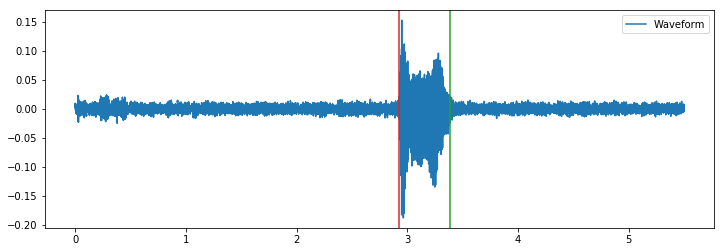

F:/main_total\180625_KKA_C_9_T.wav


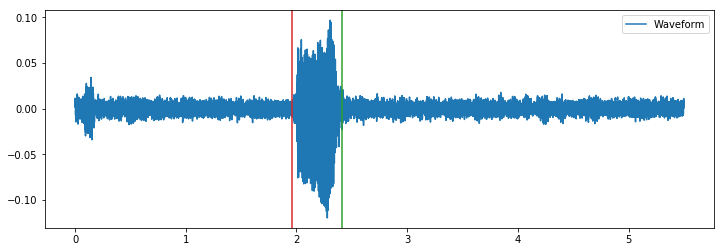

F:/main_total\180625_KKA_C_10_T.wav


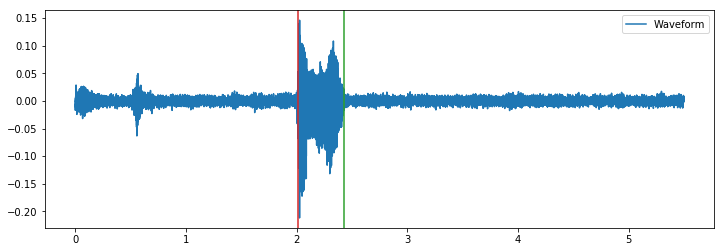

F:/main_total\180625_KKA_C_11_T.wav


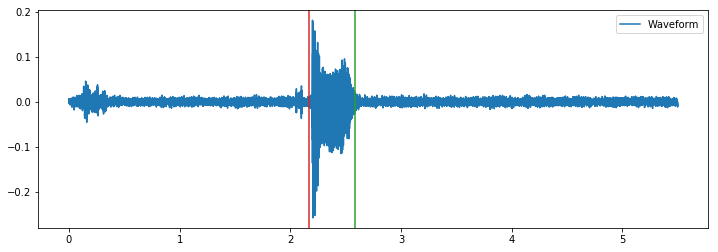

F:/main_total\180625_KKA_C_12_T.wav


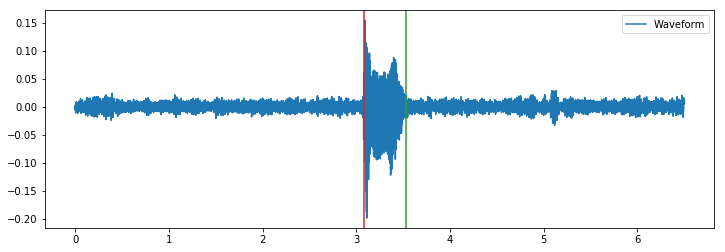

F:/main_total\180625_KKA_C_13_T.wav


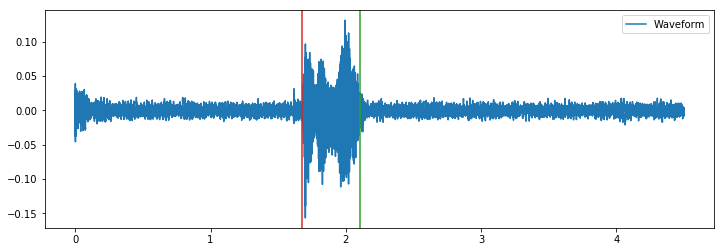

F:/main_total\180625_KKA_C_14_T.wav


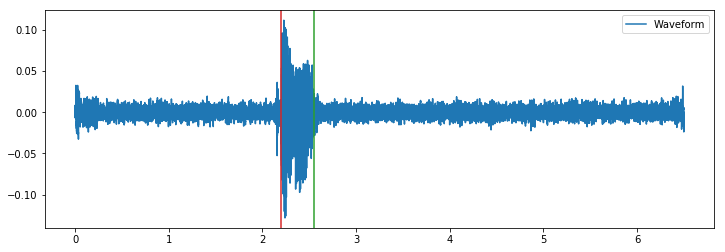

F:/main_total\180625_KKA_C_15_T.wav


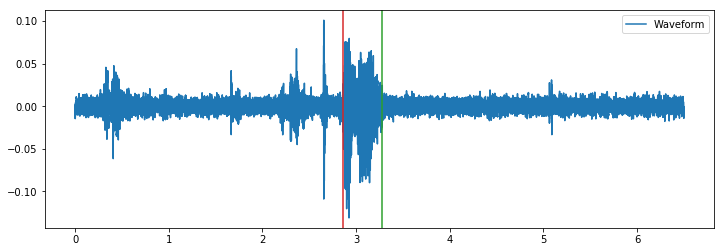

F:/main_total\180625_KKA_C_16_T.wav


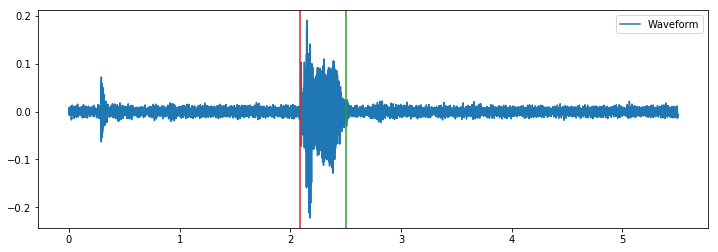

F:/main_total\180625_KKA_C_17_T.wav


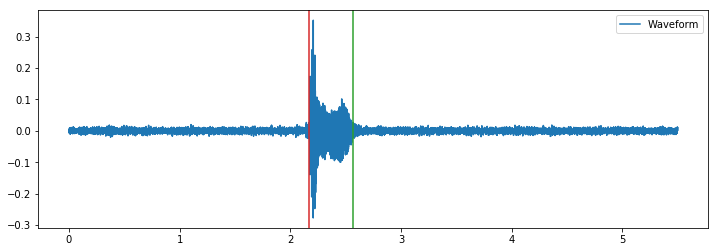

F:/main_total\180625_KKA_C_18_T.wav


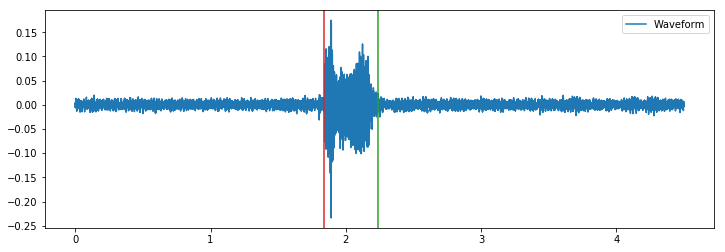

F:/main_total\180625_KKA_C_19_T.wav


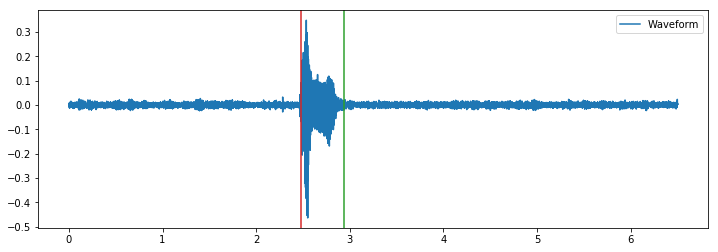

F:/main_total\180625_KKA_C_20_T.wav


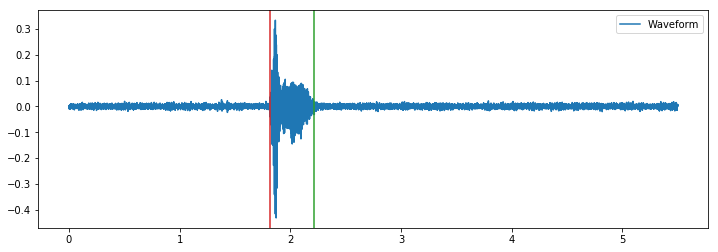

F:/main_total\180625_KKA_C_21_T.wav


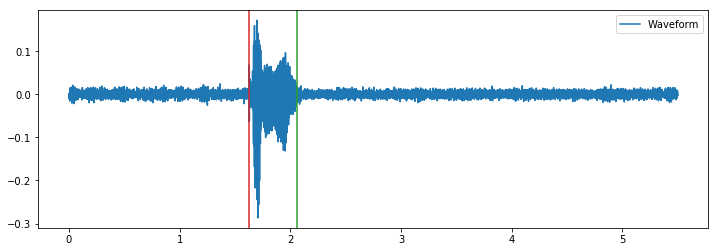

F:/main_total\180625_KKA_C_22_T.wav


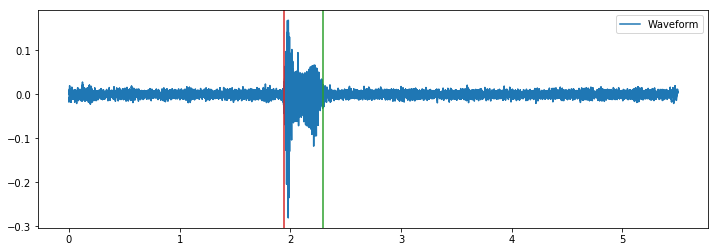

F:/main_total\180625_KKA_C_28_T.wav


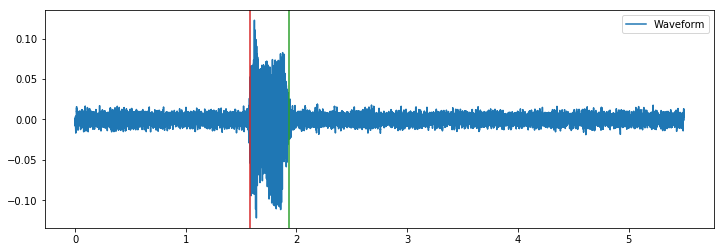

F:/main_total\180625_KKA_C_29_T.wav


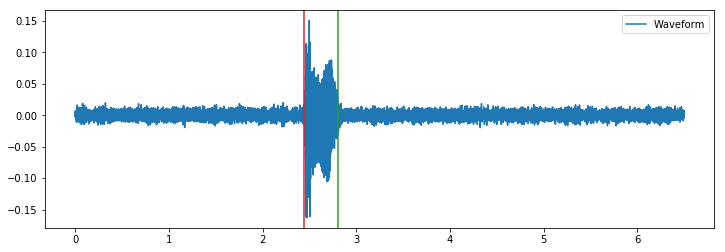

F:/main_total\180625_KKA_C_30_T.wav


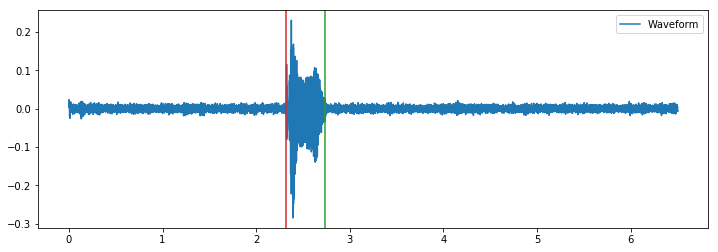

F:/main_total\180625_KKA_C_31_T.wav


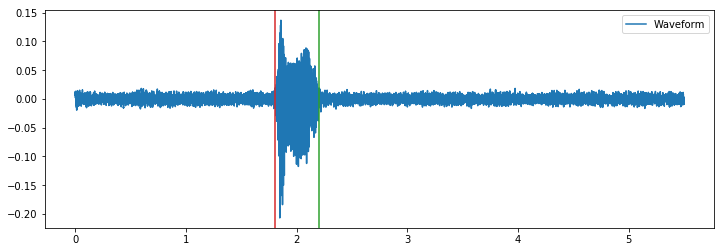

F:/main_total\180625_KKA_C_32_T.wav


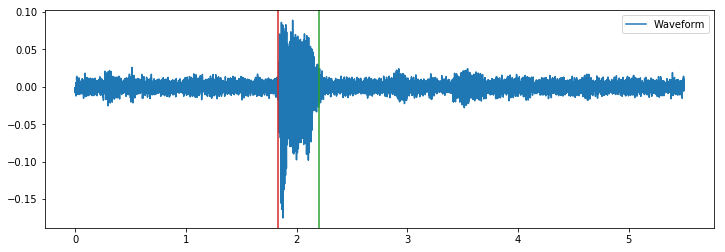

F:/main_total\180625_KKA_C_33_T.wav


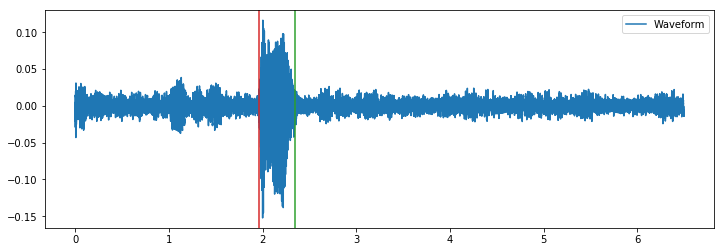

F:/main_total\180625_KKA_C_34_T.wav


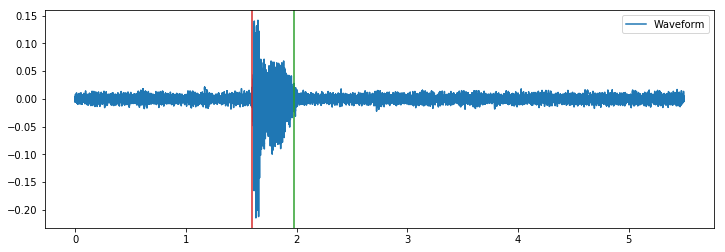

F:/main_total\180625_KKA_C_35_T.wav


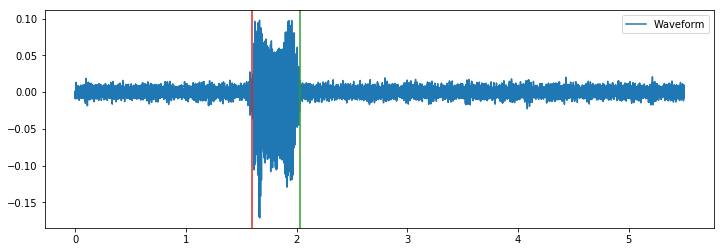

F:/main_total\180625_KKA_C_36_T.wav


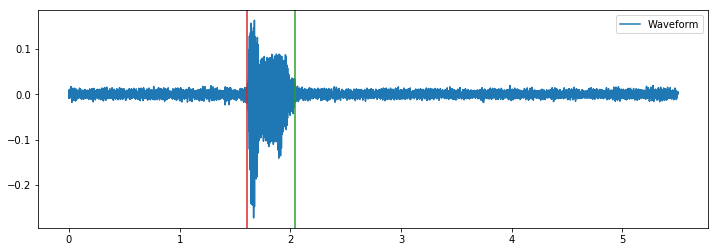

F:/main_total\180625_KKA_C_37_T.wav


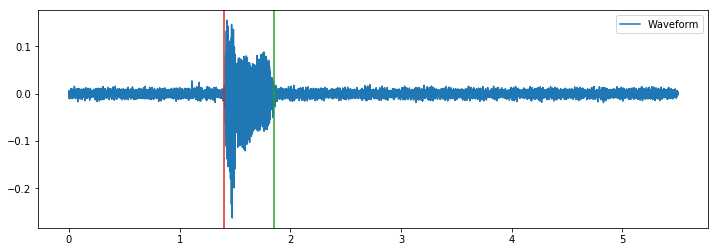

F:/main_total\180625_KKA_C_43_F.wav


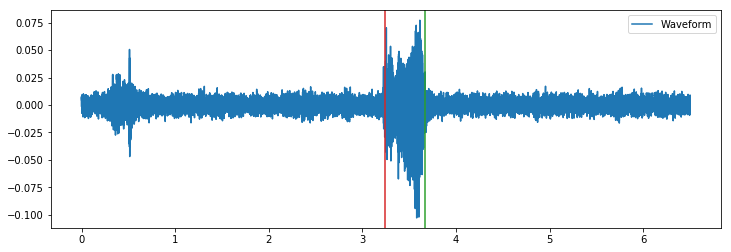

F:/main_total\180625_KKA_C_44_F.wav


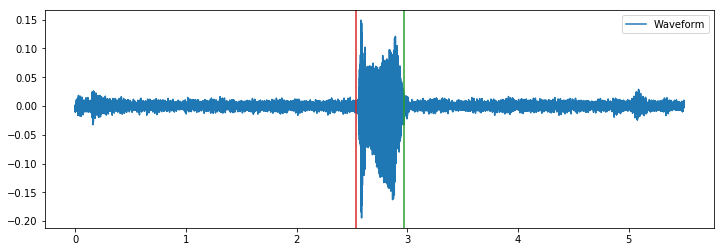

F:/main_total\180625_KKA_C_45_F.wav


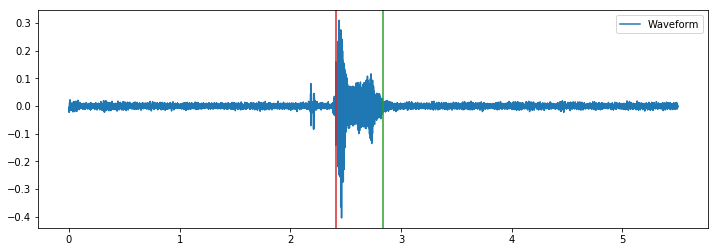

F:/main_total\180625_KKA_C_46_F.wav


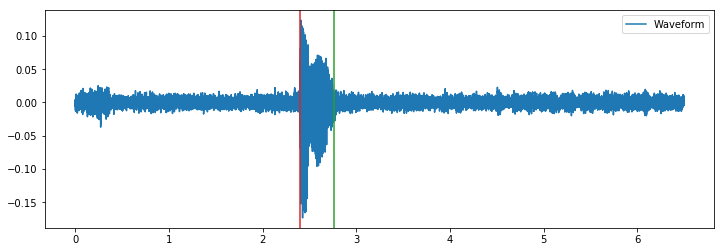

F:/main_total\180625_KKA_C_47_F.wav


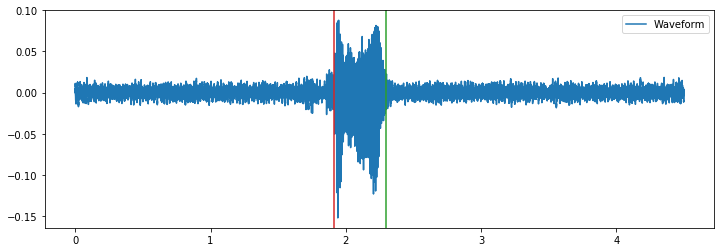

F:/main_total\180625_KKA_C_48_F.wav


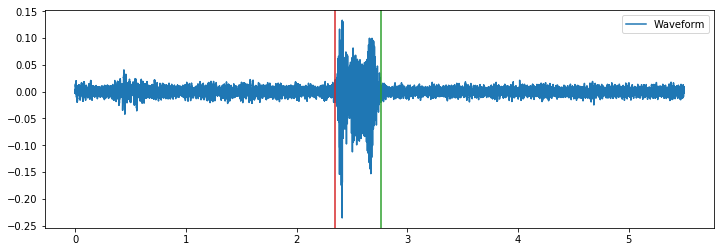

F:/main_total\180625_KKA_C_49_F.wav


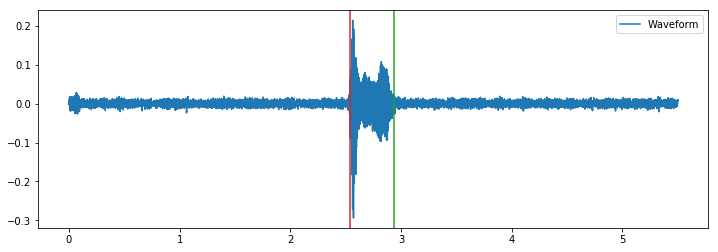

F:/main_total\180625_KKA_C_50_F.wav


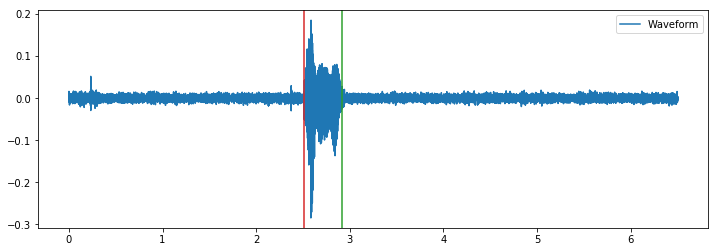

F:/main_total\180625_KKA_C_51_F.wav


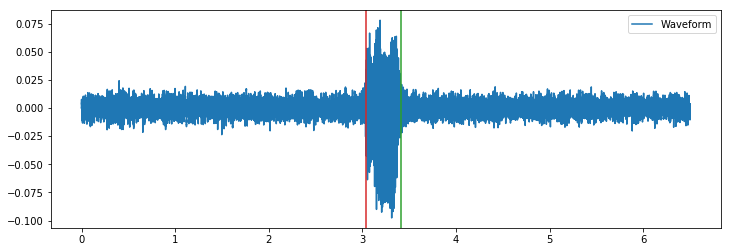

F:/main_total\180625_KKA_C_52_F.wav


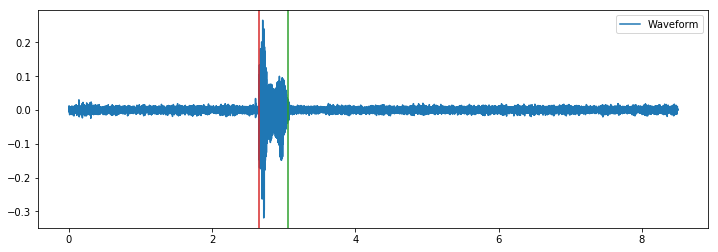

F:/main_total\180625_KKA_C_53_F.wav


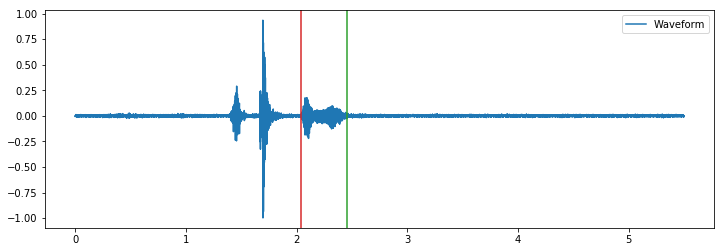

F:/main_total\180625_KKA_C_54_F.wav


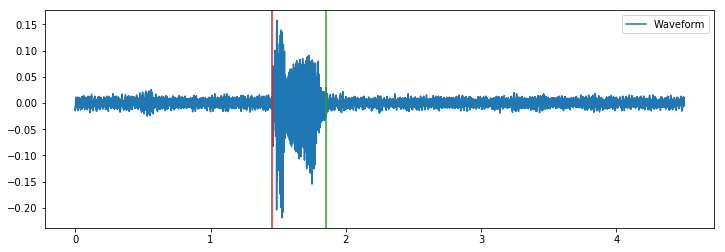

F:/main_total\180625_KKA_C_60_F.wav


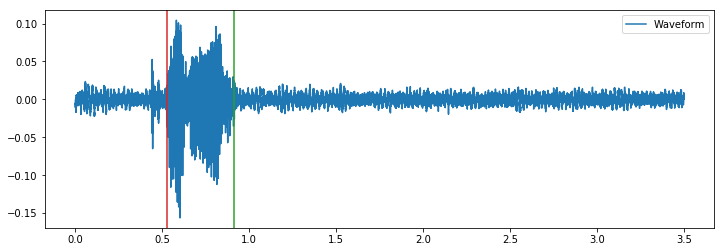

F:/main_total\180625_KKA_C_61_F.wav


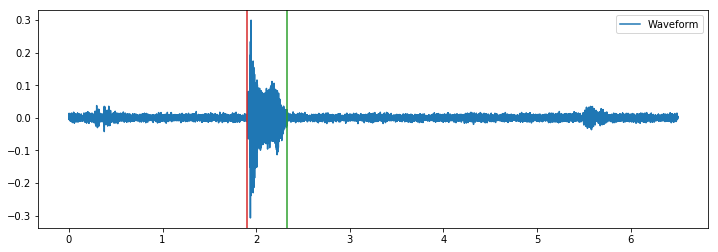

F:/main_total\180625_KKA_C_62_F.wav


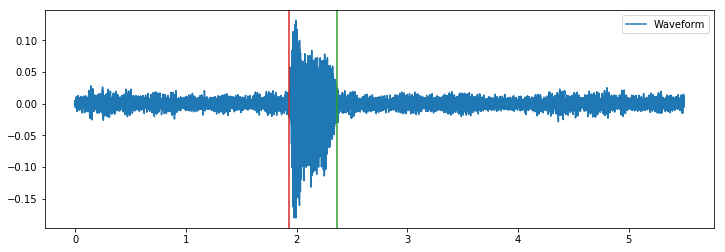

F:/main_total\180625_KKA_C_63_F.wav


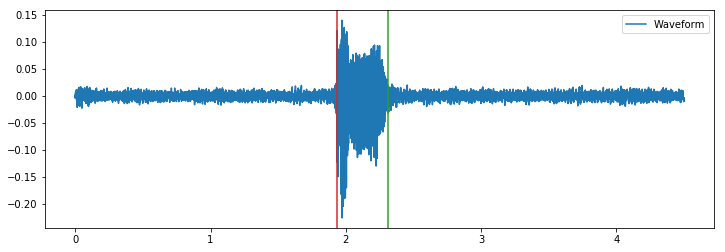

F:/main_total\180625_KKA_C_64_F.wav


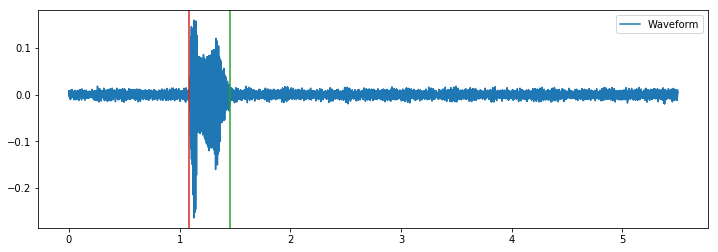

F:/main_total\180625_KKA_C_65_F.wav


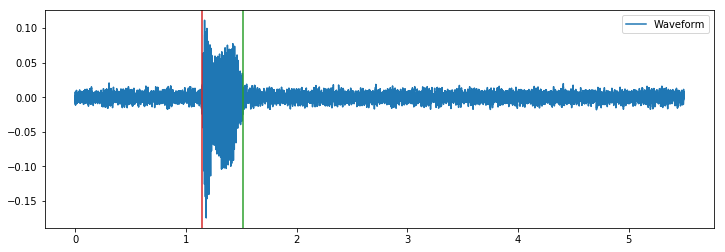

F:/main_total\180625_KKA_C_66_F.wav


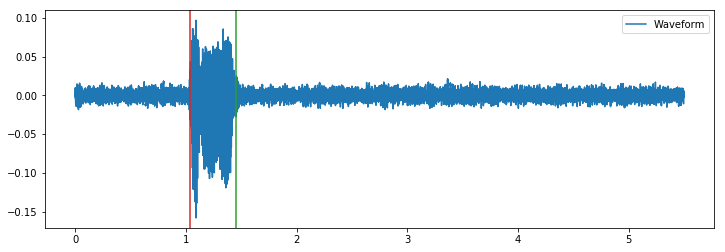

F:/main_total\180625_KKA_C_67_F.wav


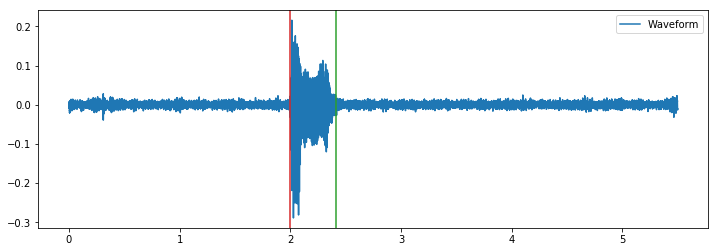

F:/main_total\180625_KKA_C_68_F.wav


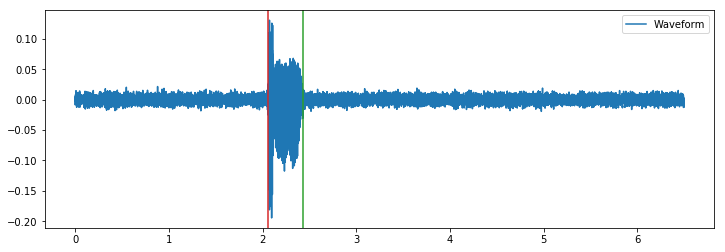

F:/main_total\180625_KKA_C_69_F.wav


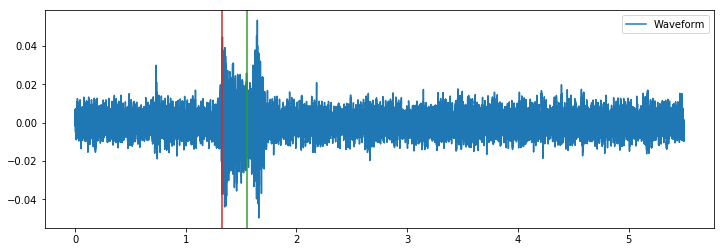

F:/main_total\180627_SSS_C_1_T.wav


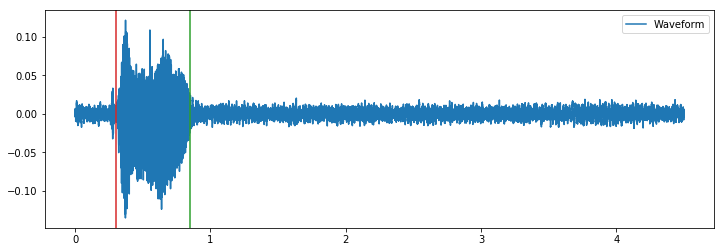

F:/main_total\180627_SSS_C_2_T.wav


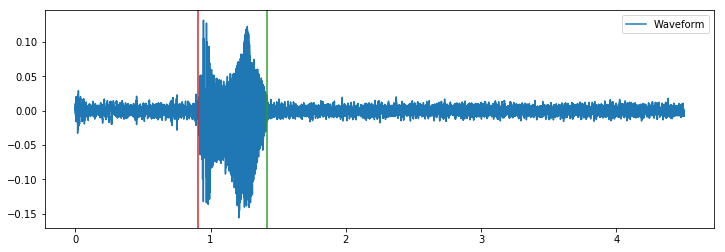

F:/main_total\180627_SSS_C_3_T.wav


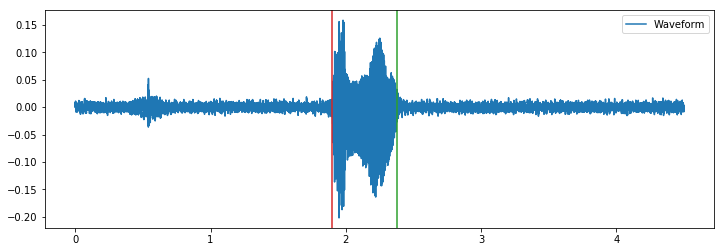

F:/main_total\180627_SSS_C_4_T.wav


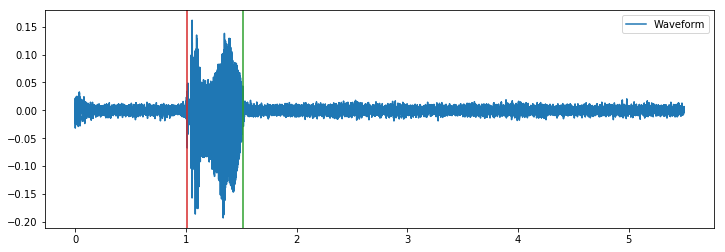

F:/main_total\180627_SSS_C_5_T.wav


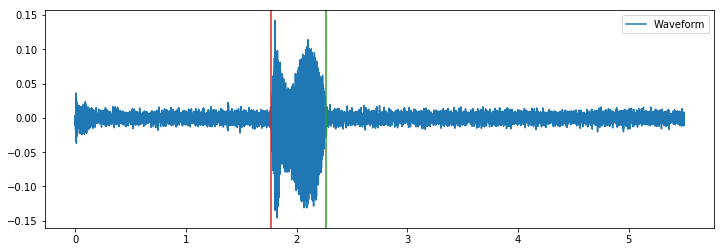

F:/main_total\180627_SSS_C_6_T.wav


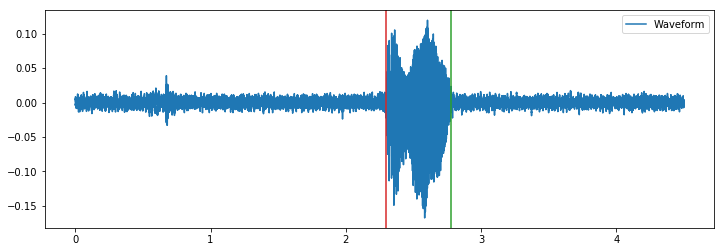

F:/main_total\180627_SSS_C_7_T.wav


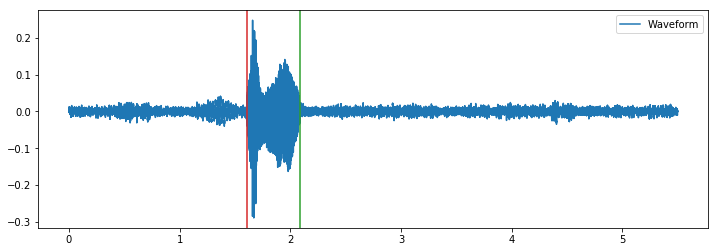

F:/main_total\180627_SSS_C_8_T.wav


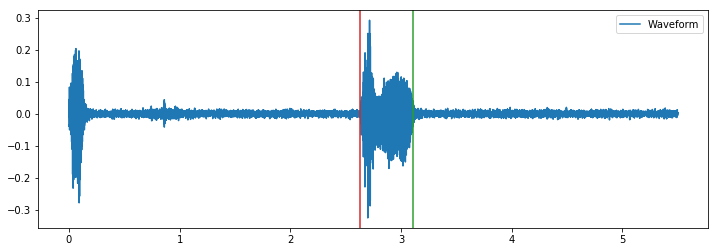

F:/main_total\180627_SSS_C_9_T.wav


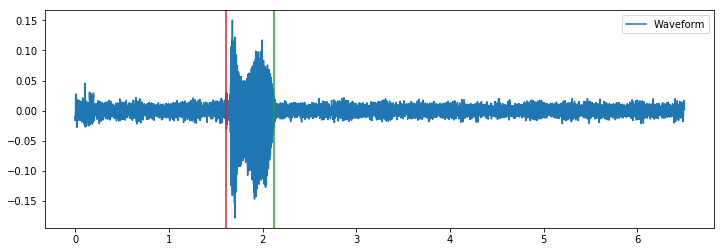

F:/main_total\180627_SSS_C_10_T.wav


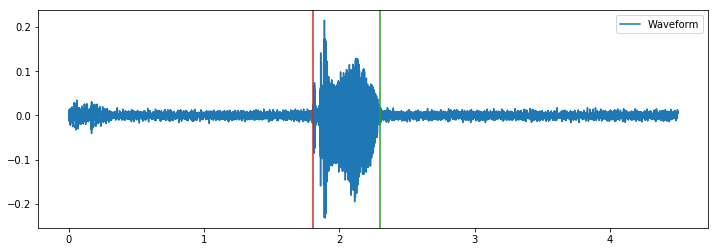

F:/main_total\180627_SSS_C_11_T.wav


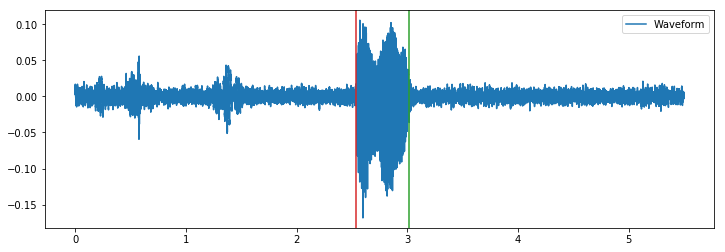

F:/main_total\180627_SSS_C_12_T.wav


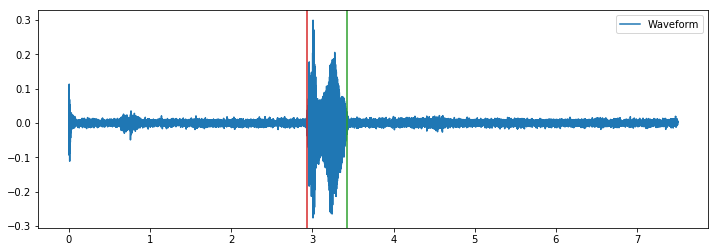

F:/main_total\180627_SSS_C_13_T.wav


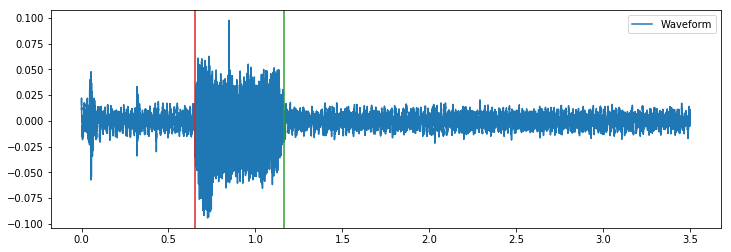

F:/main_total\180627_SSS_C_14_T.wav


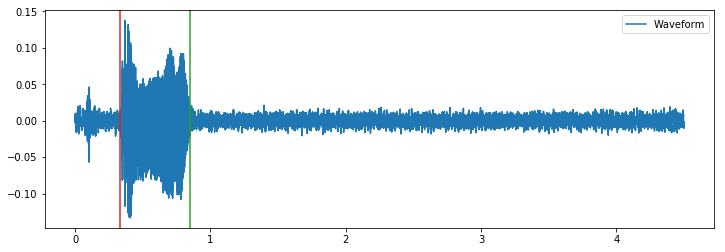

F:/main_total\180627_SSS_C_15_T.wav


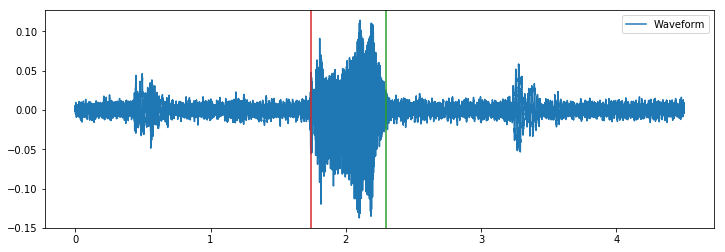

F:/main_total\180627_SSS_C_16_T.wav


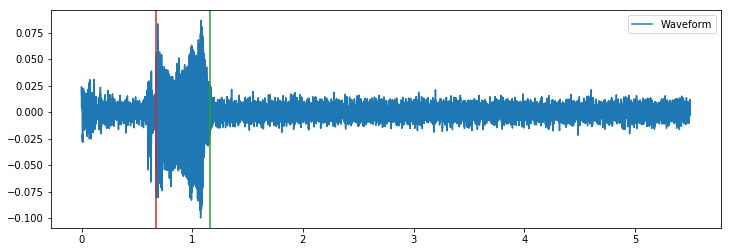

F:/main_total\180627_SSS_C_17_T.wav


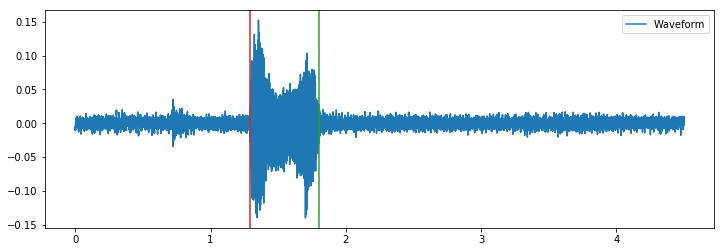

F:/main_total\180627_SSS_C_18_T.wav


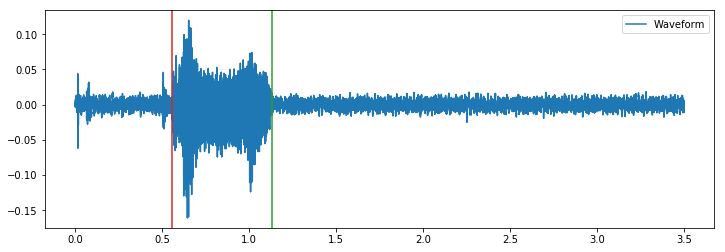

F:/main_total\180627_SSS_C_19_T.wav


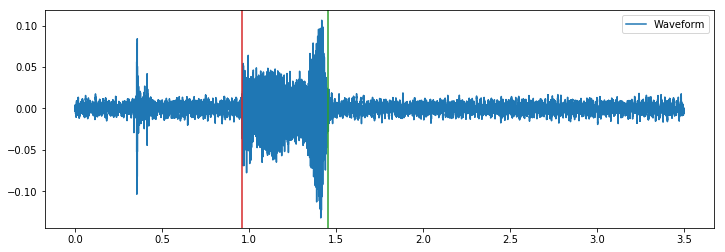

F:/main_total\180627_SSS_C_20_T.wav


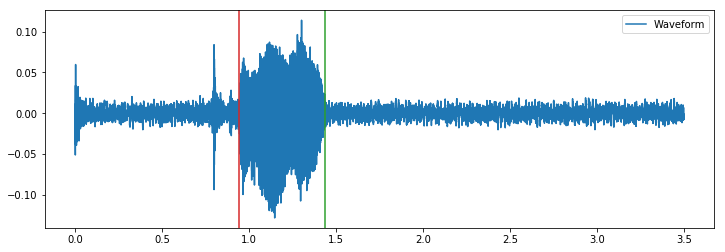

F:/main_total\180627_SSS_C_21_T.wav


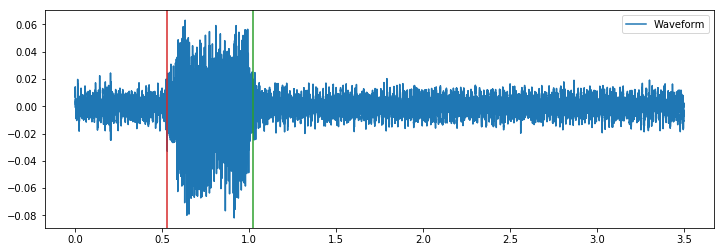

F:/main_total\180627_SSS_C_22_T.wav


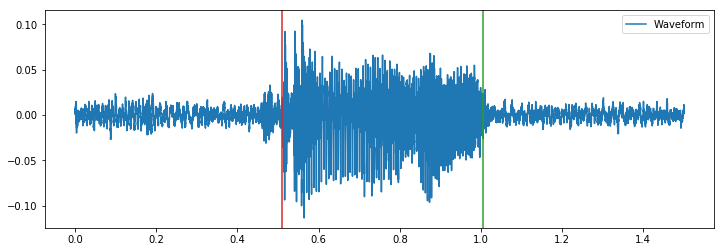

F:/main_total\180627_SSS_C_28_T.wav


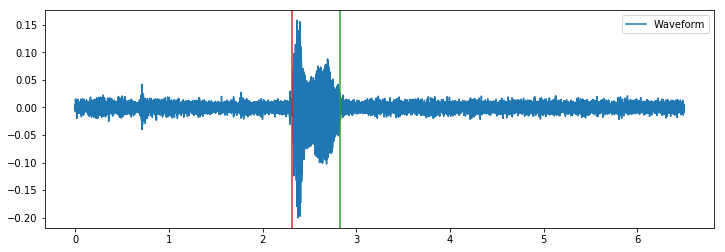

F:/main_total\180627_SSS_C_29_T.wav


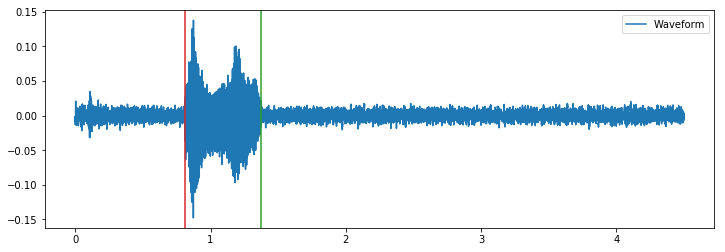

F:/main_total\180627_SSS_C_30_T.wav


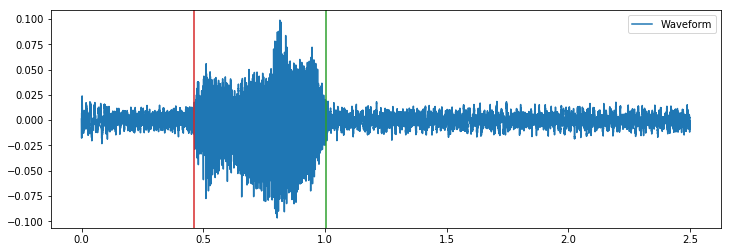

F:/main_total\180627_SSS_C_31_T.wav


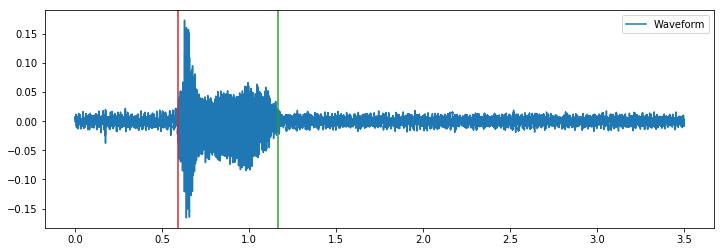

F:/main_total\180627_SSS_C_32_T.wav


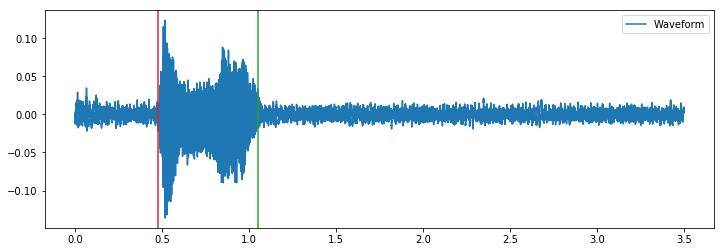

F:/main_total\180627_SSS_C_33_T.wav


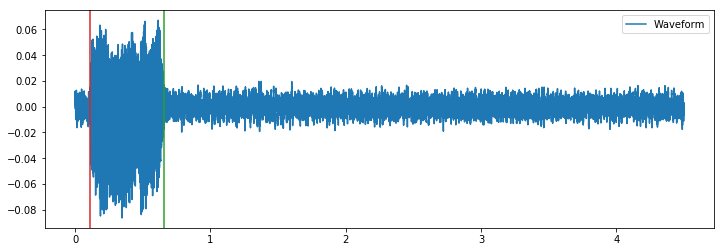

F:/main_total\180627_SSS_C_34_T.wav


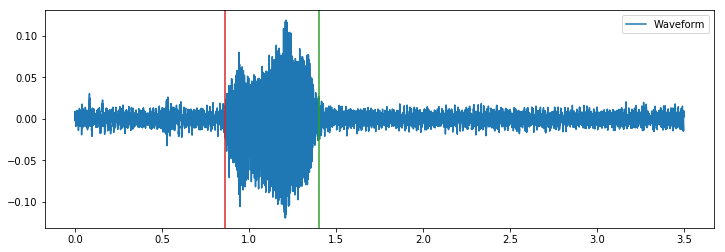

F:/main_total\180627_SSS_C_35_T.wav


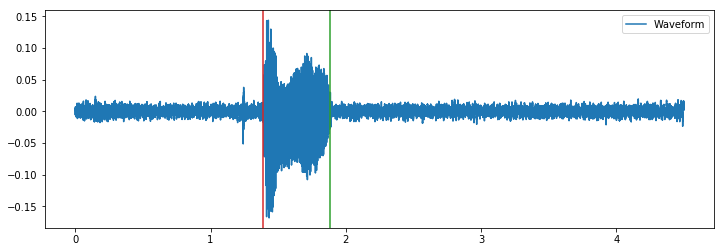

F:/main_total\180627_SSS_C_36_T.wav


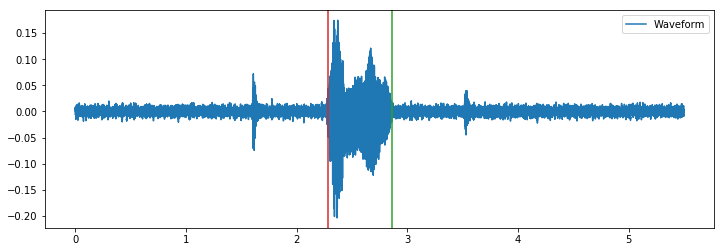

F:/main_total\180627_SSS_C_37_T.wav


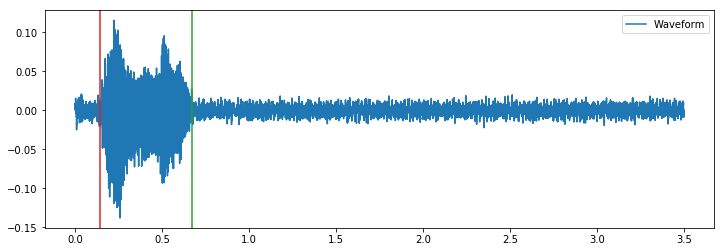

F:/main_total\180627_SSS_C_43_F.wav


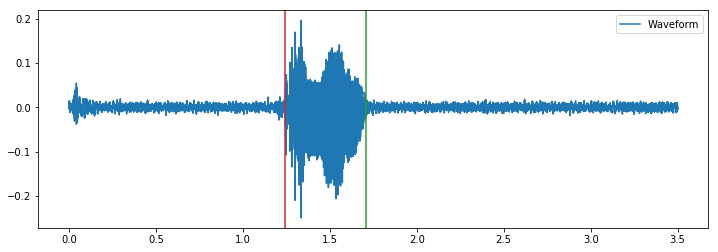

F:/main_total\180627_SSS_C_44_F.wav


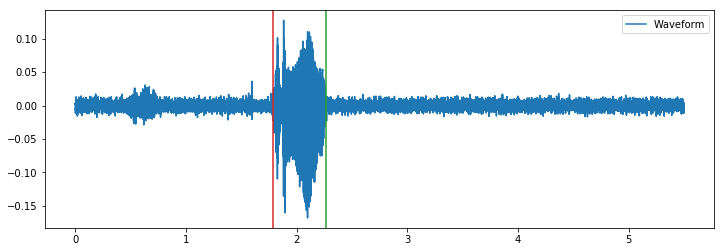

F:/main_total\180627_SSS_C_45_F.wav


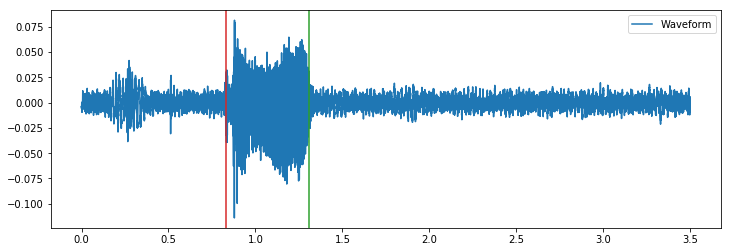

F:/main_total\180627_SSS_C_46_F.wav


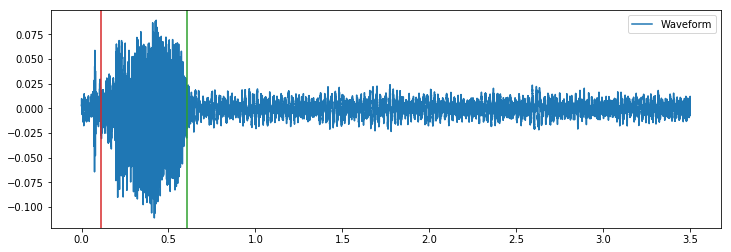

F:/main_total\180627_SSS_C_47_F.wav


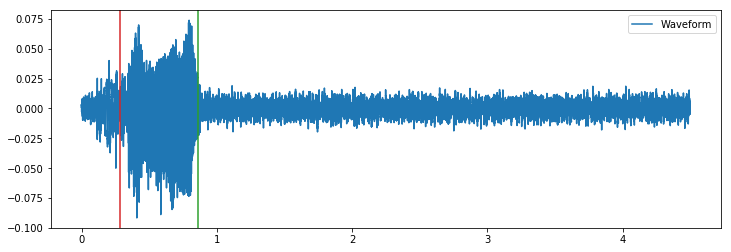

F:/main_total\180627_SSS_C_48_F.wav


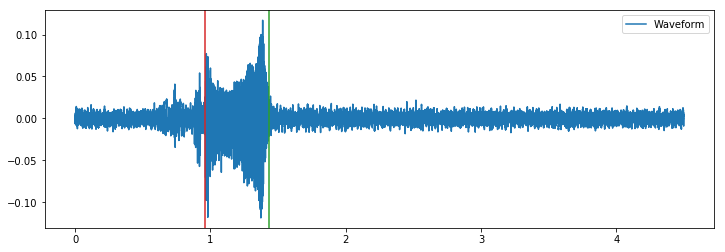

F:/main_total\180627_SSS_C_49_F.wav


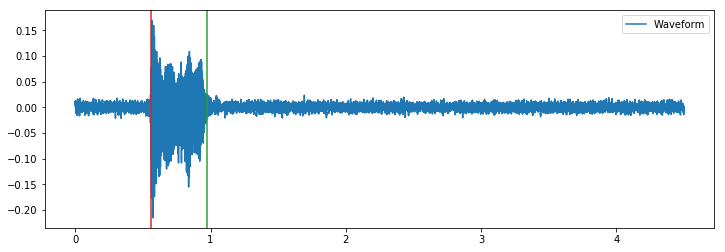

F:/main_total\180627_SSS_C_50_F.wav


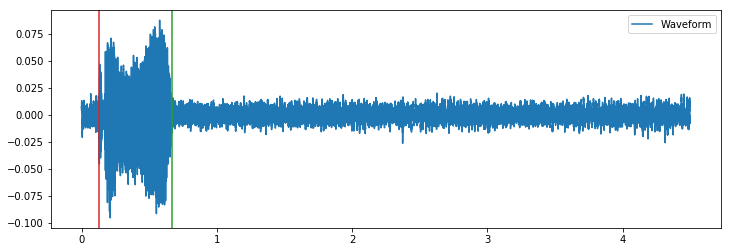

F:/main_total\180627_SSS_C_51_F.wav


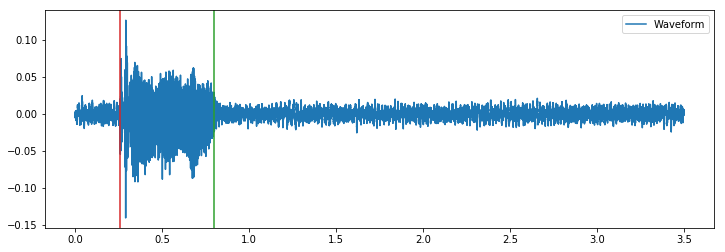

F:/main_total\180627_SSS_C_52_F.wav


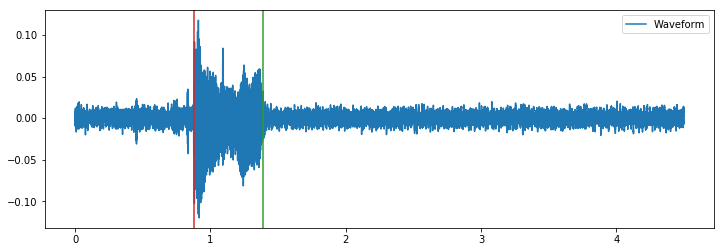

F:/main_total\180627_SSS_C_53_F.wav


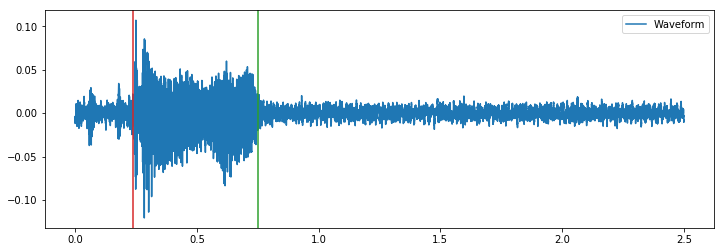

F:/main_total\180627_SSS_C_54_F.wav


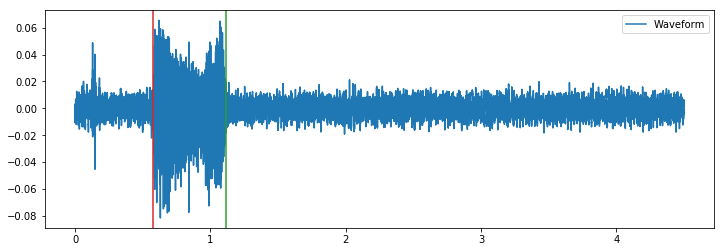

F:/main_total\180627_SSS_C_60_F.wav


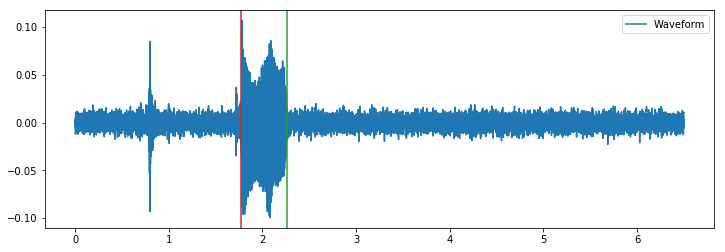

F:/main_total\180627_SSS_C_61_F.wav


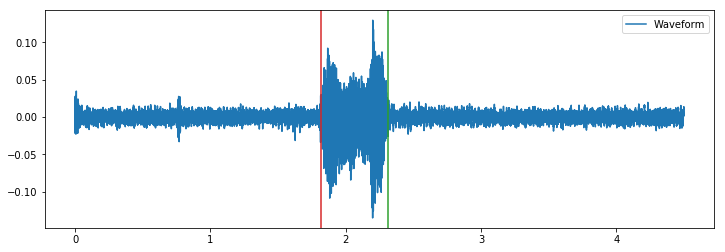

F:/main_total\180627_SSS_C_62_F.wav


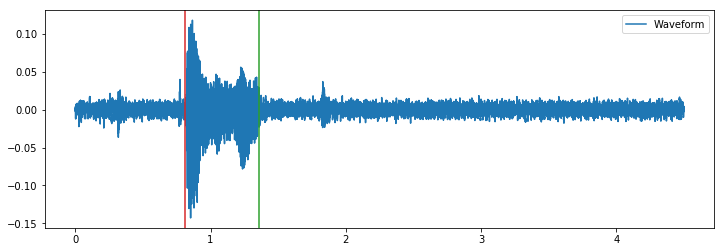

F:/main_total\180627_SSS_C_63_F.wav


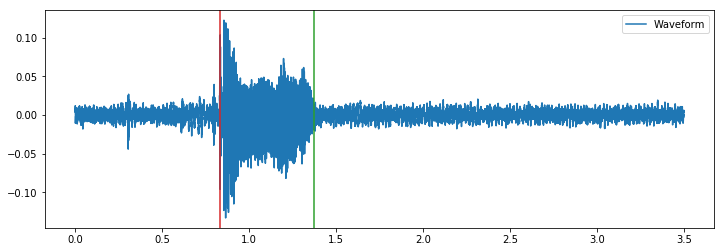

F:/main_total\180627_SSS_C_64_F.wav


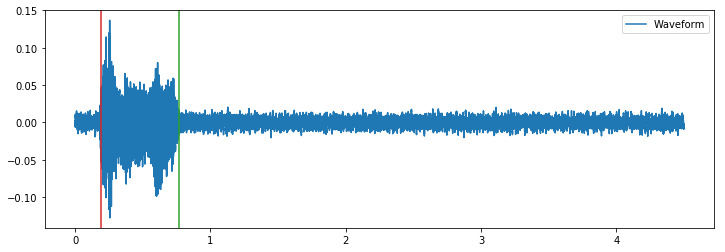

F:/main_total\180627_SSS_C_65_F.wav


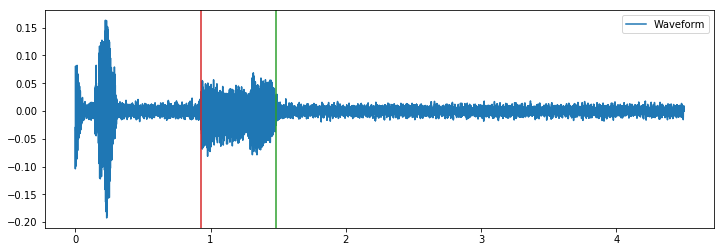

F:/main_total\180627_SSS_C_66_F.wav


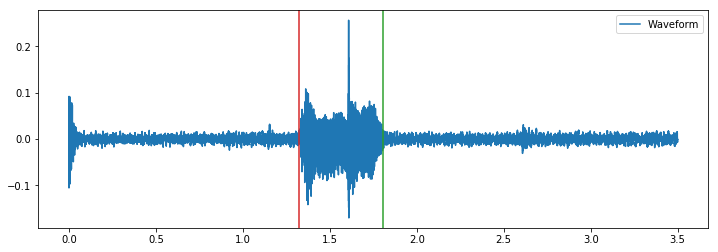

F:/main_total\180627_SSS_C_67_F.wav


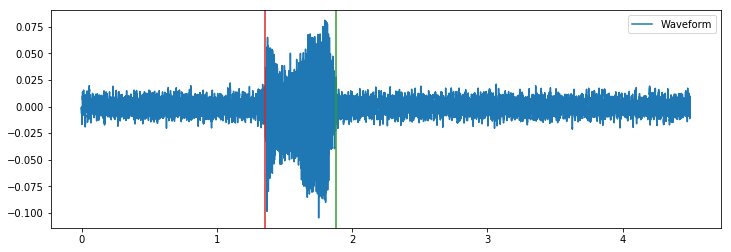

F:/main_total\180627_SSS_C_68_F.wav


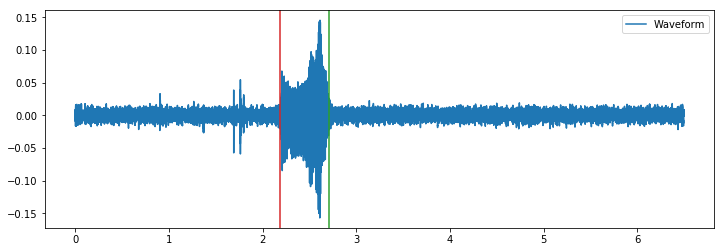

F:/main_total\180627_SSS_C_69_F.wav


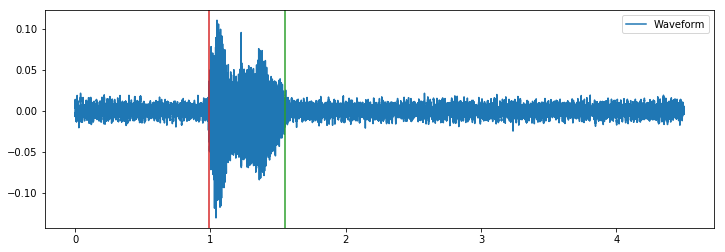

F:/main_total\180627_LNY_C_1_T.wav


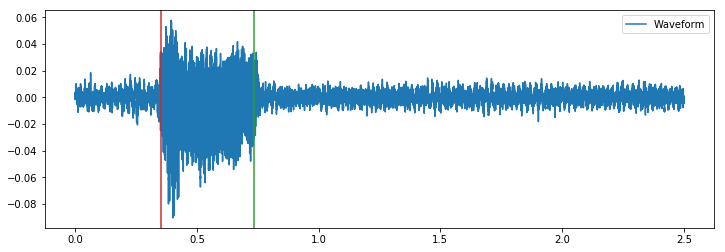

F:/main_total\180627_LNY_C_2_T.wav


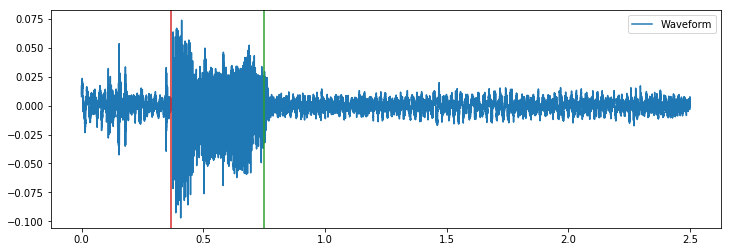

F:/main_total\180627_LNY_C_3_T.wav


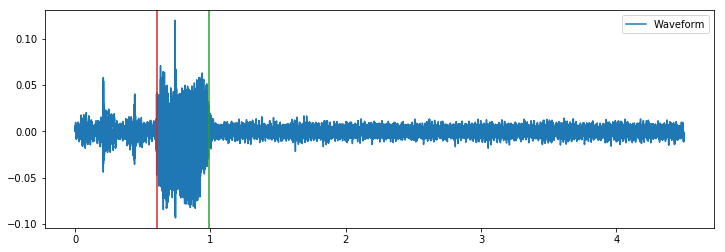

F:/main_total\180627_LNY_C_4_T.wav


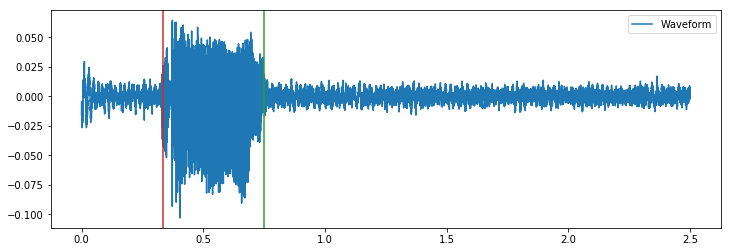

F:/main_total\180627_LNY_C_5_T.wav


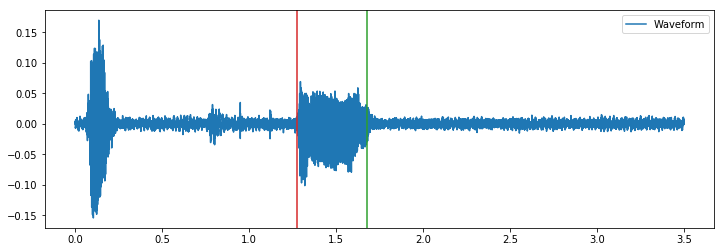

F:/main_total\180627_LNY_C_6_T.wav


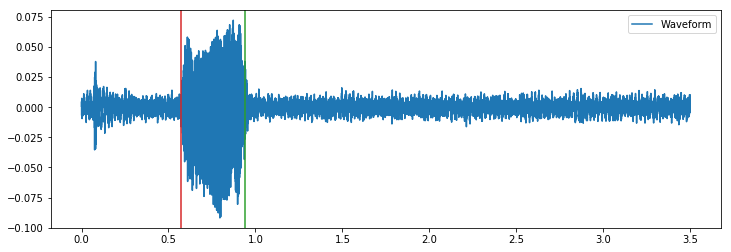

F:/main_total\180627_LNY_C_7_T.wav


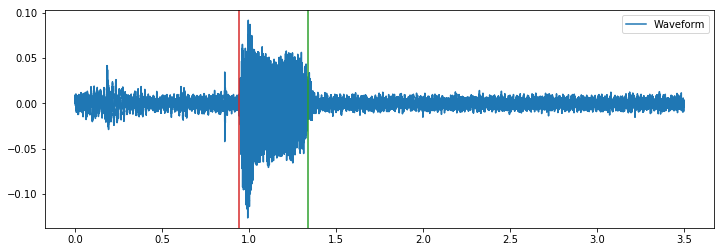

F:/main_total\180627_LNY_C_8_T.wav


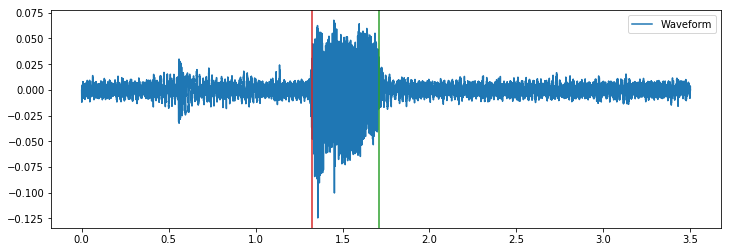

F:/main_total\180627_LNY_C_9_T.wav


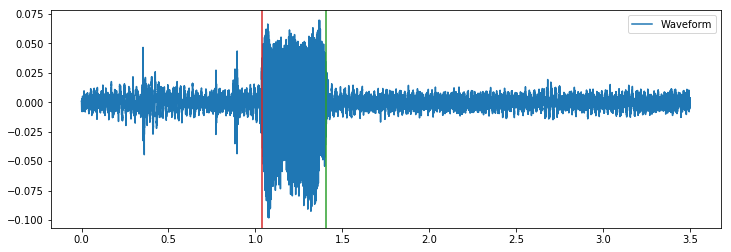

F:/main_total\180627_LNY_C_10_T.wav


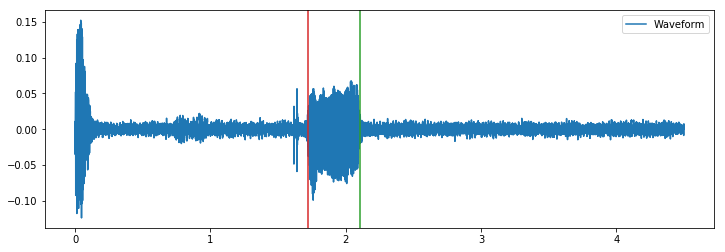

F:/main_total\180627_LNY_C_11_T.wav


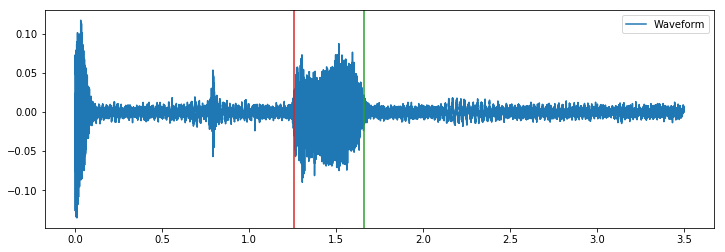

F:/main_total\180627_LNY_C_12_T.wav


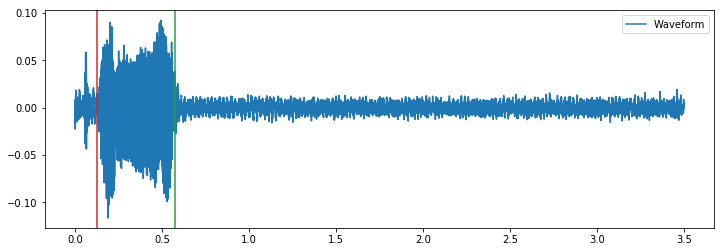

F:/main_total\180627_LNY_C_13_T.wav


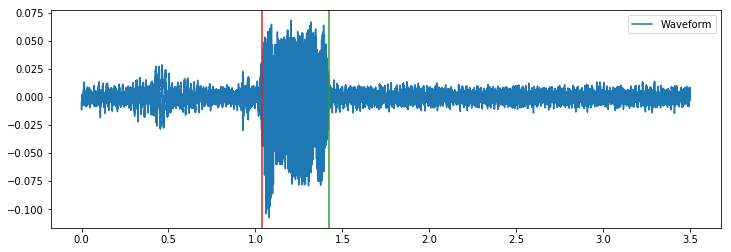

F:/main_total\180627_LNY_C_14_T.wav


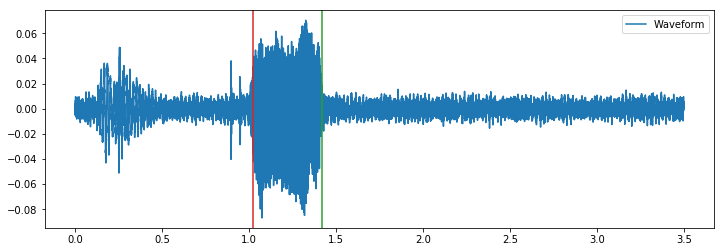

F:/main_total\180627_LNY_C_15_T.wav


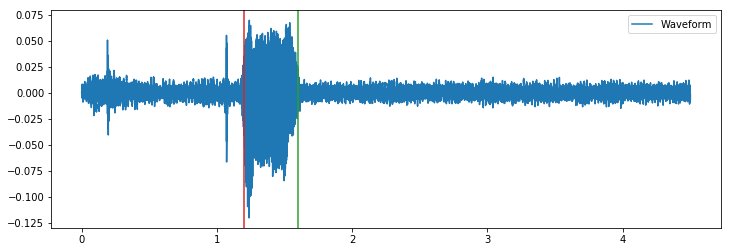

F:/main_total\180627_LNY_C_16_T.wav


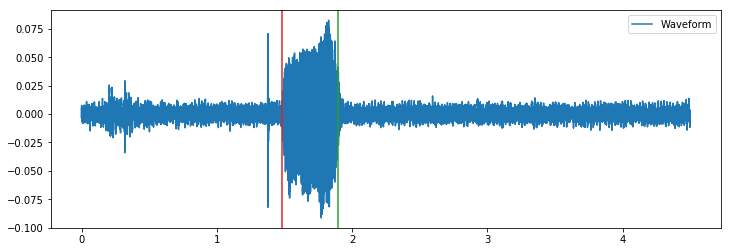

F:/main_total\180627_LNY_C_17_T.wav


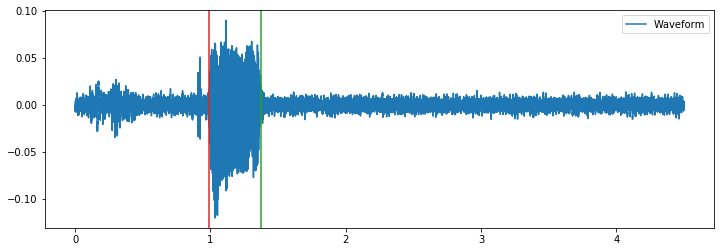

F:/main_total\180627_LNY_C_18_T.wav


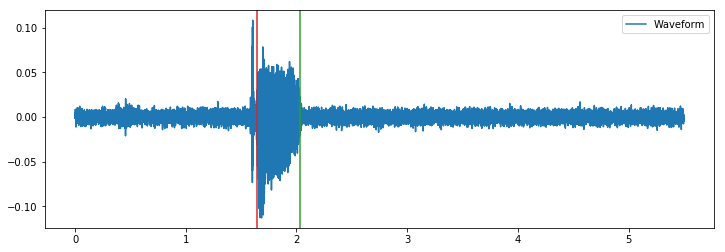

F:/main_total\180627_LNY_C_19_T.wav


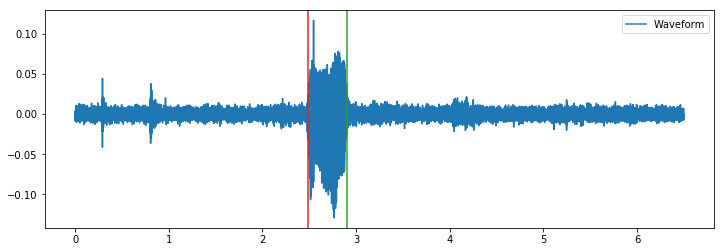

F:/main_total\180627_LNY_C_20_T.wav


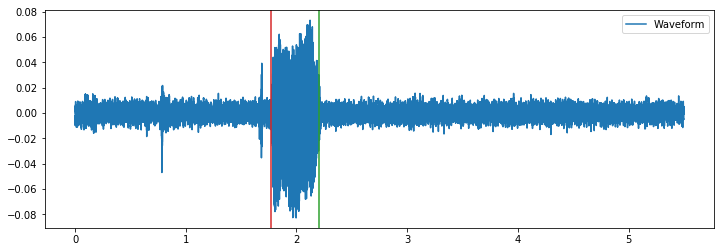

F:/main_total\180627_LNY_C_21_T.wav


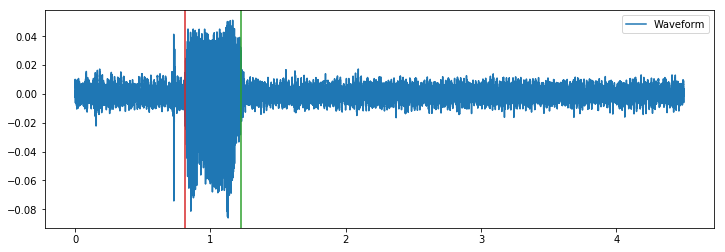

F:/main_total\180627_LNY_C_22_T.wav


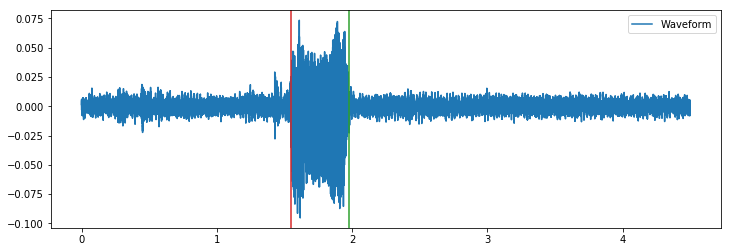

F:/main_total\180627_LNY_C_28_T.wav


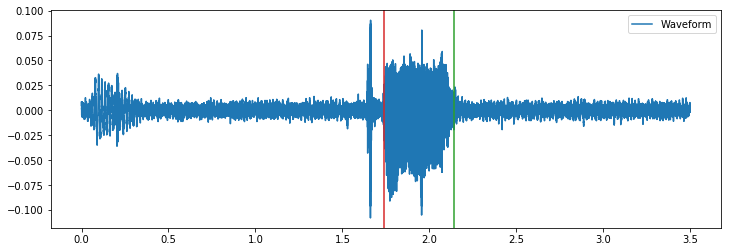

F:/main_total\180627_LNY_C_29_T.wav


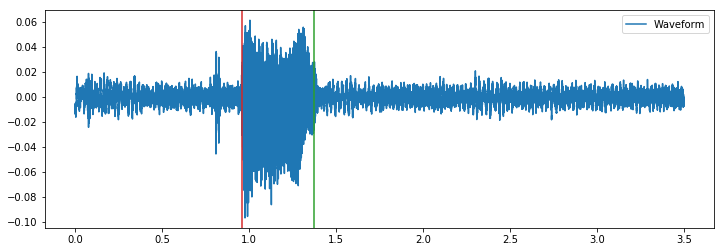

F:/main_total\180627_LNY_C_30_T.wav


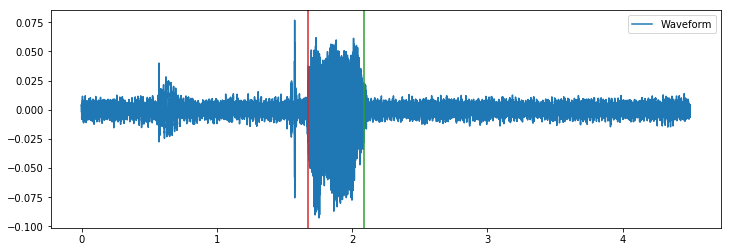

F:/main_total\180627_LNY_C_31_T.wav


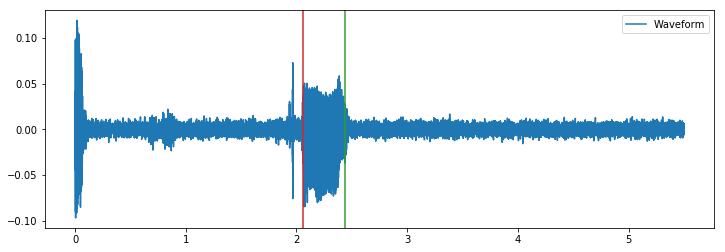

F:/main_total\180627_LNY_C_32_T.wav


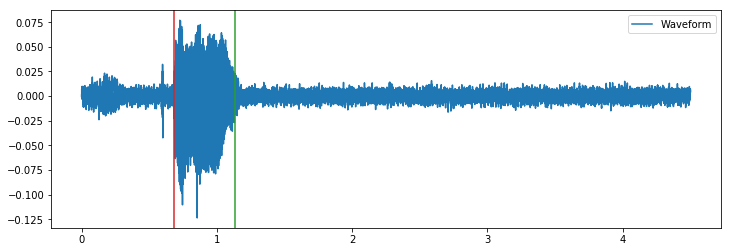

F:/main_total\180627_LNY_C_33_T.wav


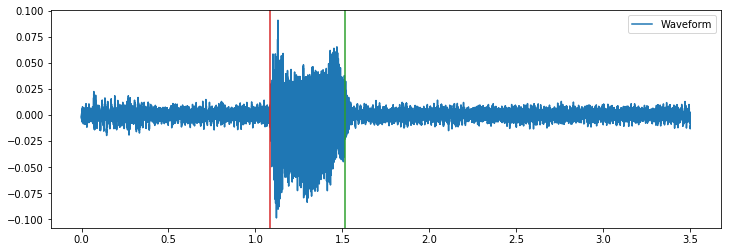

F:/main_total\180627_LNY_C_34_T.wav


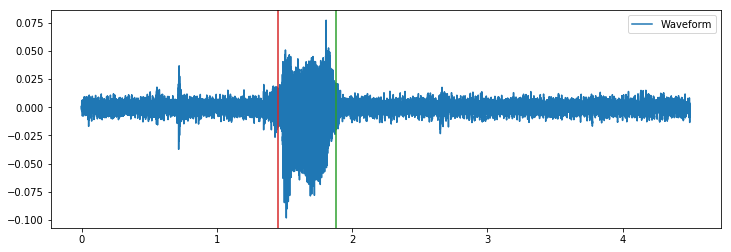

F:/main_total\180627_LNY_C_35_T.wav


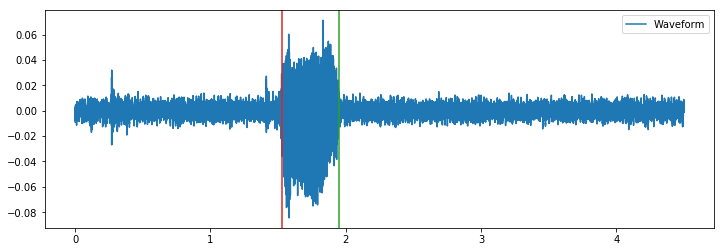

F:/main_total\180627_LNY_C_36_T.wav


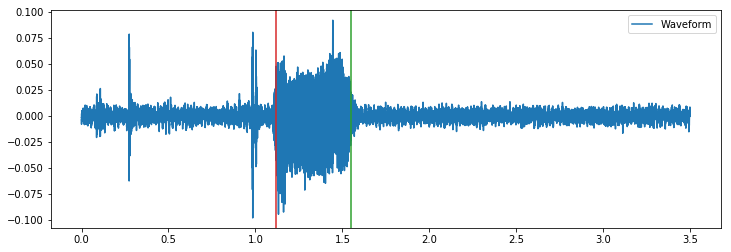

F:/main_total\180627_LNY_C_37_T.wav


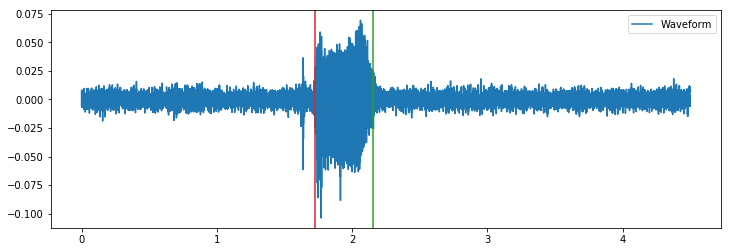

F:/main_total\180627_LNY_C_43_F.wav


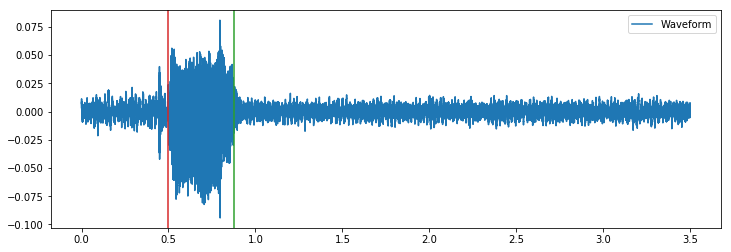

F:/main_total\180627_LNY_C_44_F.wav


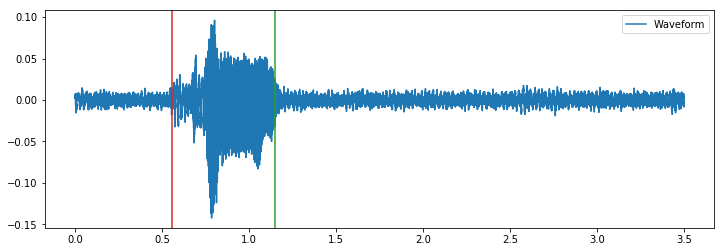

F:/main_total\180627_LNY_C_45_F.wav


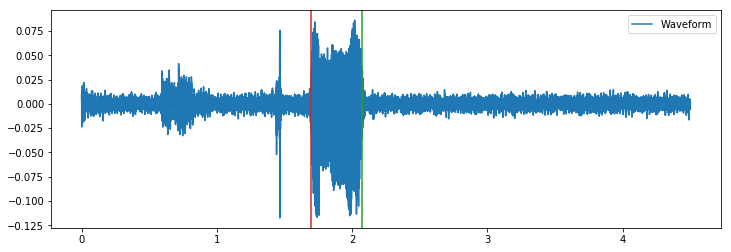

F:/main_total\180627_LNY_C_46_F.wav


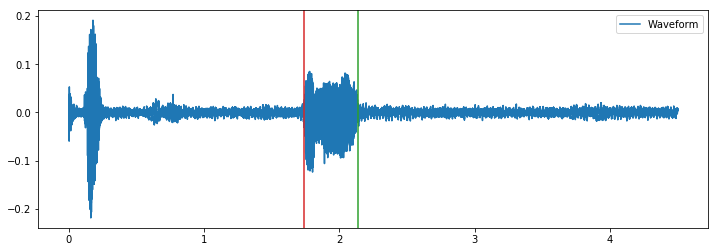

F:/main_total\180627_LNY_C_47_F.wav


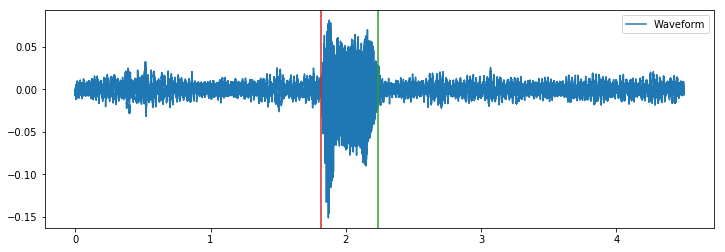

F:/main_total\180627_LNY_C_48_F.wav


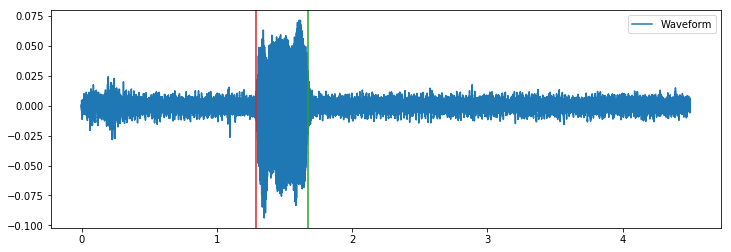

F:/main_total\180627_LNY_C_49_F.wav


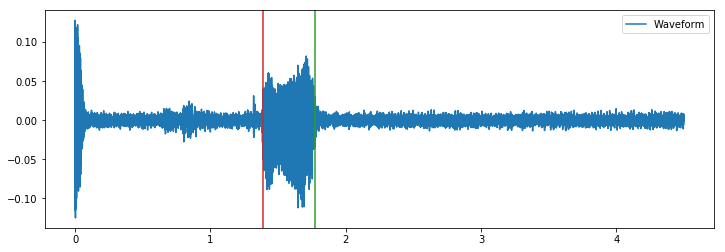

F:/main_total\180627_LNY_C_50_F.wav


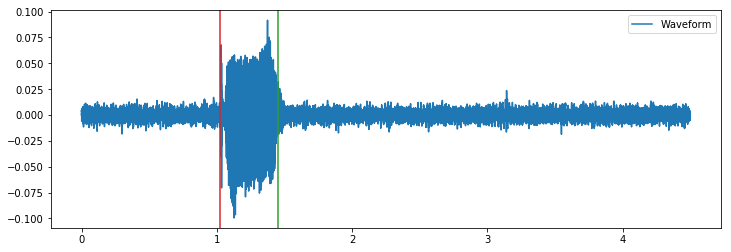

F:/main_total\180627_LNY_C_51_F.wav


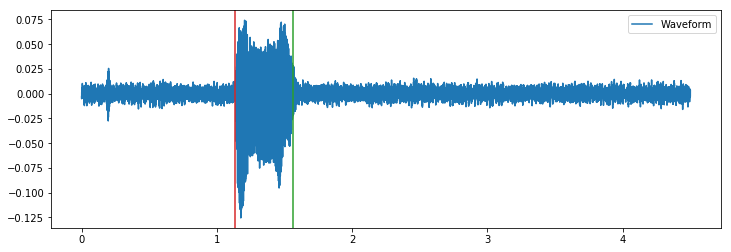

F:/main_total\180627_LNY_C_52_F.wav


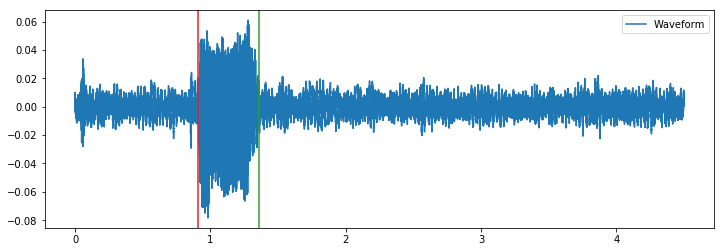

F:/main_total\180627_LNY_C_53_F.wav


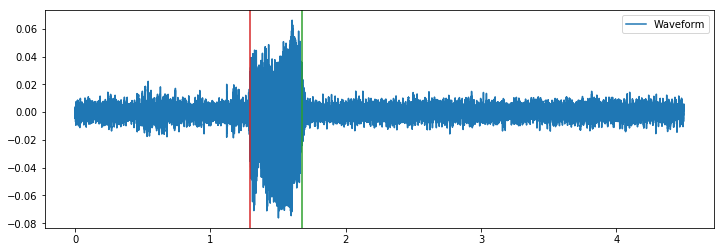

F:/main_total\180627_LNY_C_54_F.wav


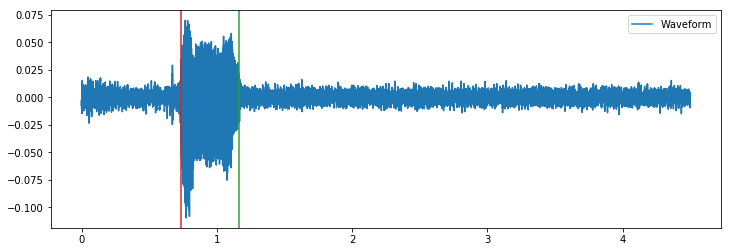

F:/main_total\180627_LNY_C_60_F.wav


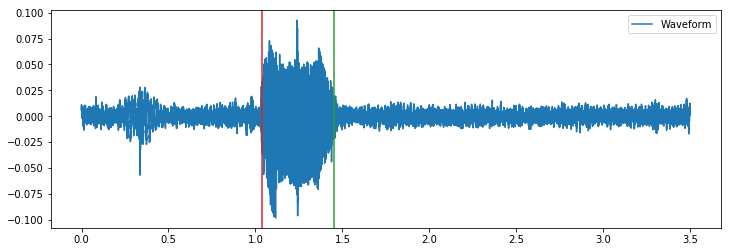

F:/main_total\180627_LNY_C_61_F.wav


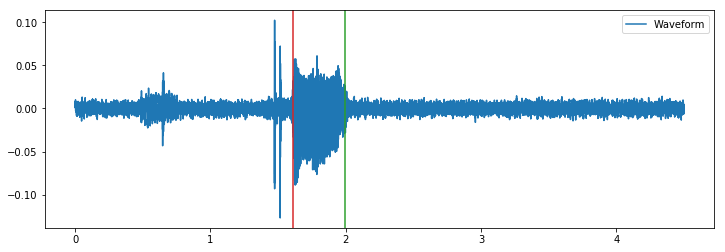

F:/main_total\180627_LNY_C_62_F.wav


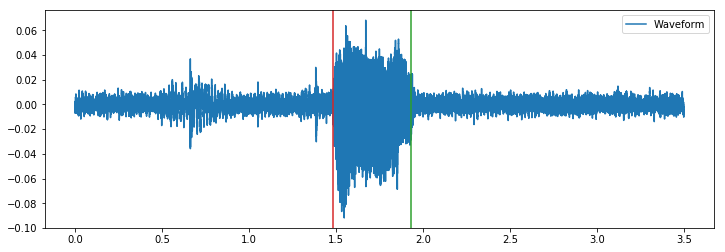

F:/main_total\180627_LNY_C_63_F.wav


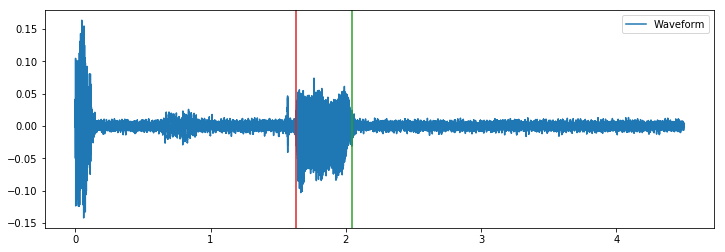

F:/main_total\180627_LNY_C_64_F.wav


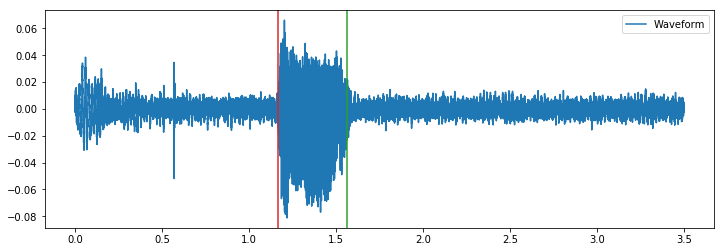

F:/main_total\180627_LNY_C_65_F.wav


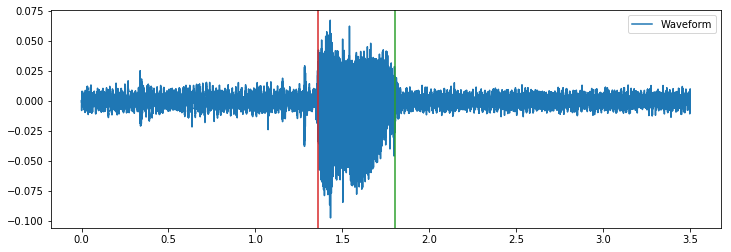

F:/main_total\180627_LNY_C_66_F.wav


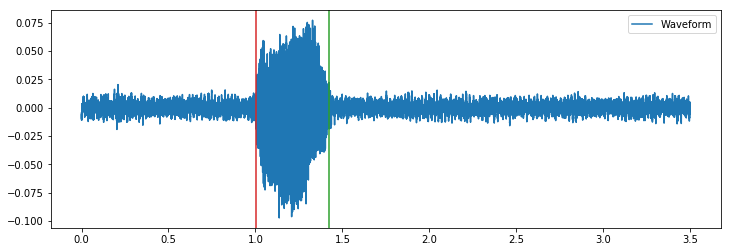

F:/main_total\180627_LNY_C_67_F.wav


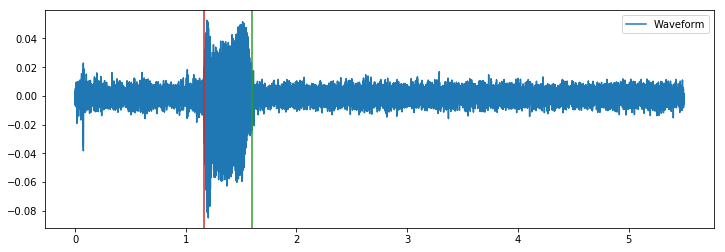

F:/main_total\180627_LNY_C_68_F.wav


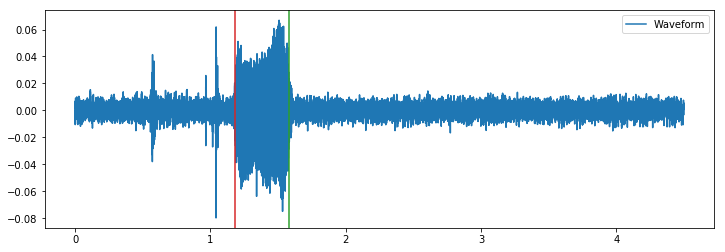

F:/main_total\180627_LNY_C_69_F.wav


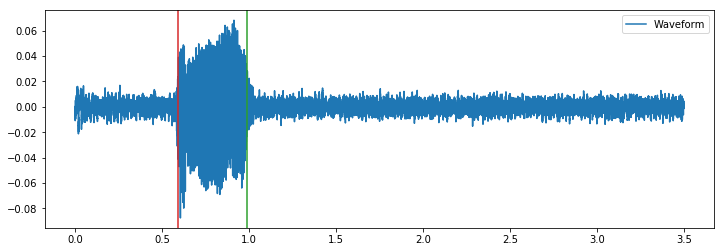

F:/main_total\180629_SYW_C_1_T.wav


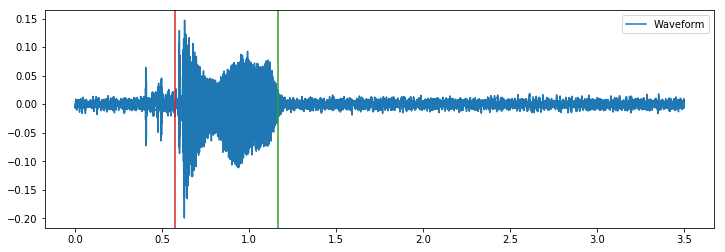

F:/main_total\180629_SYW_C_2_T.wav


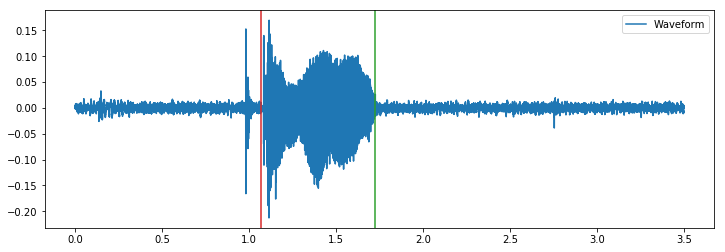

F:/main_total\180629_SYW_C_3_T.wav


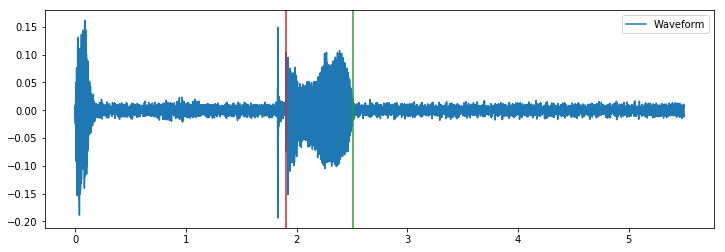

F:/main_total\180629_SYW_C_4_T.wav


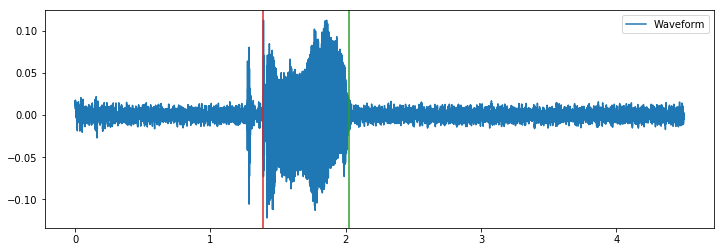

F:/main_total\180629_SYW_C_5_T.wav


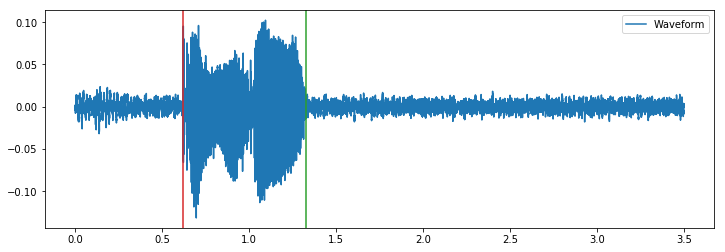

F:/main_total\180629_SYW_C_6_T.wav


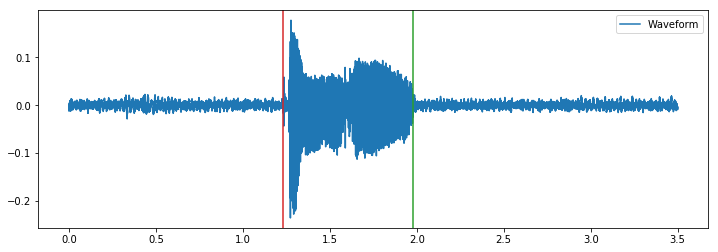

F:/main_total\180629_SYW_C_7_T.wav


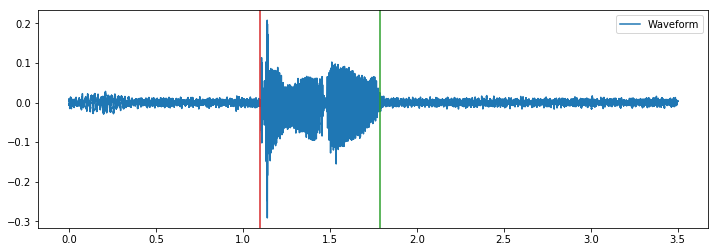

F:/main_total\180629_SYW_C_8_T.wav


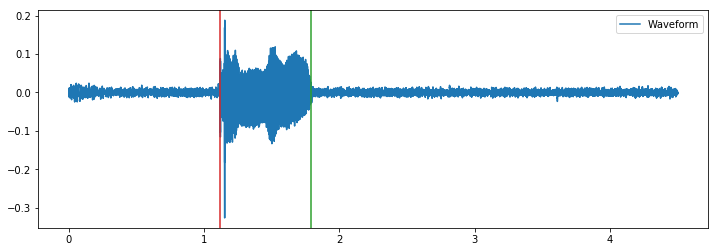

F:/main_total\180629_SYW_C_9_T.wav


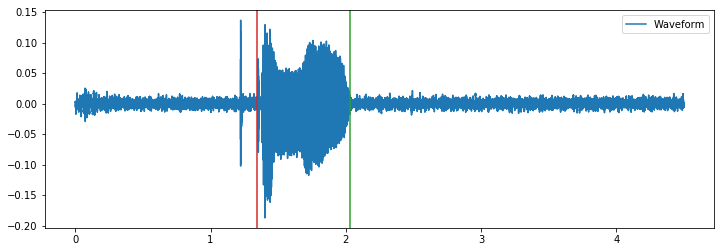

F:/main_total\180629_SYW_C_10_T.wav


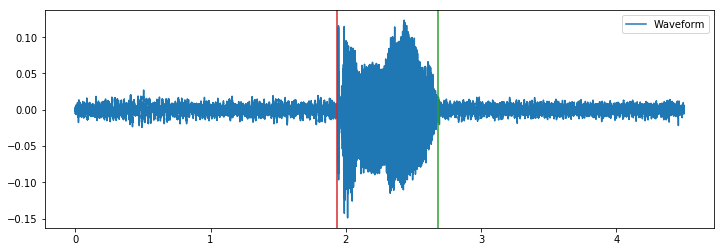

F:/main_total\180629_SYW_C_11_T.wav


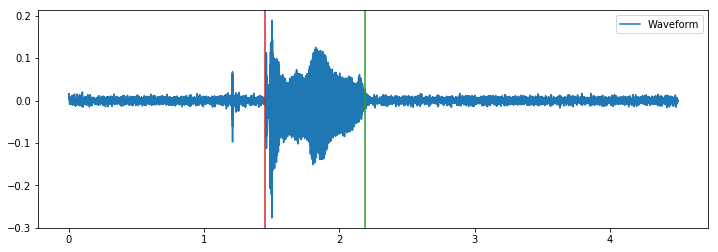

F:/main_total\180629_SYW_C_12_T.wav


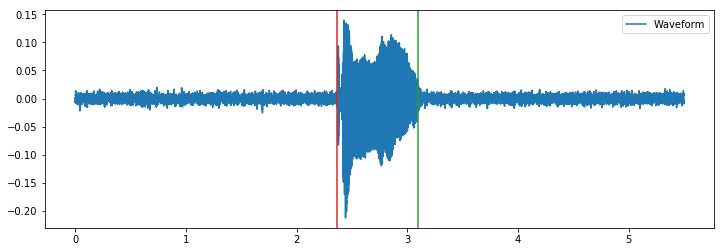

F:/main_total\180629_SYW_C_13_T.wav


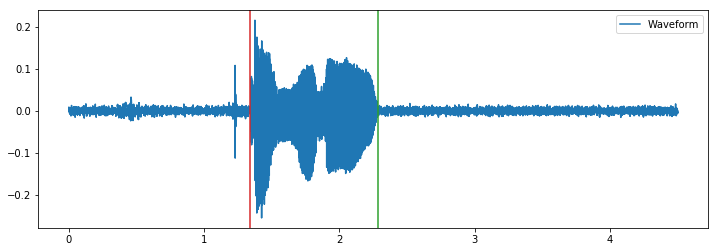

F:/main_total\180629_SYW_C_14_T.wav


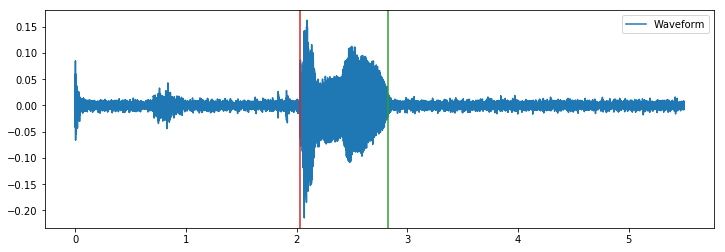

F:/main_total\180629_SYW_C_15_T.wav


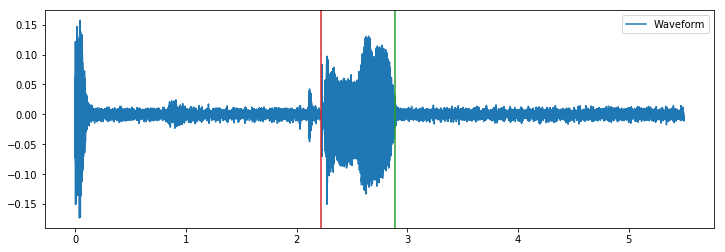

F:/main_total\180629_SYW_C_16_T.wav


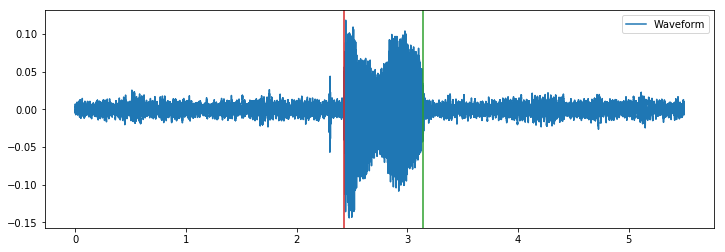

F:/main_total\180629_SYW_C_17_T.wav


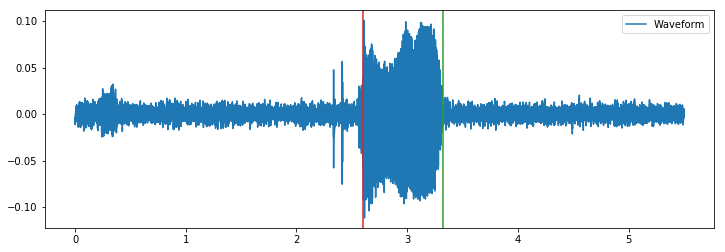

F:/main_total\180629_SYW_C_18_T.wav


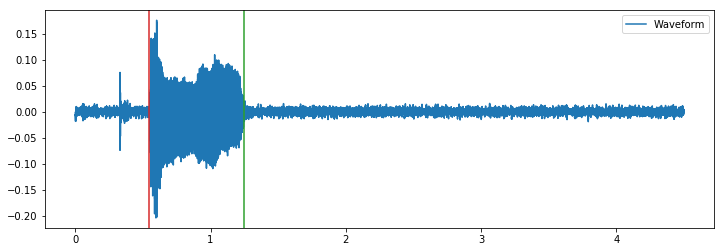

F:/main_total\180629_SYW_C_19_T.wav


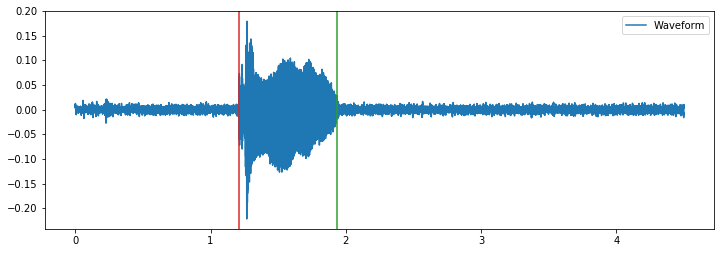

F:/main_total\180629_SYW_C_20_T.wav


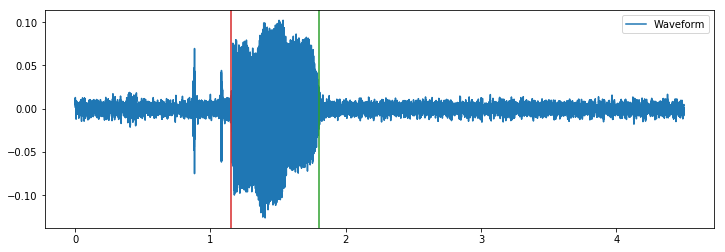

F:/main_total\180629_SYW_C_21_T.wav


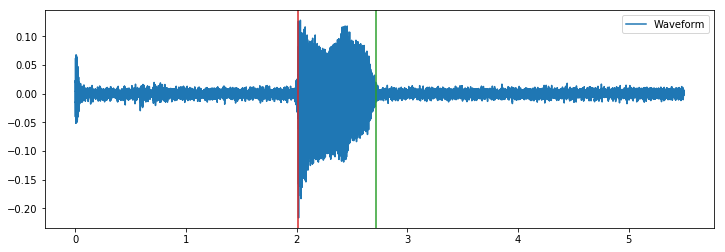

F:/main_total\180629_SYW_C_22_T.wav


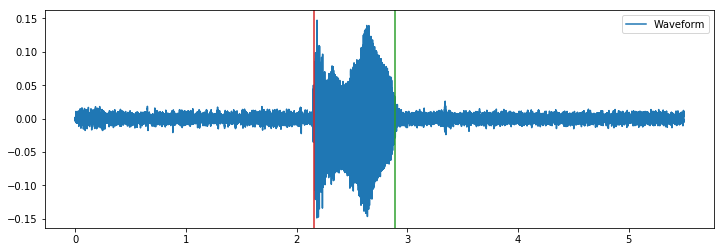

F:/main_total\180629_SYW_C_28_T.wav


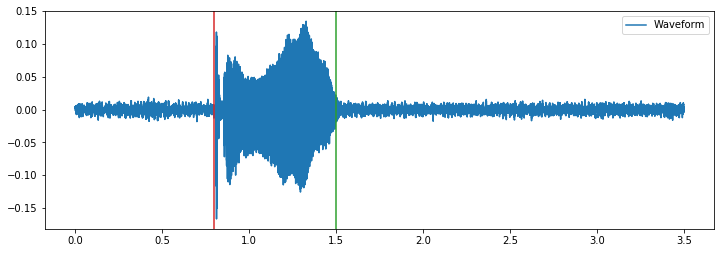

F:/main_total\180629_SYW_C_29_T.wav


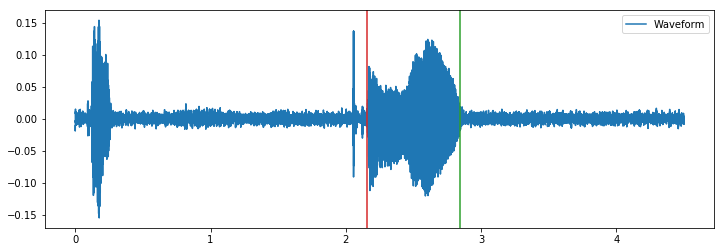

F:/main_total\180629_SYW_C_30_T.wav


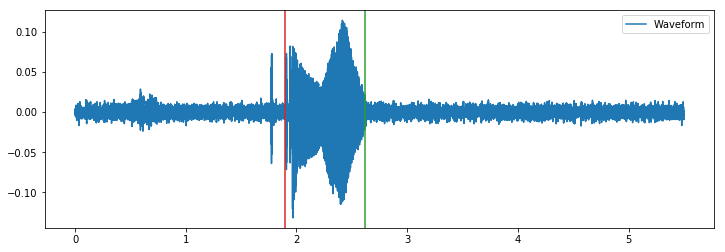

F:/main_total\180629_SYW_C_31_T.wav


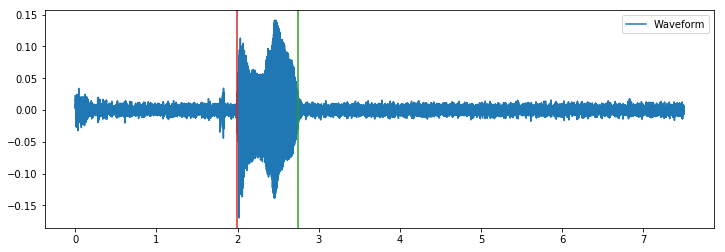

F:/main_total\180629_SYW_C_32_T.wav


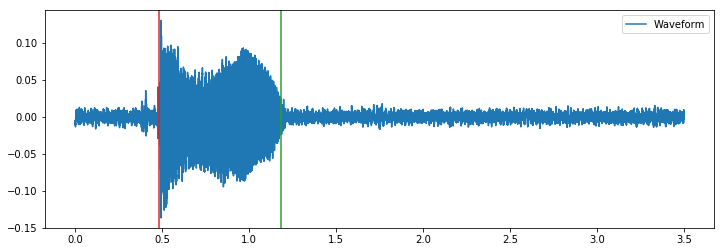

F:/main_total\180629_SYW_C_33_T.wav


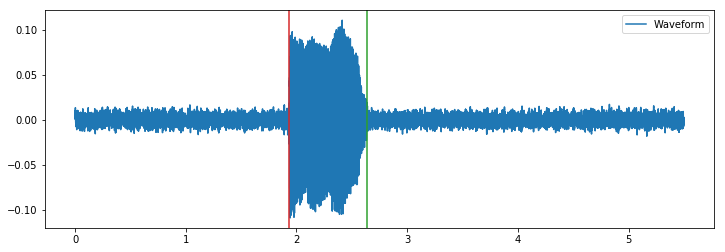

F:/main_total\180629_SYW_C_34_T.wav


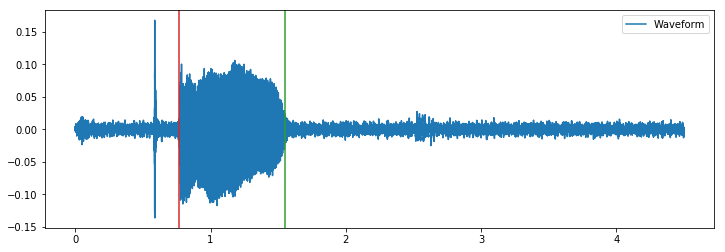

F:/main_total\180629_SYW_C_35_T.wav


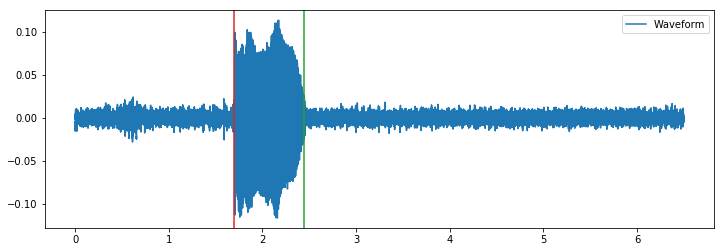

F:/main_total\180629_SYW_C_36_T.wav


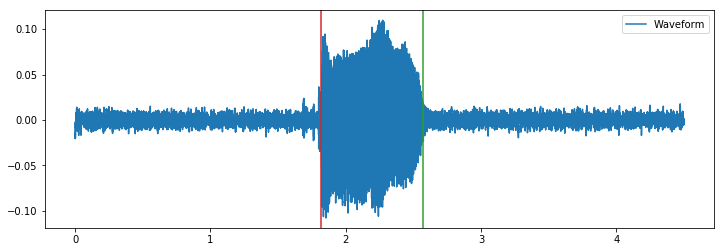

F:/main_total\180629_SYW_C_37_T.wav


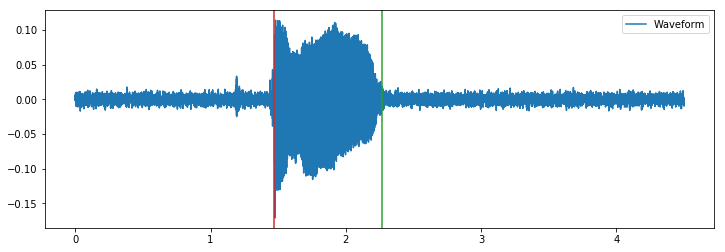

F:/main_total\180629_SYW_C_43_F.wav


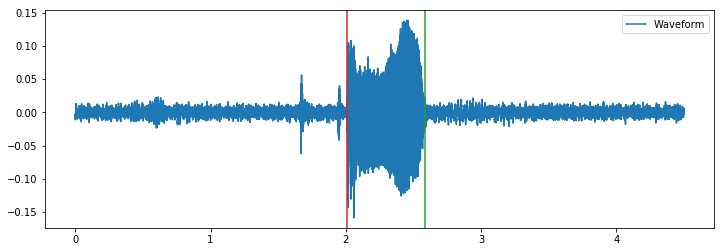

F:/main_total\180629_SYW_C_44_F.wav


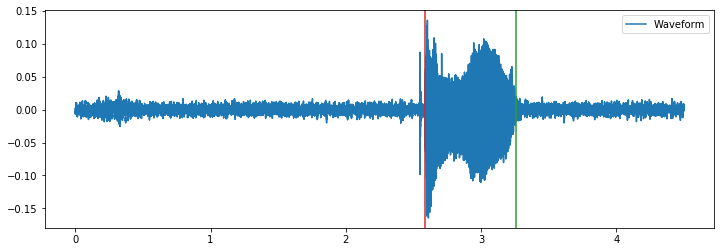

F:/main_total\180629_SYW_C_45_F.wav


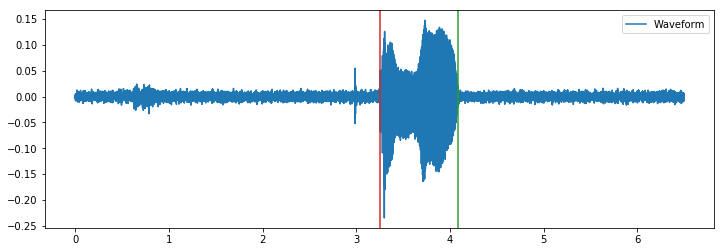

F:/main_total\180629_SYW_C_46_F.wav


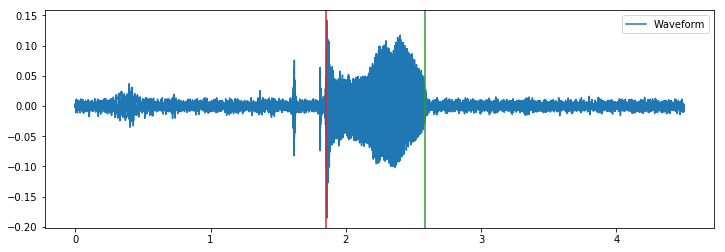

F:/main_total\180629_SYW_C_47_F.wav


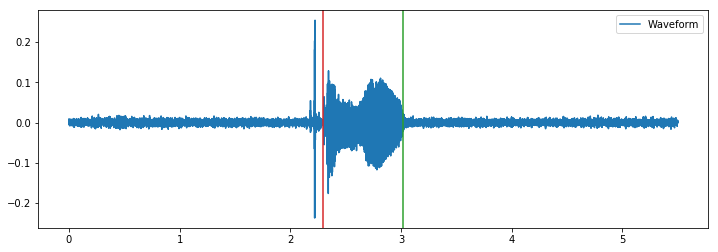

F:/main_total\180629_SYW_C_48_F.wav


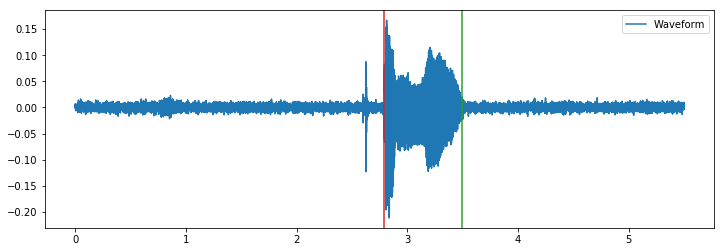

F:/main_total\180629_SYW_C_49_F.wav


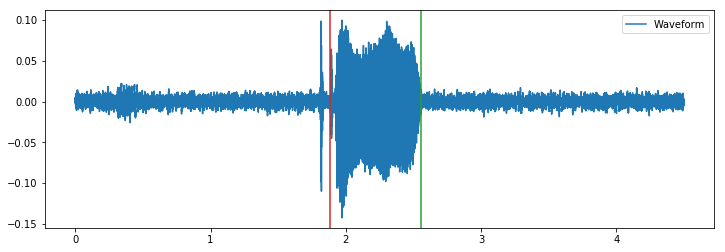

F:/main_total\180629_SYW_C_50_F.wav


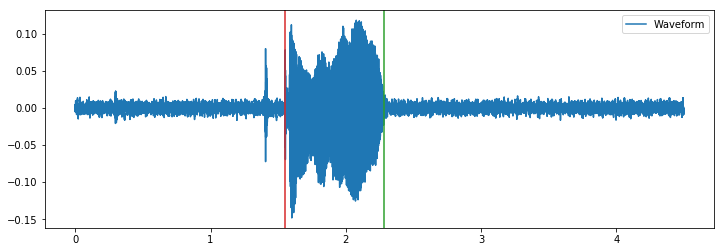

F:/main_total\180629_SYW_C_51_F.wav


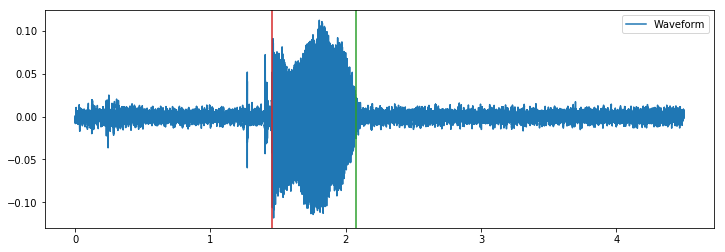

F:/main_total\180629_SYW_C_52_F.wav


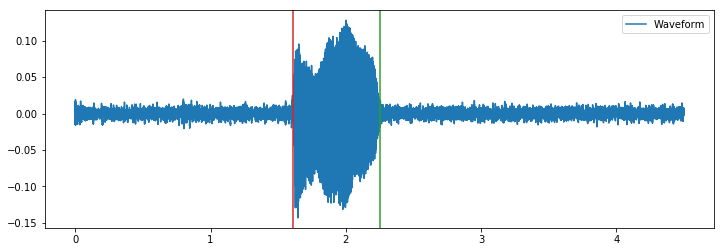

F:/main_total\180629_SYW_C_53_F.wav


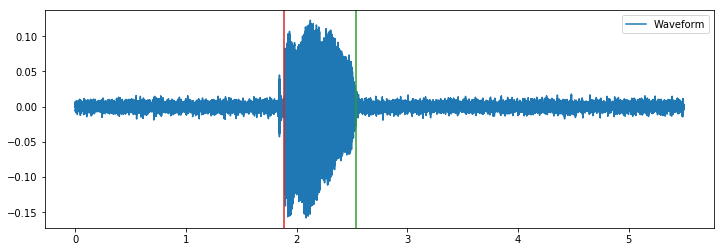

F:/main_total\180629_SYW_C_54_F.wav


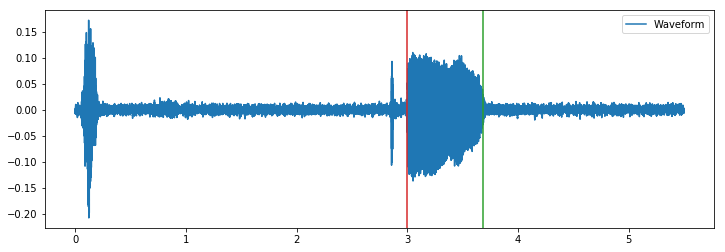

F:/main_total\180629_SYW_C_60_F.wav


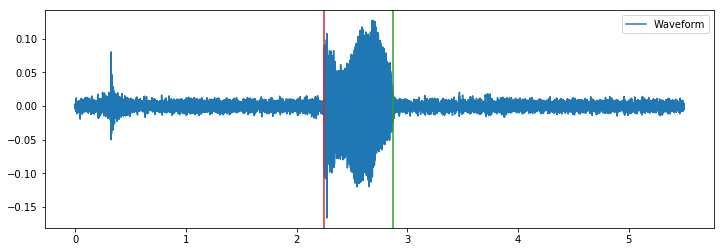

F:/main_total\180629_SYW_C_61_F.wav


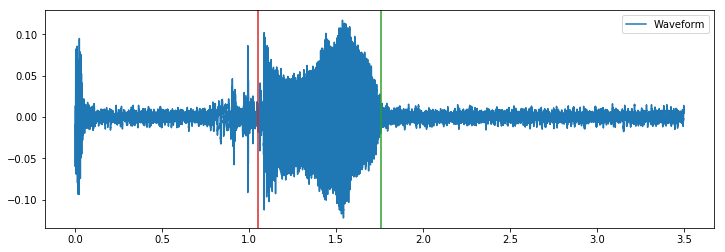

F:/main_total\180629_SYW_C_62_F.wav


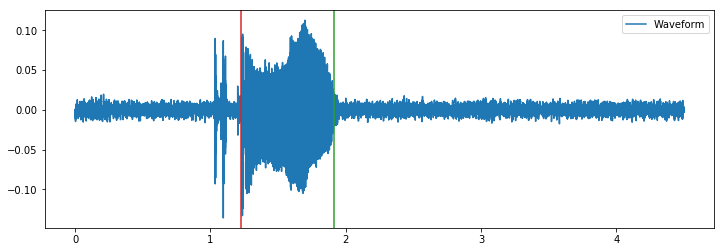

F:/main_total\180629_SYW_C_63_F.wav


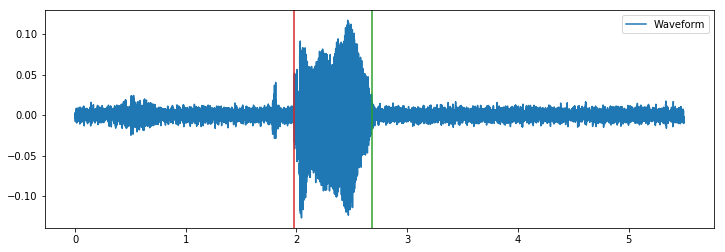

F:/main_total\180629_SYW_C_64_F.wav


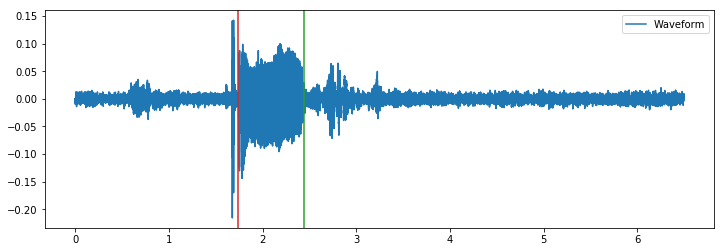

F:/main_total\180629_SYW_C_65_F.wav


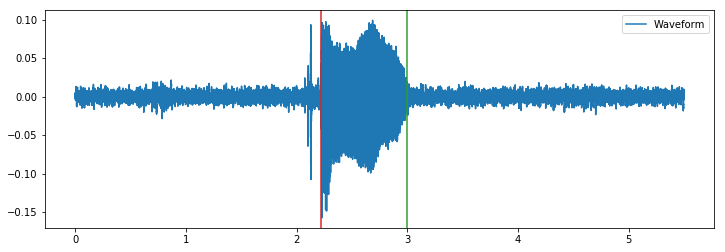

F:/main_total\180629_SYW_C_66_F.wav


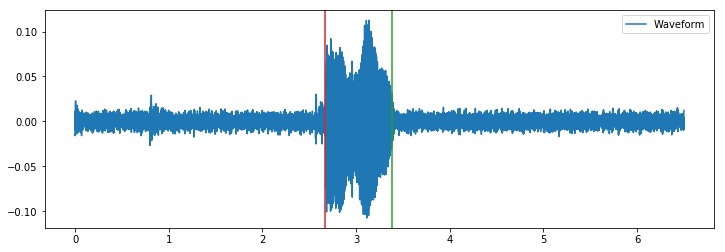

F:/main_total\180629_SYW_C_67_F.wav


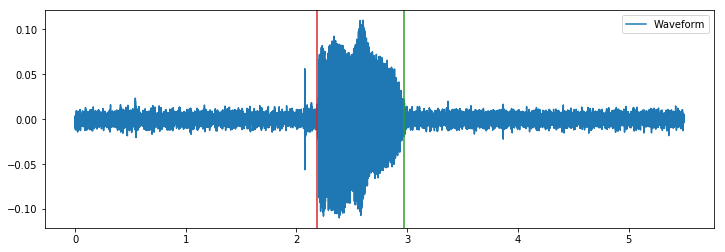

F:/main_total\180629_SYW_C_68_F.wav


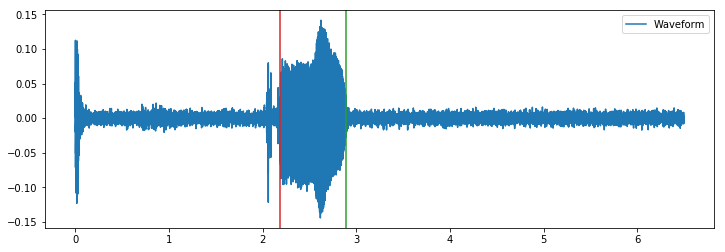

F:/main_total\180629_SYW_C_69_F.wav


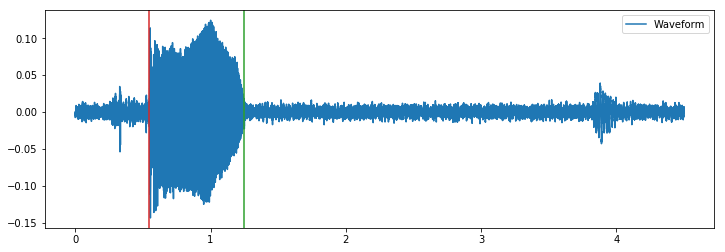

F:/main_total\180629_PHJ_C_1_T.wav


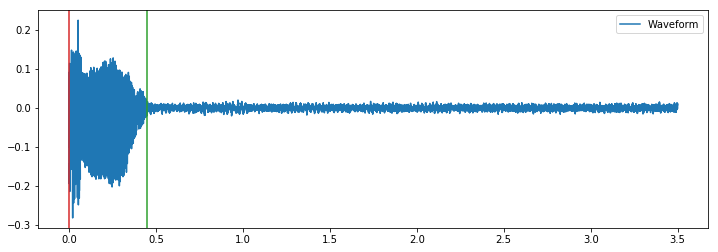

F:/main_total\180629_PHJ_C_2_T.wav


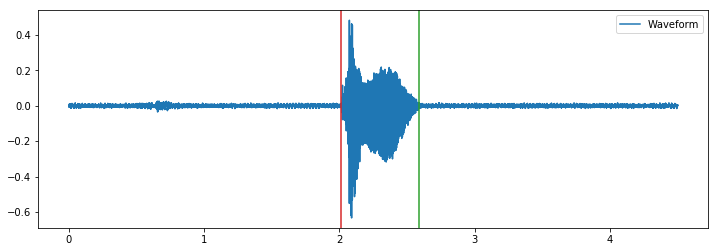

F:/main_total\180629_PHJ_C_3_T.wav


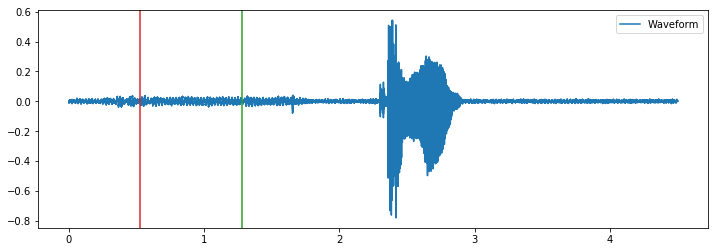

F:/main_total\180629_PHJ_C_4_T.wav


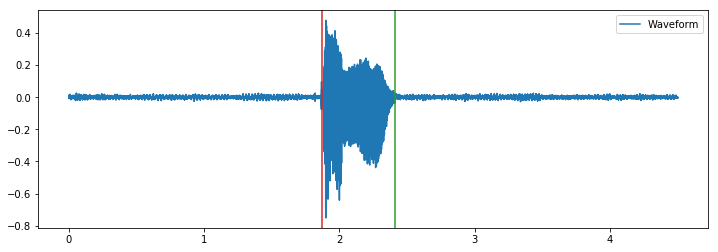

F:/main_total\180629_PHJ_C_5_T.wav


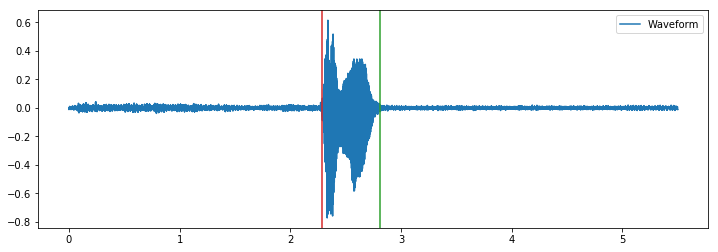

F:/main_total\180629_PHJ_C_6_T.wav


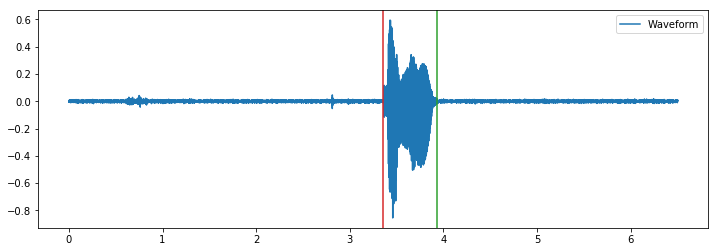

F:/main_total\180629_PHJ_C_7_T.wav


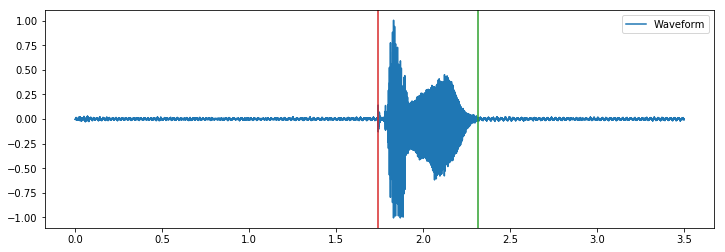

F:/main_total\180629_PHJ_C_8_T.wav


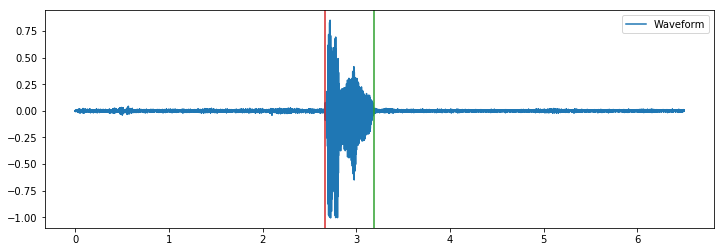

F:/main_total\180629_PHJ_C_9_T.wav


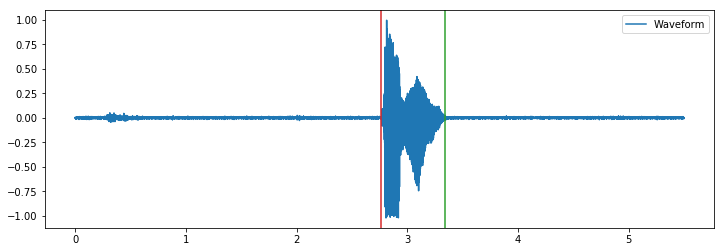

F:/main_total\180629_PHJ_C_10_T.wav


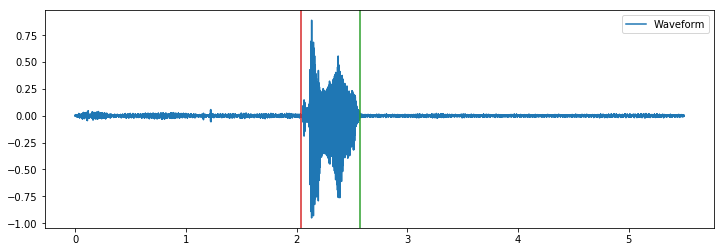

F:/main_total\180629_PHJ_C_11_T.wav


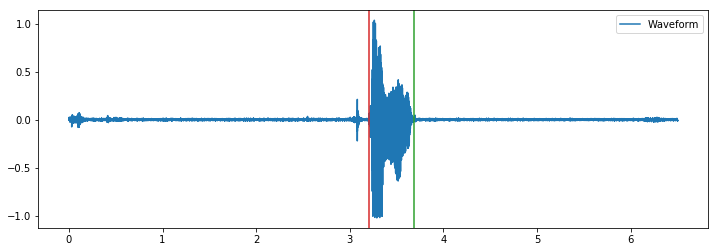

F:/main_total\180629_PHJ_C_12_T.wav


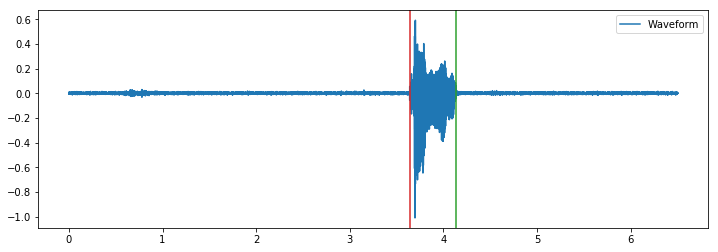

F:/main_total\180629_PHJ_C_13_T.wav


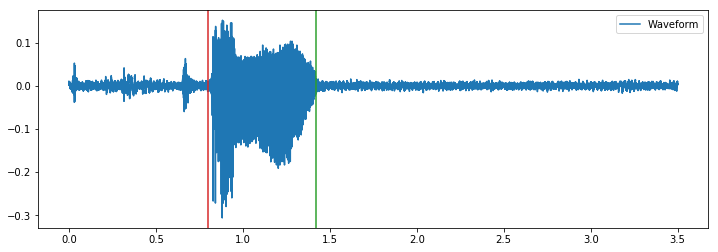

F:/main_total\180629_PHJ_C_14_T.wav


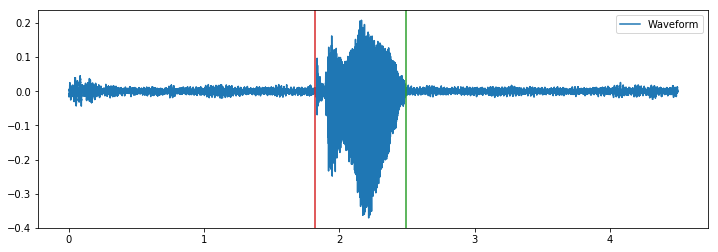

F:/main_total\180629_PHJ_C_15_T.wav


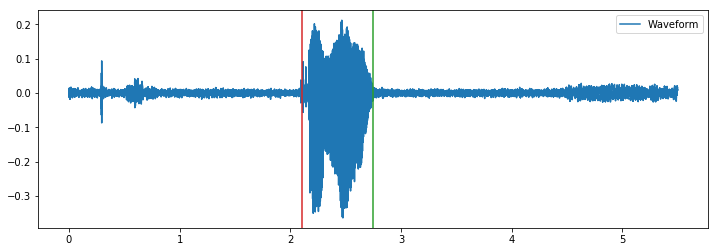

F:/main_total\180629_PHJ_C_16_T.wav


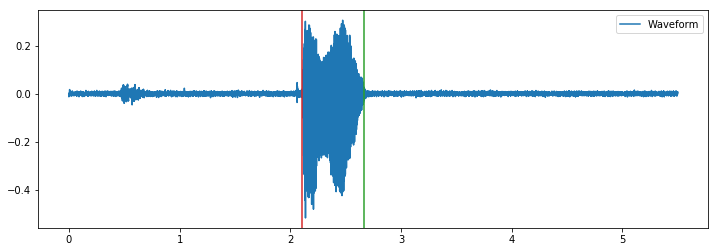

F:/main_total\180629_PHJ_C_17_T.wav


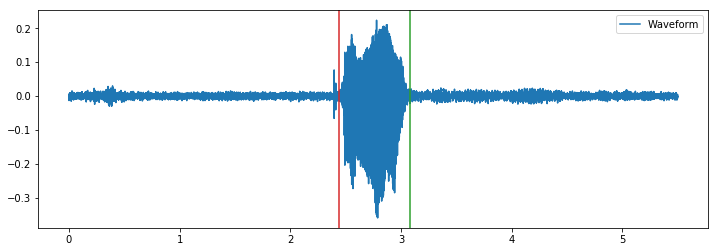

F:/main_total\180629_PHJ_C_18_T.wav


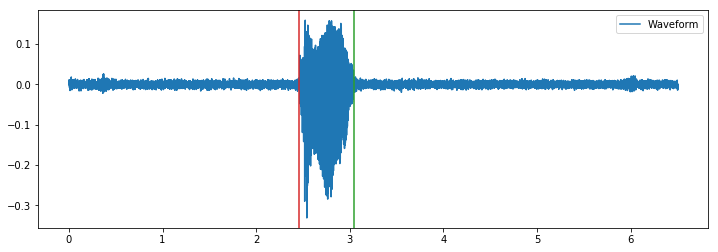

F:/main_total\180629_PHJ_C_19_T.wav


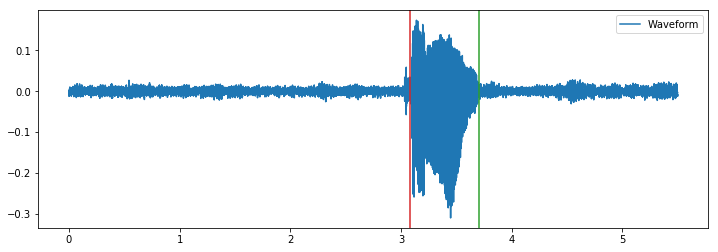

F:/main_total\180629_PHJ_C_20_T.wav


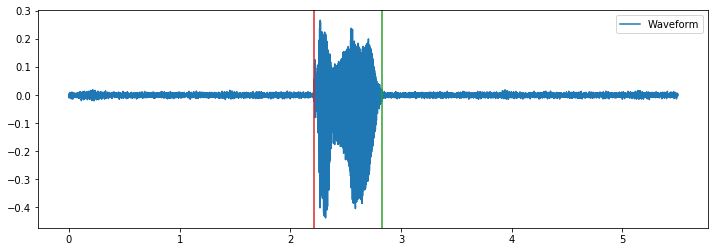

F:/main_total\180629_PHJ_C_21_T.wav


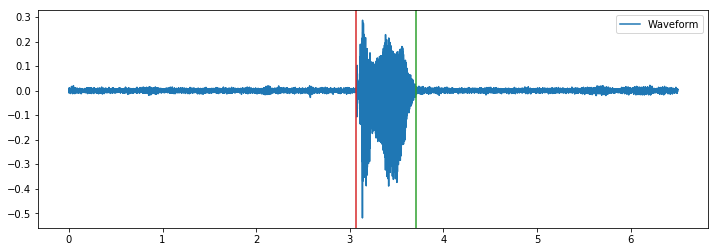

F:/main_total\180629_PHJ_C_22_T.wav


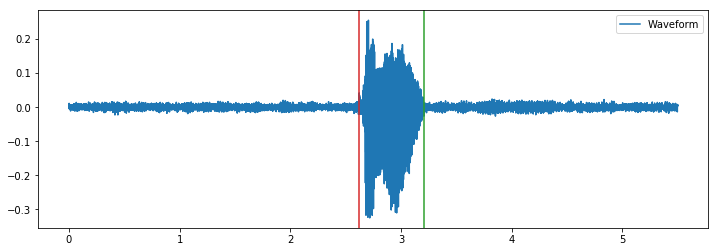

F:/main_total\180629_PHJ_C_28_T.wav


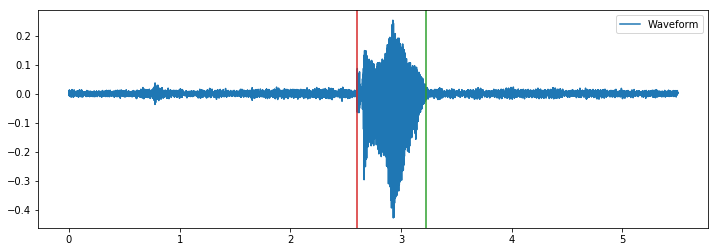

F:/main_total\180629_PHJ_C_29_T.wav


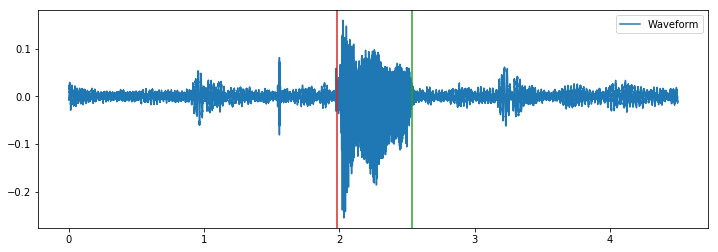

F:/main_total\180629_PHJ_C_30_T.wav


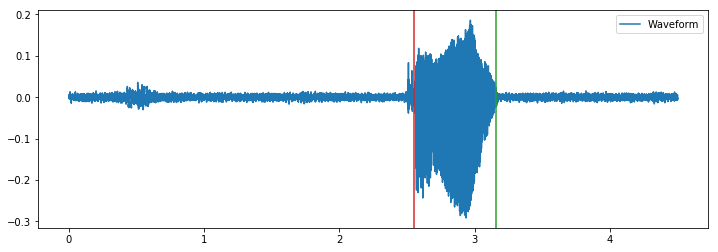

F:/main_total\180629_PHJ_C_31_T.wav


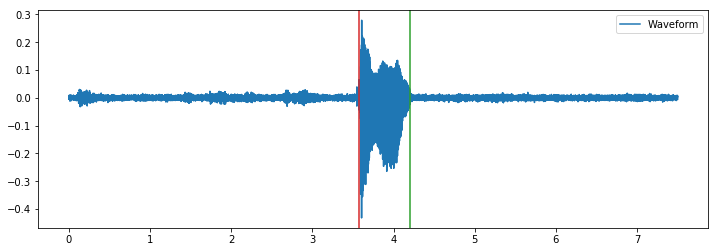

F:/main_total\180629_PHJ_C_32_T.wav


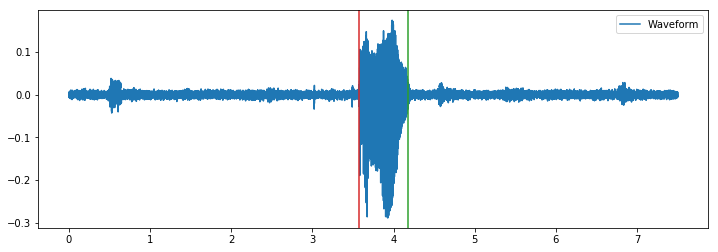

F:/main_total\180629_PHJ_C_33_T.wav


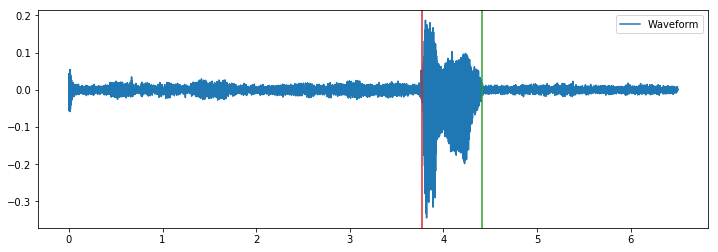

F:/main_total\180629_PHJ_C_34_T.wav


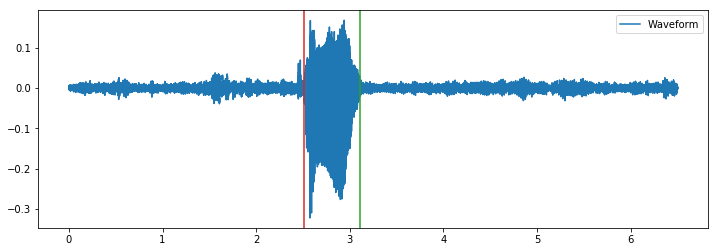

F:/main_total\180629_PHJ_C_35_T.wav


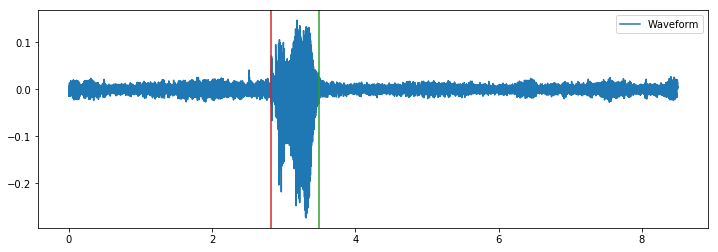

F:/main_total\180629_PHJ_C_36_T.wav


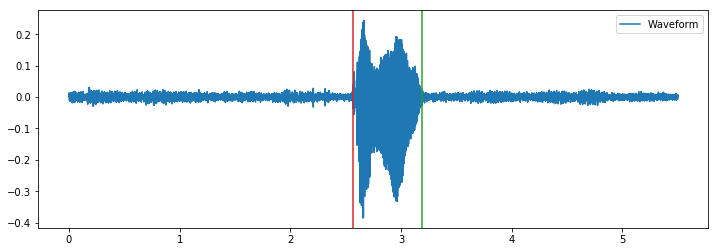

F:/main_total\180629_PHJ_C_37_T.wav


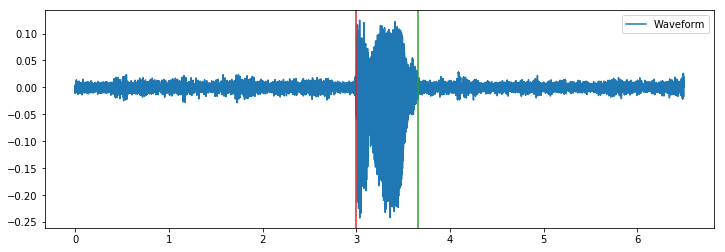

F:/main_total\180629_PHJ_C_43_F.wav


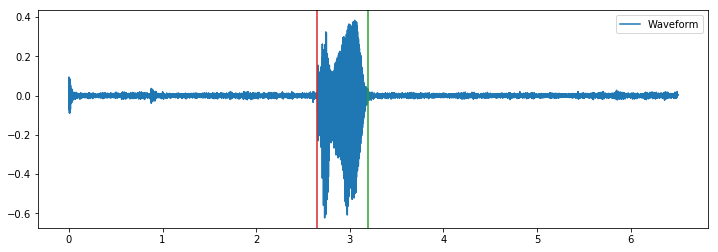

F:/main_total\180629_PHJ_C_44_F.wav


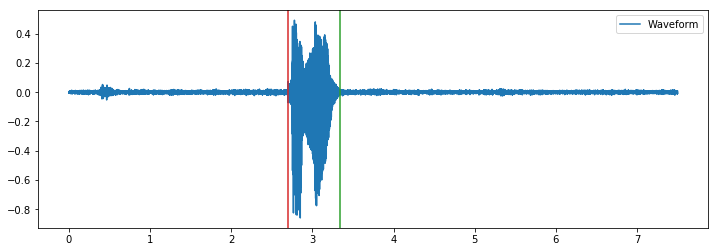

F:/main_total\180629_PHJ_C_45_F.wav


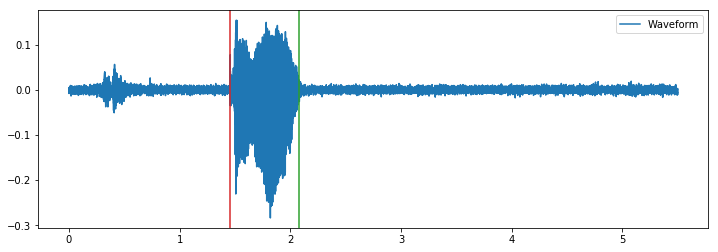

F:/main_total\180629_PHJ_C_46_F.wav


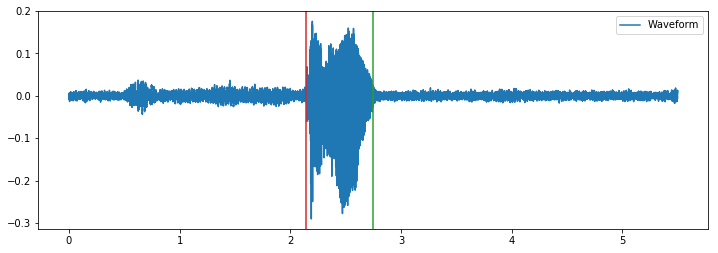

F:/main_total\180629_PHJ_C_47_F.wav


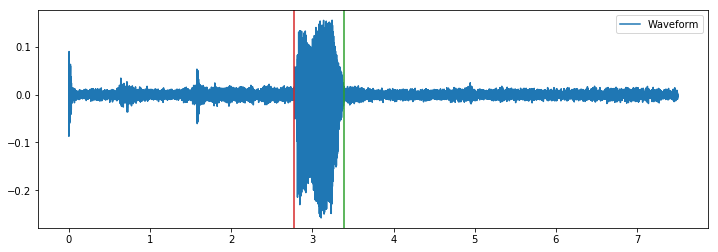

F:/main_total\180629_PHJ_C_48_F.wav


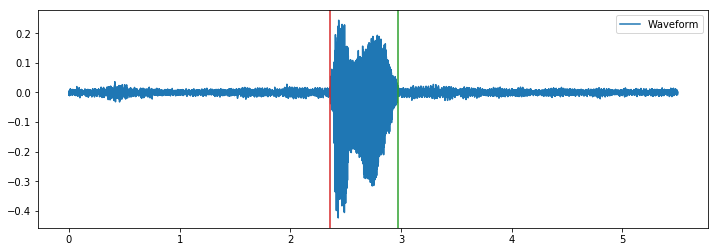

F:/main_total\180629_PHJ_C_49_F.wav


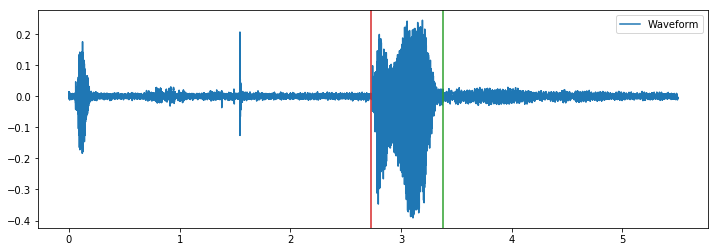

F:/main_total\180629_PHJ_C_50_F.wav


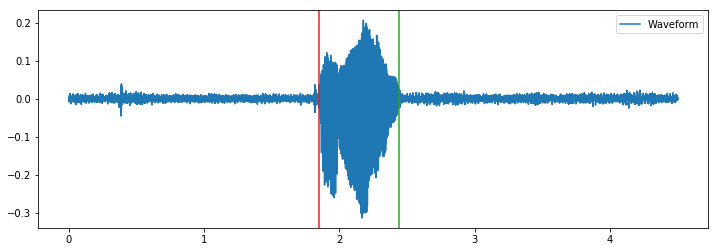

F:/main_total\180629_PHJ_C_51_F.wav


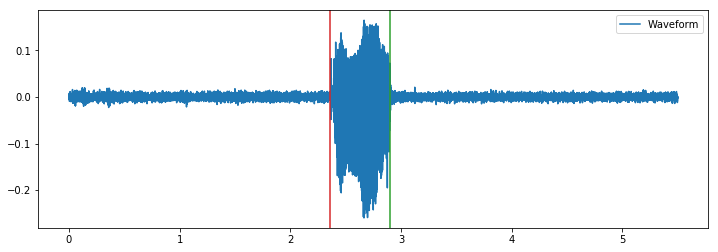

F:/main_total\180629_PHJ_C_52_F.wav


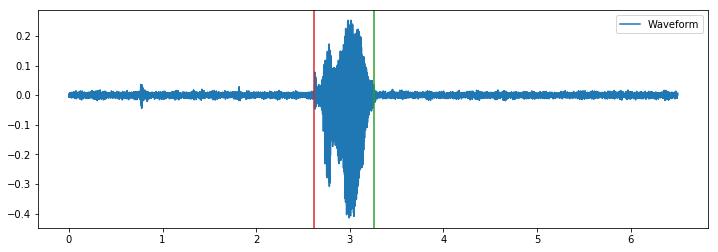

F:/main_total\180629_PHJ_C_53_F.wav


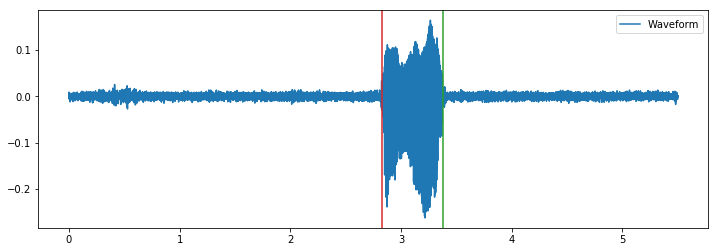

F:/main_total\180629_PHJ_C_54_F.wav


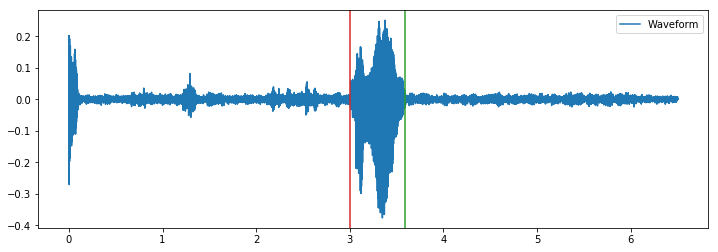

F:/main_total\180629_PHJ_C_60_F.wav


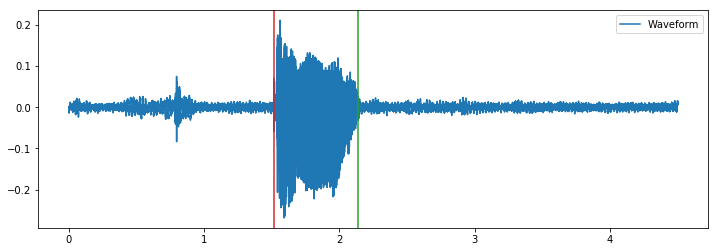

F:/main_total\180629_PHJ_C_61_F.wav


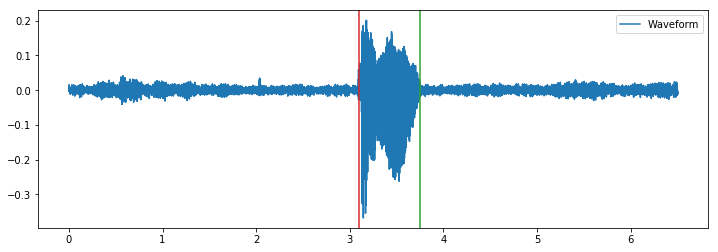

F:/main_total\180629_PHJ_C_62_F.wav


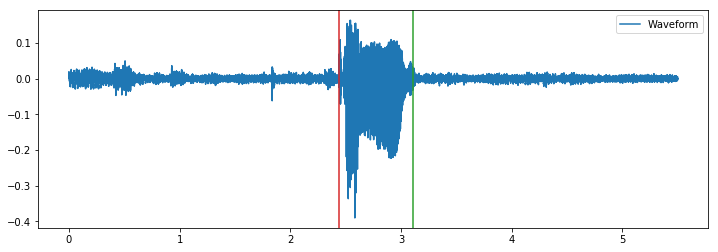

F:/main_total\180629_PHJ_C_63_F.wav


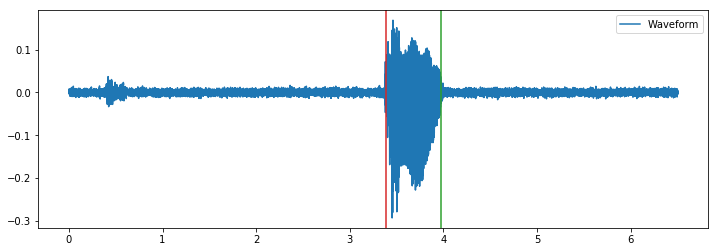

F:/main_total\180629_PHJ_C_64_F.wav


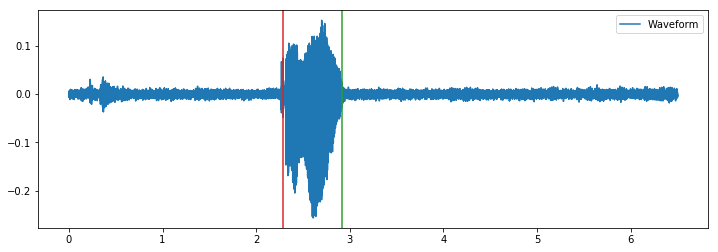

F:/main_total\180629_PHJ_C_65_F.wav


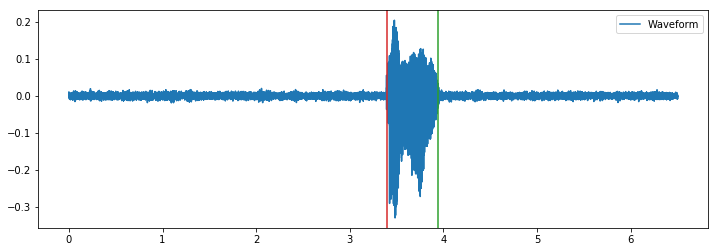

F:/main_total\180629_PHJ_C_66_F.wav


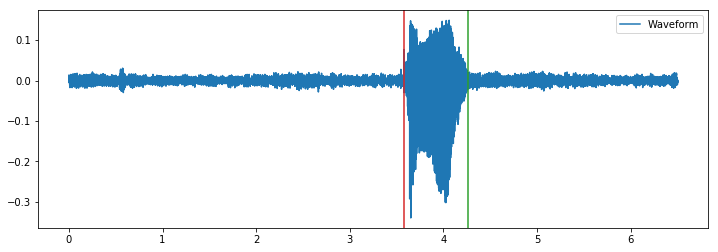

F:/main_total\180629_PHJ_C_67_F.wav


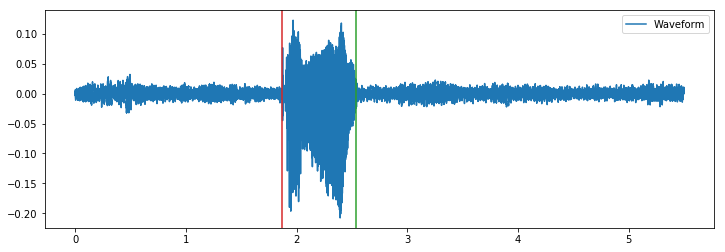

F:/main_total\180629_PHJ_C_68_F.wav


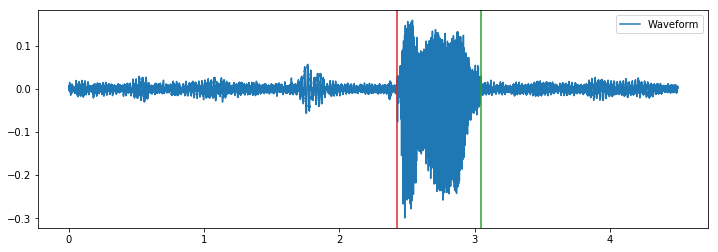

F:/main_total\180629_PHJ_C_69_F.wav


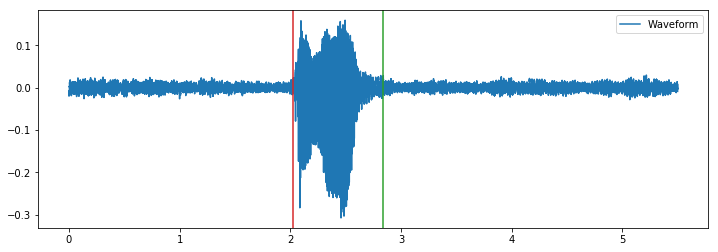

F:/main_total\180918_PMJ_C_1_T.wav


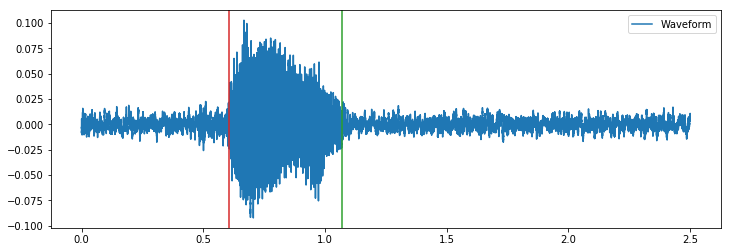

F:/main_total\180918_PMJ_C_2_T.wav


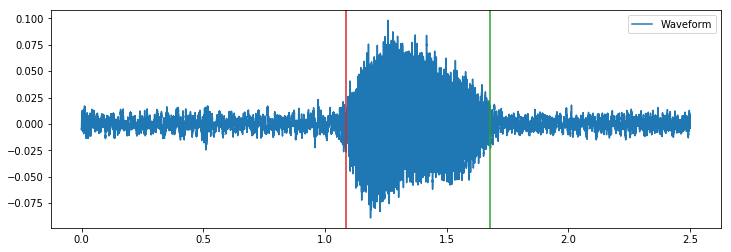

F:/main_total\180918_PMJ_C_3_T.wav


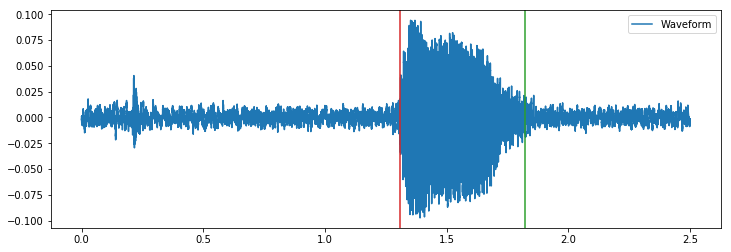

F:/main_total\180918_PMJ_C_4_T.wav


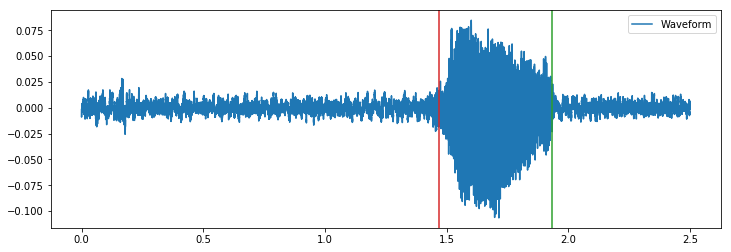

F:/main_total\180918_PMJ_C_5_T.wav


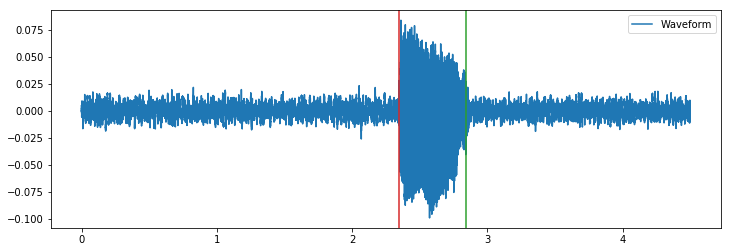

F:/main_total\180918_PMJ_C_6_T.wav


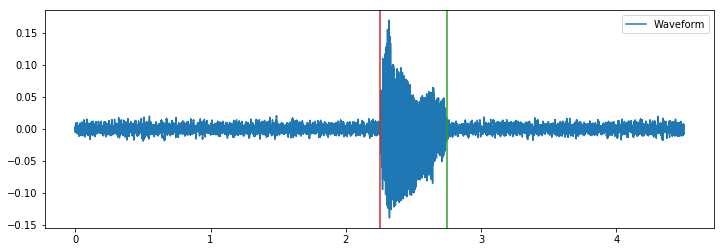

F:/main_total\180918_PMJ_C_7_T.wav


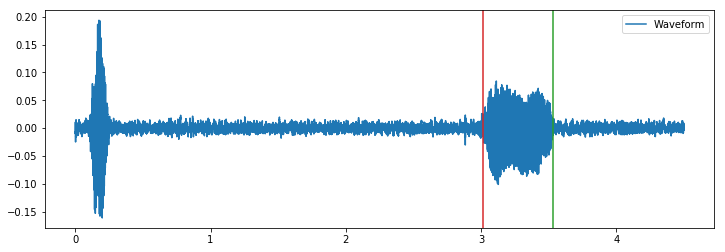

F:/main_total\180918_PMJ_C_8_T.wav


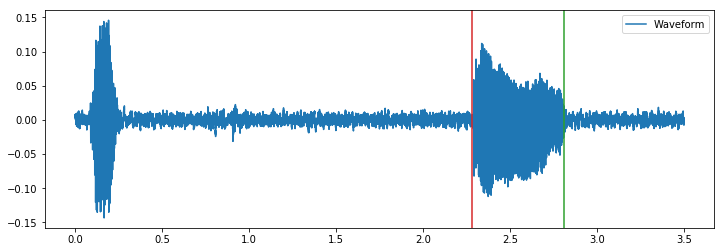

F:/main_total\180918_PMJ_C_9_T.wav


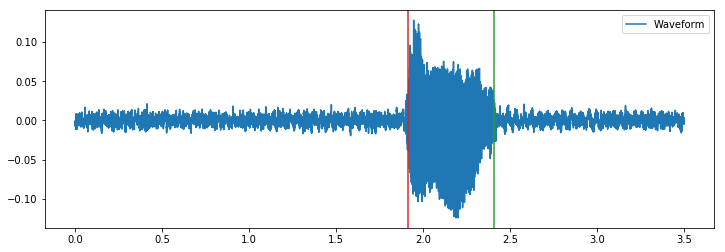

F:/main_total\180918_PMJ_C_10_T.wav


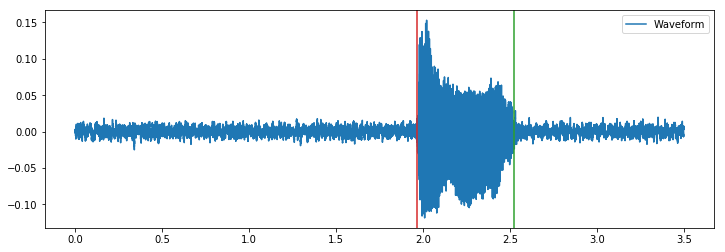

F:/main_total\180918_PMJ_C_11_T.wav


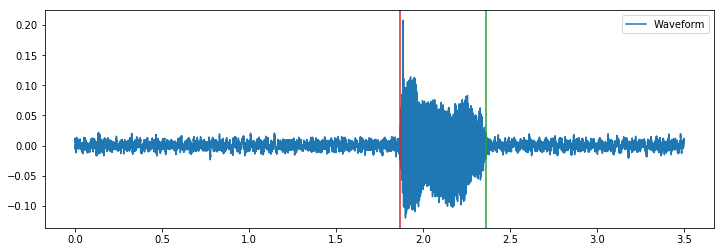

F:/main_total\180918_PMJ_C_12_T.wav


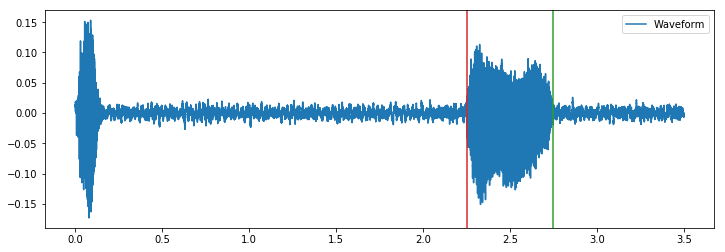

F:/main_total\180918_PMJ_C_13_T.wav


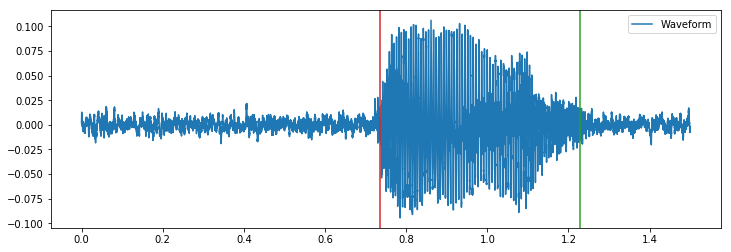

F:/main_total\180918_PMJ_C_14_T.wav


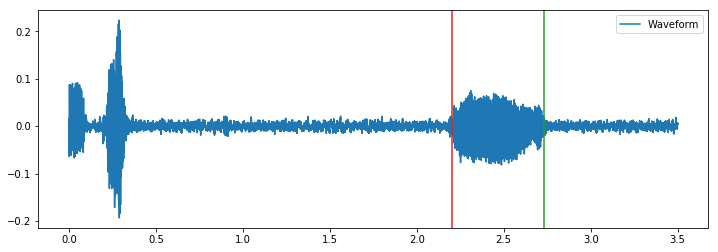

F:/main_total\180918_PMJ_C_15_T.wav


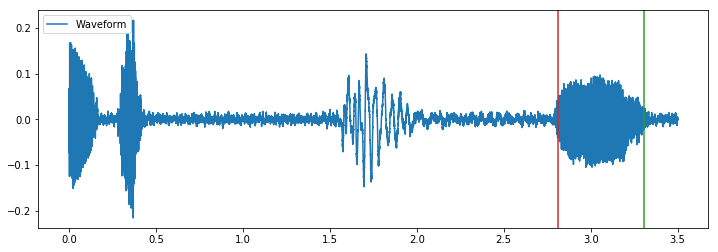

F:/main_total\180918_PMJ_C_16_T.wav


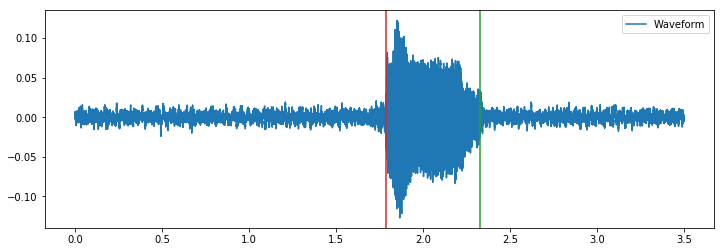

F:/main_total\180918_PMJ_C_17_T.wav


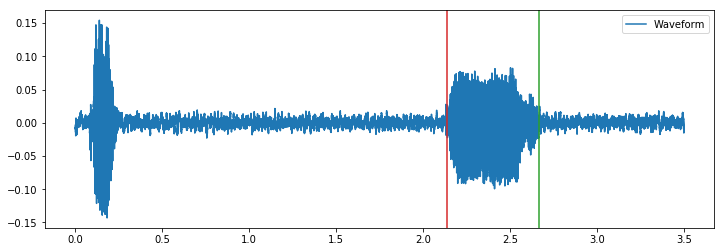

F:/main_total\180918_PMJ_C_18_T.wav


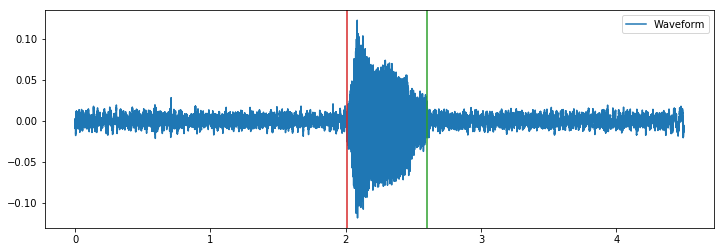

F:/main_total\180918_PMJ_C_19_T.wav


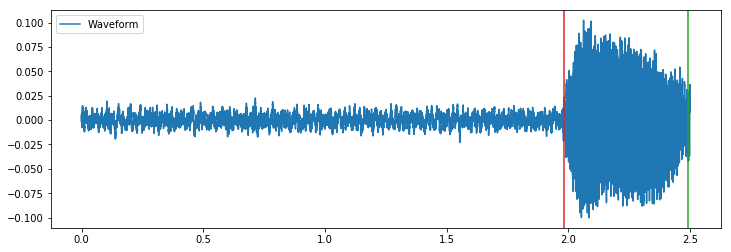

F:/main_total\180918_PMJ_C_20_T.wav


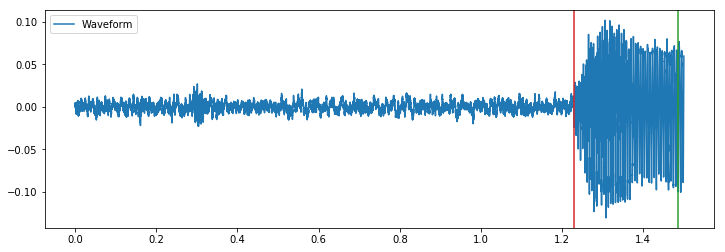

F:/main_total\180918_PMJ_C_21_T.wav


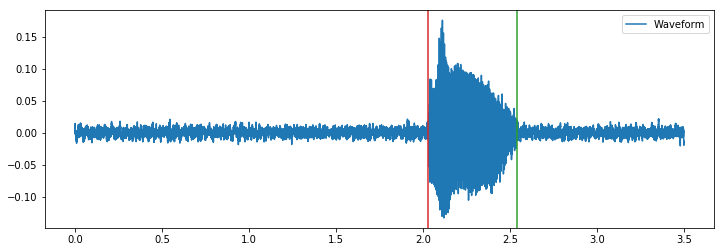

F:/main_total\180918_PMJ_C_22_T.wav


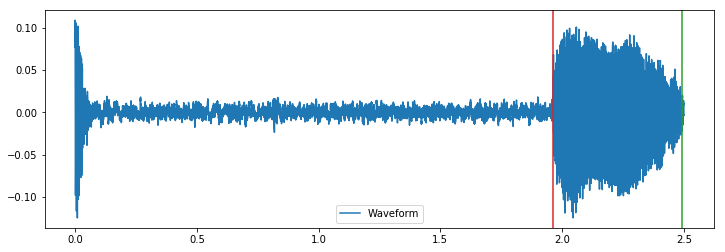

F:/main_total\180918_PMJ_C_28_T.wav


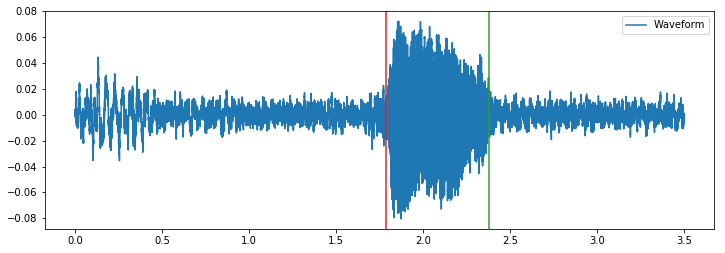

F:/main_total\180918_PMJ_C_29_T.wav


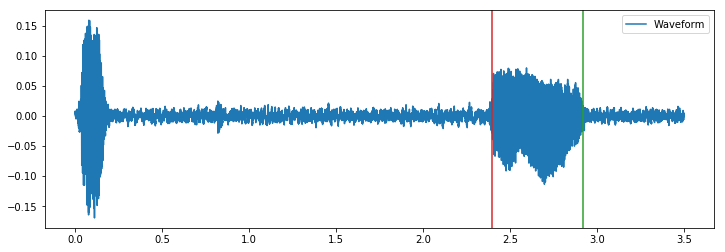

F:/main_total\180918_PMJ_C_30_T.wav


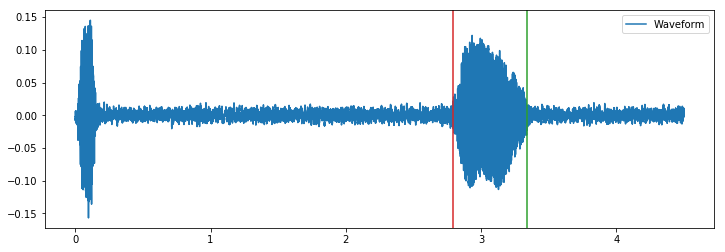

F:/main_total\180918_PMJ_C_31_T.wav


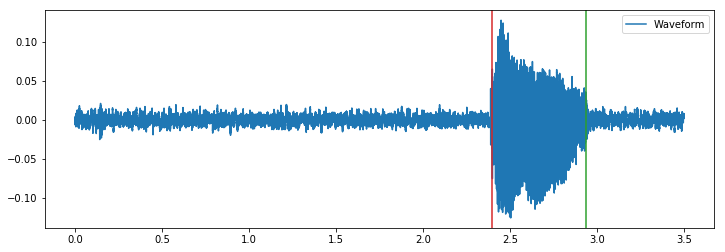

F:/main_total\180918_PMJ_C_32_T.wav


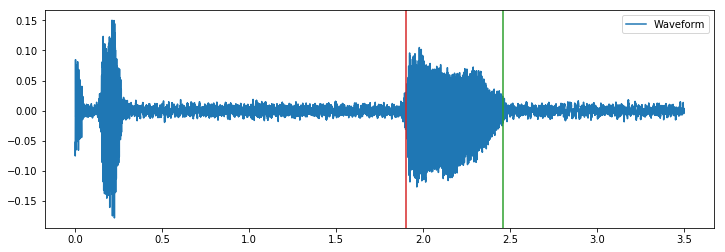

F:/main_total\180918_PMJ_C_33_T.wav


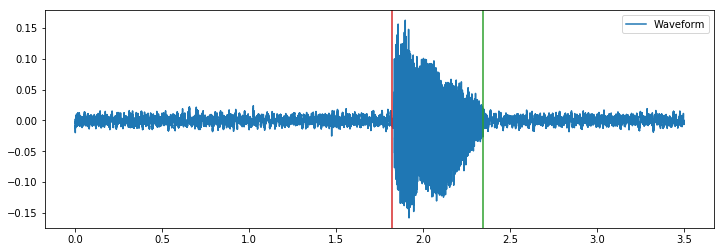

F:/main_total\180918_PMJ_C_34_T.wav


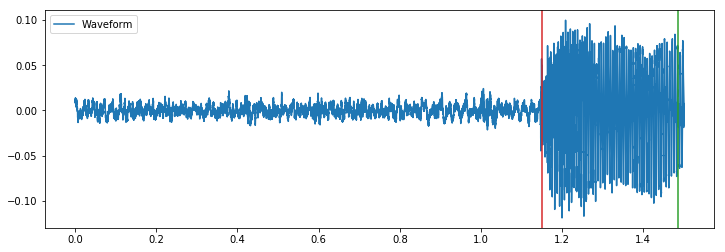

F:/main_total\180918_PMJ_C_35_T.wav


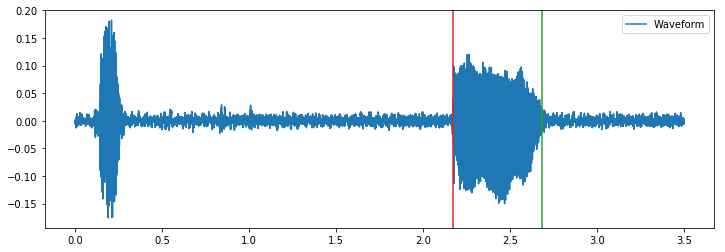

F:/main_total\180918_PMJ_C_36_T.wav


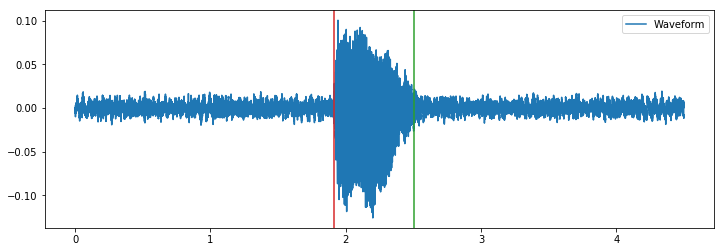

F:/main_total\180918_PMJ_C_37_T.wav


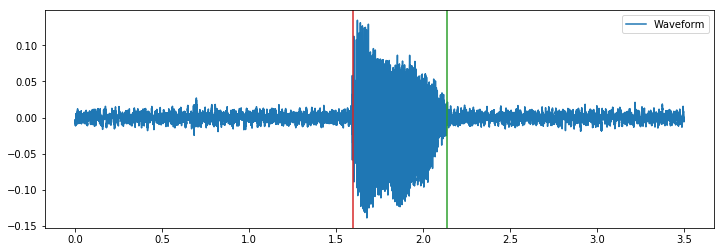

F:/main_total\180918_PMJ_C_43_F.wav


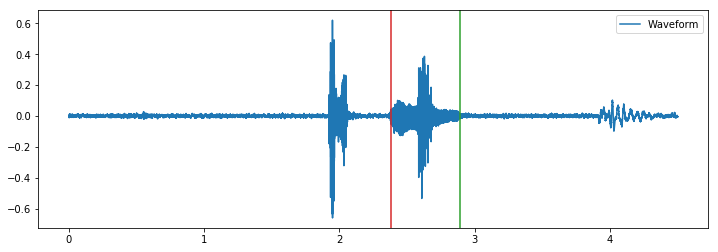

F:/main_total\180918_PMJ_C_44_F.wav


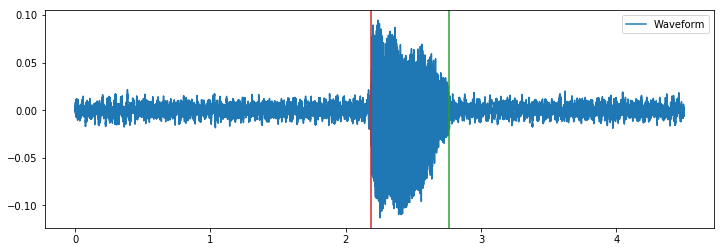

F:/main_total\180918_PMJ_C_45_F.wav


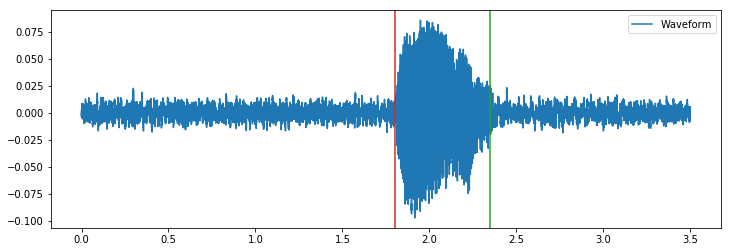

F:/main_total\180918_PMJ_C_46_F.wav


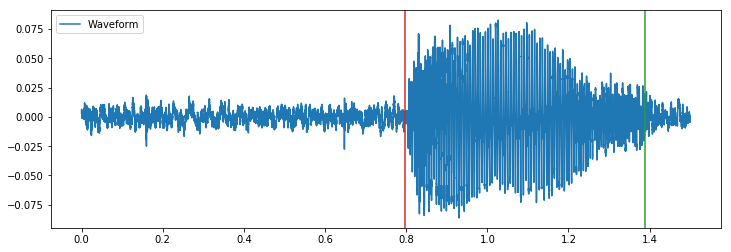

F:/main_total\180918_PMJ_C_47_F.wav


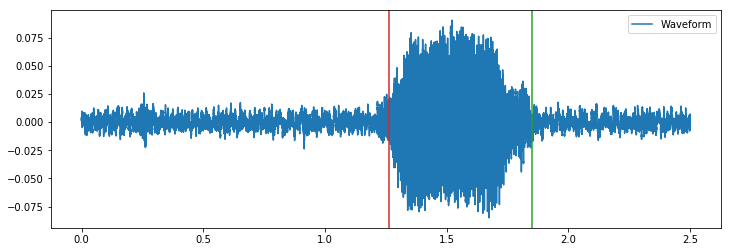

F:/main_total\180918_PMJ_C_48_F.wav


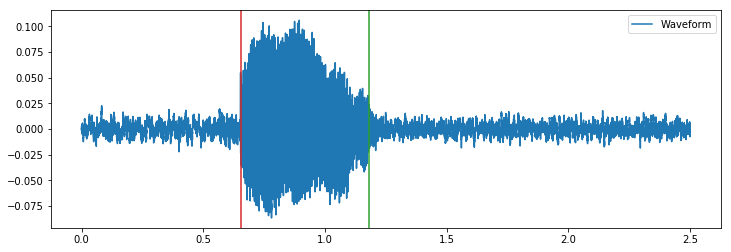

F:/main_total\180918_PMJ_C_49_F.wav


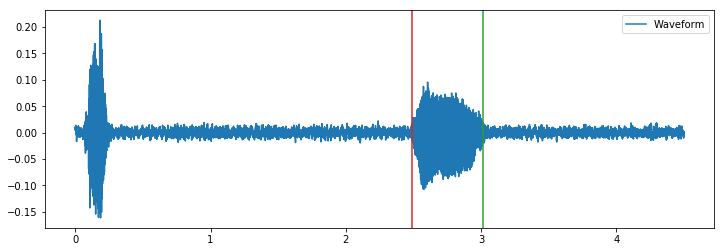

F:/main_total\180918_PMJ_C_50_F.wav


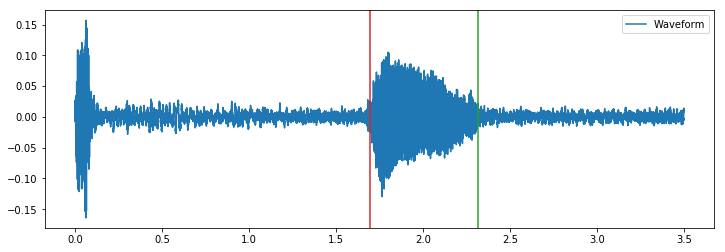

F:/main_total\180918_PMJ_C_51_F.wav


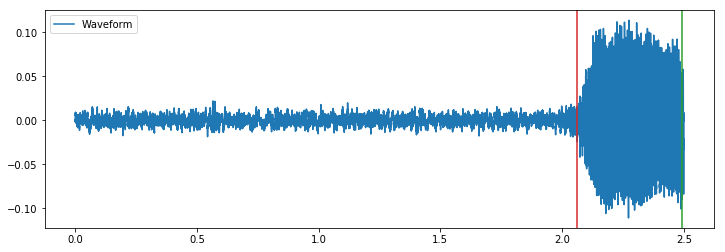

F:/main_total\180918_PMJ_C_52_F.wav


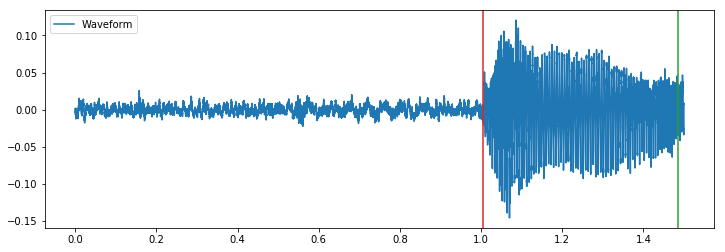

F:/main_total\180918_PMJ_C_53_F.wav


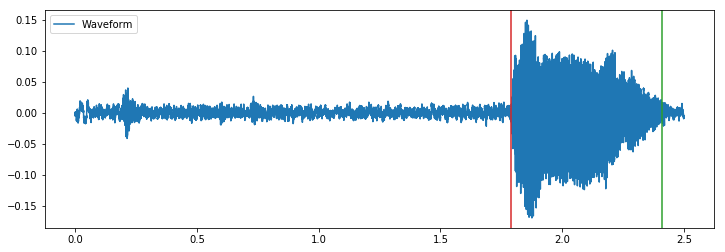

F:/main_total\180918_PMJ_C_54_F.wav


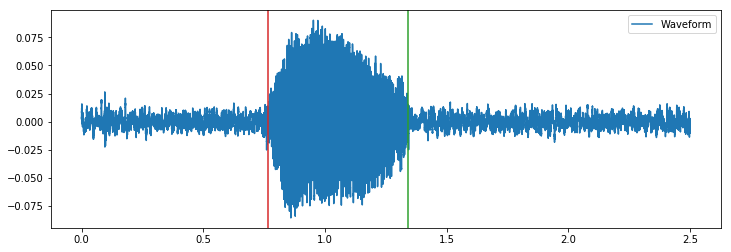

F:/main_total\180918_PMJ_C_60_F.wav


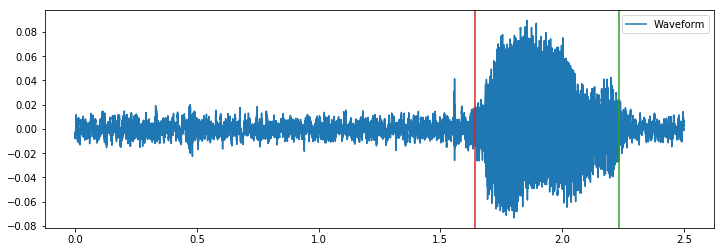

F:/main_total\180918_PMJ_C_61_F.wav


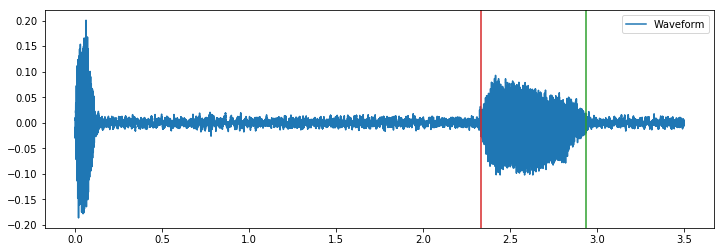

F:/main_total\180918_PMJ_C_62_F.wav


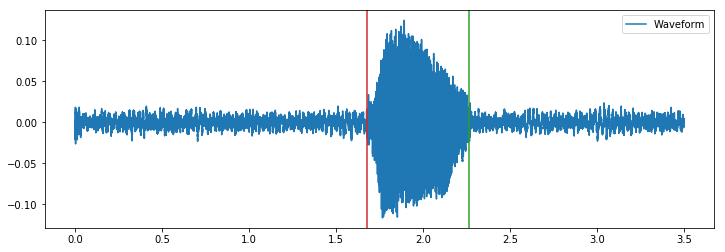

F:/main_total\180918_PMJ_C_63_F.wav


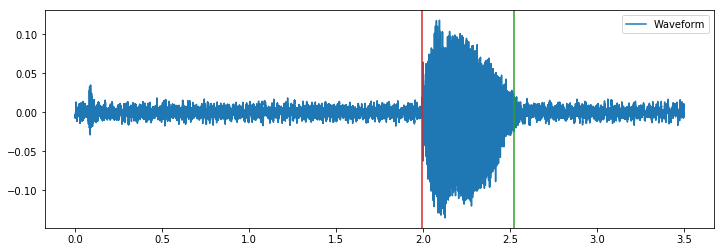

F:/main_total\180918_PMJ_C_64_F.wav


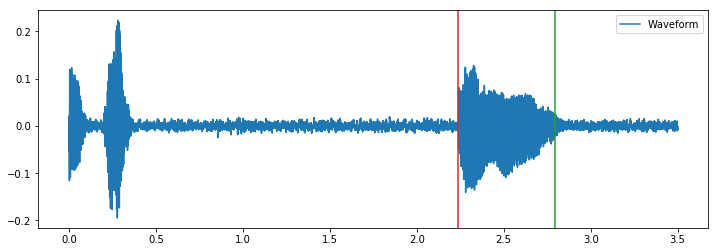

F:/main_total\180918_PMJ_C_65_F.wav


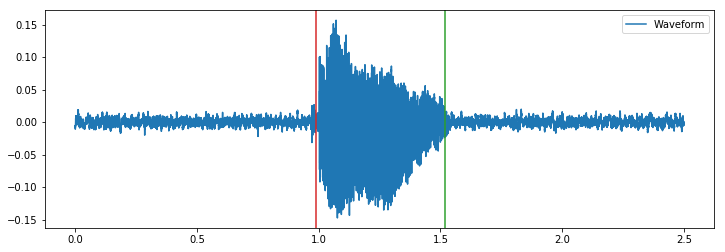

F:/main_total\180918_PMJ_C_66_F.wav


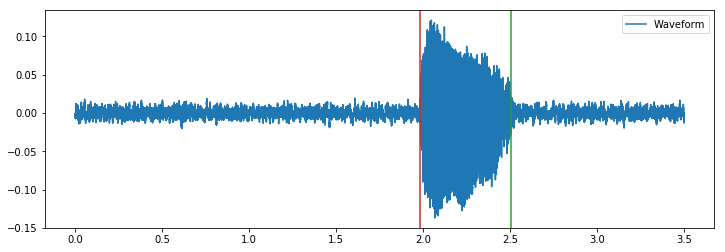

F:/main_total\180918_PMJ_C_67_F.wav


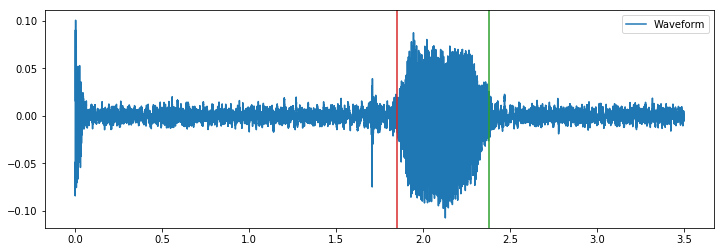

F:/main_total\180918_PMJ_C_68_F.wav


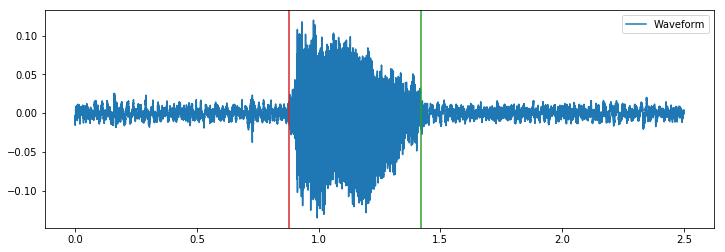

F:/main_total\180918_PMJ_C_69_F.wav


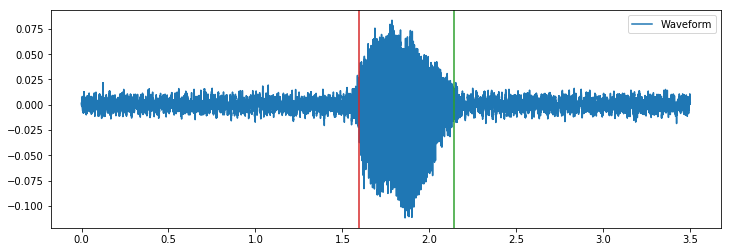

F:/main_total\181120_JYE_C_1_T.wav


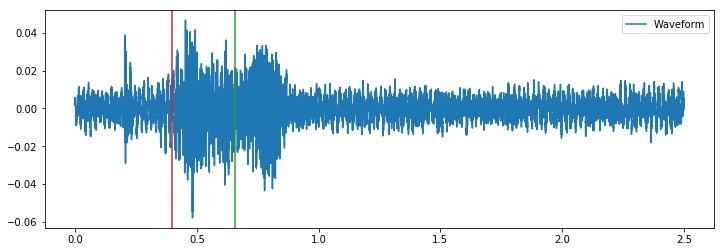

F:/main_total\181120_JYE_C_2_T.wav


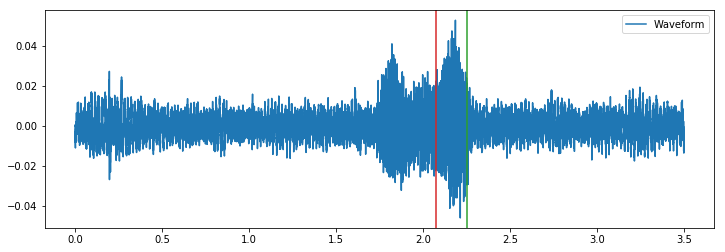

F:/main_total\181120_JYE_C_3_T.wav


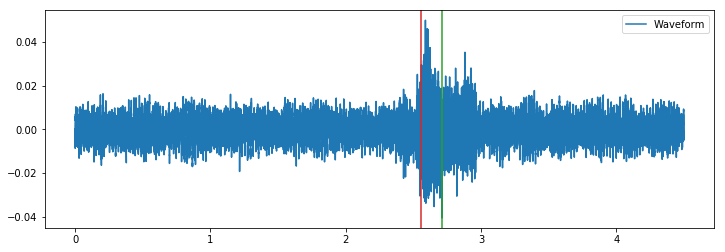

F:/main_total\181120_JYE_C_4_T.wav


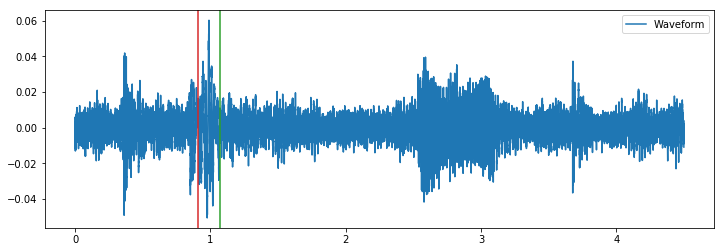

F:/main_total\181120_JYE_C_5_T.wav


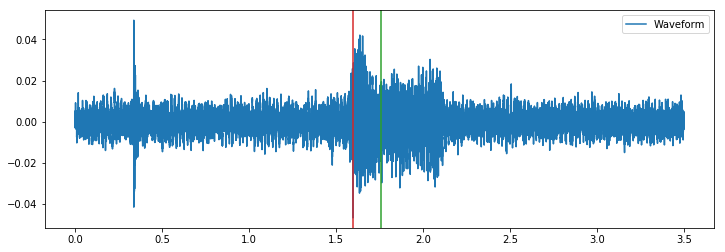

F:/main_total\181120_JYE_C_6_T.wav


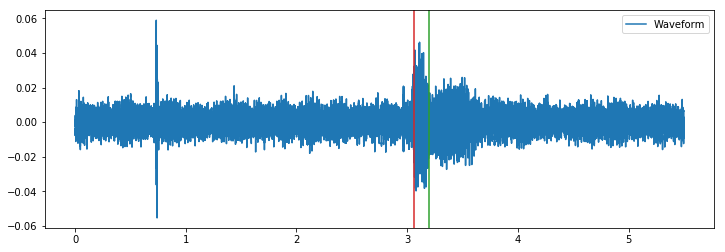

F:/main_total\181120_JYE_C_7_T.wav


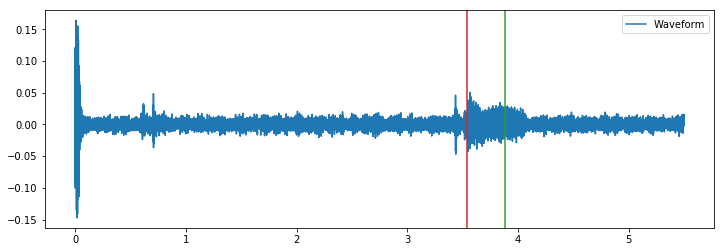

F:/main_total\181120_JYE_C_8_T.wav


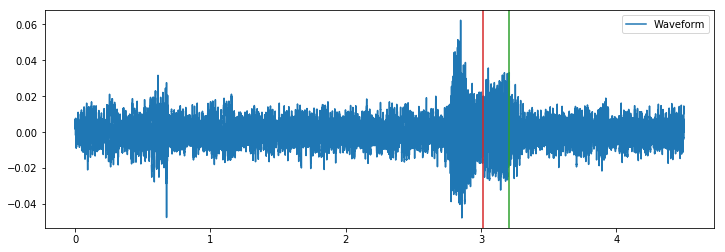

F:/main_total\181120_JYE_C_9_T.wav


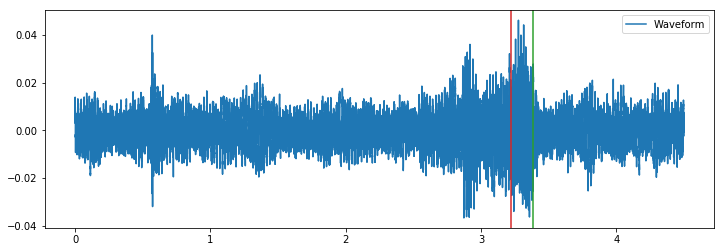

F:/main_total\181120_JYE_C_10_T.wav


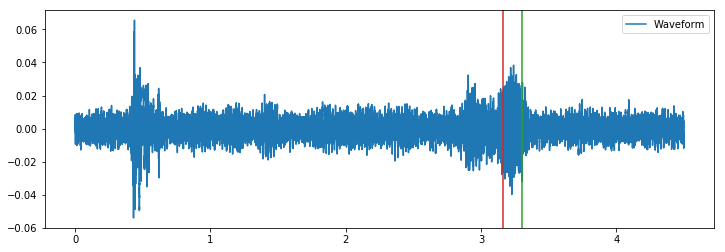

F:/main_total\181120_JYE_C_11_T.wav


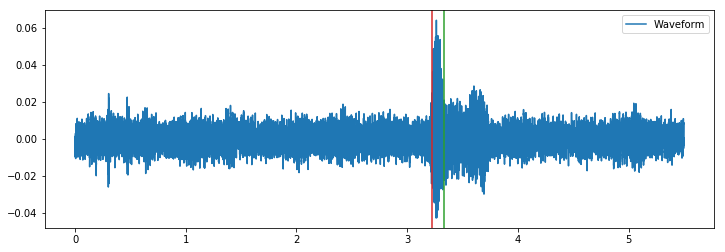

F:/main_total\181120_JYE_C_12_T.wav


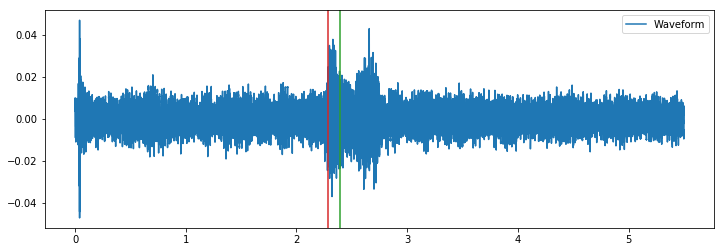

F:/main_total\181120_JYE_C_13_T.wav


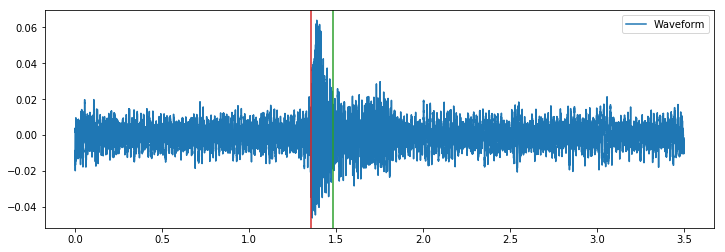

F:/main_total\181120_JYE_C_14_T.wav


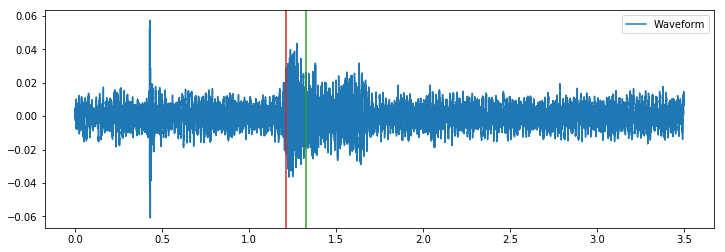

F:/main_total\181120_JYE_C_15_T.wav


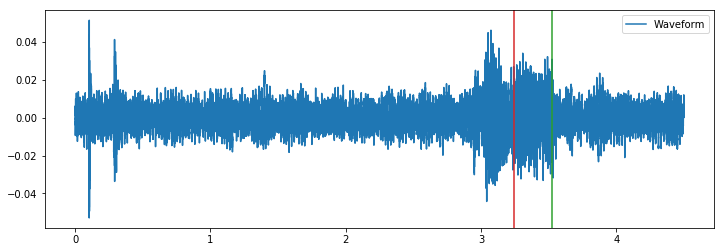

F:/main_total\181120_JYE_C_16_T.wav


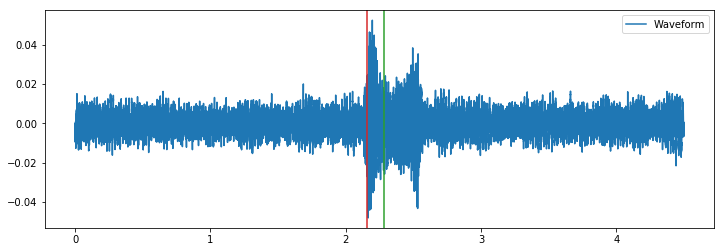

F:/main_total\181120_JYE_C_17_T.wav


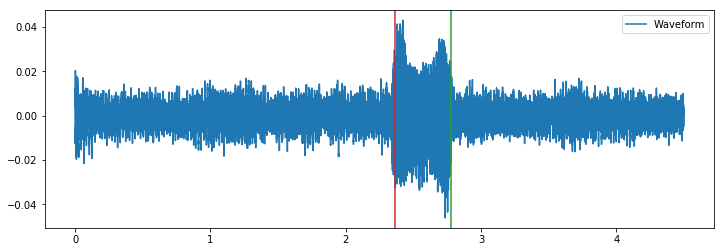

F:/main_total\181120_JYE_C_18_T.wav


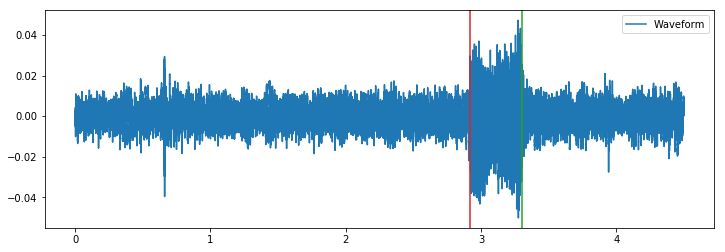

F:/main_total\181120_JYE_C_19_T.wav


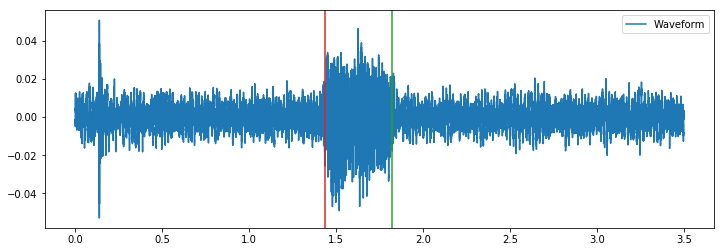

F:/main_total\181120_JYE_C_20_T.wav


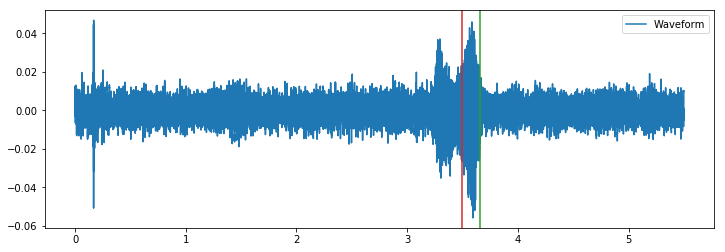

F:/main_total\181120_JYE_C_21_T.wav


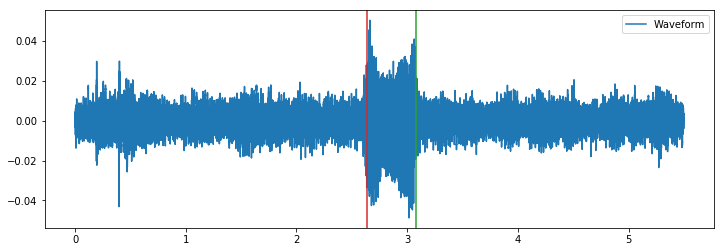

F:/main_total\181120_JYE_C_22_T.wav


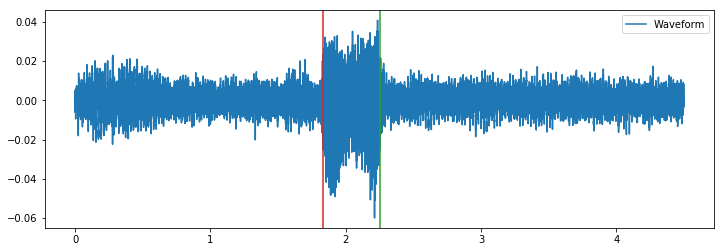

F:/main_total\181120_JYE_C_28_T.wav


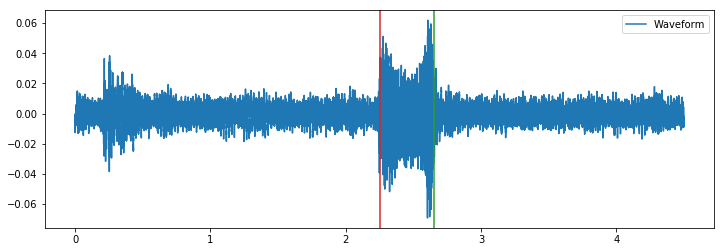

F:/main_total\181120_JYE_C_29_T.wav


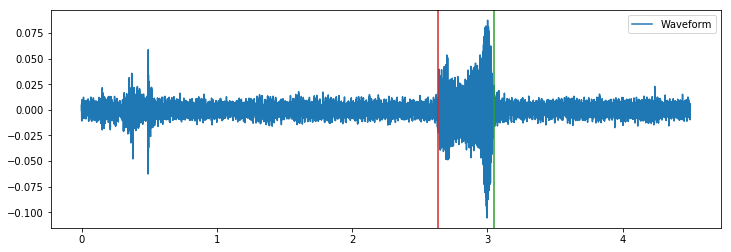

F:/main_total\181120_JYE_C_30_T.wav


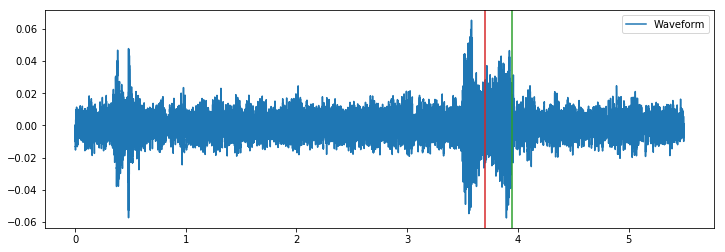

F:/main_total\181120_JYE_C_31_T.wav


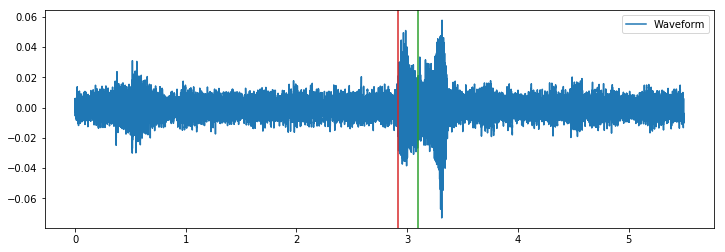

F:/main_total\181120_JYE_C_32_T.wav


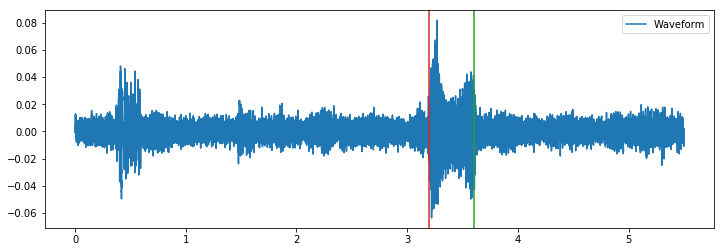

F:/main_total\181120_JYE_C_33_T.wav


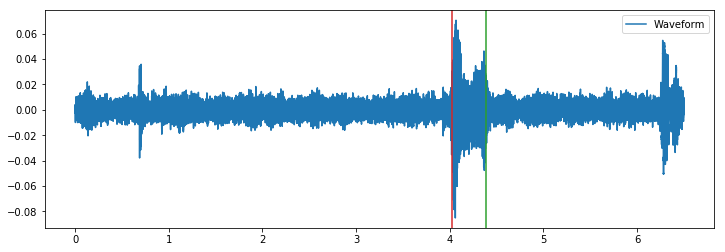

F:/main_total\181120_JYE_C_34_T.wav


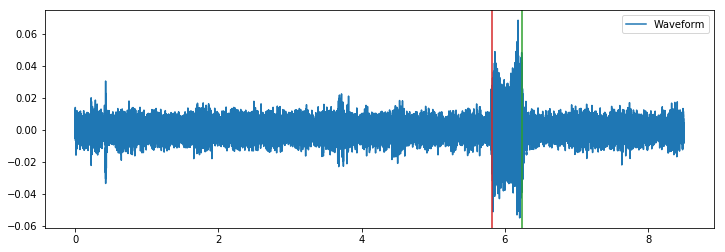

F:/main_total\181120_JYE_C_35_T.wav


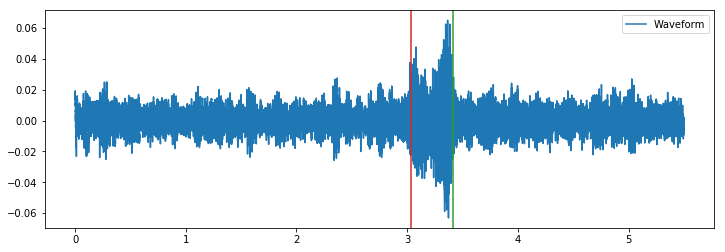

F:/main_total\181120_JYE_C_36_T.wav


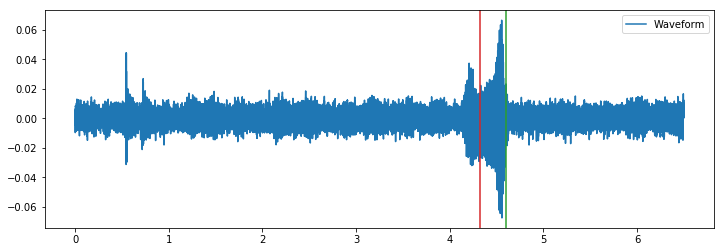

F:/main_total\181120_JYE_C_37_T.wav


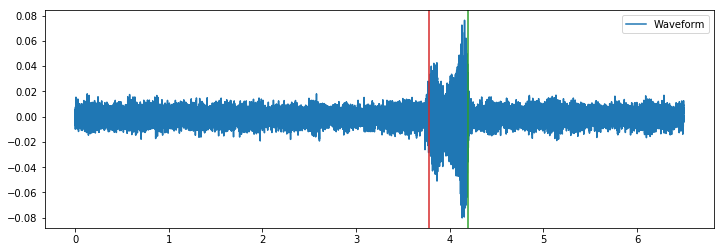

F:/main_total\181120_JYE_C_43_F.wav


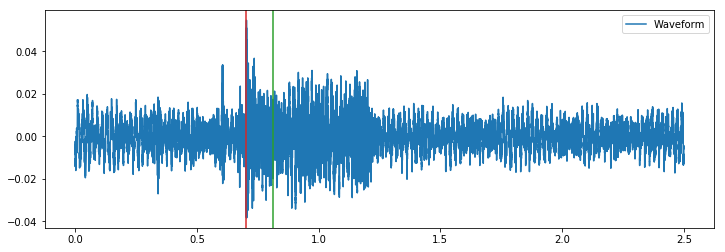

F:/main_total\181120_JYE_C_44_F.wav


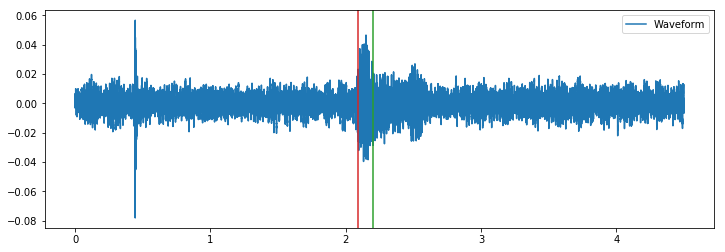

F:/main_total\181120_JYE_C_45_F.wav


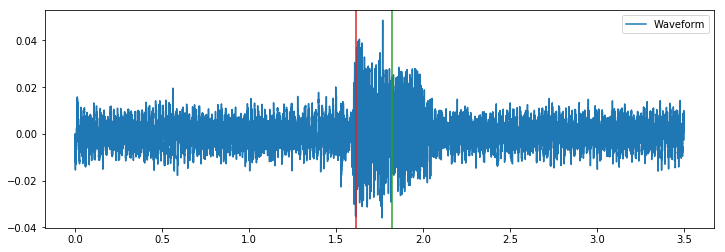

F:/main_total\181120_JYE_C_46_F.wav


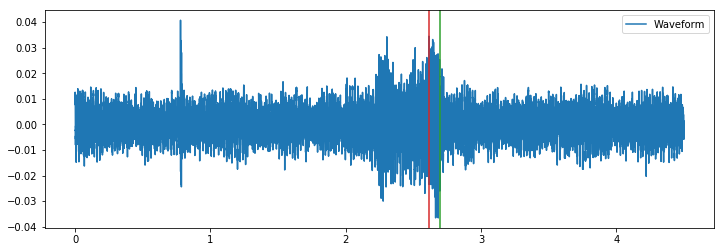

F:/main_total\181120_JYE_C_47_F.wav


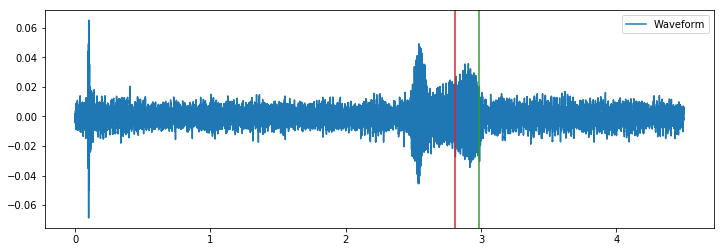

F:/main_total\181120_JYE_C_48_F.wav


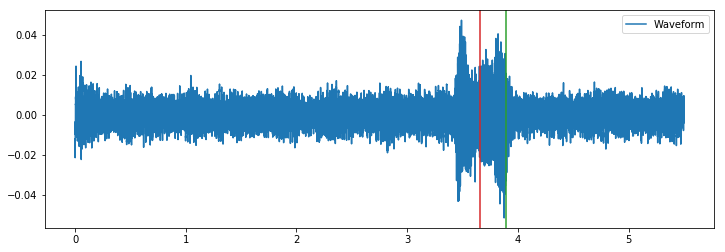

F:/main_total\181120_JYE_C_49_F.wav


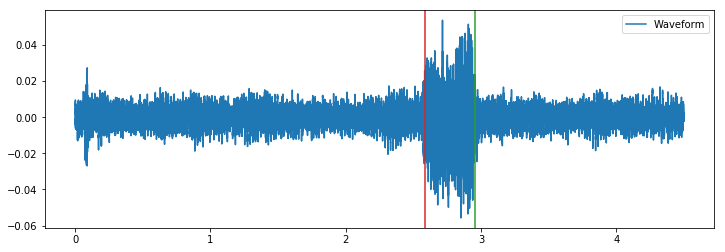

F:/main_total\181120_JYE_C_50_F.wav


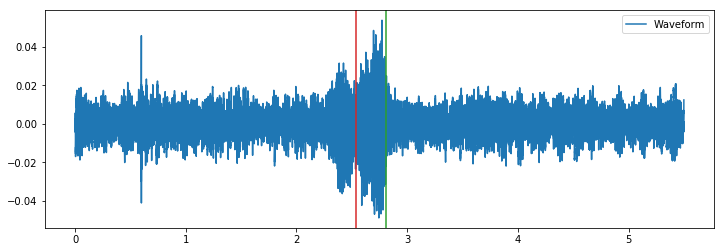

F:/main_total\181120_JYE_C_51_F.wav


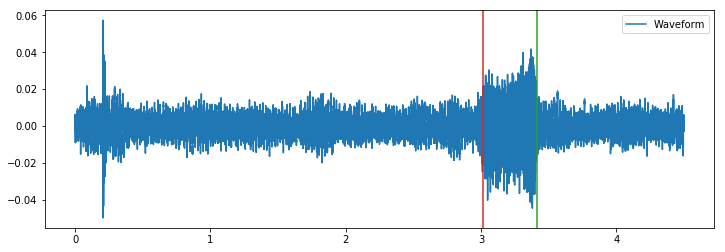

F:/main_total\181120_JYE_C_52_F.wav


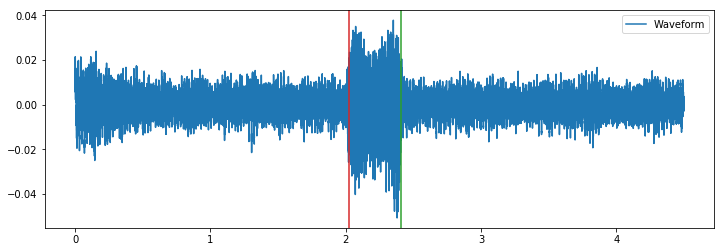

F:/main_total\181120_JYE_C_53_F.wav


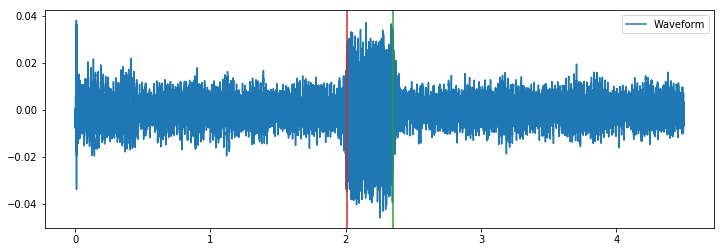

F:/main_total\181120_JYE_C_54_F.wav


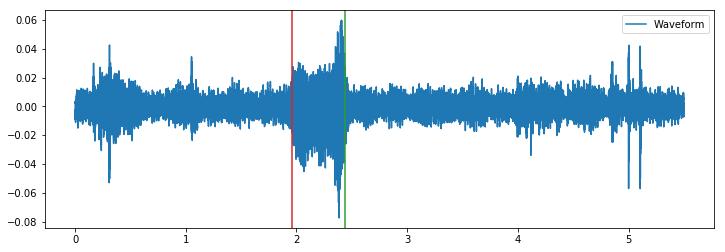

F:/main_total\181120_JYE_C_60_F.wav


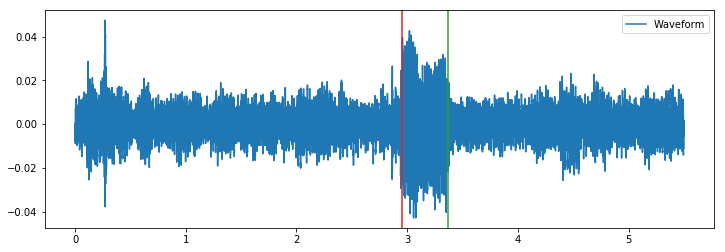

F:/main_total\181120_JYE_C_61_F.wav


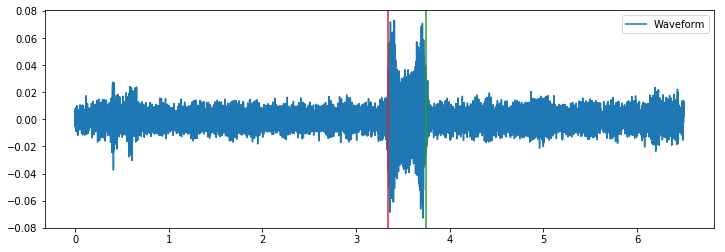

F:/main_total\181120_JYE_C_62_F.wav


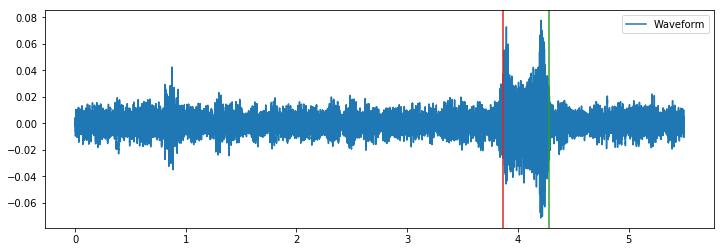

F:/main_total\181120_JYE_C_63_F.wav


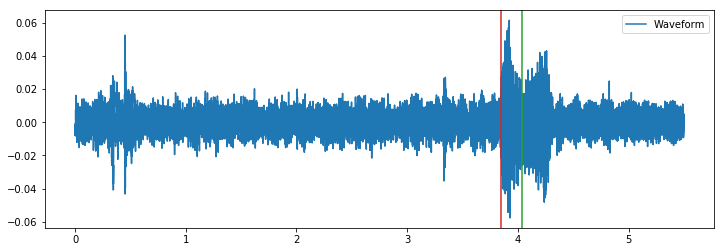

F:/main_total\181120_JYE_C_64_F.wav


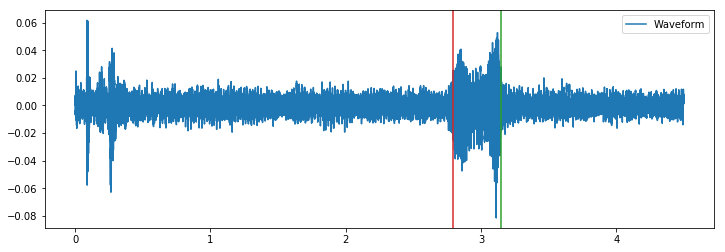

F:/main_total\181120_JYE_C_65_F.wav


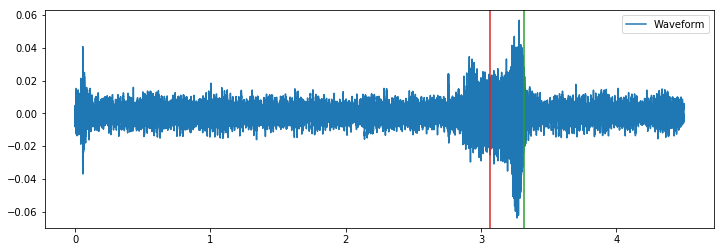

F:/main_total\181120_JYE_C_66_F.wav


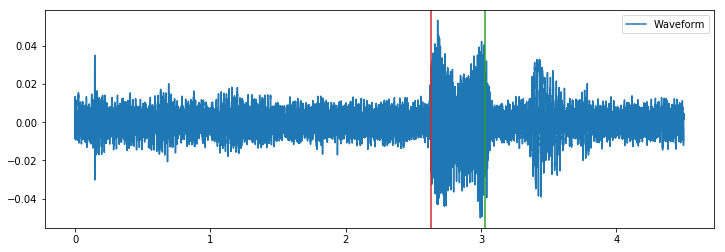

F:/main_total\181120_JYE_C_67_F.wav


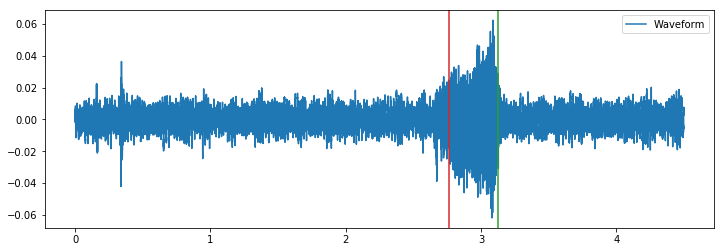

F:/main_total\181120_JYE_C_68_F.wav


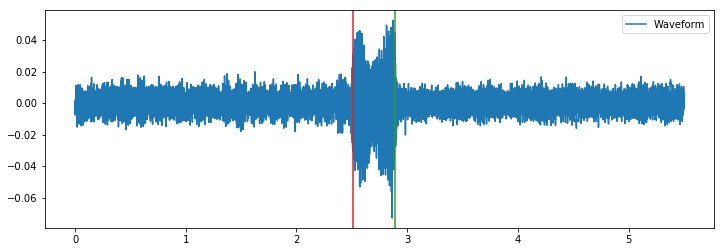

F:/main_total\181120_JYE_C_69_F.wav


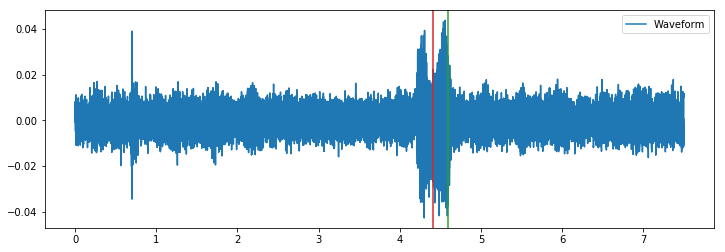

F:/main_total\181121_KDD_C_1_T.wav


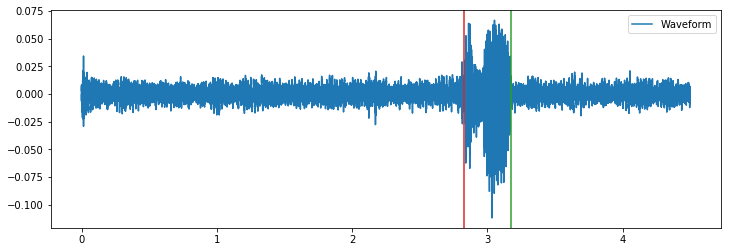

F:/main_total\181121_KDD_C_2_T.wav


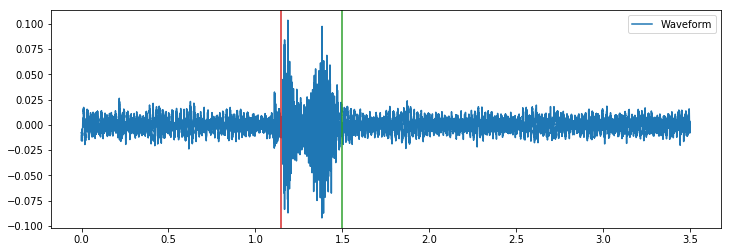

F:/main_total\181121_KDD_C_3_T.wav


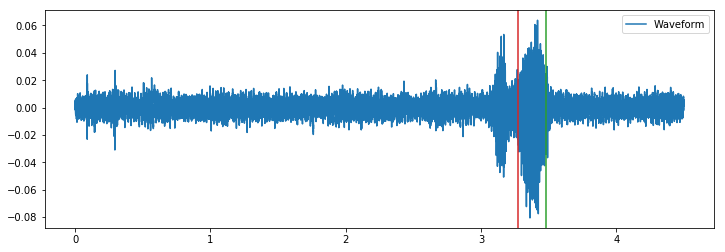

F:/main_total\181121_KDD_C_4_T.wav


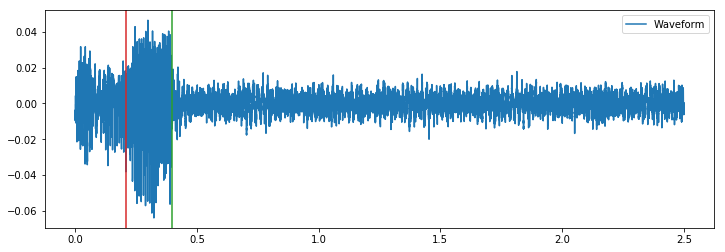

F:/main_total\181121_KDD_C_5_T.wav


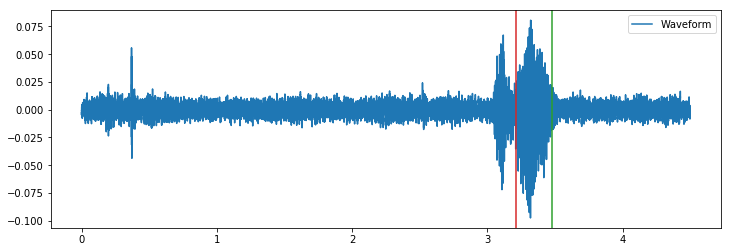

F:/main_total\181121_KDD_C_6_T.wav


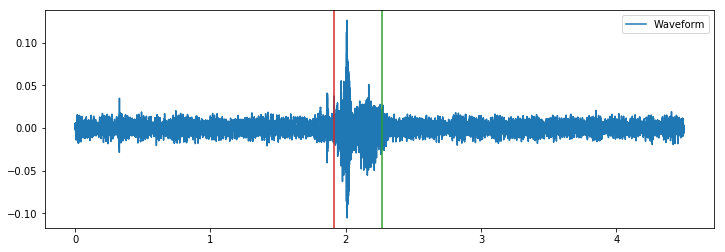

F:/main_total\181121_KDD_C_7_T.wav


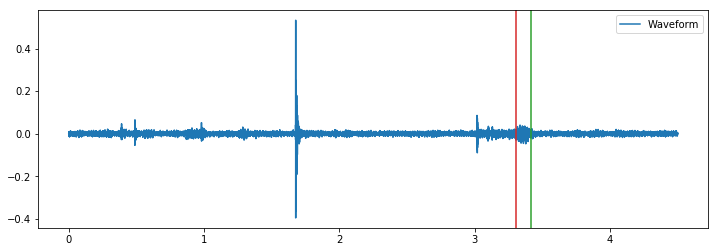

F:/main_total\181121_KDD_C_8_T.wav


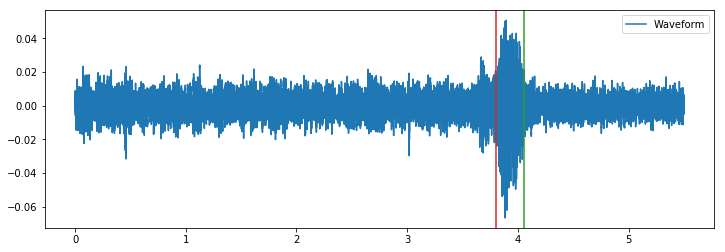

F:/main_total\181121_KDD_C_9_T.wav


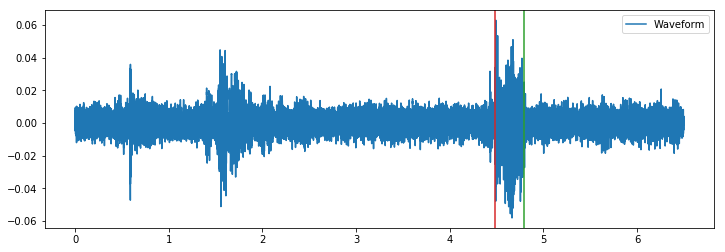

F:/main_total\181121_KDD_C_10_T.wav


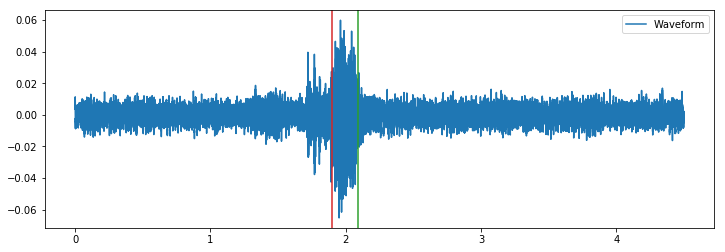

F:/main_total\181121_KDD_C_11_T.wav


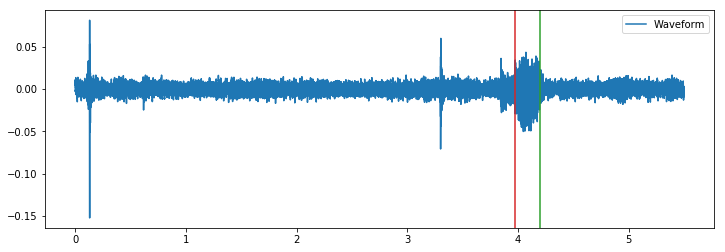

F:/main_total\181121_KDD_C_12_T.wav


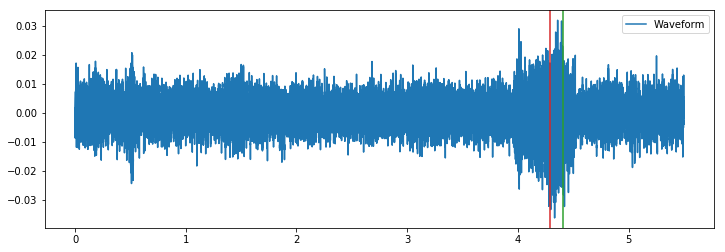

F:/main_total\181121_KDD_C_13_T.wav


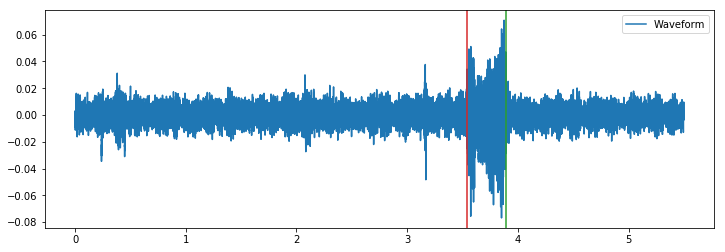

F:/main_total\181121_KDD_C_14_T.wav


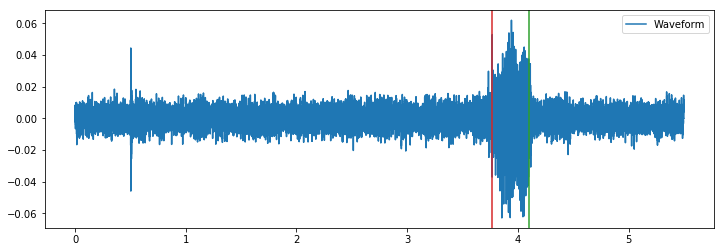

F:/main_total\181121_KDD_C_15_T.wav


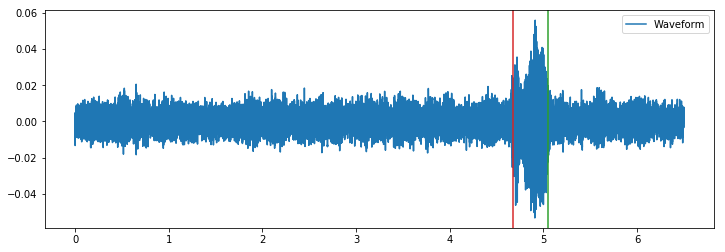

F:/main_total\181121_KDD_C_16_T.wav


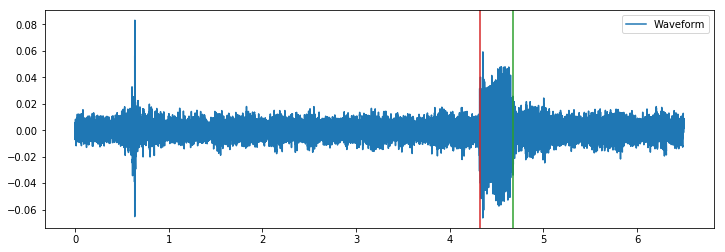

F:/main_total\181121_KDD_C_17_T.wav


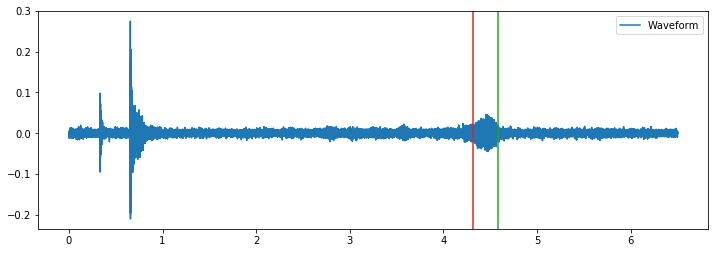

F:/main_total\181121_KDD_C_18_T.wav


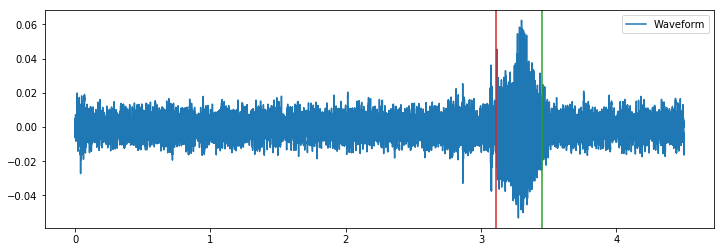

F:/main_total\181121_KDD_C_19_T.wav


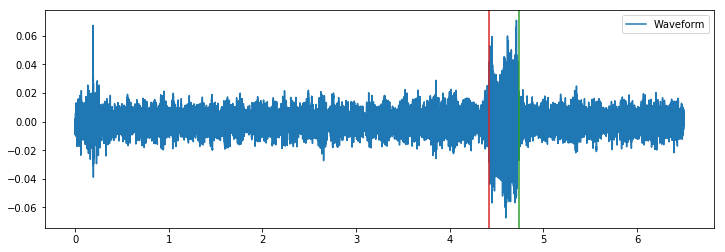

F:/main_total\181121_KDD_C_20_T.wav


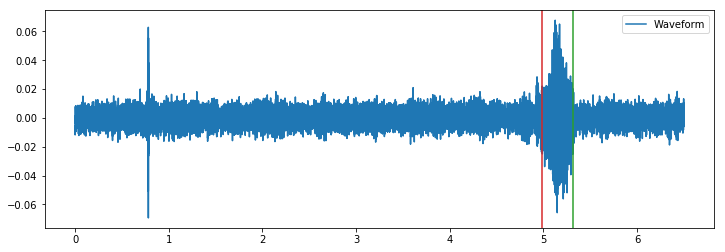

F:/main_total\181121_KDD_C_21_T.wav


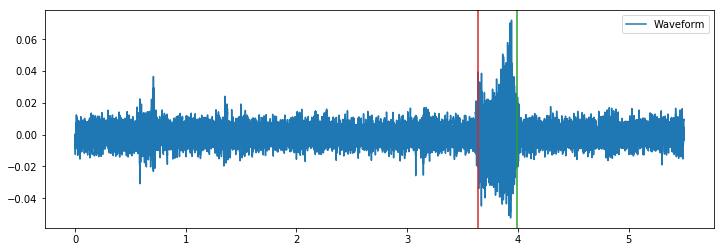

F:/main_total\181121_KDD_C_22_T.wav


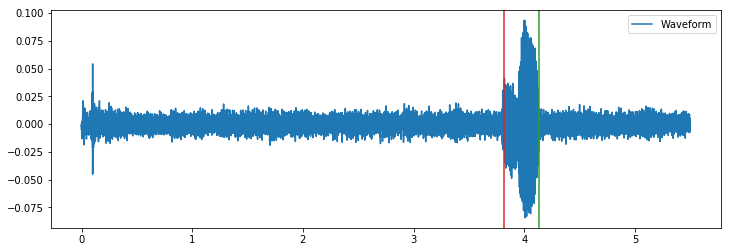

F:/main_total\181121_KDD_C_28_T.wav


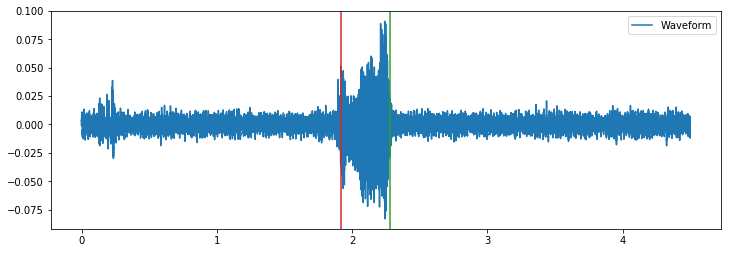

F:/main_total\181121_KDD_C_29_T.wav


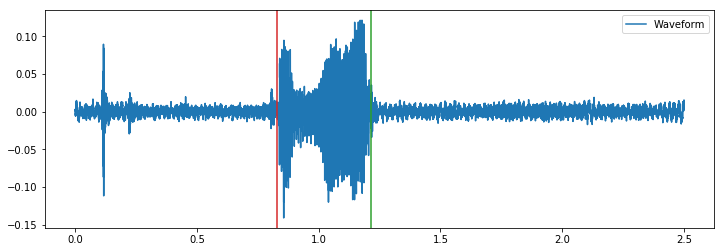

F:/main_total\181121_KDD_C_30_T.wav


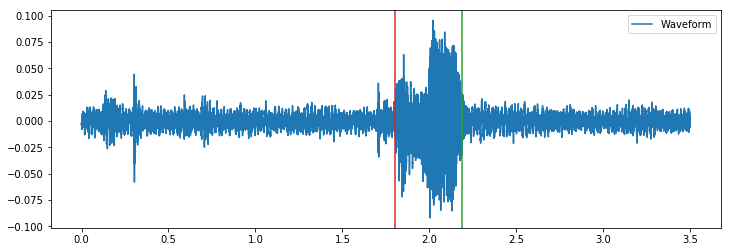

F:/main_total\181121_KDD_C_31_T.wav


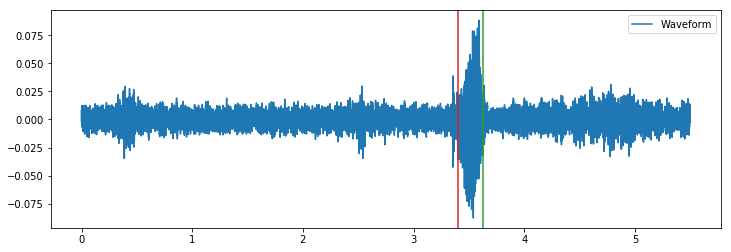

F:/main_total\181121_KDD_C_32_T.wav


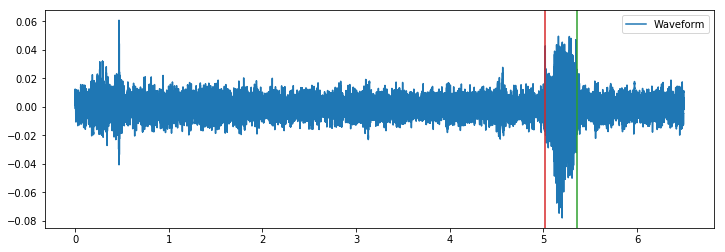

F:/main_total\181121_KDD_C_33_T.wav


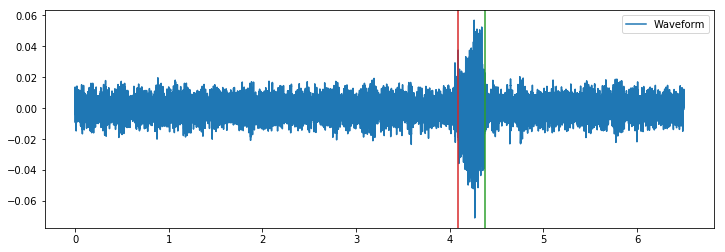

F:/main_total\181121_KDD_C_34_T.wav


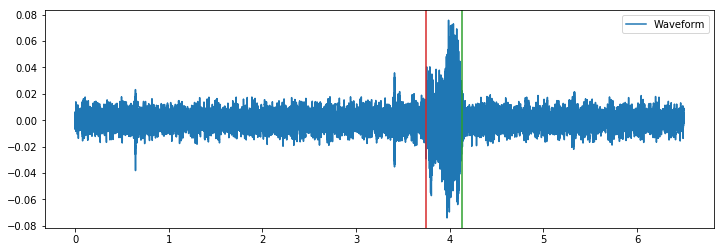

F:/main_total\181121_KDD_C_35_T.wav


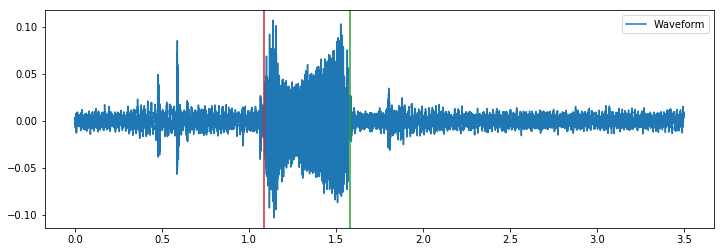

F:/main_total\181121_KDD_C_36_T.wav


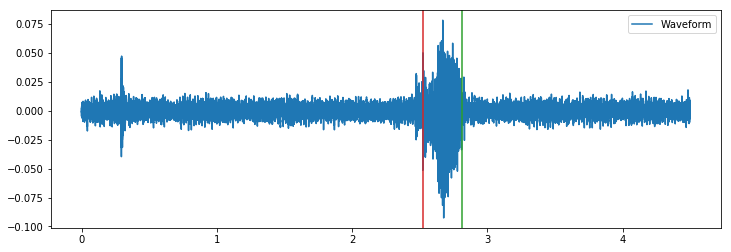

F:/main_total\181121_KDD_C_37_T.wav


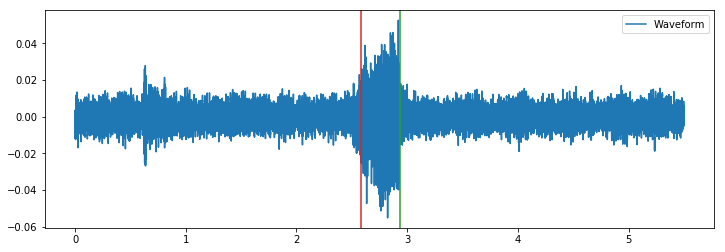

F:/main_total\181121_KDD_C_43_F.wav


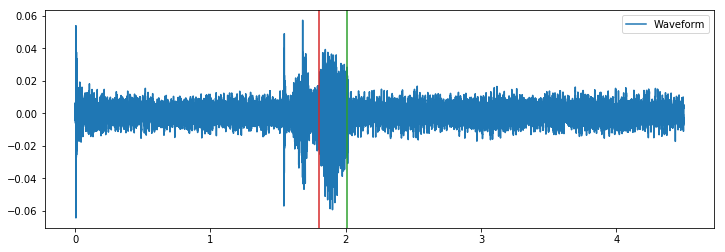

F:/main_total\181121_KDD_C_44_F.wav


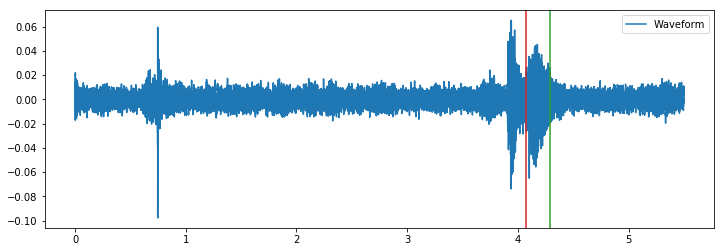

F:/main_total\181121_KDD_C_45_F.wav


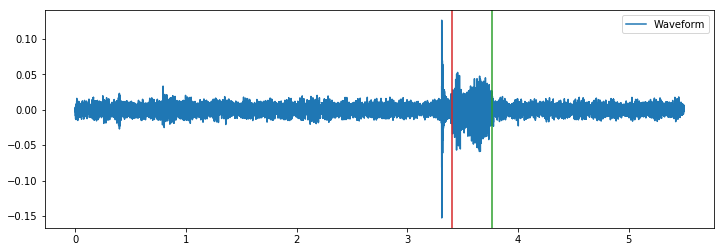

F:/main_total\181121_KDD_C_46_F.wav


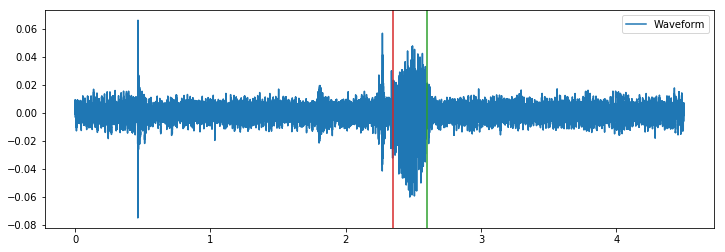

F:/main_total\181121_KDD_C_47_F.wav


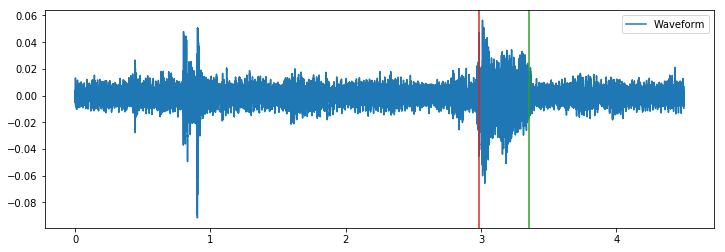

F:/main_total\181121_KDD_C_48_F.wav


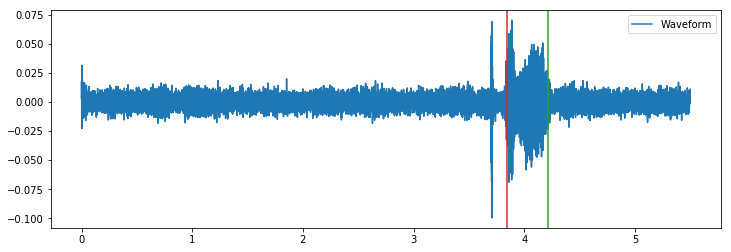

F:/main_total\181121_KDD_C_49_F.wav


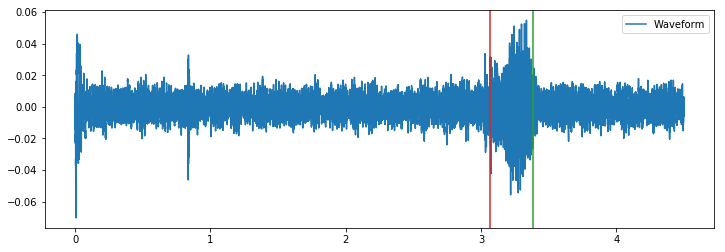

F:/main_total\181121_KDD_C_50_F.wav


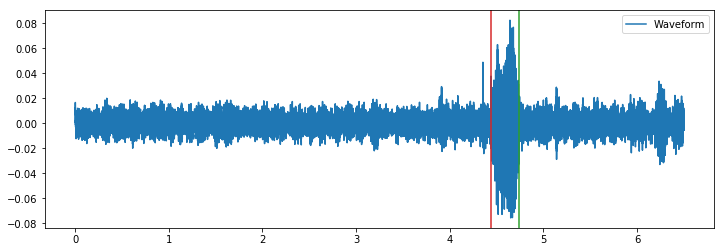

F:/main_total\181121_KDD_C_51_F.wav


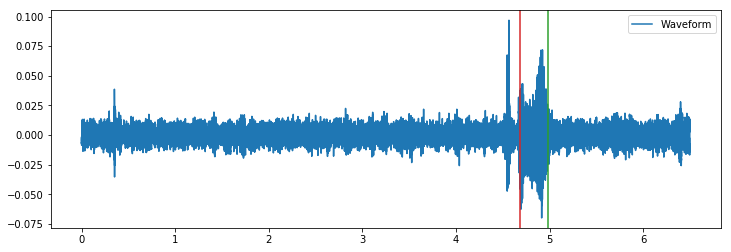

F:/main_total\181121_KDD_C_52_F.wav


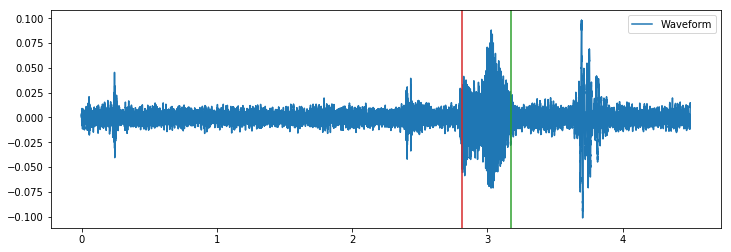

F:/main_total\181121_KDD_C_53_F.wav


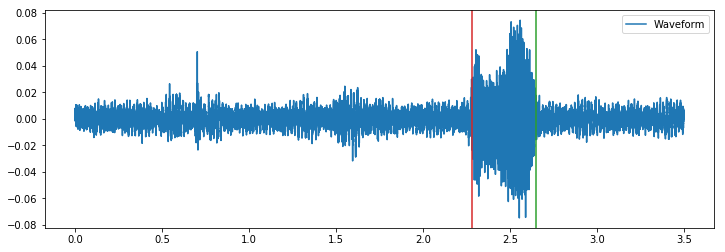

F:/main_total\181121_KDD_C_54_F.wav


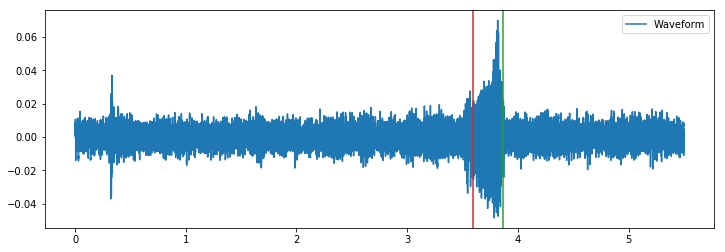

F:/main_total\181121_KDD_C_60_F.wav


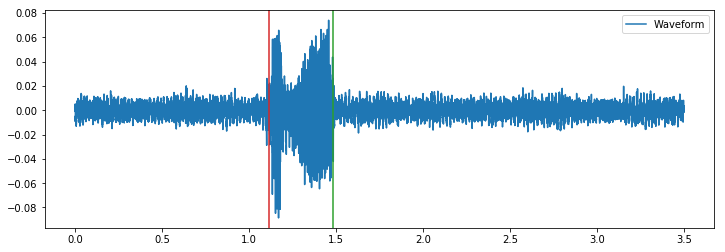

F:/main_total\181121_KDD_C_61_F.wav


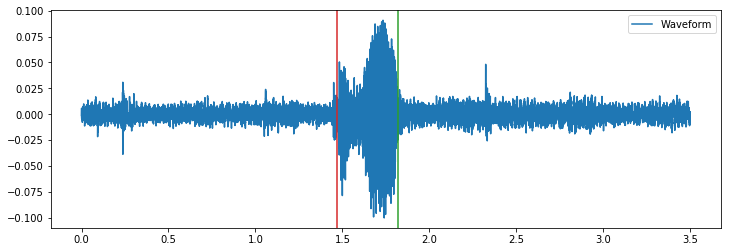

F:/main_total\181121_KDD_C_62_F.wav


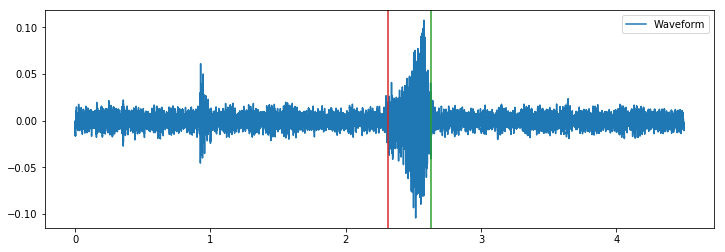

F:/main_total\181121_KDD_C_63_F.wav


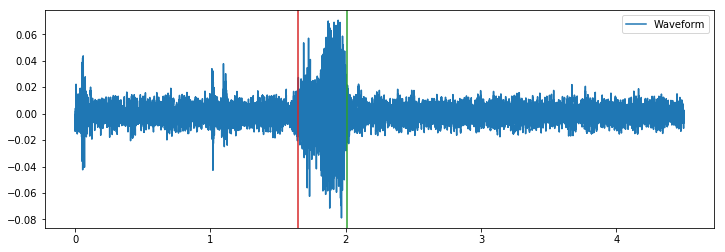

F:/main_total\181121_KDD_C_64_F.wav


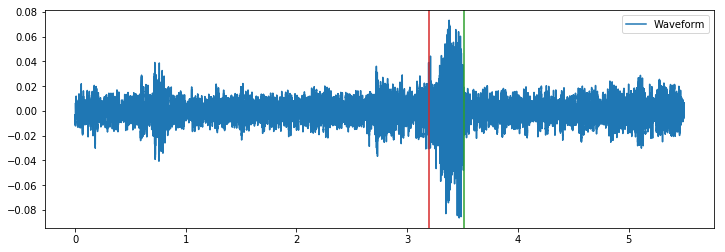

F:/main_total\181121_KDD_C_65_F.wav


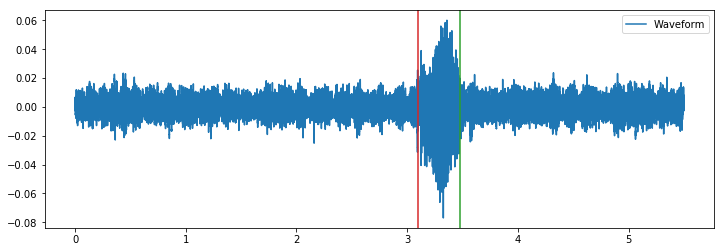

F:/main_total\181121_KDD_C_66_F.wav


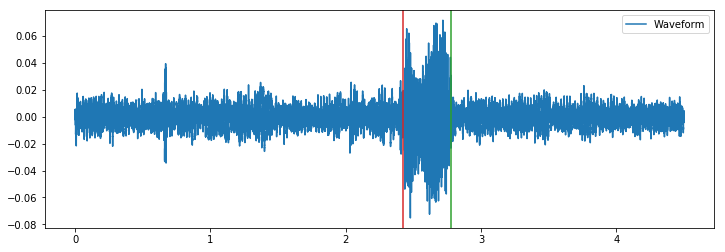

F:/main_total\181121_KDD_C_67_F.wav


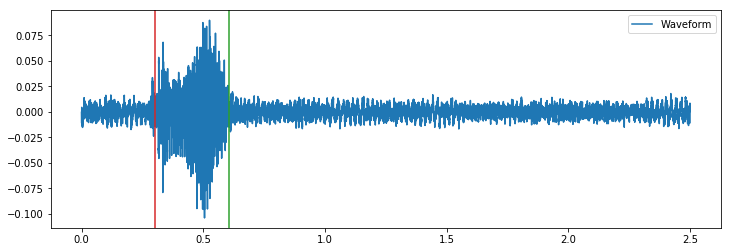

F:/main_total\181121_KDD_C_68_F.wav


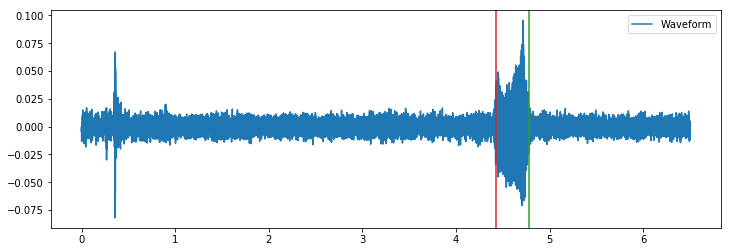

F:/main_total\181121_KDD_C_69_F.wav


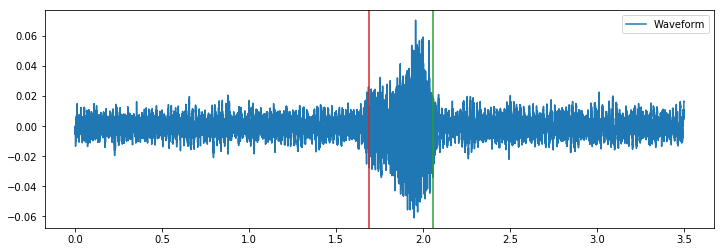

F:/main_total\181121_HHJ_C_1_T.wav


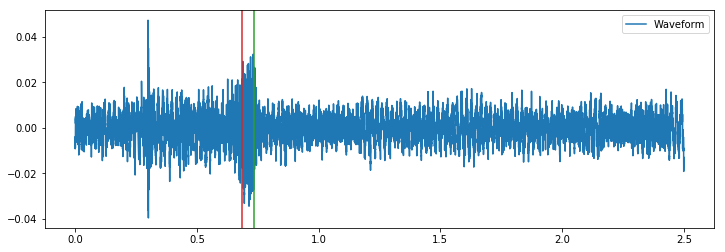

F:/main_total\181121_HHJ_C_2_T.wav


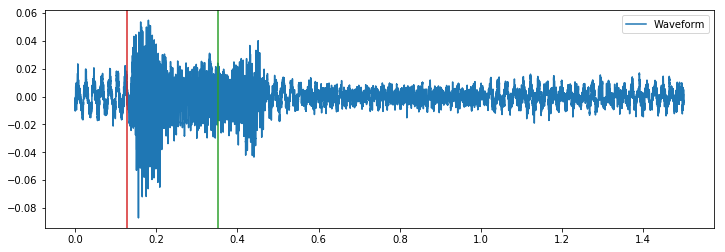

F:/main_total\181121_HHJ_C_3_T.wav


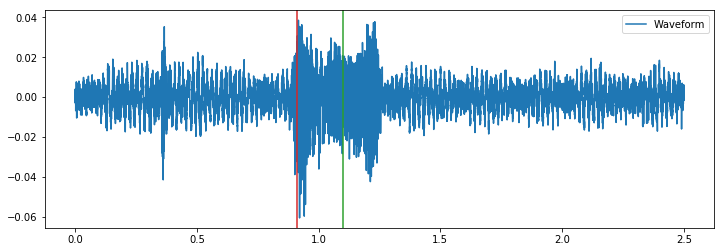

F:/main_total\181121_HHJ_C_4_T.wav


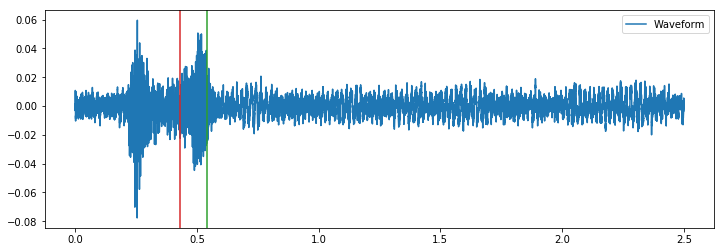

F:/main_total\181121_HHJ_C_5_T.wav


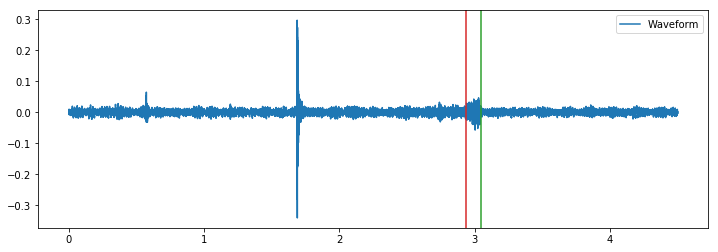

F:/main_total\181121_HHJ_C_6_T.wav


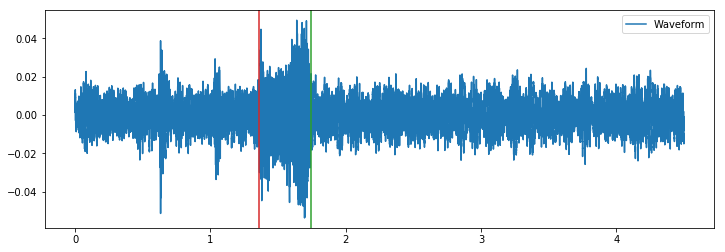

F:/main_total\181121_HHJ_C_7_T.wav


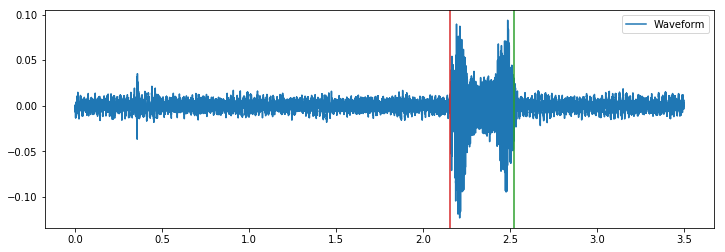

F:/main_total\181121_HHJ_C_8_T.wav


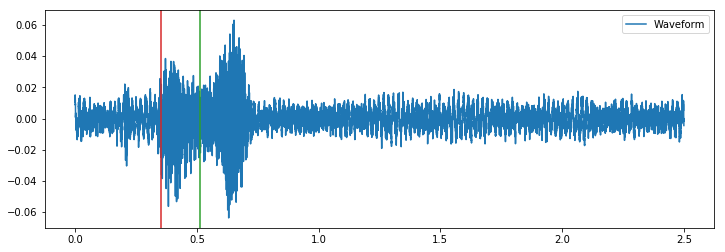

F:/main_total\181121_HHJ_C_9_T.wav


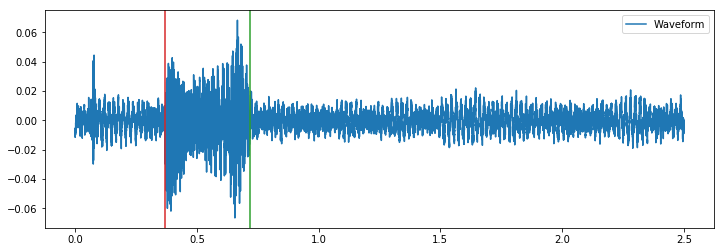

F:/main_total\181121_HHJ_C_10_T.wav


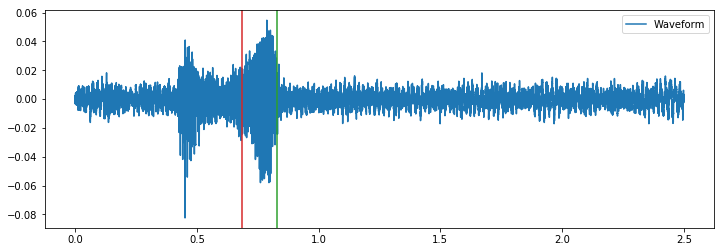

F:/main_total\181121_HHJ_C_11_T.wav


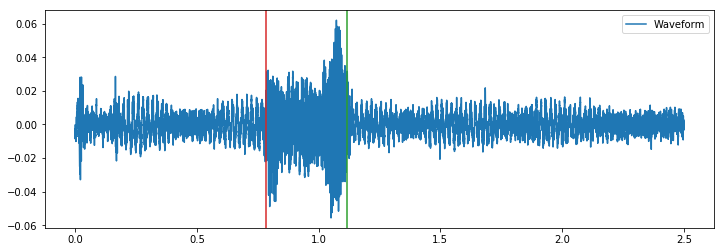

F:/main_total\181121_HHJ_C_12_T.wav


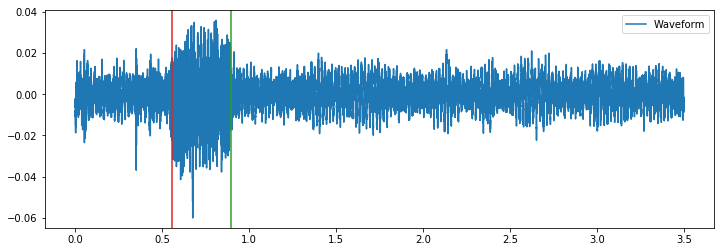

F:/main_total\181121_HHJ_C_13_T.wav


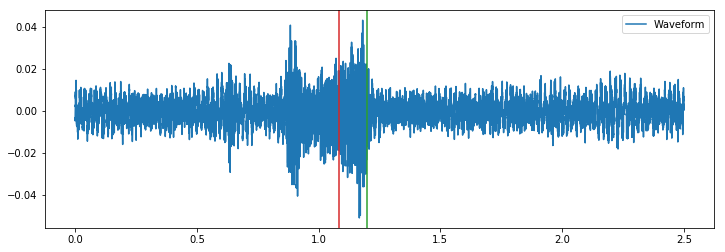

F:/main_total\181121_HHJ_C_14_T.wav


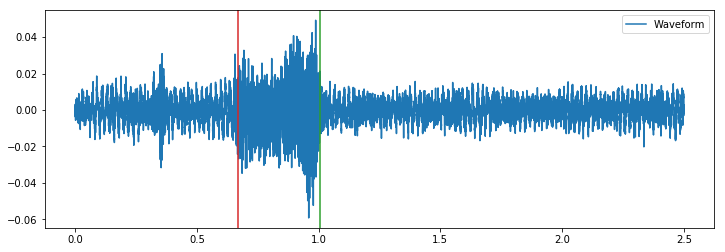

F:/main_total\181121_HHJ_C_15_T.wav


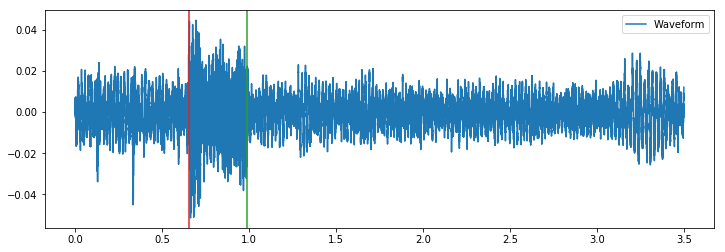

F:/main_total\181121_HHJ_C_16_T.wav


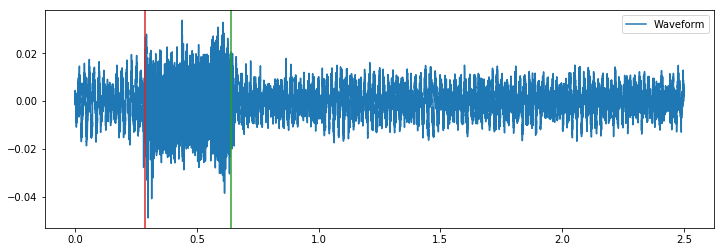

F:/main_total\181121_HHJ_C_17_T.wav


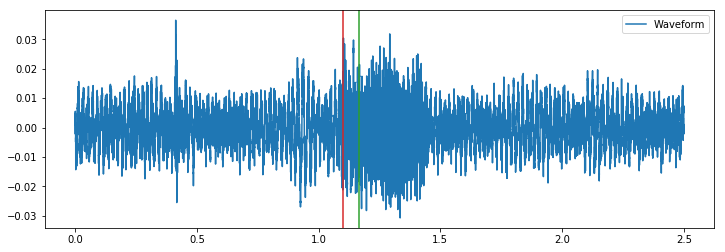

F:/main_total\181121_HHJ_C_18_T.wav


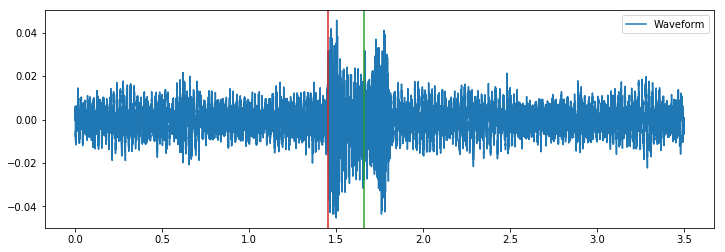

F:/main_total\181121_HHJ_C_19_T.wav


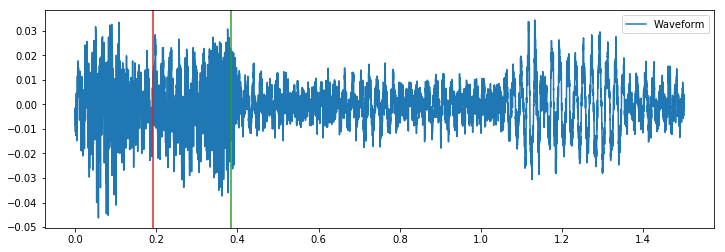

F:/main_total\181121_HHJ_C_20_T.wav


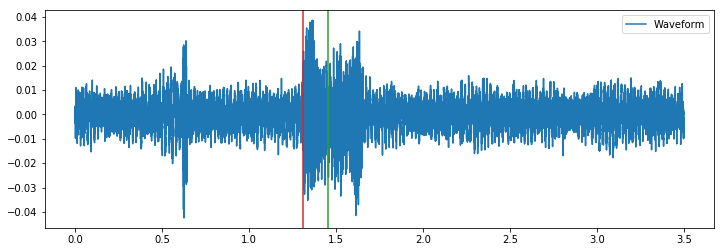

F:/main_total\181121_HHJ_C_21_T.wav


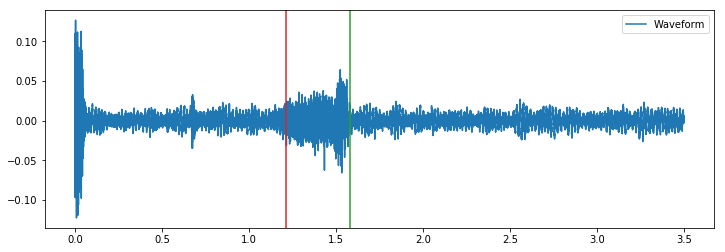

F:/main_total\181121_HHJ_C_22_T.wav


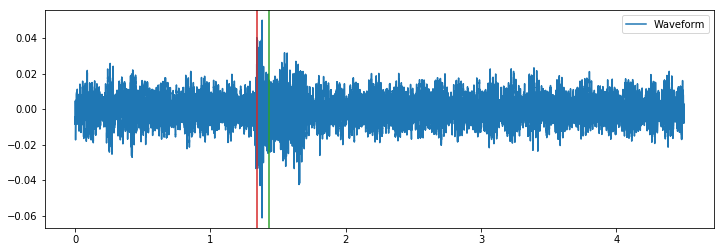

F:/main_total\181121_HHJ_C_28_T.wav


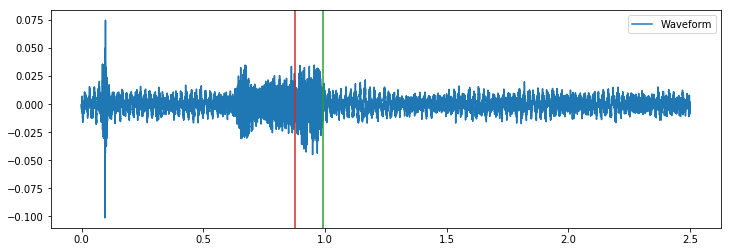

F:/main_total\181121_HHJ_C_29_T.wav


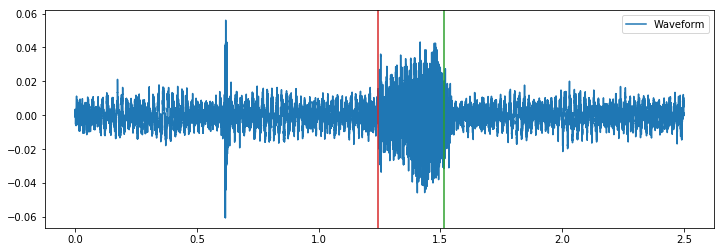

F:/main_total\181121_HHJ_C_30_T.wav


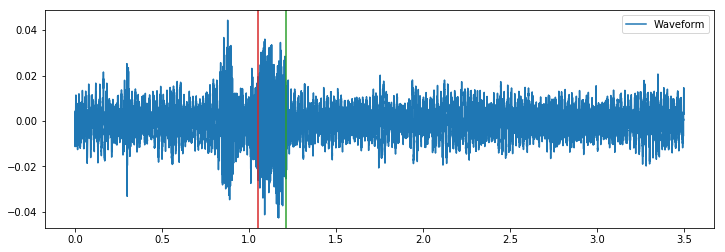

F:/main_total\181121_HHJ_C_31_T.wav


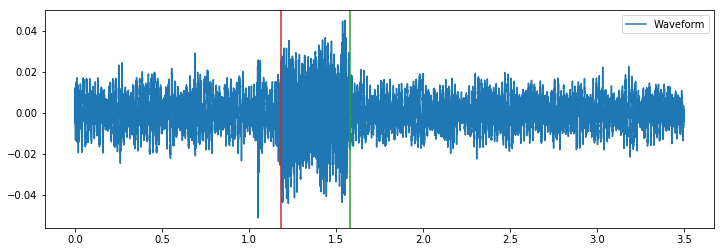

F:/main_total\181121_HHJ_C_32_T.wav


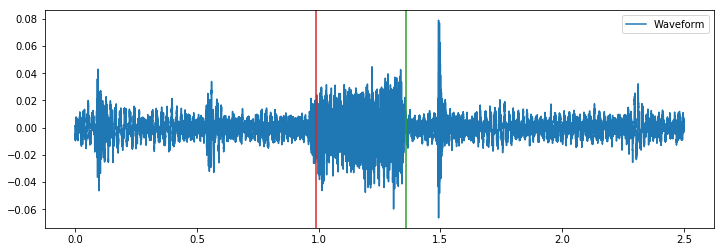

F:/main_total\181121_HHJ_C_33_T.wav


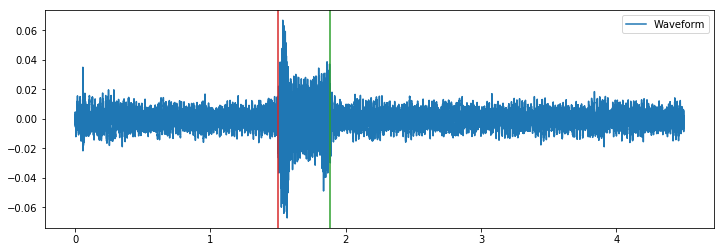

F:/main_total\181121_HHJ_C_34_T.wav


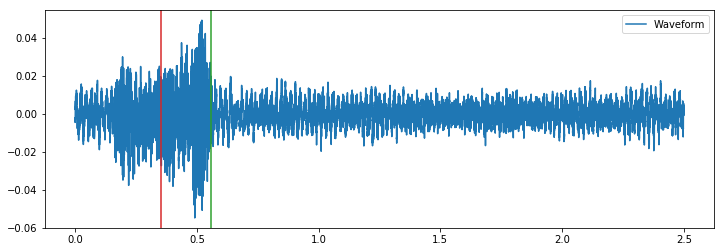

F:/main_total\181121_HHJ_C_35_T.wav


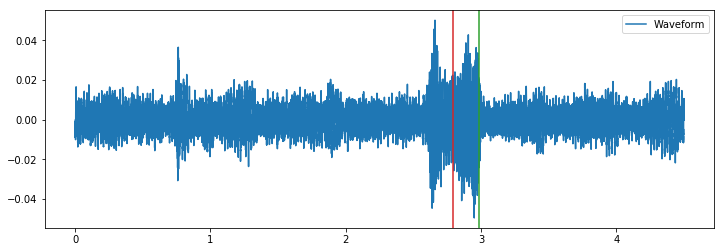

F:/main_total\181121_HHJ_C_36_T.wav


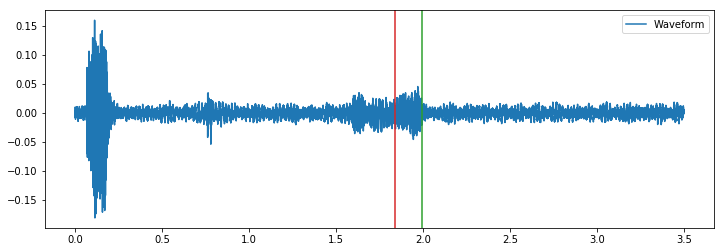

F:/main_total\181121_HHJ_C_37_T.wav


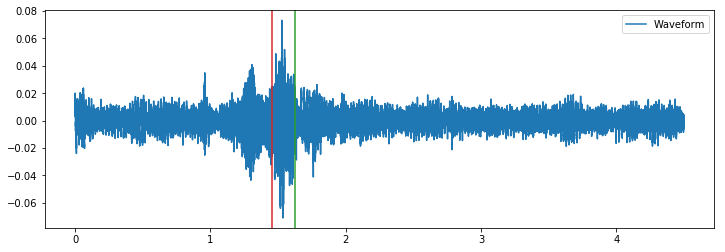

F:/main_total\181121_HHJ_C_43_F.wav


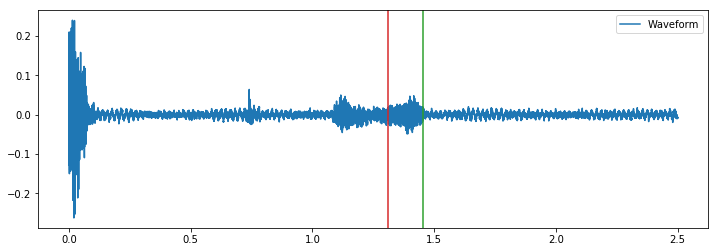

F:/main_total\181121_HHJ_C_44_F.wav


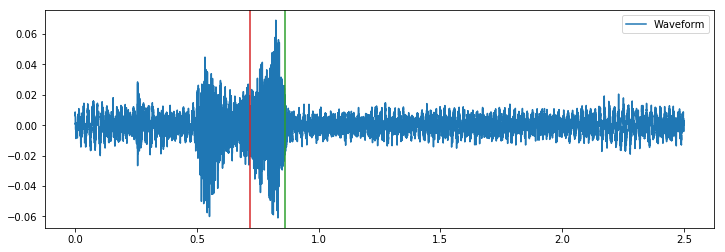

F:/main_total\181121_HHJ_C_45_F.wav


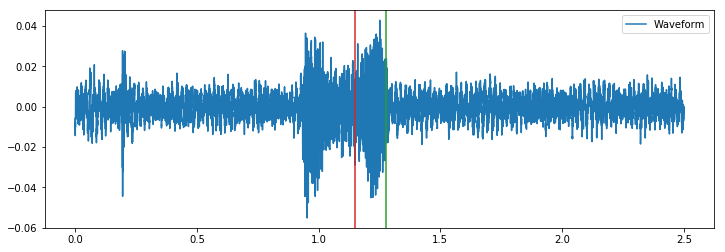

F:/main_total\181121_HHJ_C_46_F.wav


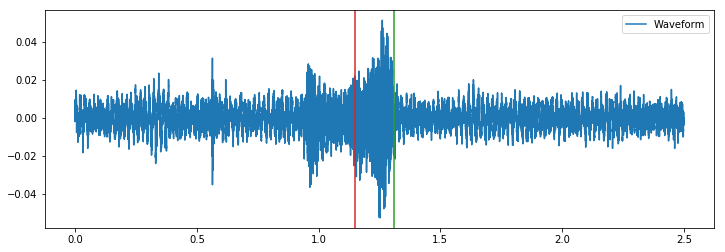

F:/main_total\181121_HHJ_C_47_F.wav


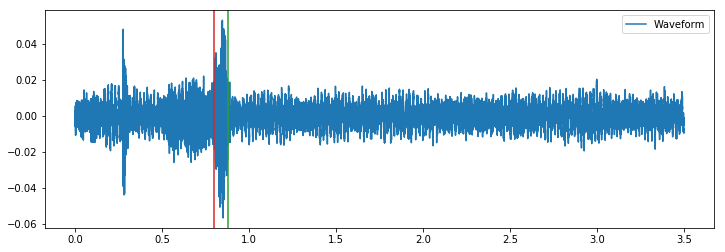

F:/main_total\181121_HHJ_C_48_F.wav


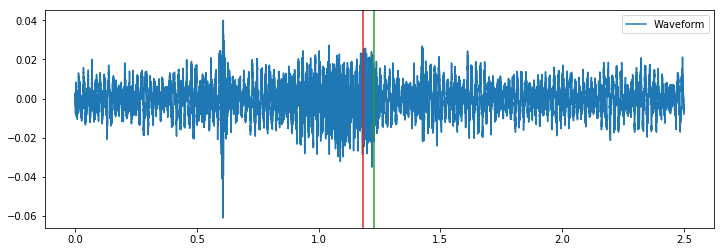

F:/main_total\181121_HHJ_C_49_F.wav


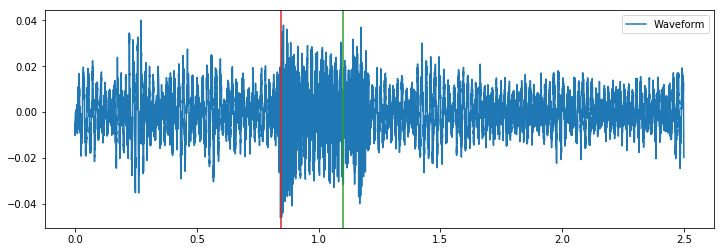

F:/main_total\181121_HHJ_C_50_F.wav


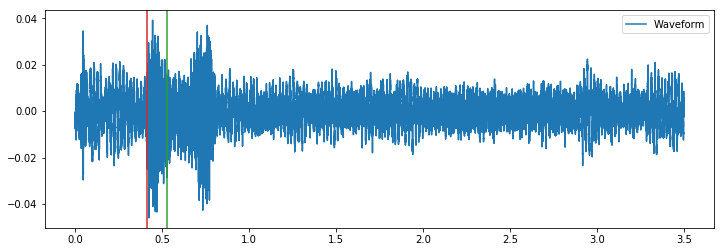

F:/main_total\181121_HHJ_C_51_F.wav


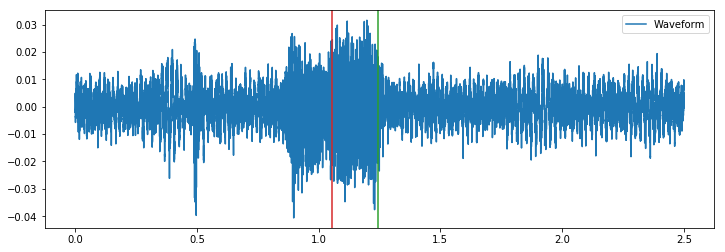

F:/main_total\181121_HHJ_C_52_F.wav


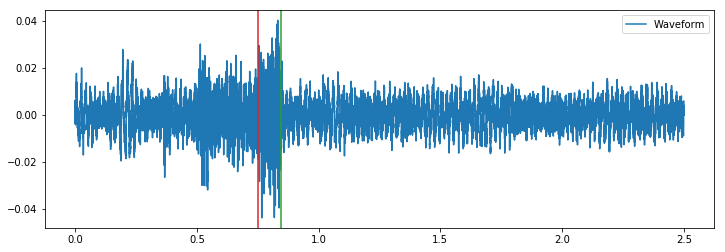

F:/main_total\181121_HHJ_C_53_F.wav


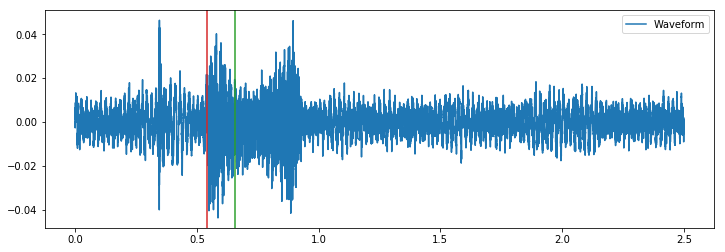

F:/main_total\181121_HHJ_C_54_F.wav


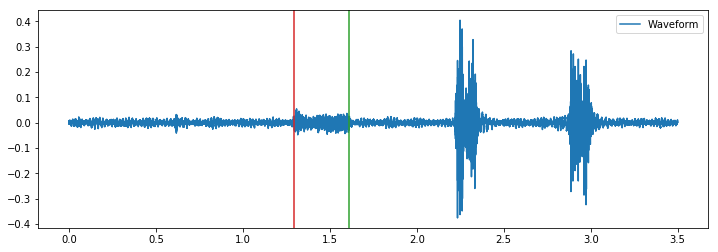

F:/main_total\181121_HHJ_C_60_F.wav


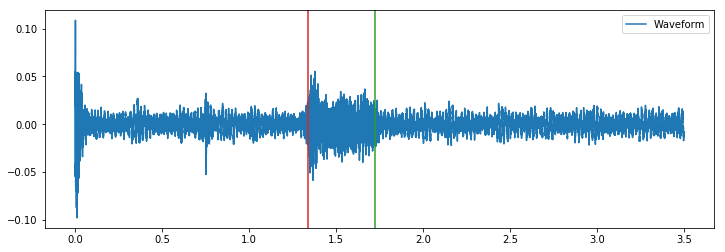

F:/main_total\181121_HHJ_C_61_F.wav


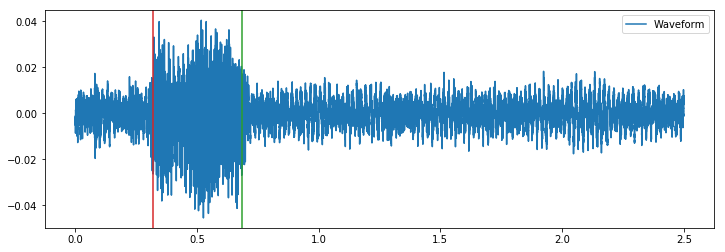

F:/main_total\181121_HHJ_C_62_F.wav


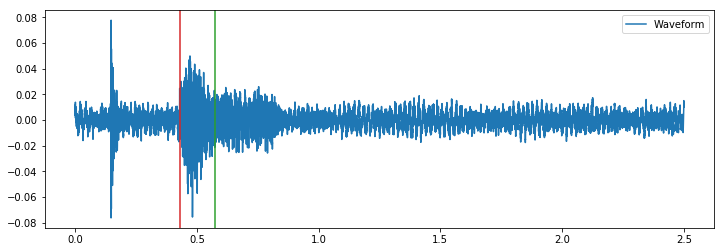

F:/main_total\181121_HHJ_C_63_F.wav


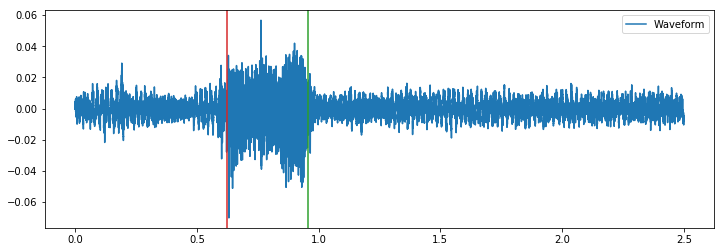

F:/main_total\181121_HHJ_C_64_F.wav


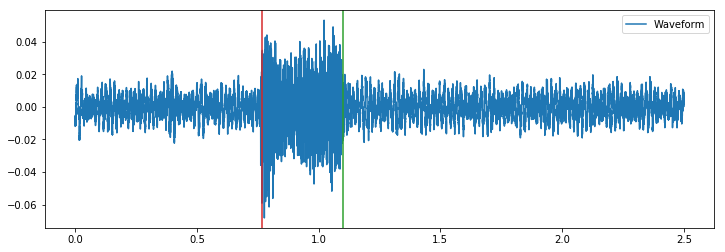

F:/main_total\181121_HHJ_C_65_F.wav


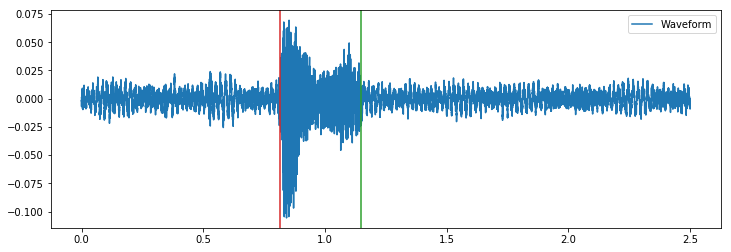

F:/main_total\181121_HHJ_C_66_F.wav


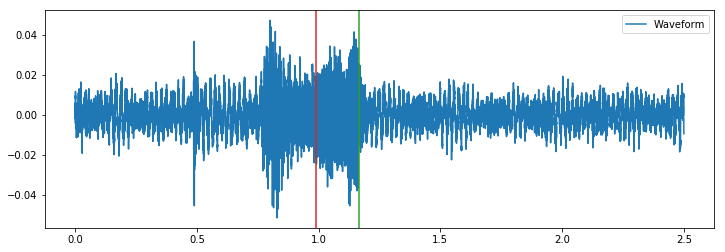

F:/main_total\181121_HHJ_C_67_F.wav


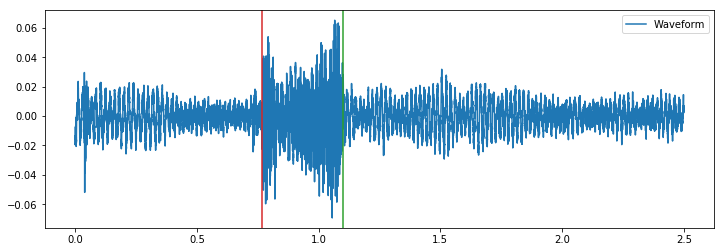

F:/main_total\181121_HHJ_C_68_F.wav


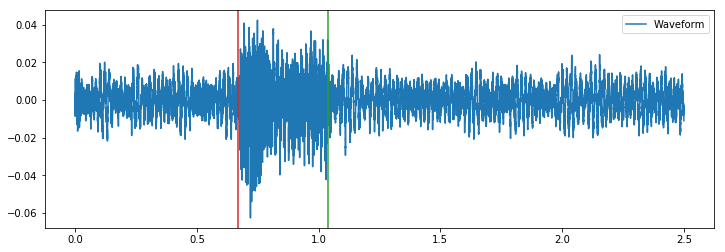

F:/main_total\181121_HHJ_C_69_F.wav


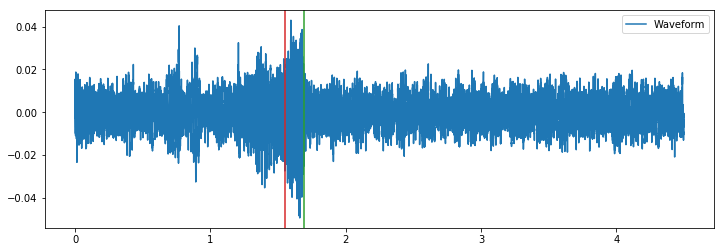

F:/main_total\181127_WJM_C_1_T.wav


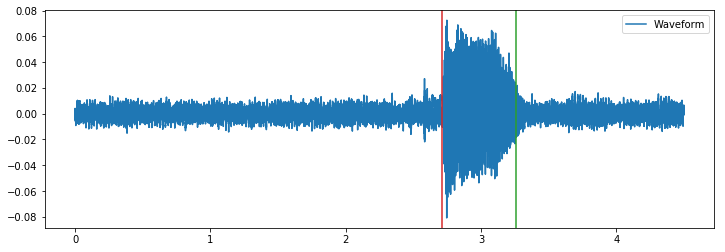

F:/main_total\181127_WJM_C_2_T.wav


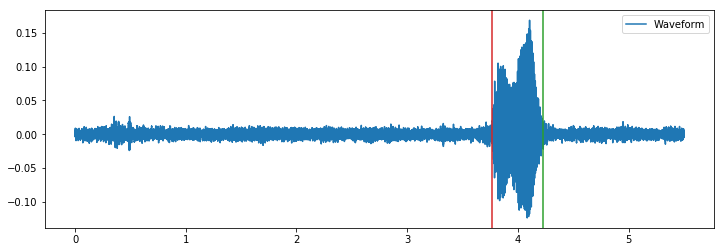

F:/main_total\181127_WJM_C_3_T.wav


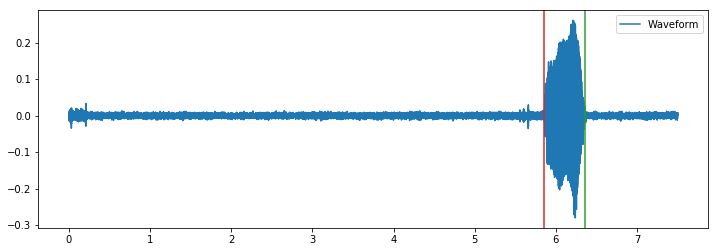

F:/main_total\181127_WJM_C_4_T.wav


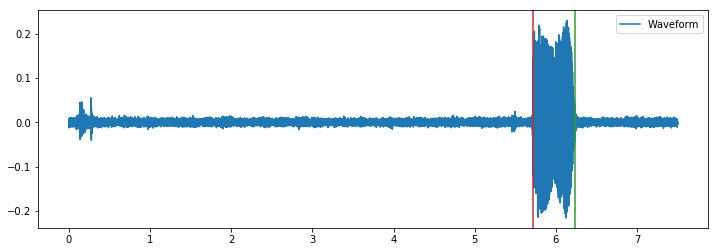

F:/main_total\181127_WJM_C_5_T.wav


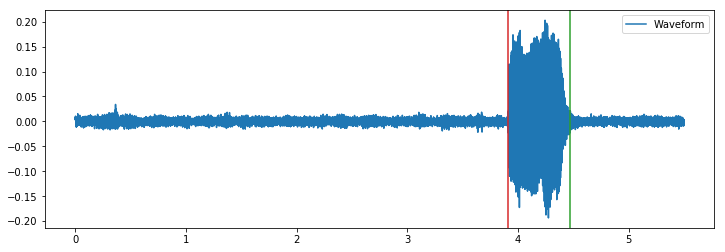

F:/main_total\181127_WJM_C_6_T.wav


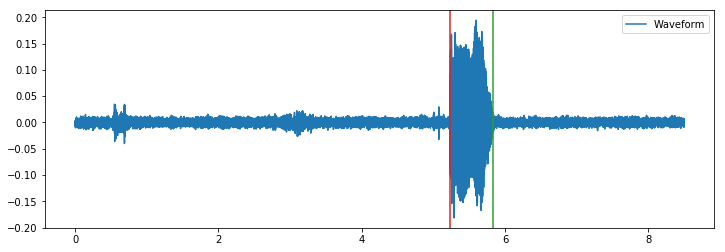

F:/main_total\181127_WJM_C_7_T.wav


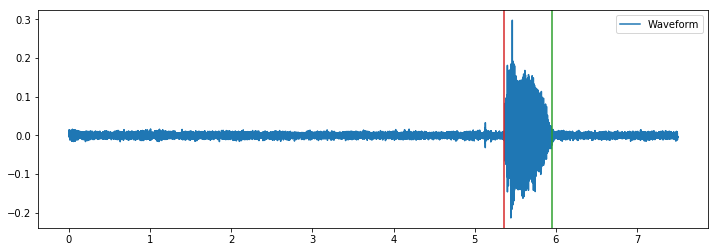

F:/main_total\181127_WJM_C_8_T.wav


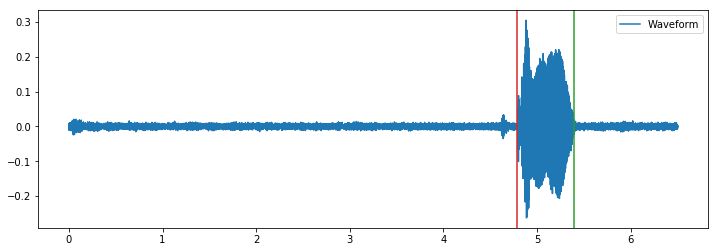

F:/main_total\181127_WJM_C_9_T.wav


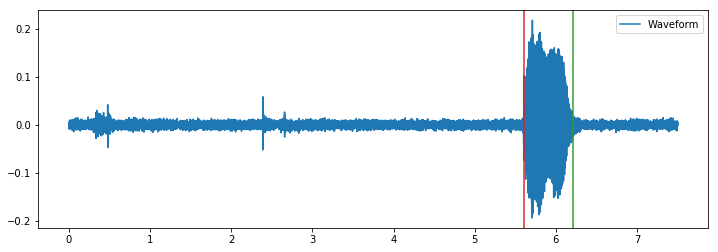

F:/main_total\181127_WJM_C_10_T.wav


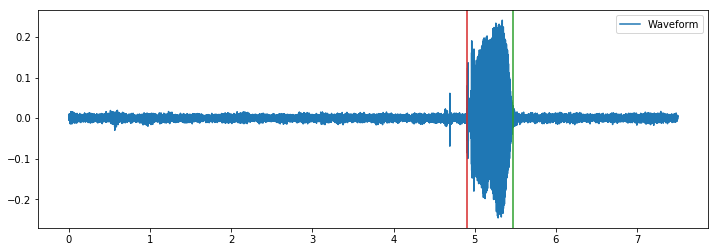

F:/main_total\181127_WJM_C_11_T.wav


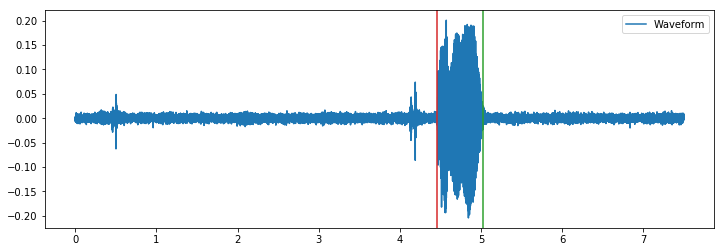

F:/main_total\181127_WJM_C_12_T.wav


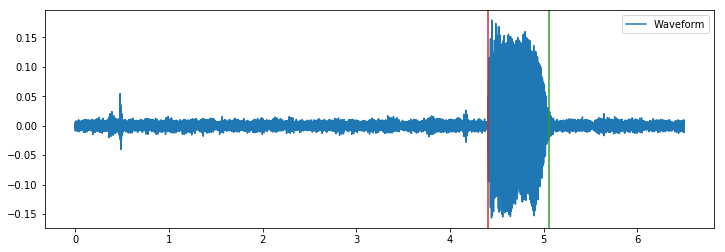

F:/main_total\181127_WJM_C_13_T.wav


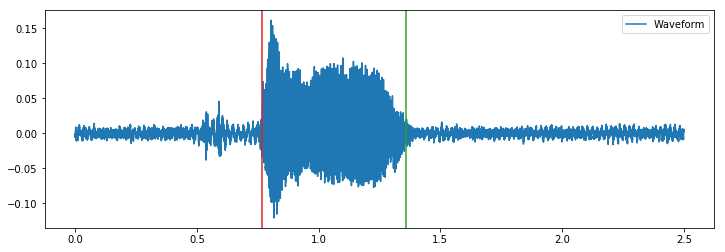

F:/main_total\181127_WJM_C_14_T.wav


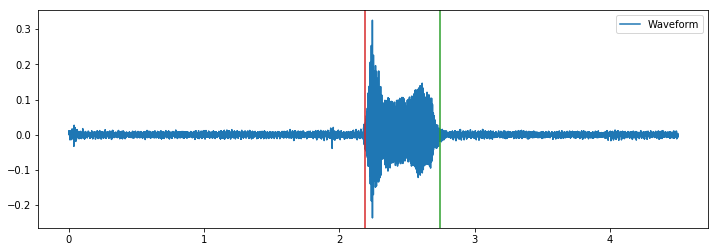

F:/main_total\181127_WJM_C_15_T.wav


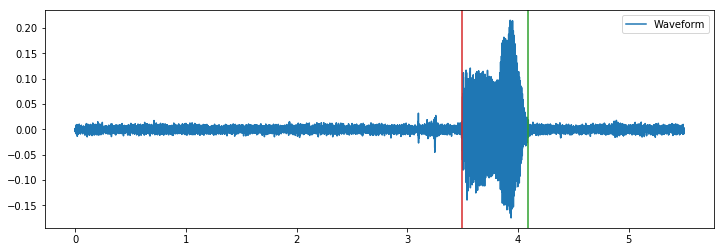

F:/main_total\181127_WJM_C_16_T.wav


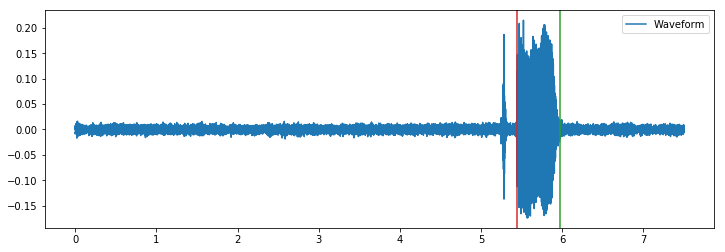

F:/main_total\181127_WJM_C_17_T.wav


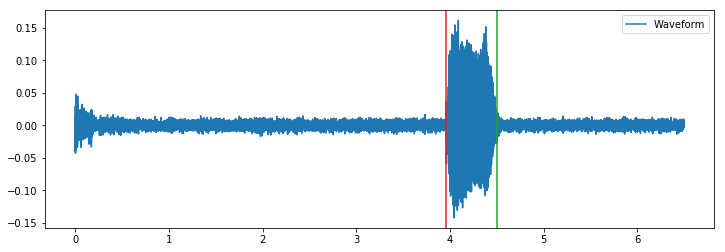

F:/main_total\181127_WJM_C_18_T.wav


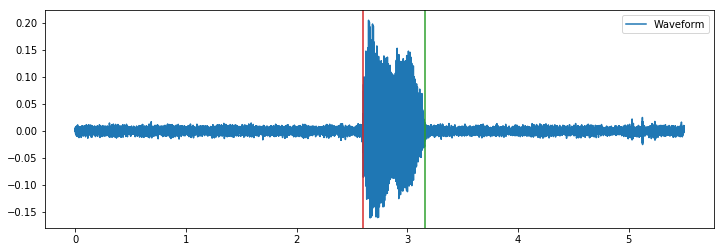

F:/main_total\181127_WJM_C_19_T.wav


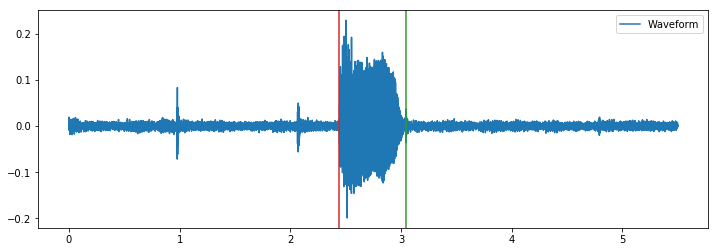

F:/main_total\181127_WJM_C_20_T.wav


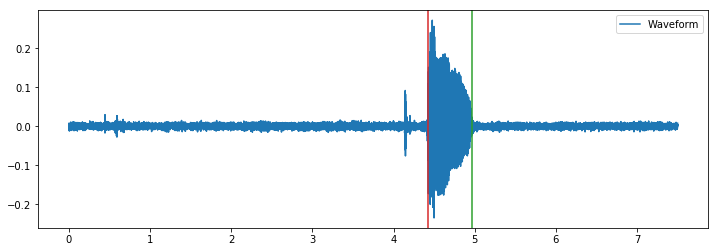

F:/main_total\181127_WJM_C_21_T.wav


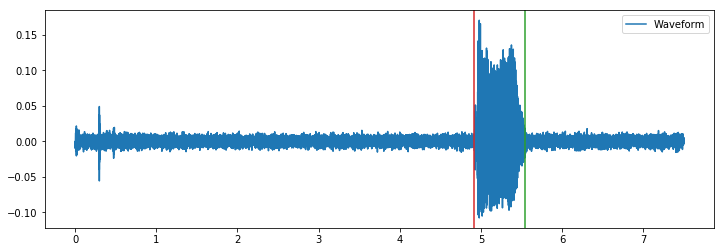

F:/main_total\181127_WJM_C_22_T.wav


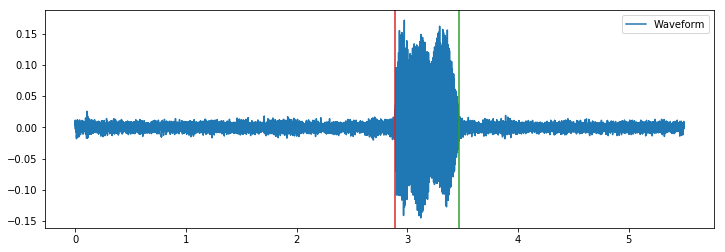

F:/main_total\181127_WJM_C_28_T.wav


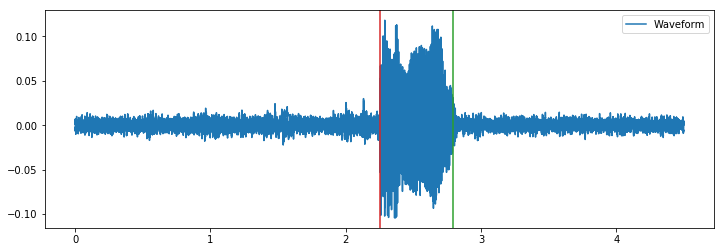

F:/main_total\181127_WJM_C_29_T.wav


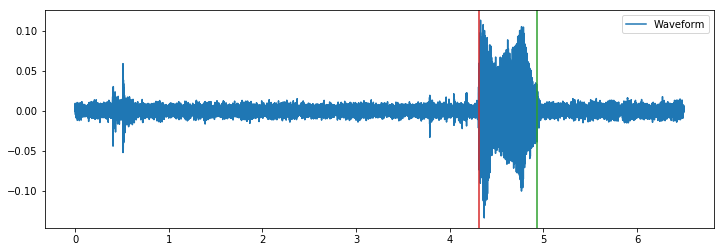

F:/main_total\181127_WJM_C_30_T.wav


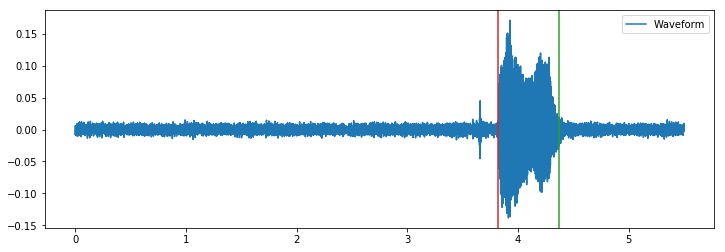

F:/main_total\181127_WJM_C_31_T.wav


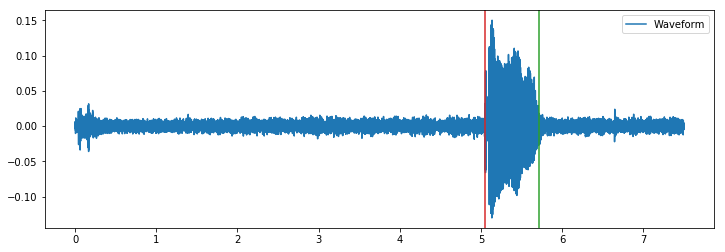

F:/main_total\181127_WJM_C_32_T.wav


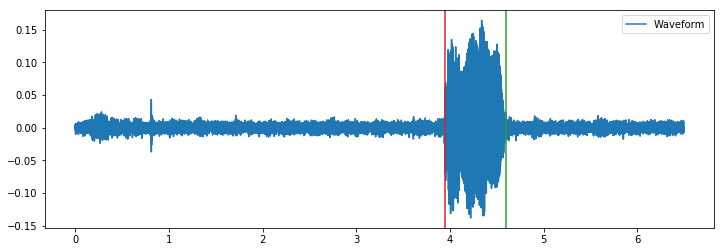

F:/main_total\181127_WJM_C_33_T.wav


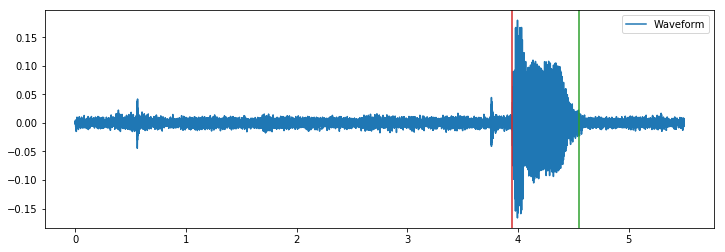

F:/main_total\181127_WJM_C_34_T.wav


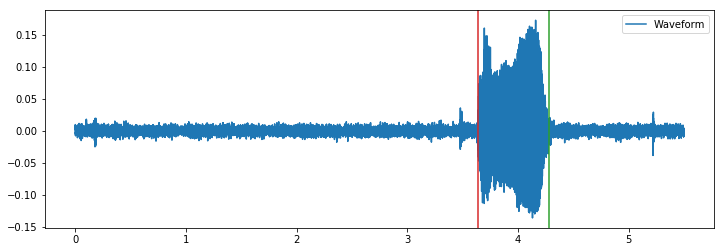

F:/main_total\181127_WJM_C_35_T.wav


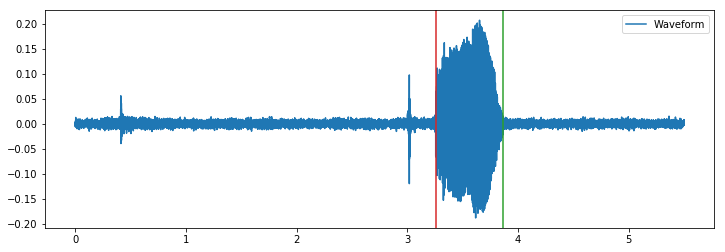

F:/main_total\181127_WJM_C_36_T.wav


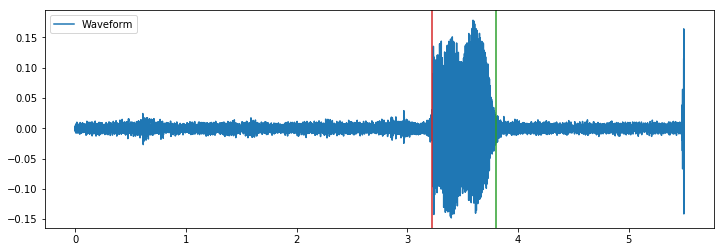

F:/main_total\181127_WJM_C_37_T.wav


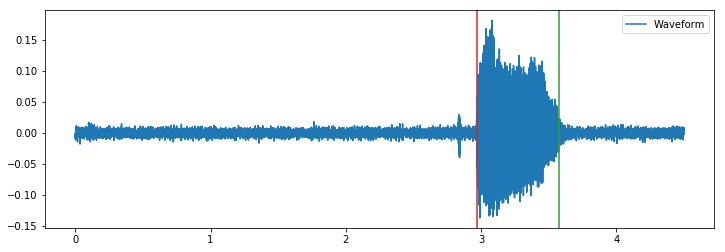

F:/main_total\181127_WJM_C_43_F.wav


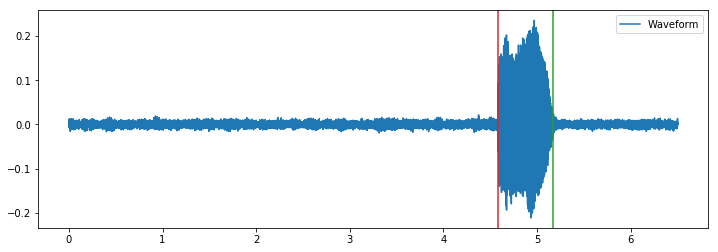

F:/main_total\181127_WJM_C_44_F.wav


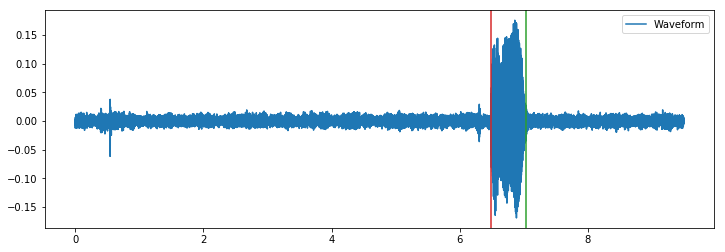

F:/main_total\181127_WJM_C_45_F.wav


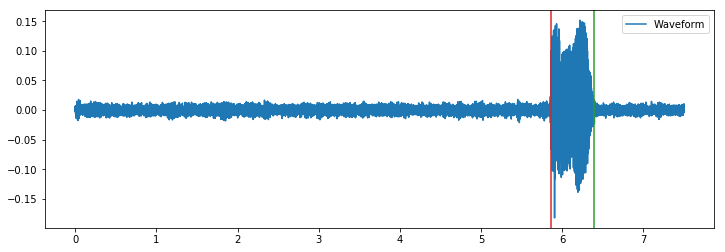

F:/main_total\181127_WJM_C_46_F.wav


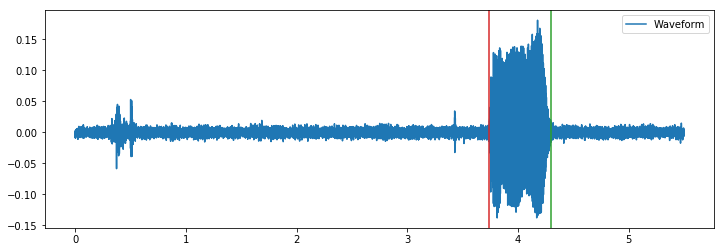

F:/main_total\181127_WJM_C_47_F.wav


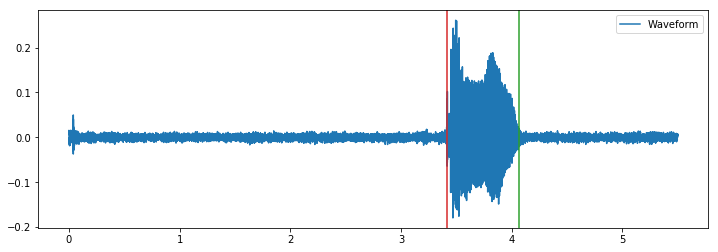

F:/main_total\181127_WJM_C_48_F.wav


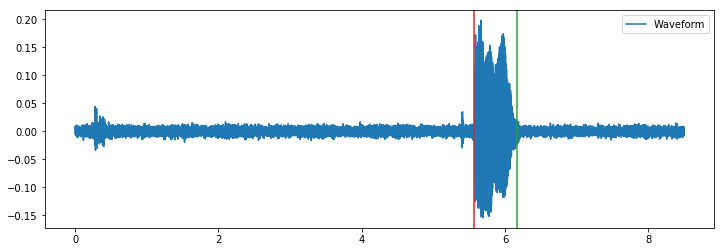

F:/main_total\181127_WJM_C_49_F.wav


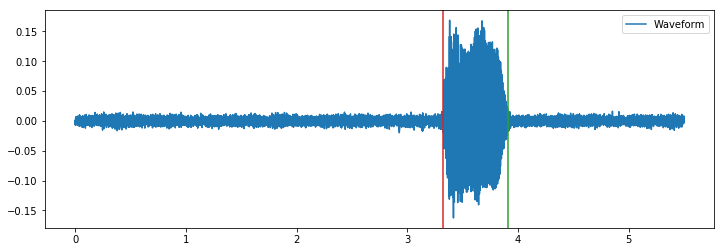

F:/main_total\181127_WJM_C_50_F.wav


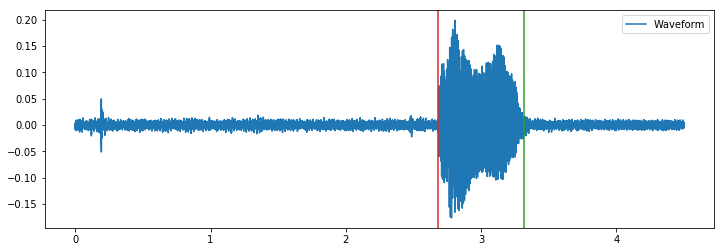

F:/main_total\181127_WJM_C_51_F.wav


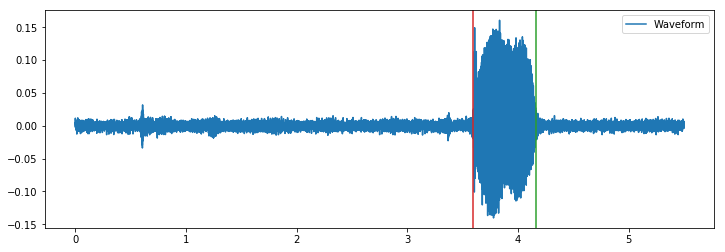

F:/main_total\181127_WJM_C_52_F.wav


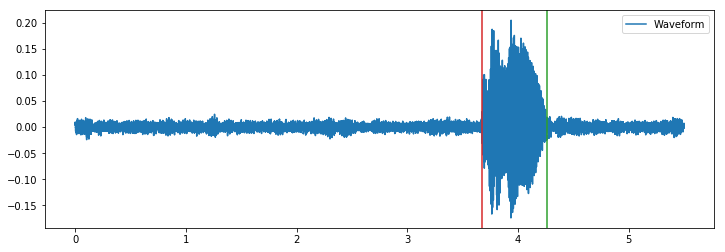

F:/main_total\181127_WJM_C_53_F.wav


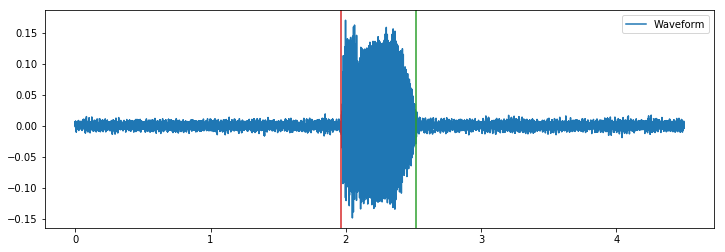

F:/main_total\181127_WJM_C_54_F.wav


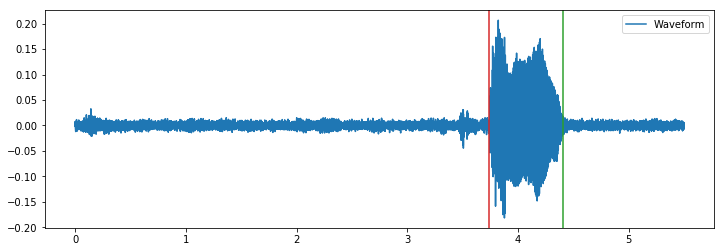

F:/main_total\181127_WJM_C_60_F.wav


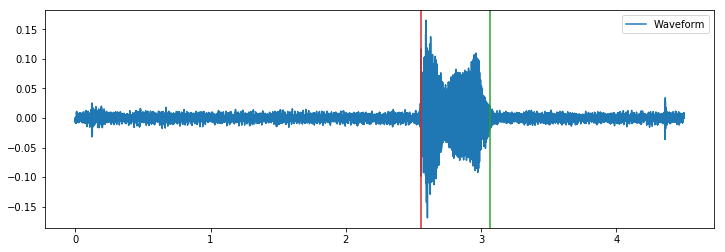

F:/main_total\181127_WJM_C_61_F.wav


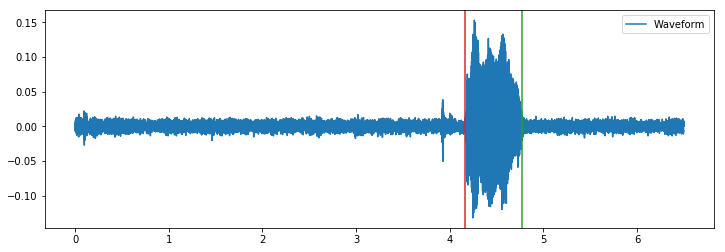

F:/main_total\181127_WJM_C_62_F.wav


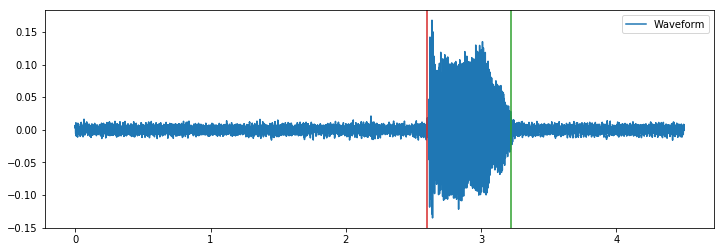

F:/main_total\181127_WJM_C_63_F.wav


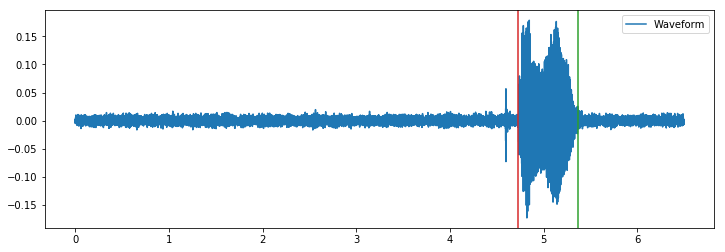

F:/main_total\181127_WJM_C_64_F.wav


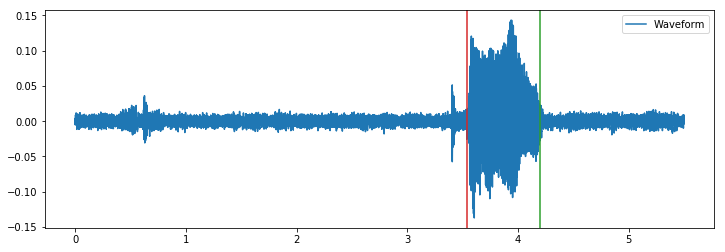

F:/main_total\181127_WJM_C_65_F.wav


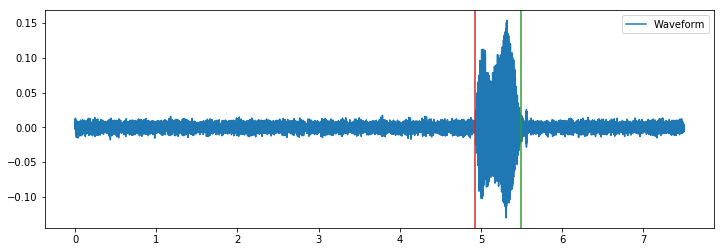

F:/main_total\181127_WJM_C_66_F.wav


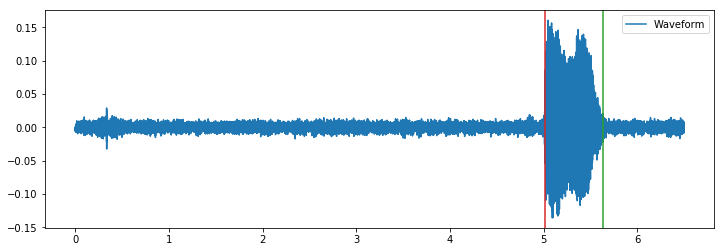

F:/main_total\181127_WJM_C_67_F.wav


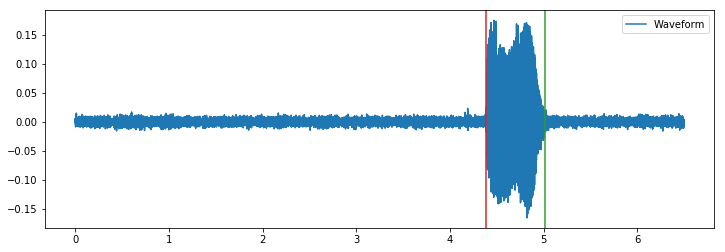

F:/main_total\181127_WJM_C_68_F.wav


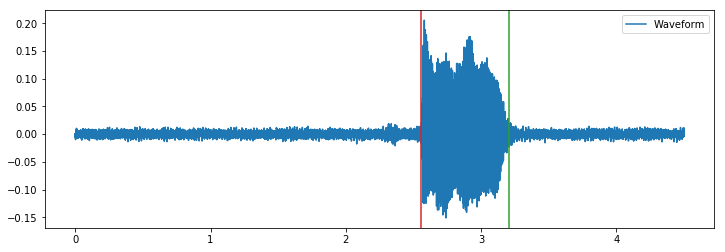

F:/main_total\181127_WJM_C_69_F.wav


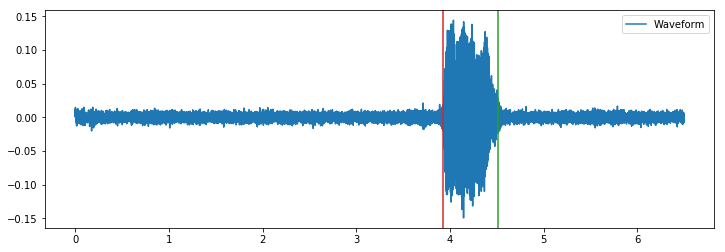

F:/main_total\180712_KSH_C_1_T.wav


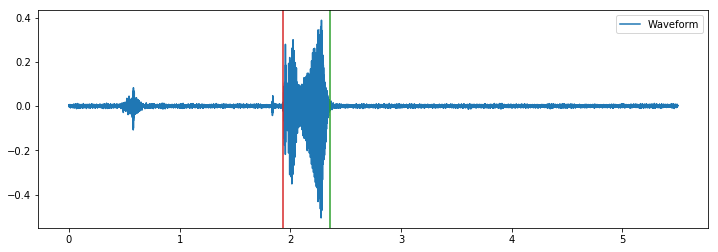

F:/main_total\180712_KSH_C_2_T.wav


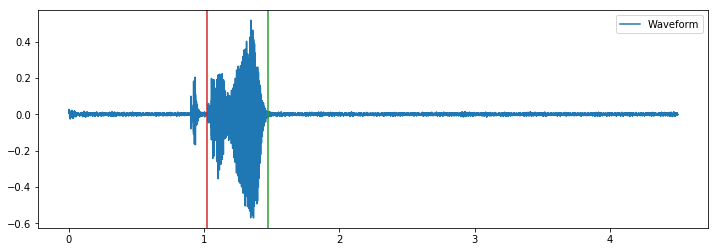

F:/main_total\180712_KSH_C_3_T.wav


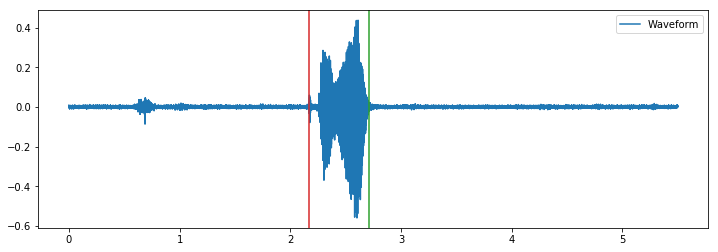

F:/main_total\180712_KSH_C_4_T.wav


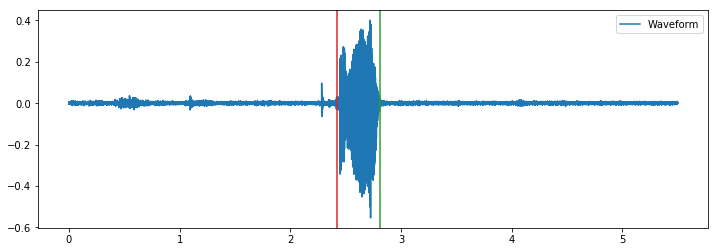

F:/main_total\180712_KSH_C_5_T.wav


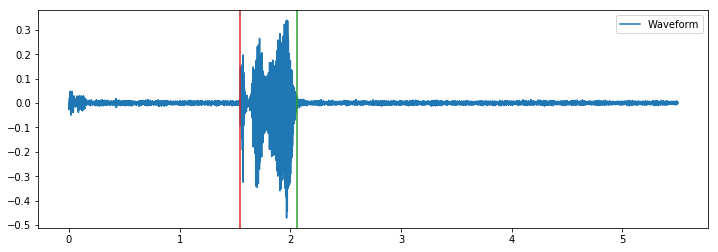

F:/main_total\180712_KSH_C_6_T.wav


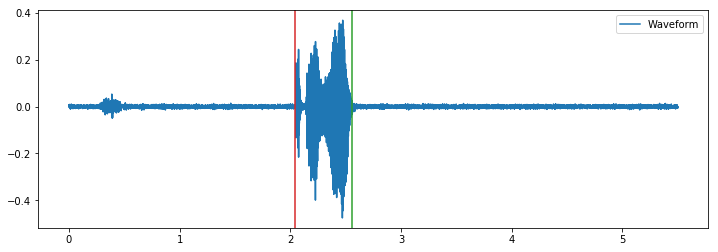

F:/main_total\180712_KSH_C_7_T.wav


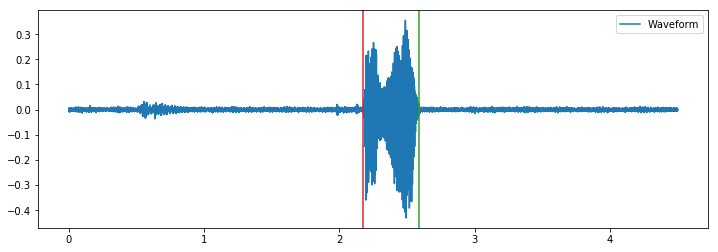

F:/main_total\180712_KSH_C_8_T.wav


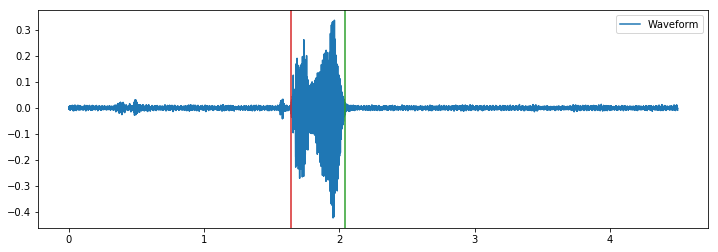

F:/main_total\180712_KSH_C_9_T.wav


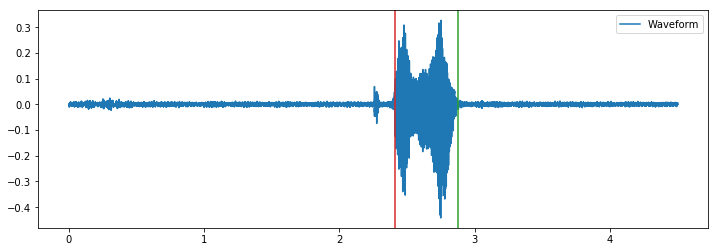

F:/main_total\180712_KSH_C_10_T.wav


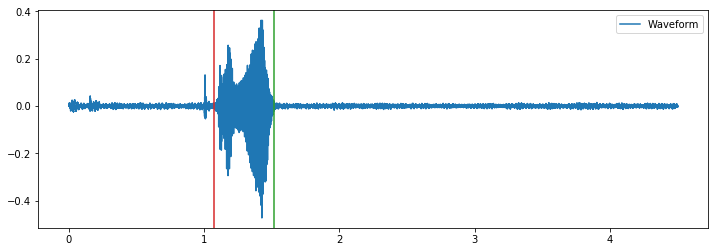

F:/main_total\180712_KSH_C_11_T.wav


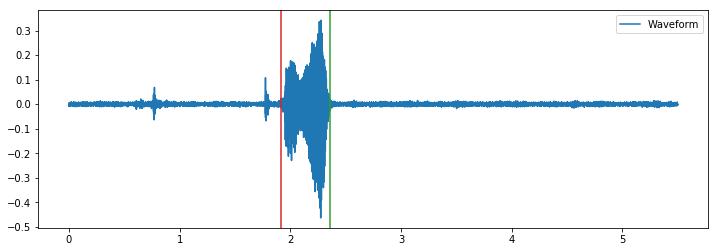

F:/main_total\180712_KSH_C_12_T.wav


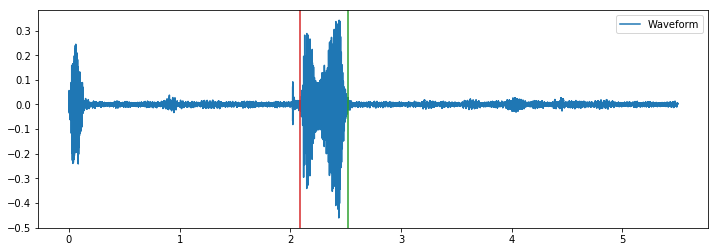

F:/main_total\180712_KSH_C_13_T.wav


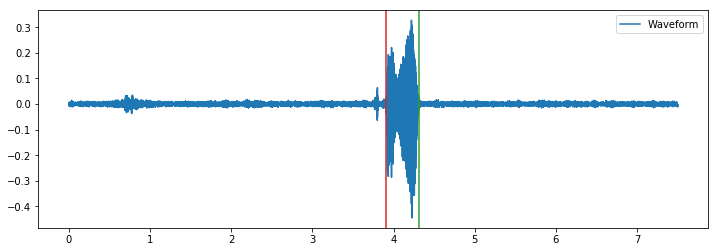

F:/main_total\180712_KSH_C_14_T.wav


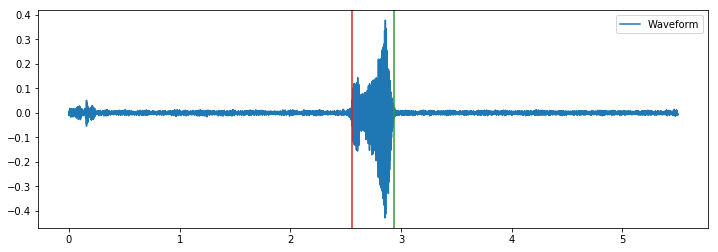

F:/main_total\180712_KSH_C_15_T.wav


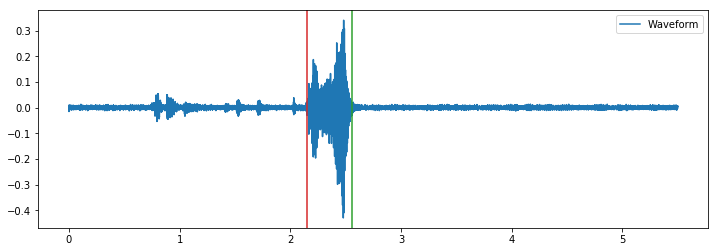

F:/main_total\180712_KSH_C_16_T.wav


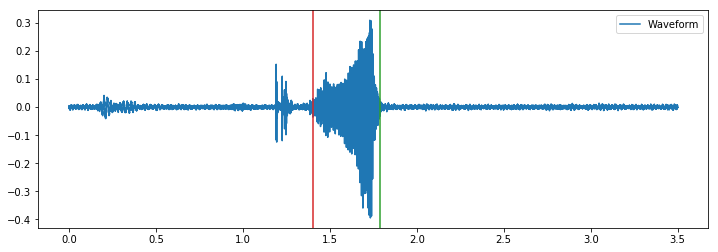

F:/main_total\180712_KSH_C_17_T.wav


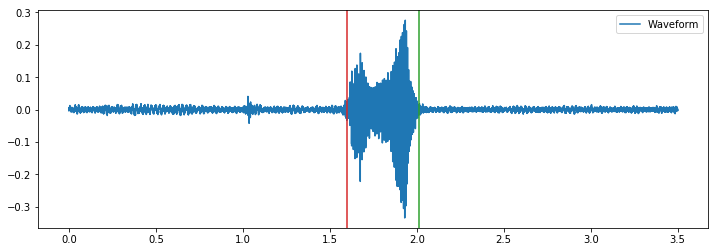

F:/main_total\180712_KSH_C_18_T.wav


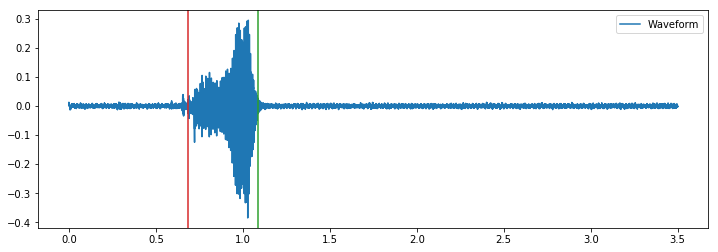

F:/main_total\180712_KSH_C_19_T.wav


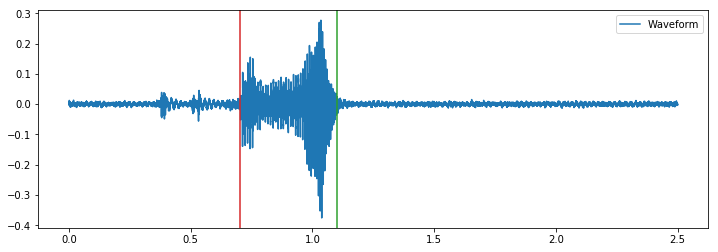

F:/main_total\180712_KSH_C_20_T.wav


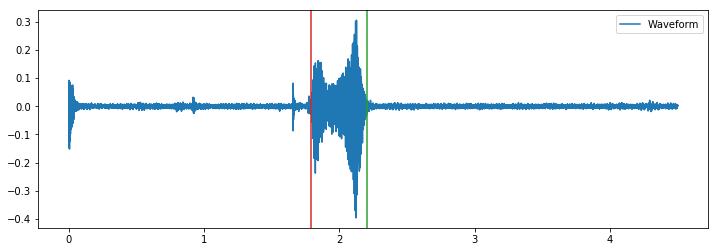

F:/main_total\180712_KSH_C_21_T.wav


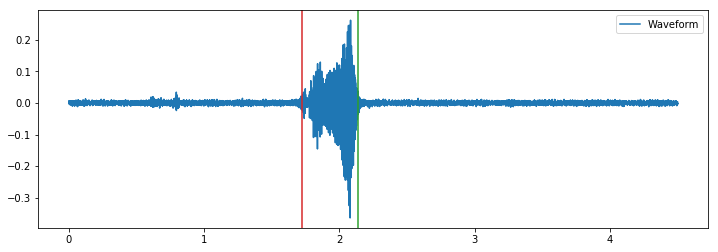

F:/main_total\180712_KSH_C_22_T.wav


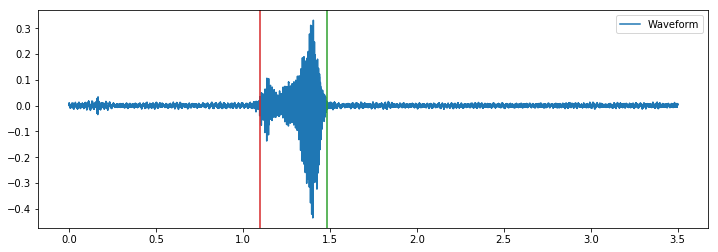

F:/main_total\180712_KSH_C_28_T.wav


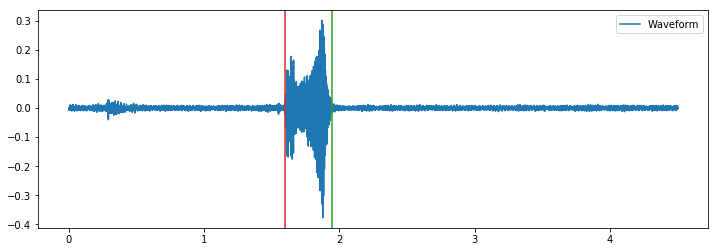

F:/main_total\180712_KSH_C_29_T.wav


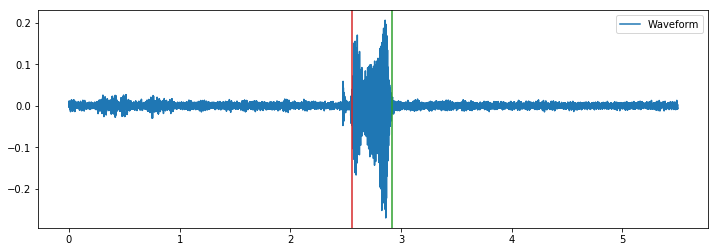

F:/main_total\180712_KSH_C_30_T.wav


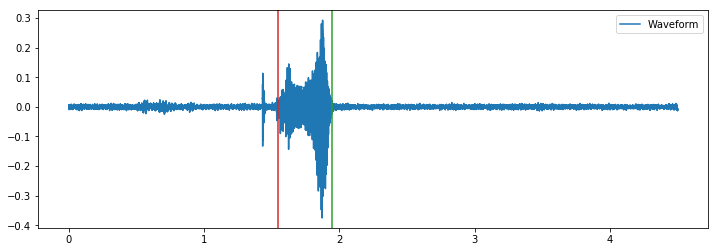

F:/main_total\180712_KSH_C_31_T.wav


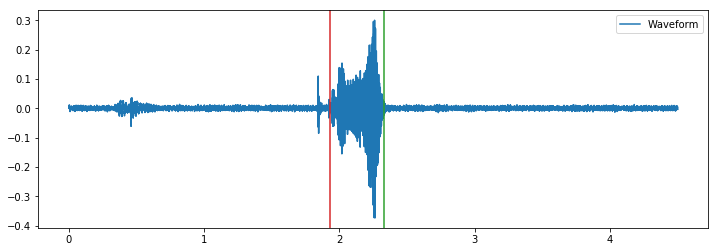

F:/main_total\180712_KSH_C_32_T.wav


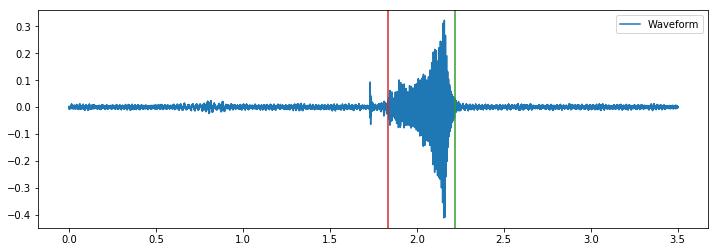

F:/main_total\180712_KSH_C_33_T.wav


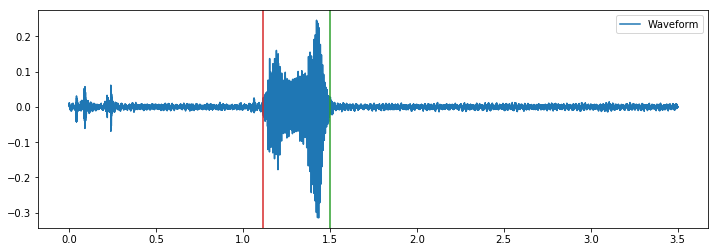

F:/main_total\180712_KSH_C_34_T.wav


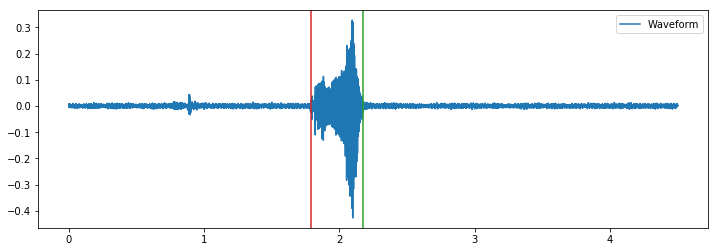

F:/main_total\180712_KSH_C_35_T.wav


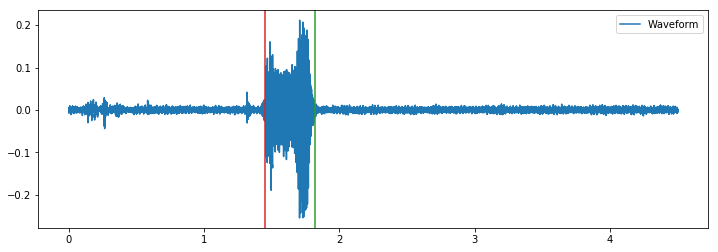

F:/main_total\180712_KSH_C_36_T.wav


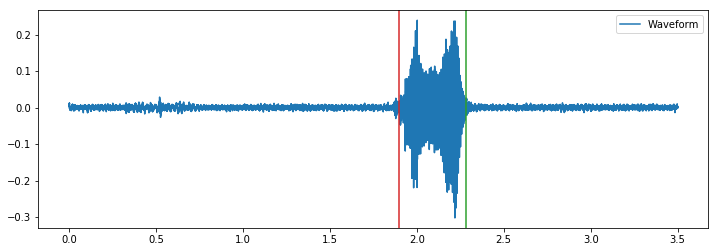

F:/main_total\180712_KSH_C_37_T.wav


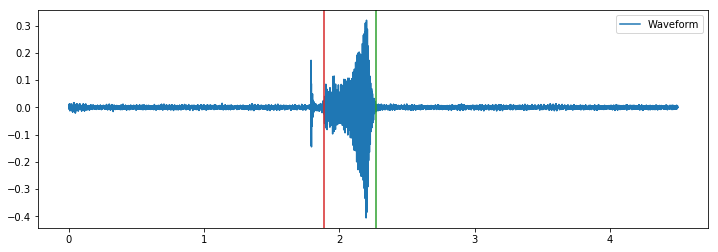

F:/main_total\180712_KSH_C_43_F.wav


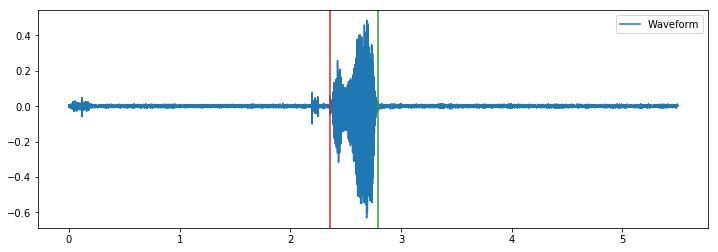

F:/main_total\180712_KSH_C_44_F.wav


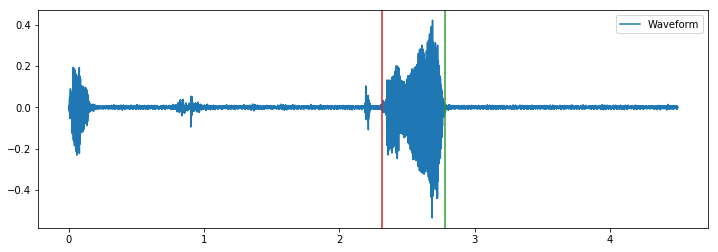

F:/main_total\180712_KSH_C_45_F.wav


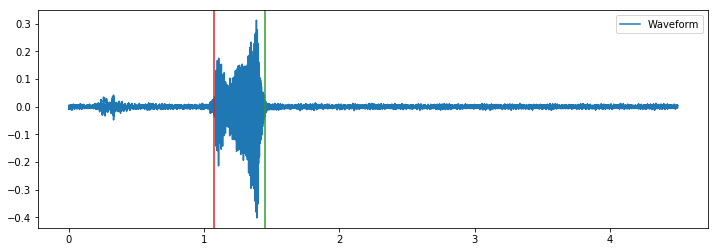

F:/main_total\180712_KSH_C_46_F.wav


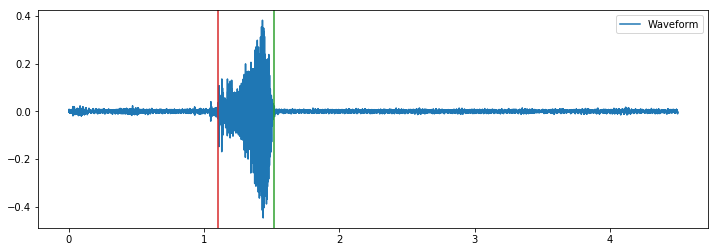

F:/main_total\180712_KSH_C_47_F.wav


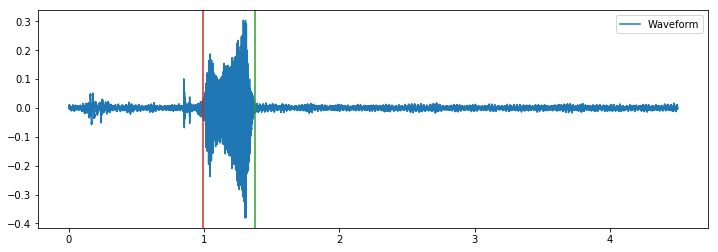

F:/main_total\180712_KSH_C_48_F.wav


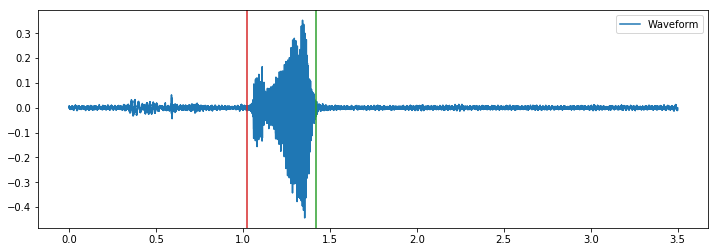

F:/main_total\180712_KSH_C_49_F.wav


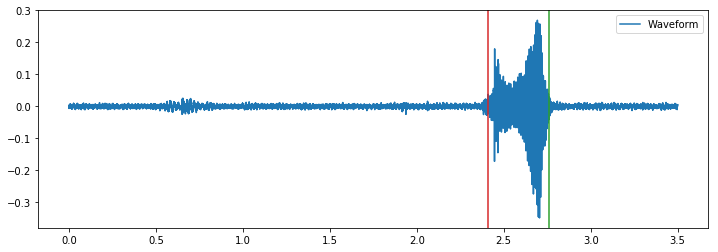

F:/main_total\180712_KSH_C_50_F.wav


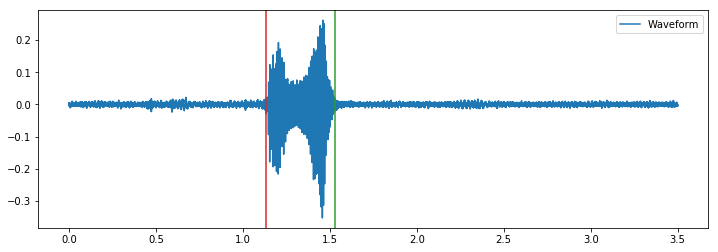

F:/main_total\180712_KSH_C_51_F.wav


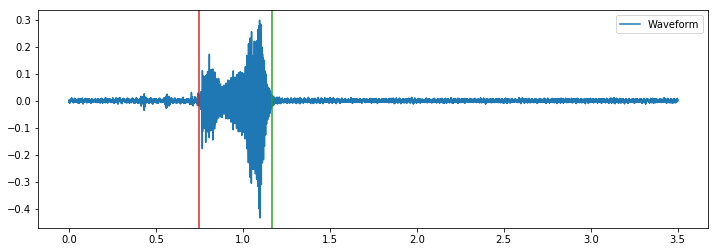

F:/main_total\180712_KSH_C_52_F.wav


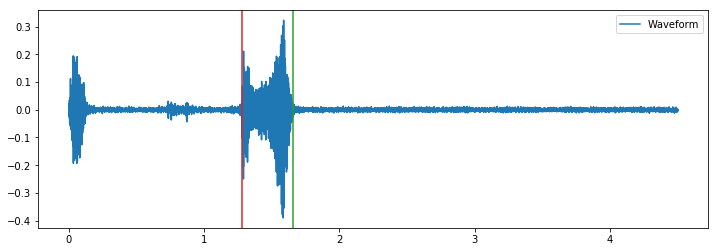

F:/main_total\180712_KSH_C_53_F.wav


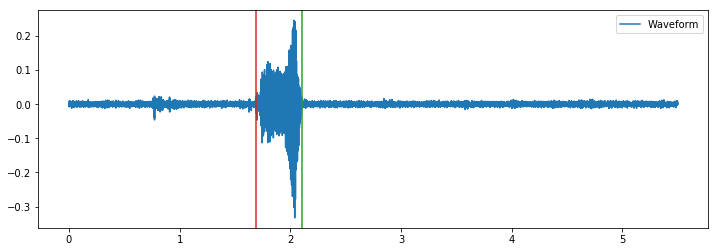

F:/main_total\180712_KSH_C_54_F.wav


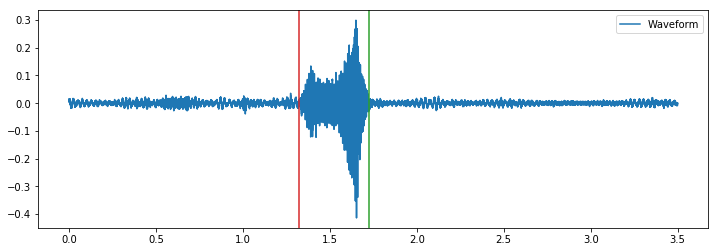

F:/main_total\180712_KSH_C_60_F.wav


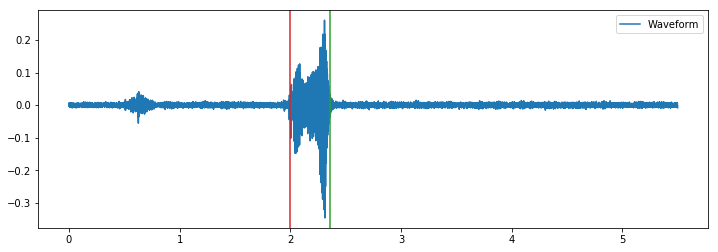

F:/main_total\180712_KSH_C_61_F.wav


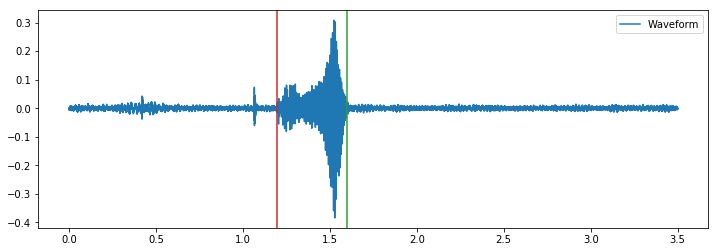

F:/main_total\180712_KSH_C_62_F.wav


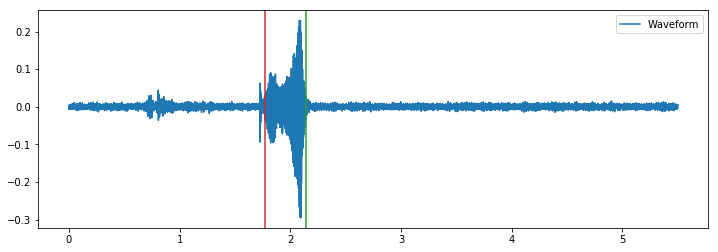

F:/main_total\180712_KSH_C_63_F.wav


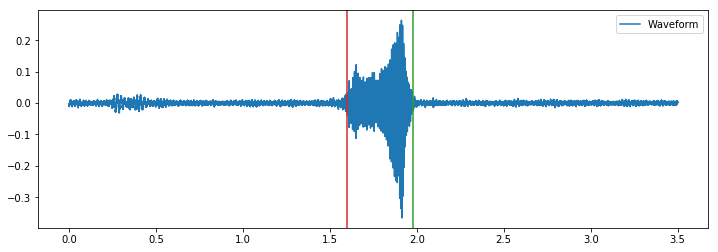

F:/main_total\180712_KSH_C_64_F.wav


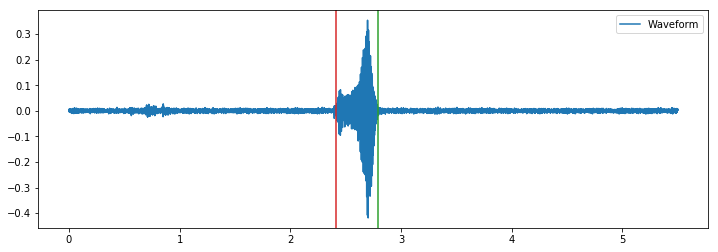

F:/main_total\180712_KSH_C_65_F.wav


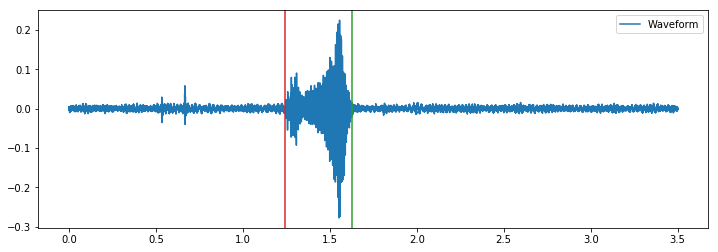

F:/main_total\180712_KSH_C_66_F.wav


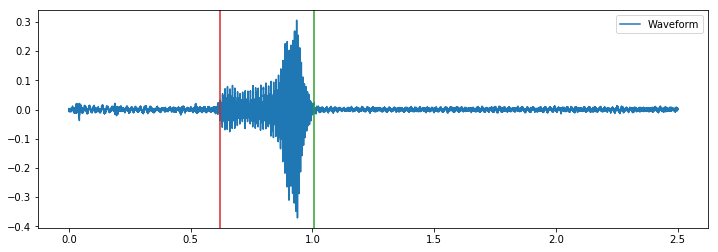

F:/main_total\180712_KSH_C_67_F.wav


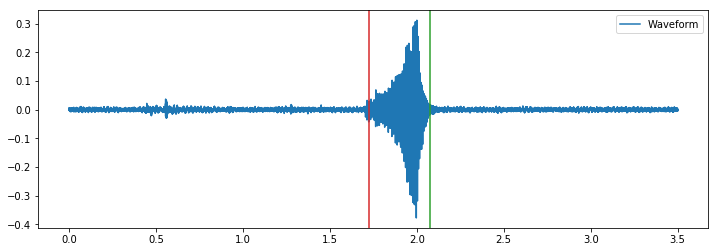

F:/main_total\180712_KSH_C_68_F.wav


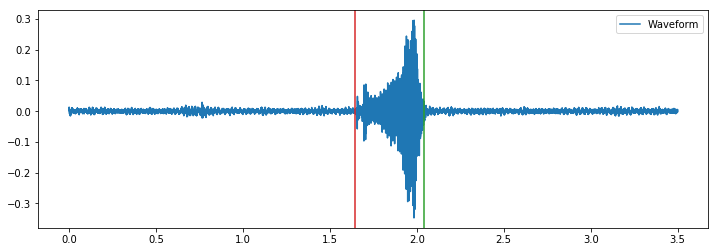

F:/main_total\180712_KSH_C_69_F.wav


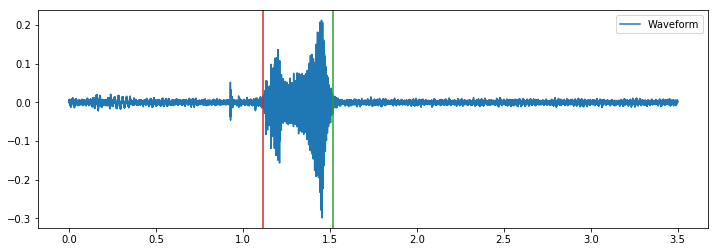

F:/main_total\180712_KKA_C_1_T.wav


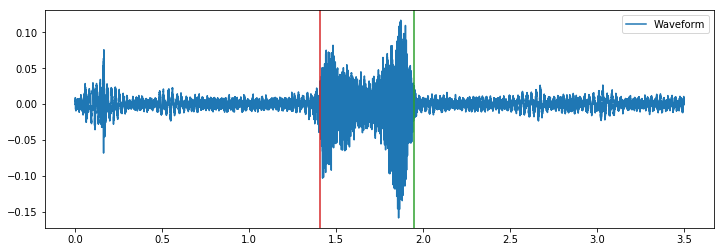

F:/main_total\180712_KKA_C_2_T.wav


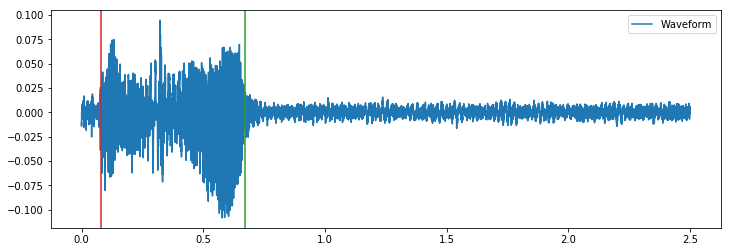

F:/main_total\180712_KKA_C_3_T.wav


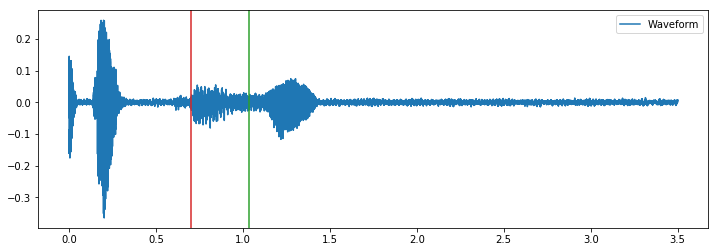

F:/main_total\180712_KKA_C_4_T.wav


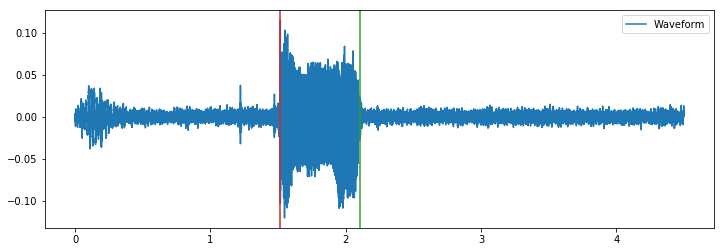

F:/main_total\180712_KKA_C_5_T.wav


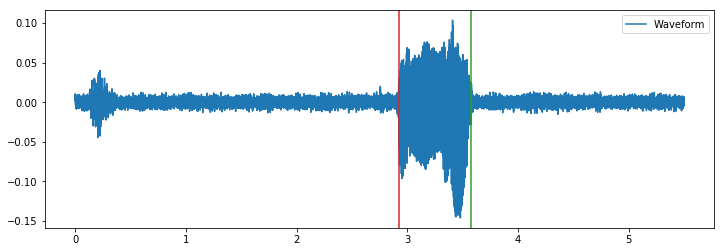

F:/main_total\180712_KKA_C_6_T.wav


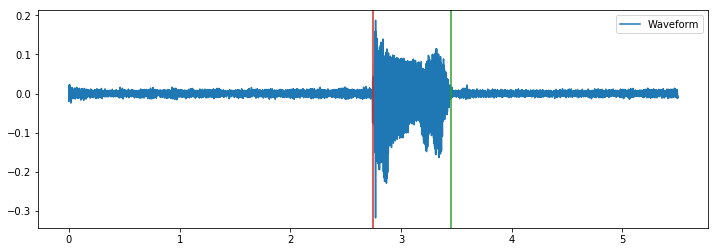

F:/main_total\180712_KKA_C_7_T.wav


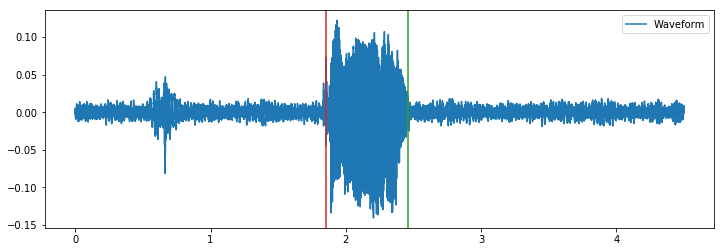

F:/main_total\180712_KKA_C_8_T.wav


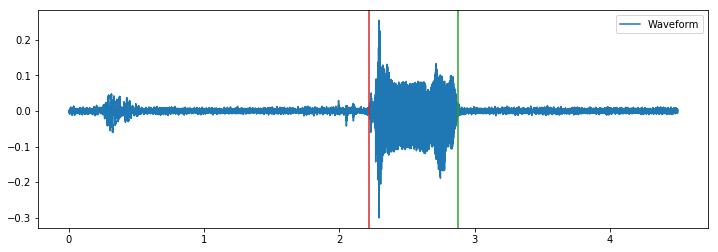

F:/main_total\180712_KKA_C_9_T.wav


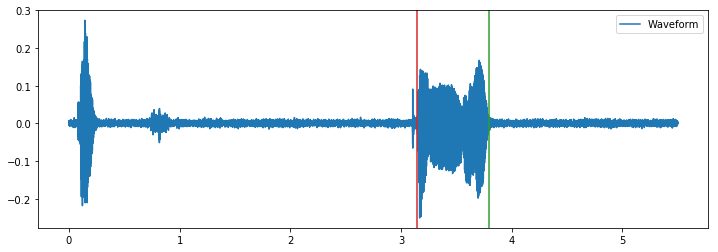

F:/main_total\180712_KKA_C_10_T.wav


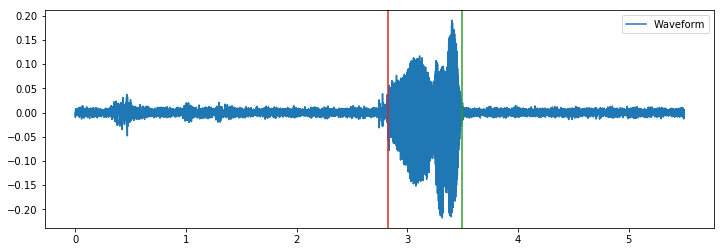

F:/main_total\180712_KKA_C_11_T.wav


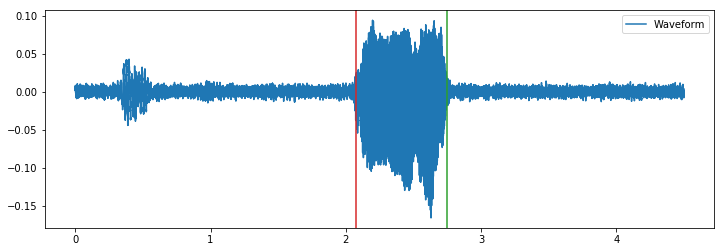

F:/main_total\180712_KKA_C_12_T.wav


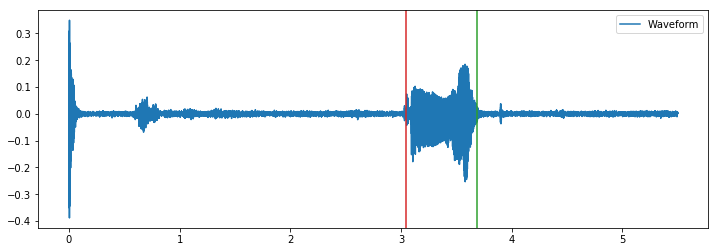

F:/main_total\180712_KKA_C_13_T.wav


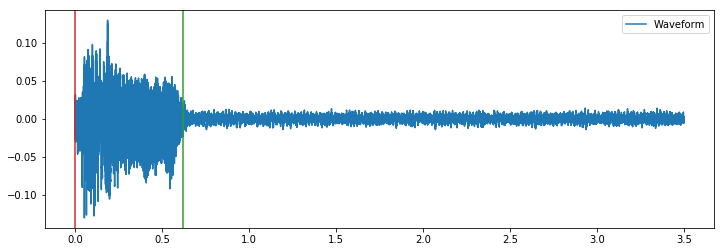

F:/main_total\180712_KKA_C_14_T.wav


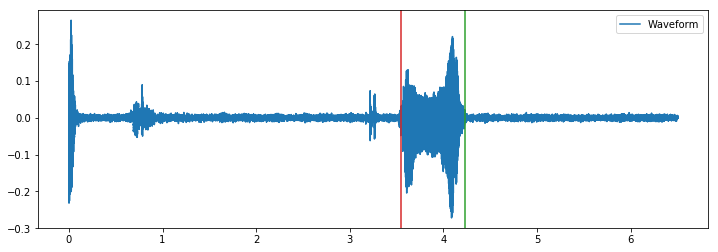

F:/main_total\180712_KKA_C_15_T.wav


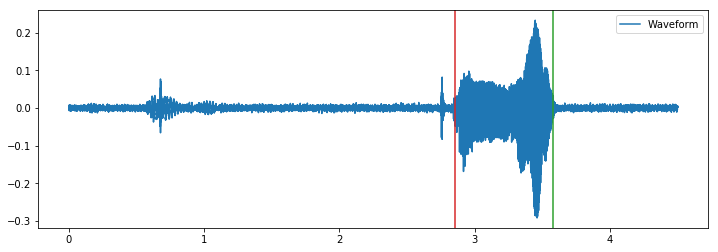

F:/main_total\180712_KKA_C_16_T.wav


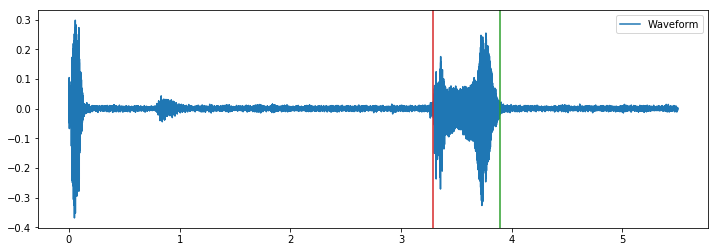

F:/main_total\180712_KKA_C_17_T.wav


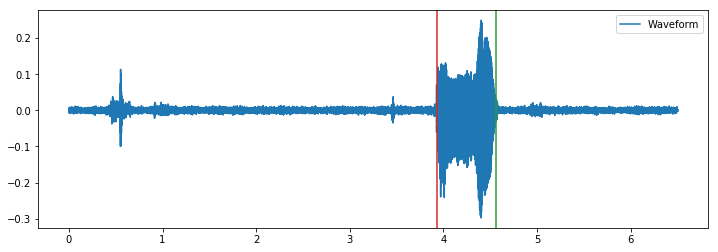

F:/main_total\180712_KKA_C_18_T.wav


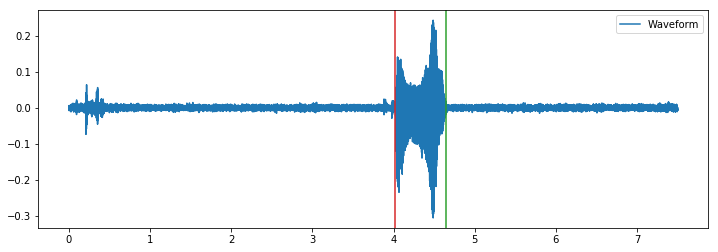

F:/main_total\180712_KKA_C_19_T.wav


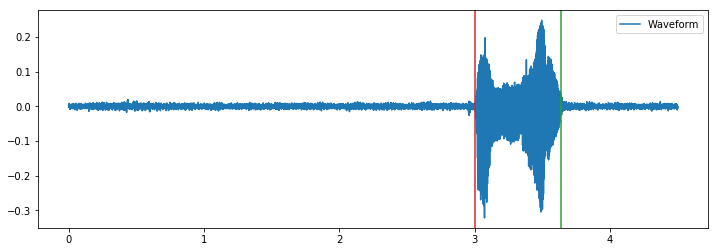

F:/main_total\180712_KKA_C_20_T.wav


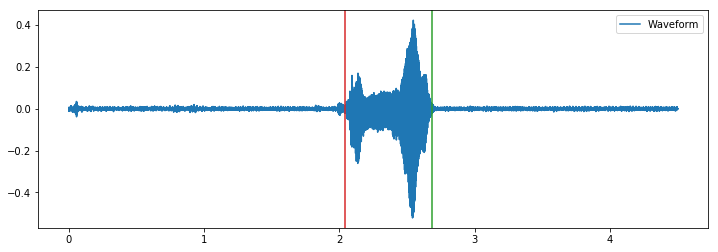

F:/main_total\180712_KKA_C_21_T.wav


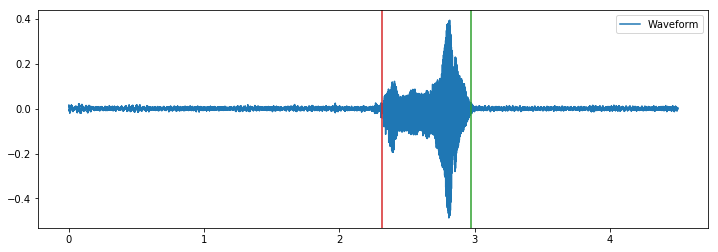

F:/main_total\180712_KKA_C_22_T.wav


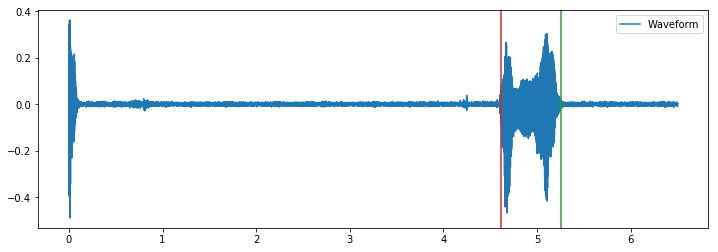

F:/main_total\180712_KKA_C_28_T.wav


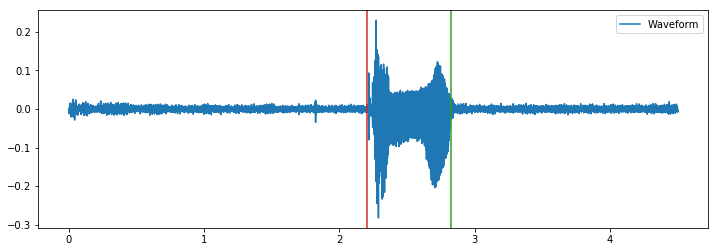

F:/main_total\180712_KKA_C_29_T.wav


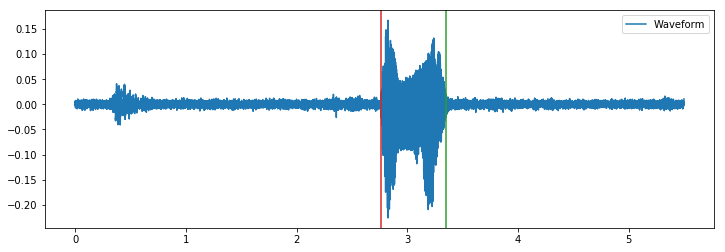

F:/main_total\180712_KKA_C_30_T.wav


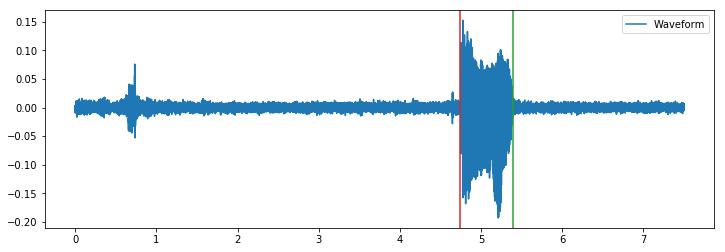

F:/main_total\180712_KKA_C_31_T.wav


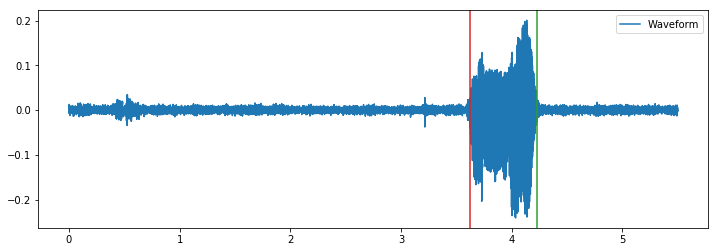

F:/main_total\180712_KKA_C_32_T.wav


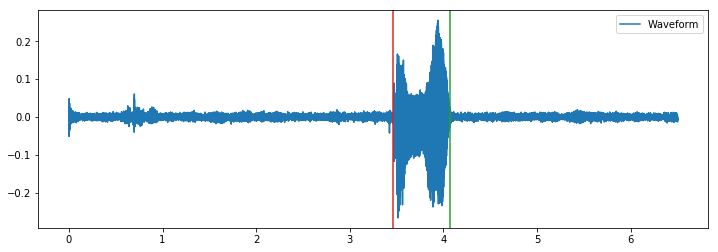

F:/main_total\180712_KKA_C_33_T.wav


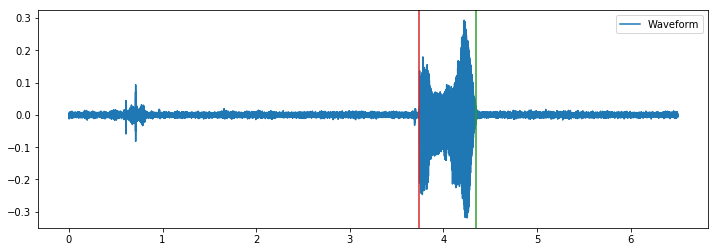

F:/main_total\180712_KKA_C_34_T.wav


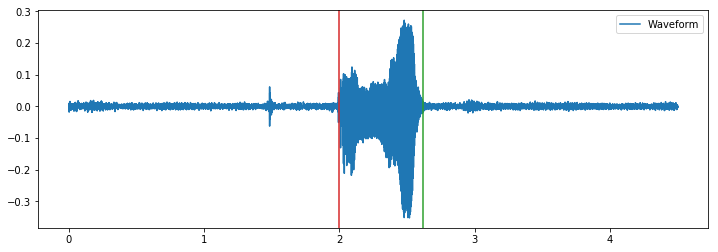

F:/main_total\180712_KKA_C_35_T.wav


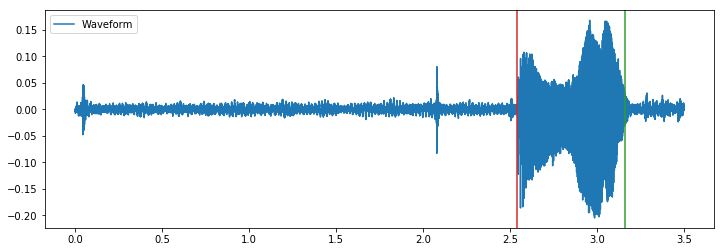

F:/main_total\180712_KKA_C_36_T.wav


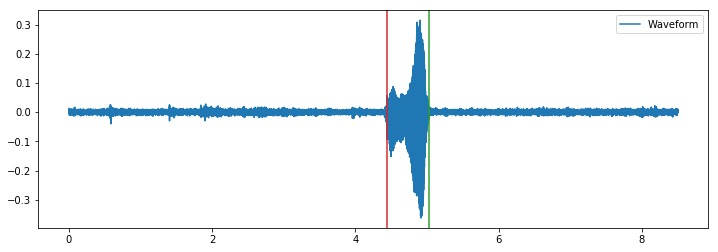

F:/main_total\180712_KKA_C_37_T.wav


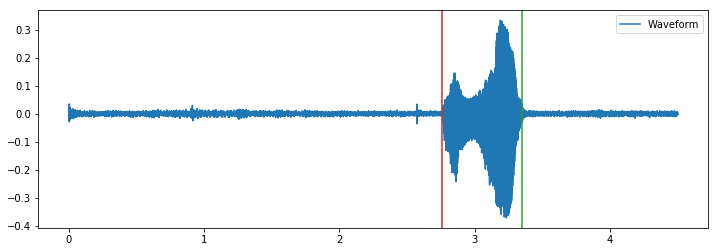

F:/main_total\180712_KKA_C_43_F.wav


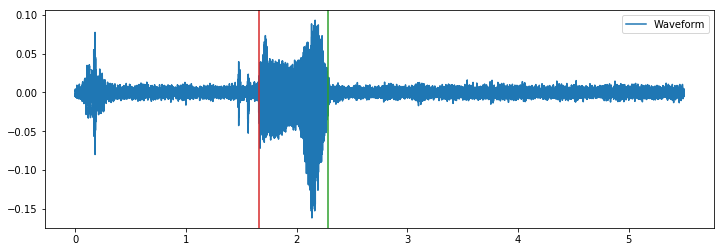

F:/main_total\180712_KKA_C_44_F.wav


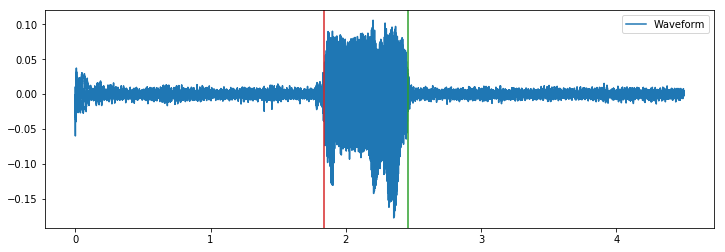

F:/main_total\180712_KKA_C_45_F.wav


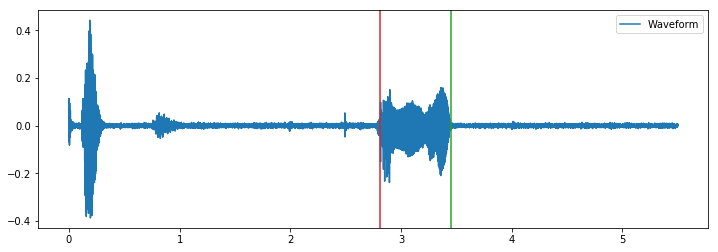

F:/main_total\180712_KKA_C_46_F.wav


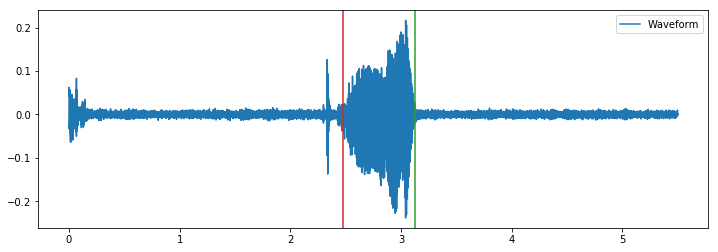

F:/main_total\180712_KKA_C_47_F.wav


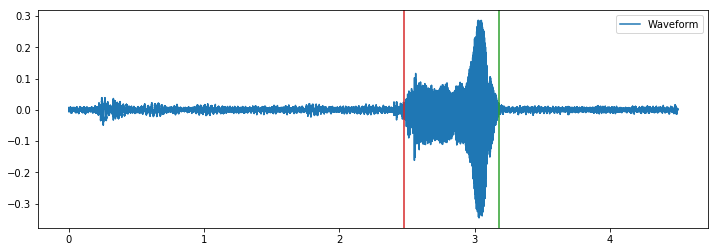

F:/main_total\180712_KKA_C_48_F.wav


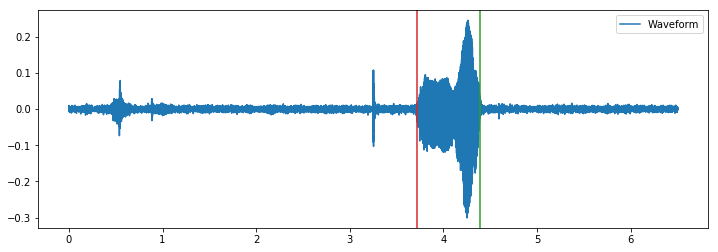

F:/main_total\180712_KKA_C_49_F.wav


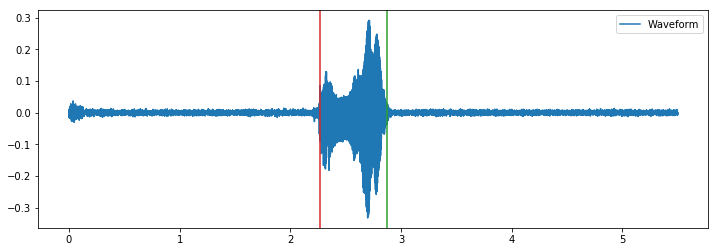

F:/main_total\180712_KKA_C_50_F.wav


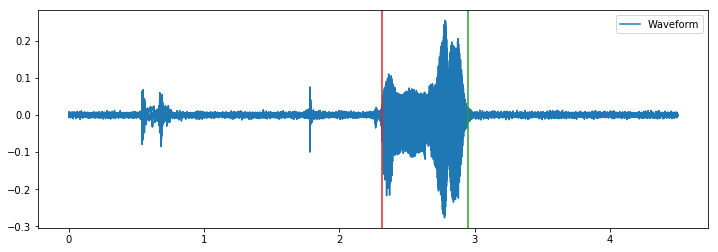

F:/main_total\180712_KKA_C_51_F.wav


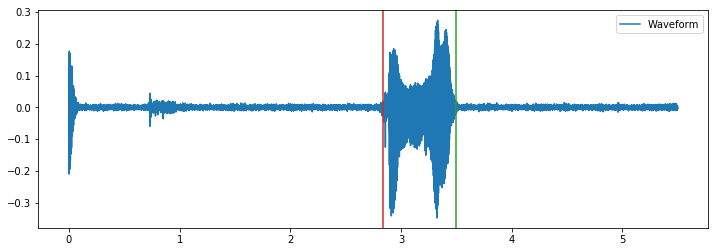

F:/main_total\180712_KKA_C_52_F.wav


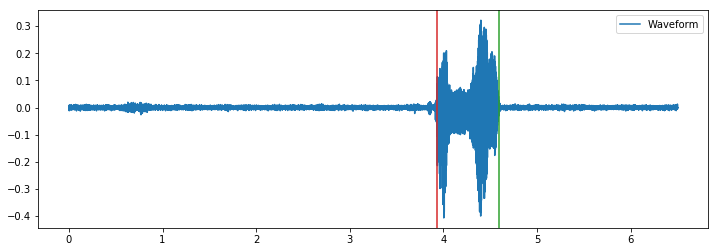

F:/main_total\180712_KKA_C_53_F.wav


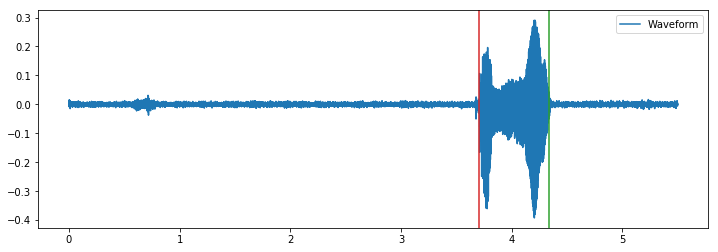

F:/main_total\180712_KKA_C_54_F.wav


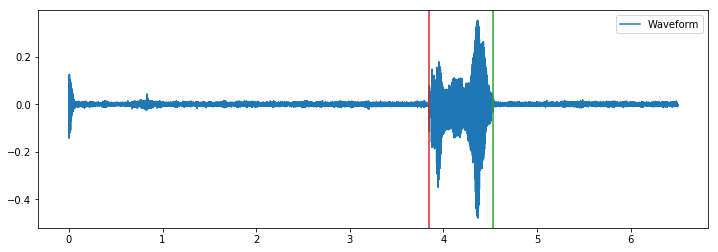

F:/main_total\180712_KKA_C_60_F.wav


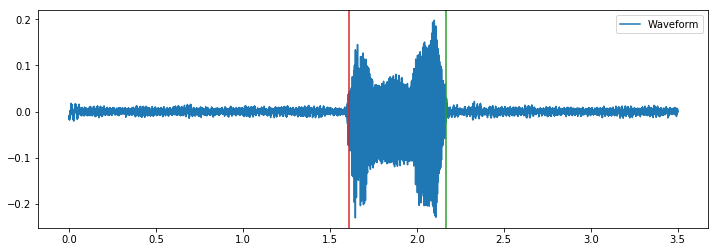

F:/main_total\180712_KKA_C_61_F.wav


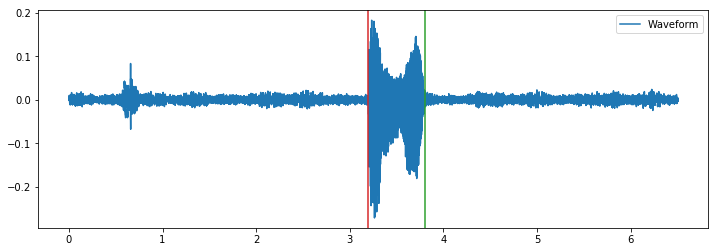

F:/main_total\180712_KKA_C_62_F.wav


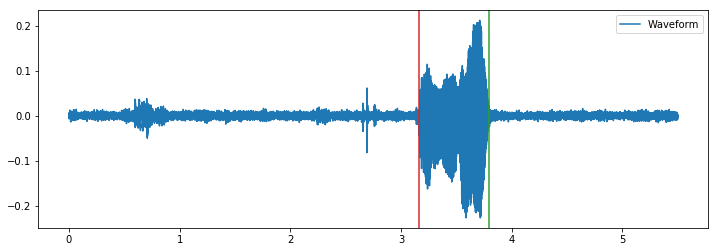

F:/main_total\180712_KKA_C_63_F.wav


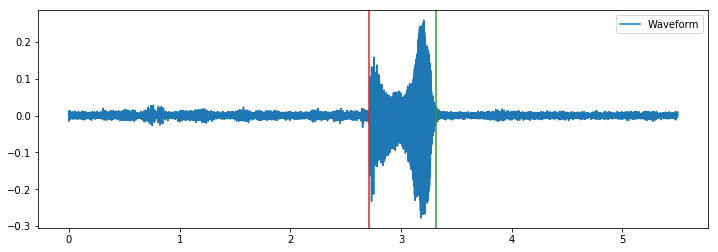

F:/main_total\180712_KKA_C_64_F.wav


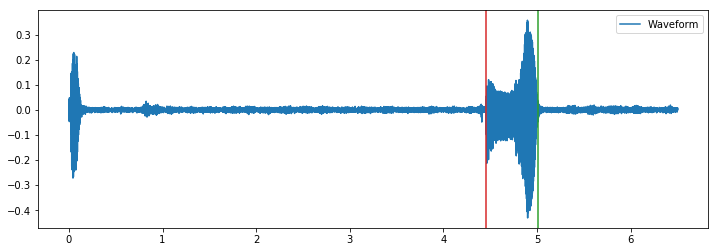

F:/main_total\180712_KKA_C_65_F.wav


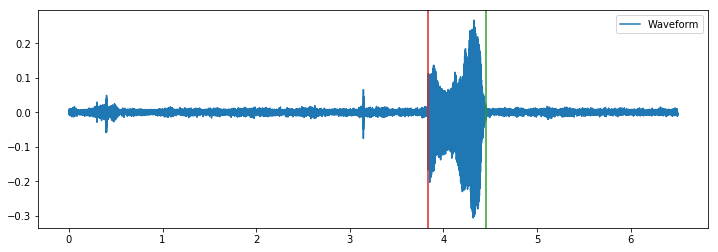

F:/main_total\180712_KKA_C_66_F.wav


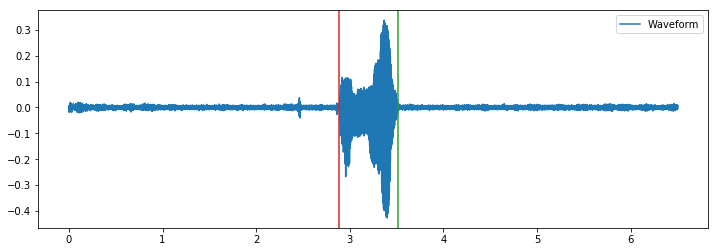

F:/main_total\180712_KKA_C_67_F.wav


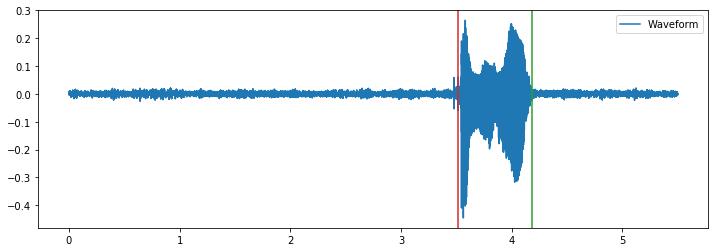

F:/main_total\180712_KKA_C_68_F.wav


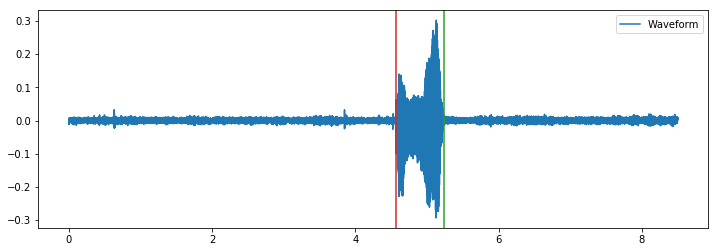

F:/main_total\180712_KKA_C_69_F.wav


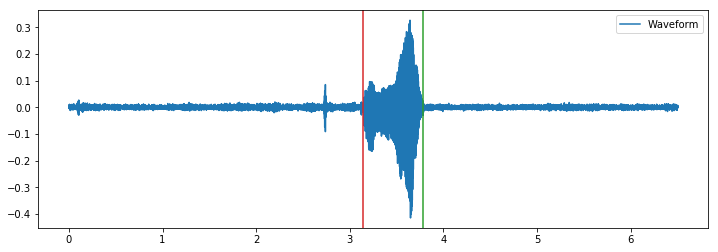

F:/main_total\181109_KSY_C_1_T.wav


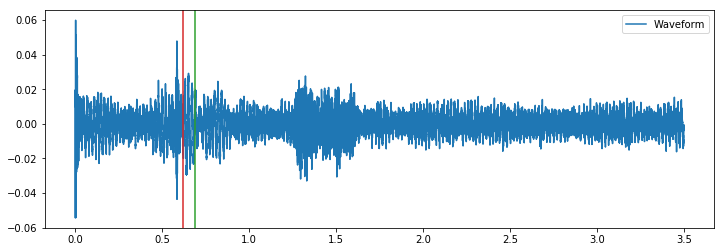

F:/main_total\181109_KSY_C_2_T.wav


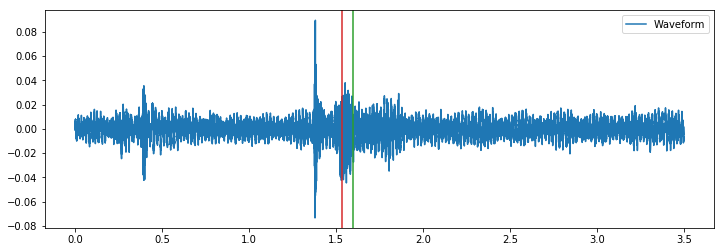

F:/main_total\181109_KSY_C_3_T.wav


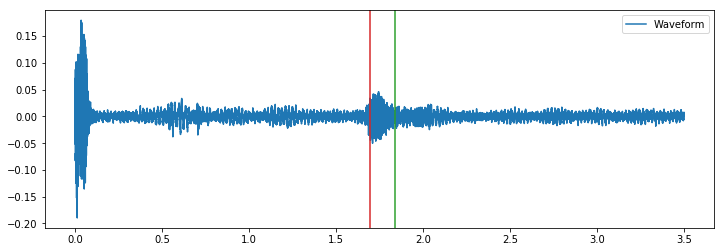

F:/main_total\181109_KSY_C_4_T.wav


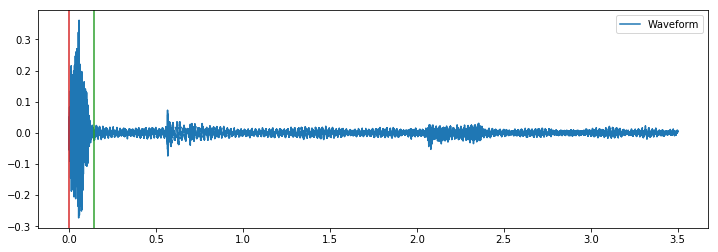

F:/main_total\181109_KSY_C_5_T.wav


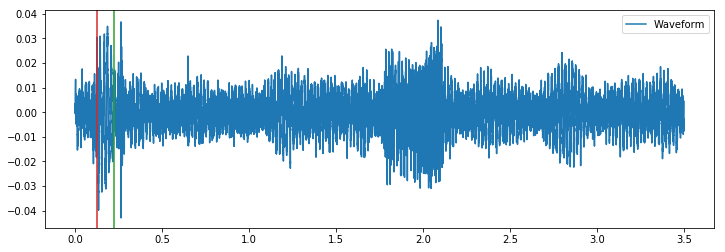

F:/main_total\181109_KSY_C_6_T.wav


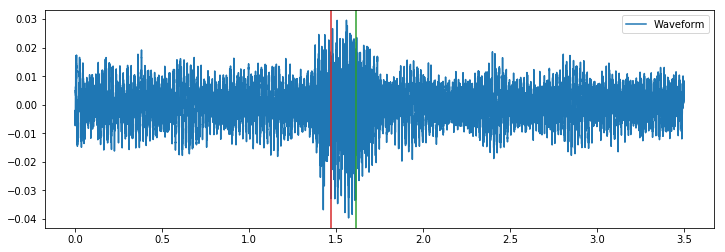

F:/main_total\181109_KSY_C_7_T.wav


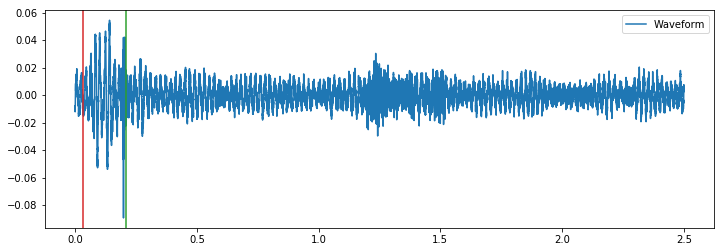

F:/main_total\181109_KSY_C_8_T.wav


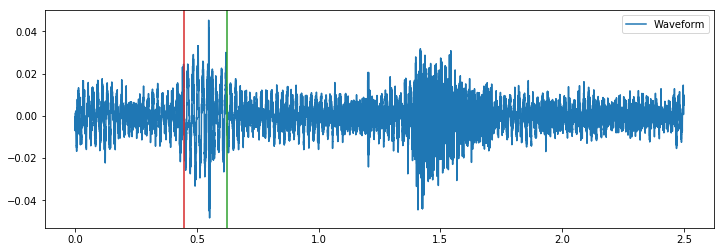

F:/main_total\181109_KSY_C_9_T.wav


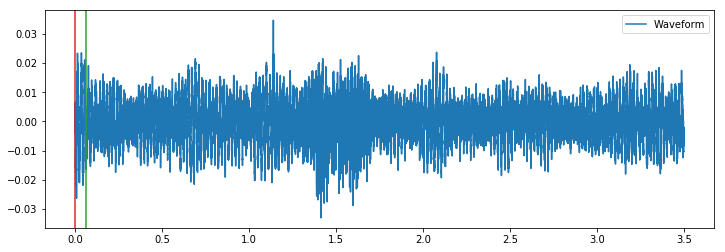

F:/main_total\181109_KSY_C_10_T.wav


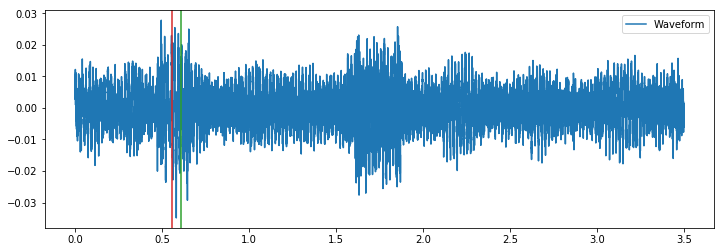

F:/main_total\181109_KSY_C_11_T.wav


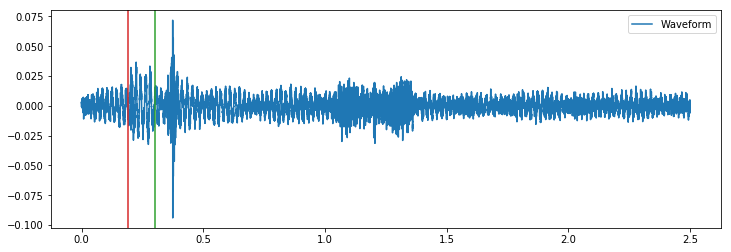

F:/main_total\181109_KSY_C_12_T.wav


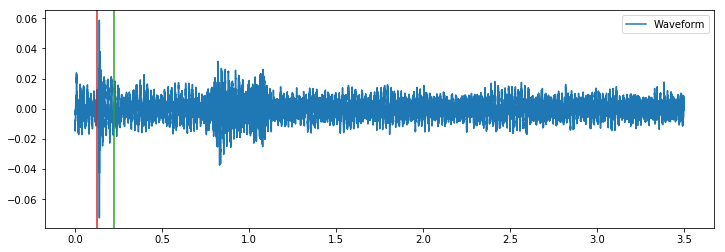

F:/main_total\181109_KSY_C_13_T.wav


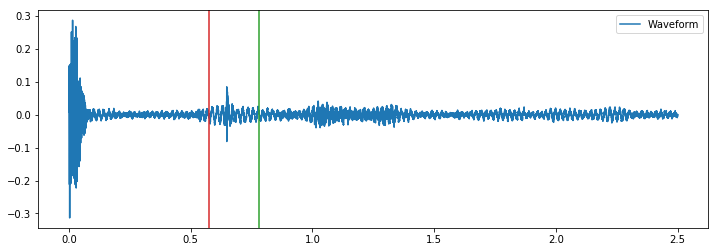

F:/main_total\181109_KSY_C_14_T.wav


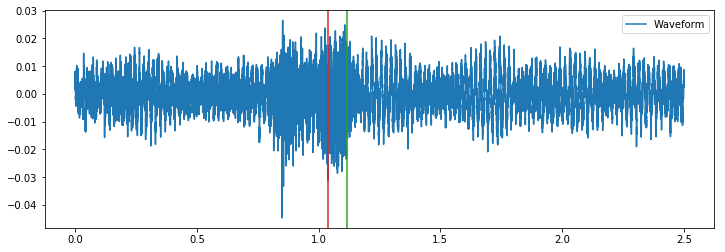

F:/main_total\181109_KSY_C_15_T.wav


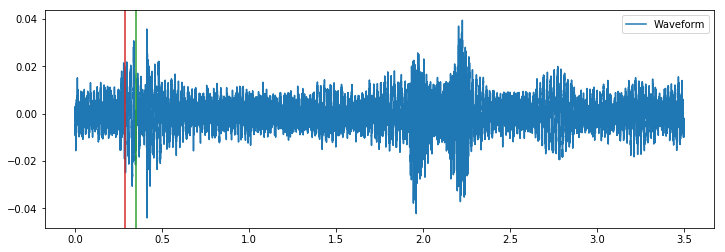

F:/main_total\181109_KSY_C_16_T.wav


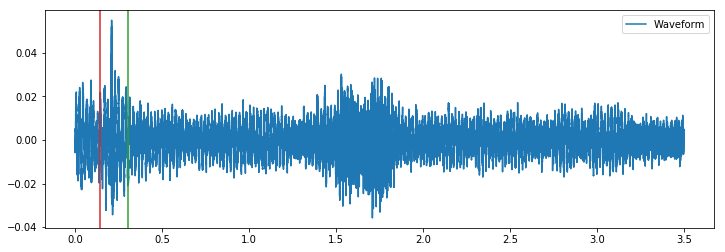

F:/main_total\181109_KSY_C_17_T.wav


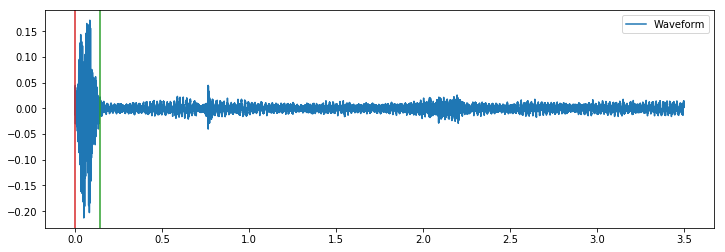

F:/main_total\181109_KSY_C_18_T.wav


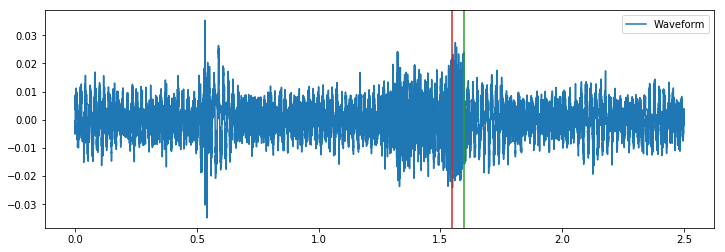

F:/main_total\181109_KSY_C_19_T.wav


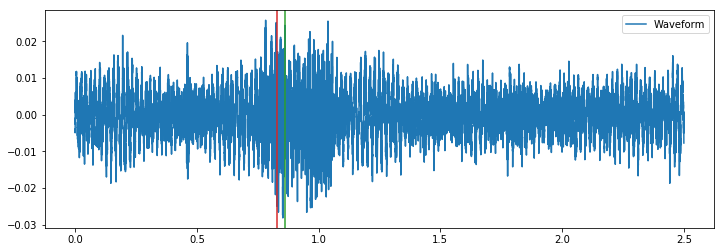

F:/main_total\181109_KSY_C_20_T.wav


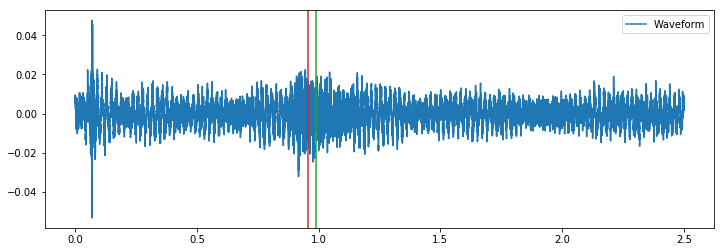

F:/main_total\181109_KSY_C_21_T.wav


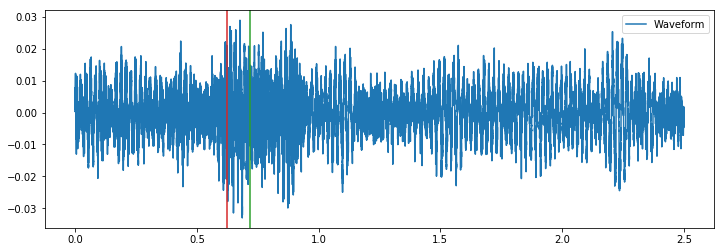

F:/main_total\181109_KSY_C_22_T.wav


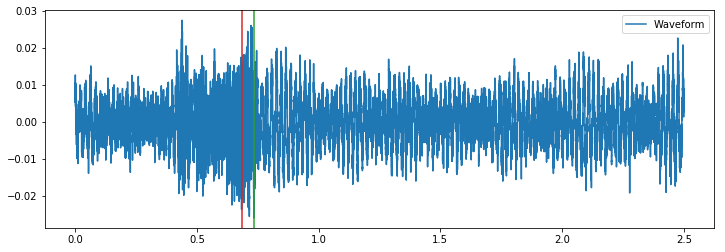

F:/main_total\181109_KSY_C_28_T.wav


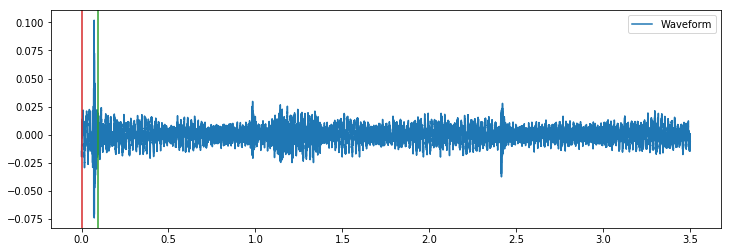

F:/main_total\181109_KSY_C_29_T.wav


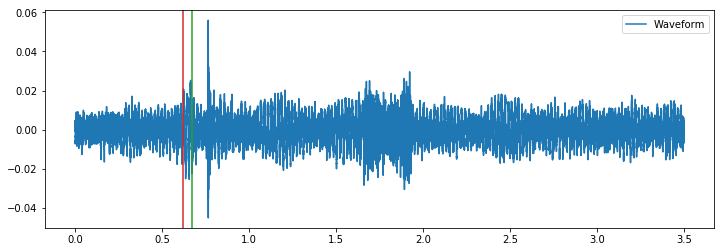

F:/main_total\181109_KSY_C_30_T.wav


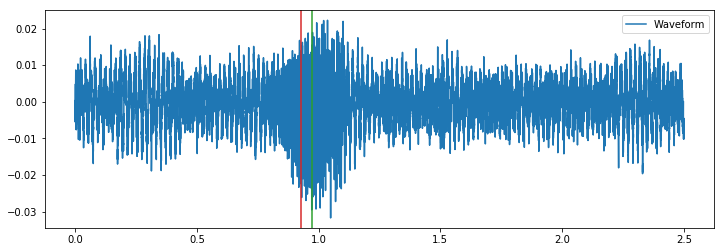

F:/main_total\181109_KSY_C_31_T.wav


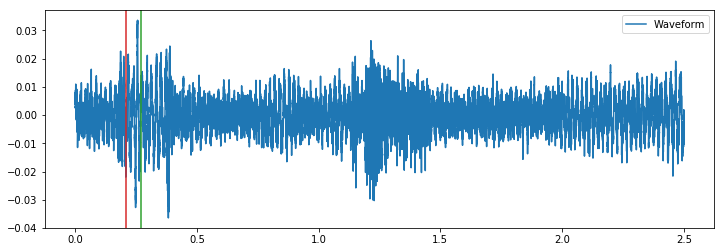

F:/main_total\181109_KSY_C_32_T.wav


IndexError: index 0 is out of bounds for axis 0 with size 0

In [19]:
offset_time=[]
onset_time=[]
start_sample_appended=[]
w=[]
   
c_path = "F:/main_total"

for dirName, subirList, fileList in os.walk(c_path):
    rootpath = os.path.join(os.path.abspath(c_path), dirName)
        
    for file in fileList:
            
        filepath = os.path.join(rootpath, file)
        print(filepath)
        y,sr = lb.load(filepath)
        
        
        _zcr = zcr(y, sr, 32, 16)
        _stpe = stpe(y, sr, 32, 16)
        
        frame_idxs = np.where( (_stpe > 0.01) | (_zcr > 0.35) )[1]
        
        start_t, end_t = getboundaries(frame_idxs)        
            
        #print(start_t)
        #print(end_t)
            
            
        length_tmp=[]
        length=[]
            
        for k in range(0,len(start_t)):
                
            length_tmp = end_t[k]-start_t[k]
            length.append(length_tmp)
        i=length.index(max(length))
        start_t = start_t[i]
        end_t = end_t[i]
            
        # plot
        plt.figure(figsize=(12, 4))
        t = np.linspace(0, len(y)/sr, len(y))
        plt.plot(t, y, label='Waveform')
        plt.axvline(x=start_t, color='#d62728') # red vertical line
        plt.axvline(x=end_t, color='#2ca02c') # green vertical line
        plt.legend(loc='best')
        plt.show()
        
        
        
        start_sample = start_t*22050-2205
        end_sample = end_t*22050+4410
        start_sample = math.floor(start_sample)
        end_sample = math.ceil(end_sample)
        
        y = y[start_sample:end_sample]
        #scipy.io.wavfile.write('wav_voiced_{}'.format(file), rate=sr, data=y[start_sample:end_sample])
            
        #save_path_Close = os.path.join("F:/",str(sub_names[q]),"wav_voiced","Close_ended")
        #save_path_Close = 'F:/main_vad/{}'.format(file[:-9])
                                           

                
        scipy.io.wavfile.write('F:/main_vad/{}'.format(file),sr, y)
        w.append(file)        

In [11]:
file

'612_LGY_D_C_1_T.wav'